In [1]:
import pandas as pd
from datetime import datetime, timedelta
import numpy
from gurobipy import *


In [2]:
import numpy as np
import pandas as pd

In [3]:
lower_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower")
upper_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper")

In [4]:
%matplotlib inline


In [5]:
age_groups = ['age_group_0_9', 'age_group_10_19', 'age_group_20_29','age_group_30_39', 'age_group_40_49', 'age_group_50_59', 'age_group_60_69', 'age_group_70_79', 'age_group_80_plus']
econ_activities = ['transport', 'leisure', 'other']
cont = [ 'S', 'E', 'I', 'R', 'N', 'Ia', 'Ips', \
           'Ims', 'Iss', 'Rq', 'H', 'ICU', 'D' ]

In [6]:
data = pd.read_csv("donnees-hospitalieres-classe-age-covid19-2020-10-28-19h00.csv", sep=";")
data.head()

,reg,cl_age90,jour,hosp,rea,rad,dc
0,1,0,2020-03-18,0,0,0,0
1,1,9,2020-03-18,0,0,0,0
2,1,19,2020-03-18,0,0,0,0
3,1,29,2020-03-18,0,0,0,0
4,1,39,2020-03-18,0,0,0,0


In [7]:
google = pd.read_csv("2020_FR_Region_Mobility_Report.csv")
google = google[google['sub_region_1']=="Île-de-France"]
google = google[pd.isnull(google['sub_region_2'])]

In [8]:
initial_work = ((google["workplaces_percent_change_from_baseline"]+100)/100).values
google_days = [datetime.strptime(google["date"].values[i], '%Y-%m-%d').weekday() for i in range(len(google["date"]))]
new_work = []
for i in range(len(initial_work)):
    if google_days[i]<=4:
        new_work.append(initial_work[i])
    elif google_days[i]==5:
        numbers_for_mean = []
        for k in range(i-5,i):
            if k>=0 and k<len(initial_work):
                numbers_for_mean.append(initial_work[k])
        for k in range(i+2,i+7):
            if k>=0 and k<len(initial_work):
                numbers_for_mean.append(initial_work[k])
        new_work.append(np.mean(numbers_for_mean))
    elif google_days[i]==6:
        numbers_for_mean = []
        for k in range(i-6,i-1):
            if k>=0 and k<len(initial_work):
                numbers_for_mean.append(initial_work[k])
        for k in range(i+1,i+6):
            if k>=0 and k<len(initial_work):
                numbers_for_mean.append(initial_work[k])
        new_work.append(np.mean(numbers_for_mean))


In [9]:
google['work'] = new_work
google['transport'] = (google["transit_stations_percent_change_from_baseline"]+100)/100
google['other'] = 0.33*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100+0.67*(google["grocery_and_pharmacy_percent_change_from_baseline"]+100)/100
google['leisure'] = 0.33*(google["parks_percent_change_from_baseline"]+100)/100+0.67*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100
google = google.reset_index()
google.to_csv('smoothed.csv')



In [10]:
# Extract days 
data = data[data['jour']<='2020-10-21']
days = data[data['reg']==11][data['cl_age90']==0].jour.values
days

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


array(['2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21',
       '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25',
       '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29',
       '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02',
       '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06',
       '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10',
       '2020-04-11', '2020-04-12', '2020-04-13', '2020-04-14',
       '2020-04-15', '2020-04-16', '2020-04-17', '2020-04-18',
       '2020-04-19', '2020-04-20', '2020-04-21', '2020-04-22',
       '2020-04-23', '2020-04-24', '2020-04-25', '2020-04-26',
       '2020-04-27', '2020-04-28', '2020-04-29', '2020-05-01',
       '2020-05-02', '2020-05-03', '2020-05-04', '2020-05-05',
       '2020-05-06', '2020-05-07', '2020-05-08', '2020-05-09',
       '2020-05-10', '2020-05-11', '2020-05-12', '2020-05-13',
       '2020-05-14', '2020-05-15', '2020-05-16', '2020-05-17',
       '2020-05-18', '2020-05-19', '2020-05-20', '2020-

In [11]:
beds_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].hosp.values for i in range(0,9)
}
beds_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].hosp.values
beds_real['total']=data[data['reg']==11][data['cl_age90']==0].hosp.values

icus_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].rea.values for i in range(0,9)
}
icus_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].rea.values
icus_real['total']=data[data['reg']==11][data['cl_age90']==0].rea.values

deaths_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].dc.values for i in range(0,9)
}
deaths_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].dc.values
deaths_real['total']=data[data['reg']==11][data['cl_age90']==0].dc.values


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/sergioacamelogomez/opt/anaconda3/lib/pyth

In [12]:
mult_deaths = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].dc.values)
print(mult_deaths)
mult_icus = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].rea.values)
print(mult_icus)


0.7791072263244828
7.194862933913178


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [13]:
import yaml
from inspect import getsourcefile
import os.path
import sys
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import argparse
current_path = os.path.abspath(getsourcefile(lambda:0))
current_dir = os.path.dirname(current_path)
parentdir = os.path.dirname(current_dir)
sys.path.insert(0,parentdir) 
sys.path.insert(0, parentdir+"/heuristics")
sys.path.insert(0, parentdir+"/heuristics/LP-Models")
sys.path.insert(0, parentdir+"/fast_gradient")


from fast_group import FastDynamicalModel
from aux import *


{'groups': 'all', 'params_to_try': {'delta_schooling': [0.5, 1, 5], 'xi': [0, 371990.3, 929975.75, 1859951.5, 3719903, 5579854.5], 'icus': [2000, 2300, 2600, 2900, 3200], 'tests': [[0, 0], [30000, 30000], [60000, 60000], [120000, 120000]], 'testing': ['homogeneous'], 'eta': [0, 0.1, 0.2]}}
{'groups': 'all', 'params_to_try': {'delta_schooling': [0.5, 1, 5], 'xi': [0, 371990.3, 929975.75, 1859951.5, 3719903, 5579854.5], 'icus': [2000, 2300, 2600, 2900, 3200], 'tests': [[0, 0], [30000, 30000], [60000, 60000], [120000, 120000]], 'testing': ['homogeneous'], 'eta': [0, 0.1, 0.2]}}


In [14]:
region = "Ile-de-France"

In [15]:
# Read group parameters
with open("../parameters/"+region+".yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)
    
# Read initialization
with open("../initialization/patient_zero.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    original_initialization = yaml.load(file, Loader=yaml.FullLoader)

# Read econ parameters
with open("../parameters/econ.yaml") as file:
    econ_params = yaml.load(file, Loader=yaml.FullLoader)

experiment_params = {
    'delta_schooling':0.5,
    'xi':0,
    'icus':3000,
}

In [16]:
date_1 = datetime.strptime("2020-03-17", '%Y-%m-%d')
date_2 = datetime.strptime("2020-05-11", '%Y-%m-%d')
date_3 = datetime.strptime("2020-06-01", '%Y-%m-%d')
date_4 = datetime.strptime("2020-07-01", '%Y-%m-%d')
date_5 = datetime.strptime("2020-09-01", '%Y-%m-%d')
final_date = datetime.strptime("2020-10-21", '%Y-%m-%d')

vacation_start = date_4
vacation_end = date_5
days_vacation_start = (vacation_start - date_1).days
days_vacation_end = (vacation_end - date_1).days

first_day_google = datetime.strptime("2020-02-15", '%Y-%m-%d')
days_between_google = (date_1-first_day_google).days

In [17]:
(final_date-date_1).days+140

358

In [18]:
from copy import deepcopy

In [19]:
original_beta = universe_params['seir-groups']["age_group_0_9"]["parameters"]["beta"]
original_beta_vacation = original_beta
#original_beta_vacation = universe_params['seir-groups']["age_group_0_9"]["parameters"]["beta_vacation"]
t_days_beta = 730

for ag in universe_params['seir-groups']:
    universe_params['seir-groups'][ag]["parameters"]["beta"] = (
        [(original_beta if (t<days_vacation_start or t>= days_vacation_end) else original_beta_vacation) for t in range(t_days_beta) ]
    )


In [20]:
# Create model
mixing_method = {}
dynModel = FastDynamicalModel(universe_params, econ_params, experiment_params, 1, mixing_method, 1e9, 0, 0)


In [21]:
params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params", index_col = 0)
initial_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower", index_col = 0)
lower_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper", index_col = 0)
upper_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

In [22]:
# Construct the windows for the parameters to move
windows = {}
for p in initial_params:
    windows[p] = (
        np.min(upper_params[p]/initial_params[p]),
        np.max(lower_params[p]/initial_params[p]),
    )
    
windows['beta_mixing'] = (0.1,2.0)
windows['alpha_mixing'] = (0.1,2.0)
windows['gamma_mixing'] = (0.5,2.0)
windows['work_l'] = (0.2,0.3)
windows['other_l'] = (0,0.1)
windows['school_l'] = (0,0.1)
windows['leisure_l'] = (0,0.1)
windows['transport_l'] = (0.2,0.3)
windows['transmission'] = (0.5,2.0)

In [38]:
# Generate samples
np.random.seed(0)
n = 10
print(np.random.rand(10,4))

[0.5488135  0.71518937 0.60276338 0.54488318]
[0.4236548  0.64589411 0.43758721 0.891773  ]


In [31]:
import copy
import math
import matplotlib.dates as mdates
best_v = 0
best_error = float('inf')
validation_date = datetime.strptime("2020-10-21", '%Y-%m-%d')

def error(v):

    days_ahead = v[0]
    alpha_mixing_home = v[1]
    alpha_mixing_work = v[1]
    alpha_mixing_transport = v[1]
    alpha_mixing_school = v[1]
    alpha_mixing_other = v[1]
    alpha_mixing_leisure = v[1]
    
    mix_1 = v[3]
    mix_2 = v[4]
    
    alphas_d = {
        'work':alpha_mixing_work,
        'transport':alpha_mixing_transport,
        'school':alpha_mixing_school,
        'other':alpha_mixing_other,
        'leisure':alpha_mixing_leisure,
        'home':alpha_mixing_home,
    }

    gamma_mixing_before = 1.0
    gamma_mixing_after = 1.0
    

    upper_bound_home = 1.0
    upper_bound_leisure = 1.0
    upper_bound_other = 1.0
    upper_bound_school = 1.0
    upper_bound_work = 1.0
    upper_bound_transport = 1.0
    
    school_lockdown = v[5]
    school_may = v[6]
    school_jun_jul_aug = v[7]
    school_sep_oct = v[8]

    beta_normal = original_beta
    beta_vacation = beta_normal*v[2]
    
    days_change_model = 0
    
    
    google['other'] = mix_1*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100+(1-mix_1)*(google["grocery_and_pharmacy_percent_change_from_baseline"]+100)/100
    google['leisure'] = mix_2*(google["parks_percent_change_from_baseline"]+100)/100+(1-mix_2)*(google["retail_and_recreation_percent_change_from_baseline"]+100)/100

    
    # Number of days
    days_before_date_1 = int(days_ahead)
    days_between_dates_1_2 = (date_2-date_1).days
    days_between_dates_2_3 = (date_3-date_2).days
    days_between_dates_3_4 = (date_4-date_3).days
    days_between_dates_4_5 = (date_5-date_4).days
    days_after_date_5 = (final_date-date_5).days
    total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_after_date_5
    days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5
    
    
    # Some additional calculations
    validation_days = days_before_date_1 + (validation_date-date_1).days
    vacation_start_days = days_before_date_1 + (vacation_start-date_1).days
    vacation_end_days = days_before_date_1 + (vacation_end-date_1).days
    
    
    # Construct initialization
    initialization = copy.deepcopy(original_initialization)
    for i,group in enumerate(age_groups):
        if group == "age_group_40_49":
            initialization[group]["I"] = initialization[group]["I"] + 1
            initialization[group]["S"] = initialization[group]["S"] - 1
        initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


    # Alphas
    a_before_google = {
        'home':upper_bound_home,
        'leisure':upper_bound_leisure,
        'other':upper_bound_other,
        'school':upper_bound_school,
        'transport':upper_bound_transport,
        'work':upper_bound_work
    }
    


    # Determine mixing method
    #     mixing_method_before = {
    #         "name":"mult",
    #         "param_alpha":alpha_mixing_before,
    #         "param_beta":alpha_mixing_before,
    #     }

    #     # Determine mixing method
    #     mixing_method_after = {
    #         "name":"mult",
    #         "param_alpha":alpha_mixing_after,
    #         "param_beta":alpha_mixing_after,
    #     }
    #dynModel.mixing_method = mixing_method_after




    # Calculate alphas
    alphas_vec = []
    for t in range(days_before_date_1-days_between_google):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_before_google
        alphas_vec.append(alphas)

    counter = 0
    for t in range(days_between_google):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = {
                'home':1.0,
                'leisure':google['leisure'][counter],
                'other':google['other'][counter],
                'school':1.0,
                'transport':google['transport'][counter],
                'work':google['work'][counter]
            }
        alphas_vec.append(alphas)   
        counter += 1
    for t in range(days_between_dates_1_2):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = {
                'home':1.0,
                'leisure':google['leisure'][counter],
                'other':google['other'][counter],
                'school':school_lockdown,
                'transport':google['transport'][counter],
                'work':google['work'][counter]
            }
        alphas_vec.append(alphas)   
        counter += 1
    for t in range(days_between_dates_2_3):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = {
                'home':1.0,
                'leisure':google['leisure'][counter],
                'other':google['other'][counter],
                'school':school_may,
                'transport':google['transport'][counter],
                'work':google['work'][counter]
            }
        alphas_vec.append(alphas)   
        counter += 1
    for t in range(days_between_dates_3_4):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = {
                'home':1.0,
                'leisure':google['leisure'][counter],
                'other':google['other'][counter],
                'school':school_may,
                'transport':google['transport'][counter],
                'work':google['work'][counter]
            }
        alphas_vec.append(alphas)   
        counter += 1
    for t in range(days_between_dates_4_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = {
                'home':1.0,
                'leisure':google['leisure'][counter],
                'other':google['other'][counter],
                'school':school_jun_jul_aug,
                'transport':google['transport'][counter],
                'work':google['work'][counter]
            }
        alphas_vec.append(alphas)   
        counter += 1
    for t in range(days_after_date_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = {
                'home':1.0,
                'leisure':google['leisure'][counter],
                'other':google['other'][counter],
                'school':school_sep_oct,
                'transport':google['transport'][counter],
                'work':google['work'][counter]
            }
        alphas_vec.append(alphas)   
        counter += 1
        
        


    #     mixing_vec = []
    #     for t in range(int(vacation_start_days+days_change_model)):
    #         mixing_vec.append(mixing_method_before)
    #     for t in range(int(vacation_start_days+days_change_model),total_days):
    #         mixing_vec.append(mixing_method_after)

        
        
        
    # Calculate tests
    tests = np.zeros(len(age_groups))


    # Run model
    model_data_beds = {ag:[] for ag in age_groups+["total"]}
    model_data_icus = {ag:[] for ag in age_groups+["total"]}
    model_data_deaths = {ag:[] for ag in age_groups+["total"]}

    state = state_to_matrix(initialization)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)

    recalc_days = [0,
                 days_before_date_1,
                 days_before_date_1+days_between_dates_1_2,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                int(vacation_start_days)
                ]

    dynModel.beta = np.zeros((len(age_groups),len(dynModel.groups[age_groups[0]].parameters["beta"])))
    for i in range(len(age_groups)):
        for j in range(len(dynModel.groups[age_groups[0]].parameters["beta"])):
            if j < int(vacation_start_days+days_change_model):
                dynModel.beta[i,j] = beta_normal
            else:
                dynModel.beta[i,j] = beta_vacation
    
    for t in range(total_days):
        current_date = date_1+timedelta(days=t-days_before_date_1)
        day_of_week = current_date.weekday()
        
        if t in recalc_days:
            update_contacts = True
        else:
            update_contacts = False
            
        if day_of_week <= 4:
            season = "old"
            dynModel.mixing_method = {
                "name":"mult",
                "param_alpha":{
                    'work':alpha_mixing_work,
                    'transport':alpha_mixing_transport,
                    'school':alpha_mixing_school,
                    'other':alpha_mixing_other,
                    'leisure':alpha_mixing_leisure,
                    'home':alpha_mixing_home,
                },
                "param_beta":{
                    'work':alpha_mixing_work,
                    'transport':alpha_mixing_transport,
                    'school':alpha_mixing_school,
                    'other':alpha_mixing_other,
                    'leisure':alpha_mixing_leisure,
                    'home':alpha_mixing_home,
                },
            }
        else:
            season = "old"
            dynModel.mixing_method = {
                "name":"mult",
                "param_alpha":{
                    'work':alpha_mixing_work,
                    'transport':alpha_mixing_transport,
                    'school':alpha_mixing_school,
                    'other':alpha_mixing_other,
                    'leisure':alpha_mixing_leisure,
                    'home':alpha_mixing_home,
                },
                "param_beta":{
                    'work':alpha_mixing_work,
                    'transport':alpha_mixing_transport,
                    'school':alpha_mixing_school,
                    'other':alpha_mixing_other,
                    'leisure':alpha_mixing_leisure,
                    'home':alpha_mixing_home,
                },
            }

        #dynModel.mixing_method = mixing_vec[t]

        state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), t, season, update_contacts=update_contacts)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
        #print(t_beds)
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)


    initial_date = date_1-timedelta(days=days_before_date_1)

    # Calculate the days of the model
    days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

    # Indices where to put the real data
    indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

    # Real data
    real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

    for k,ind in enumerate(indices):
        for ag in age_groups+["total"]:
            real_data_beds[ag][ind] = beds_real[ag][k]
            real_data_icus[ag][ind] = icus_real[ag][k]
            real_data_deaths[ag][ind] = deaths_real[ag][k]


    error_constant = 1.0
    error_beds = 0
    error_icus = 0
    error_deaths = 0
    error_beds_total = 0
    for ag in age_groups:
        error_beds += np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))[0:validation_days-1])
        error_beds += error_constant*np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))[validation_days-1:validation_days])
        #error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
        #error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
    error_beds_total += np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))[0:validation_days-1])
    error_beds_total += error_constant*np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))[validation_days-1:validation_days])
    #error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
    #error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))


    
    
    #diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
    #error_beds_above = np.nanmean([max(d,0) for d in diff])
    #error_beds_below = -np.nanmean([min(d,0) for d in diff])

    #cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
    #cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
    #diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
    #error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
    #error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



    #     error = error_beds_total
    #     error = mult_icus*error_icus_total
    #     error = mult_deaths*error_deaths_total
    upper_model_data = model_data_beds["total"]
    upper_days_model = days_model
    upper_real_data = real_data_beds["total"]
    error = error_beds+5*error_beds_total




    
    
    global best_error
    global best_v
    if error<best_error:
        best_error = error
        print(best_error)
        print("error_groups",error_beds)
        print("error_total",error_beds_total)
        print("mix_other:",mix_1,"mix_leisure:",mix_2)
        print(alphas_d)
        best_v = v
        print(v)
        
        plt.figure(1)
        plt.plot(upper_days_model, upper_model_data, label="Prediction")
        plt.plot(upper_days_model, upper_real_data, label="Real")
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%m"))
        plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter("%m"))
        plt.legend(loc='upper right')
        plt.show()
        #print(a_before_date_1)
        #print(a_between_date_1_2)
        #print(a_between_date_2_3)
        #print(a_between_date_3_4)
        #print(a_between_date_4_5)
        #print(a_after_date_5)
        

    return error





In [32]:
%matplotlib inline

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/_differentialevolution.py:494: UserWarning: differential_evolution: the 'workers' keyword has overridden updating='immediate' to updating='deferred'
  " updating='deferred'", UserWarning)


107175.18570711602
error_groups 17863.331351891884
error_total 17862.370871044826
mix_other: 0.3263184403687169 mix_leisure: 0.5831494438207363
{'work': 1.0024160046823902, 'transport': 1.0024160046823902, 'school': 1.0024160046823902, 'other': 1.0024160046823902, 'leisure': 1.0024160046823902, 'home': 1.0024160046823902}
[51.31085891  1.002416    0.99394517  0.32631844  0.58314944  0.08852649
  0.28637163  0.0934909   0.59271703]
86787.45345248161
error_groups 14511.924133878876
error_total 14455.105863720548
mix_other: 0.10036102018583742 mix_leisure: 0.7814926017449801
{'work': 1.4323867307815947, 'transport': 1.4323867307815947, 'school': 1.4323867307815947, 'other': 1.4323867307815947, 'leisure': 1.4323867307815947, 'home': 1.4323867307815947}
[6.35567148e+01 1.43238673e+00 5.71592598e-01 1.00361020e-01
 7.81492602e-01 9.44467570e-02 7.89584037e-01 2.79390640e-02
 8.76405953e-01]
90779.43314826691
110435.21443630887
52271.85604319397
214383.43103706103
error_groups 15589.930402582

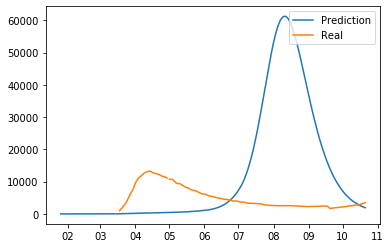

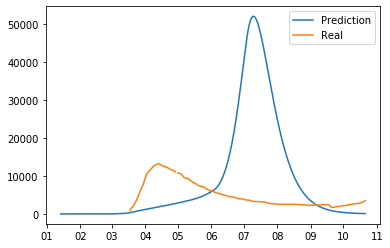

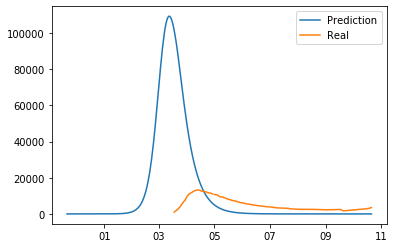

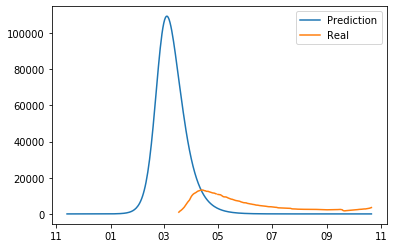

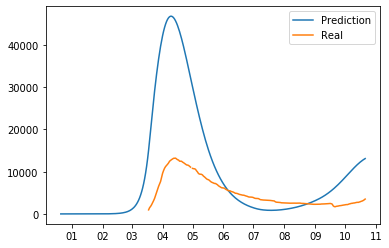

...

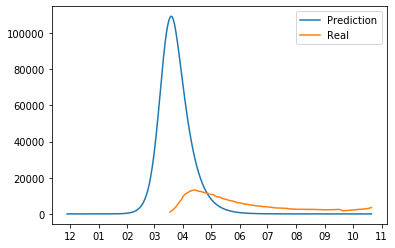

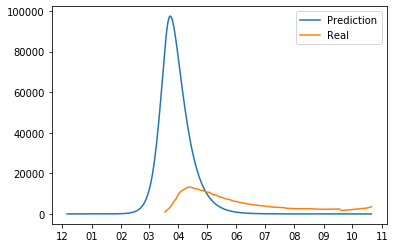

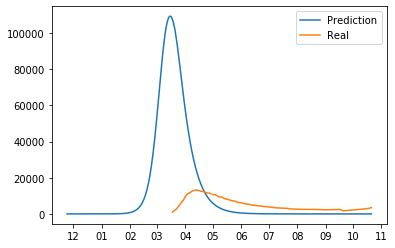

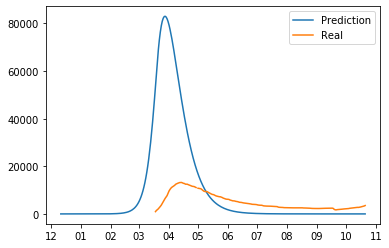

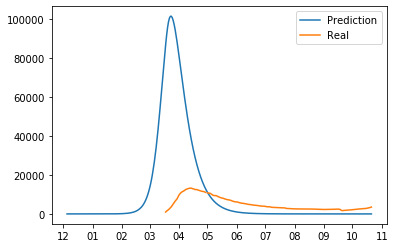

65124.84336636422
error_groups 10880.166750733628
error_total 10848.93532312612
mix_other: 0.051787350266252086 mix_leisure: 0.8813500840423734
{'work': 1.2673018241962557, 'transport': 1.2673018241962557, 'school': 1.2673018241962557, 'other': 1.2673018241962557, 'leisure': 1.2673018241962557, 'home': 1.2673018241962557}
[7.93053506e+01 1.26730182e+00 9.61218898e-01 5.17873503e-02
 8.81350084e-01 2.05682442e-03 9.59229577e-01 1.39467536e-01
 7.47627320e-01]
53789.42456049736
error_groups 8997.443239443593
error_total 8958.396264210754
mix_other: 0.5935910817719044 mix_leisure: 0.03592526918488764
104100.0349860119
{'work': 1.66873749194021, 'transport': 1.66873749194021, 'school': 1.66873749194021, 'other': 1.66873749194021, 'leisure': 1.66873749194021, 'home': 1.66873749194021}
92350.25825241249
error_groups 17356.140864745204
[1.34895782e+02 1.66873749e+00 1.29318531e+00 5.93591082e-01
 3.59252692e-02 9.74628655e-02 7.04868149e-01 4.78555074e-03
 5.83392569e-01]error_groups 15381.14

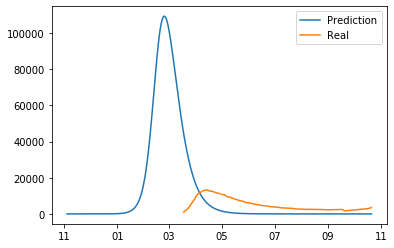

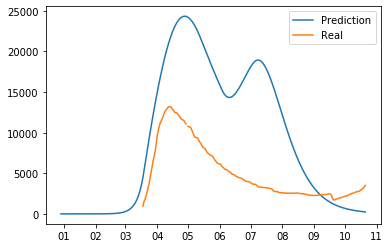

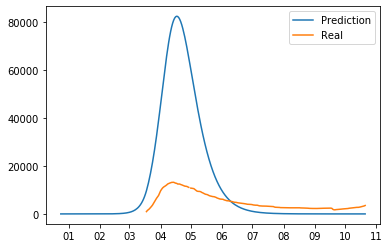

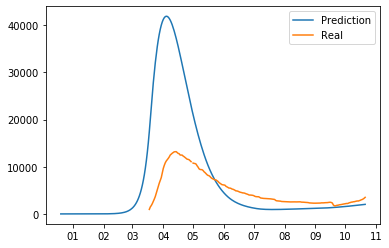

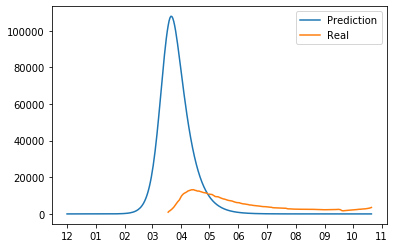

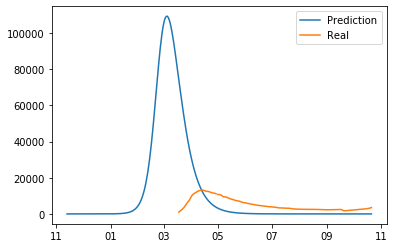

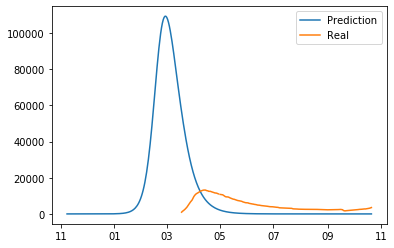

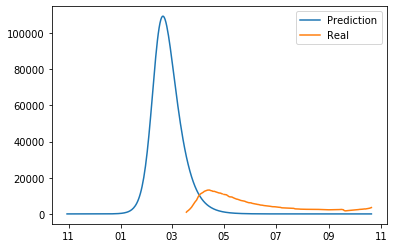

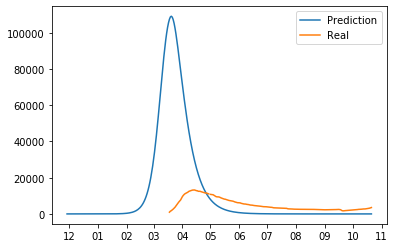

54441.896040452004
error_groups 9107.559368843531
error_total 9066.867334321694
mix_other: 0.8340770317526102 mix_leisure: 0.773341707176485
{'work': 1.7481420720128118, 'transport': 1.7481420720128118, 'school': 1.7481420720128118, 'other': 1.7481420720128118, 'leisure': 1.7481420720128118, 'home': 1.7481420720128118}
[1.33398919e+02 1.74814207e+00 1.61534180e+00 8.34077032e-01
 7.73341707e-01 7.47210446e-02 9.88916636e-01 1.65249126e-01
 7.69985138e-01]84977.15744031084

error_groups 14157.123851214765
error_total 14164.006717819215
mix_other: 0.11325404454944649 mix_leisure: 0.178656081386654
{'work': 0.24720307917235107, 'transport': 0.24720307917235107, 'school': 0.24720307917235107, 'other': 0.24720307917235107, 'leisure': 0.24720307917235107, 'home': 0.24720307917235107}
[1.13397136e+02 2.47203079e-01 1.64820747e+00 1.13254045e-01
 1.78656081e-01 5.88198504e-02 9.78689537e-01 1.27178131e-01
 6.06118470e-01]
55949.567198091885
error_groups 9358.184281849286
error_total 9318.27658

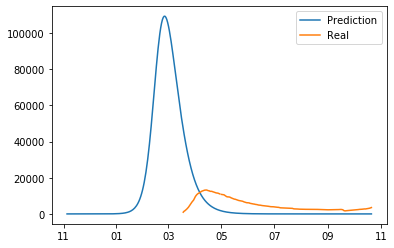

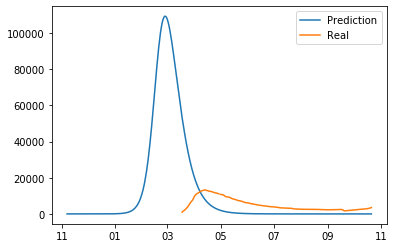

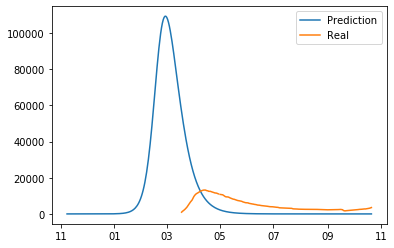

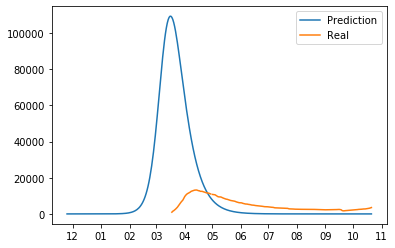

53160.76382551054
error_groups 8893.52278075599
error_total 8853.448208950911
mix_other: 0.03682241978525358 mix_leisure: 0.3199604036222548
{'work': 0.6548372266410825, 'transport': 0.6548372266410825, 'school': 0.6548372266410825, 'other': 0.6548372266410825, 'leisure': 0.6548372266410825, 'home': 0.6548372266410825}
[1.35903001e+02 6.54837227e-01 1.89007217e+00 3.68224198e-02
 3.19960404e-01 3.00738886e-02 2.34856562e-01 1.41413233e-01
 7.26429323e-01]
71954.30971943063
error_groups 12003.065991918955
error_total 11990.248745502337
52673.53904160848
mix_other: 0.05585462775521077 mix_leisure: 0.5368848673172985
error_groups 8808.862858541208
{'work': 1.149397792048745, 'transport': 1.149397792048745, 'school': 1.149397792048745, 'other': 1.149397792048745, 'leisure': 1.149397792048745, 'home': 1.149397792048745}
error_total 8772.935236613454
[1.19938284e+02 1.14939779e+00 9.47773751e-01 5.58546278e-02
 5.36884867e-01 8.77344132e-02 7.49055946e-01 7.20221479e-02
 8.96401745e-01]mix_o

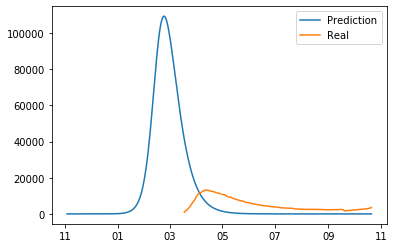

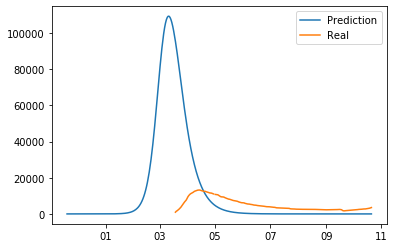

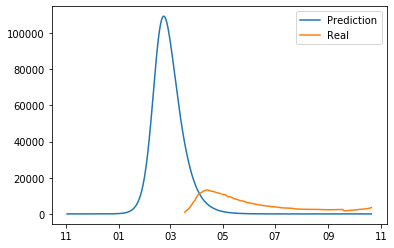

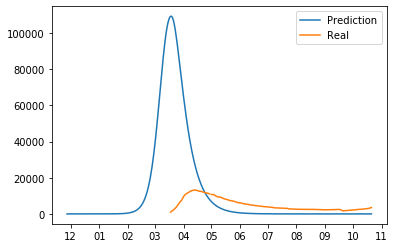

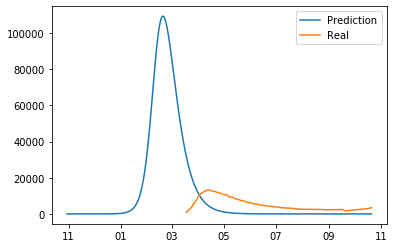

67419.74170473122
error_groups 11367.027564316066
error_total 11210.542828083031
mix_other: 0.610001379229548 mix_leisure: 0.35773612720920633
{'work': 0.4849436448134573, 'transport': 0.4849436448134573, 'school': 0.4849436448134573, 'other': 0.4849436448134573, 'leisure': 0.4849436448134573, 'home': 0.4849436448134573}
[7.56029910e+01 4.84943645e-01 9.32272995e-01 6.10001379e-01
 3.57736127e-01 3.93846025e-03 1.77886067e-01 3.45059611e-02
 6.79589170e-01]


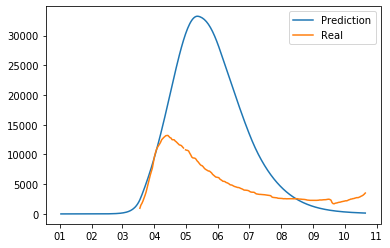

66949.41685329014
error_groups 11181.44409109332
error_total 11153.594552439363
mix_other: 0.7577770664904456 mix_leisure: 0.6595152514327054
{'work': 0.18927327248737535, 'transport': 0.18927327248737535, 'school': 0.18927327248737535, 'other': 0.18927327248737535, 'leisure': 0.18927327248737535, 'home': 0.18927327248737535}
[1.22062294e+02 1.89273272e-01 1.04352414e+00 7.57777066e-01
 6.59515251e-01 8.51488269e-02 8.00791583e-01 1.02142938e-01
 6.94447043e-01]
90549.08744602576
error_groups 15278.028664685708
error_total 15054.211756268009
mix_other: 0.3481761582650991 mix_leisure: 0.2643884591959727
{'work': 1.356333998007076, 'transport': 1.356333998007076, 'school': 1.356333998007076, 'other': 1.356333998007076, 'leisure': 1.356333998007076, 'home': 1.356333998007076}
[7.26754013e+01 1.35633400e+00 1.35597667e+00 3.48176158e-01
 2.64388459e-01 9.21410985e-03 8.19470457e-01 9.00644473e-02
 5.72430922e-01]
37666.67528469733
error_groups 6406.14772042109
error_total 6252.105512855249

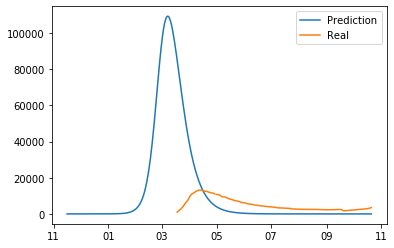

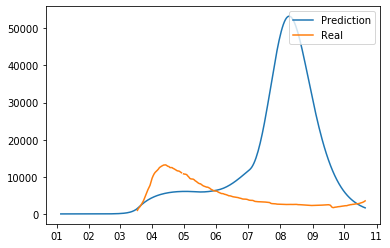

68798.87560239356
error_groups 11602.998945258627
error_total 11439.175331426984
mix_other: 0.9056074781312455 mix_leisure: 0.9942793654697337
{'work': 0.5185907393088612, 'transport': 0.5185907393088612, 'school': 0.5185907393088612, 'other': 0.5185907393088612, 'leisure': 0.5185907393088612, 'home': 0.5185907393088612}
[7.36991592e+01 5.18590739e-01 6.77961619e-01 9.05607478e-01
 9.94279365e-01 6.25662351e-02 4.25245780e-03 1.61714851e-01
 5.77614098e-01]


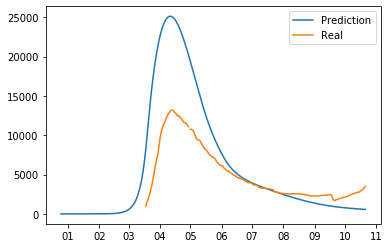

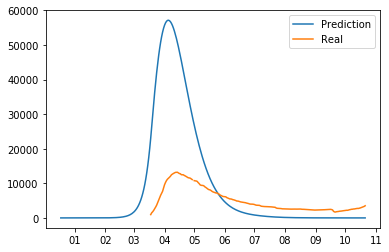

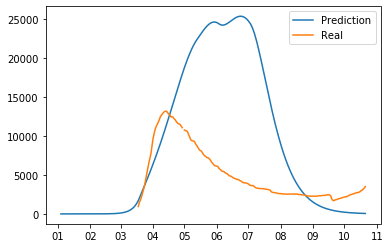

83542.89560851209
error_groups 13930.908748495514
error_total 13922.397372003315
mix_other: 0.8929442324308102 mix_leisure: 0.019702554494720692
{'work': 0.7462468862694145, 'transport': 0.7462468862694145, 'school': 0.7462468862694145, 'other': 0.7462468862694145, 'leisure': 0.7462468862694145, 'home': 0.7462468862694145}
[9.63145945e+01 7.46246886e-01 1.28265186e+00 8.92944232e-01
 1.97025545e-02 1.59502919e-02 6.56024863e-02 6.51388865e-02
 7.61934519e-01]
61091.92512762481
error_groups 10210.377573028669
error_total 10176.309510919229
mix_other: 0.16958214595135757 mix_leisure: 0.256306663314488
{'work': 1.5205195262546418, 'transport': 1.5205195262546418, 'school': 1.5205195262546418, 'other': 1.5205195262546418, 'leisure': 1.5205195262546418, 'home': 1.5205195262546418}
[1.26739135e+02 1.52051953e+00 1.90168699e+00 1.69582146e-01
 2.56306663e-01 3.27266029e-02 3.30736379e-01 3.99938093e-02
 5.25215294e-01]
63093.7082743591
error_groups 10810.326097649036
error_total 10456.6764353

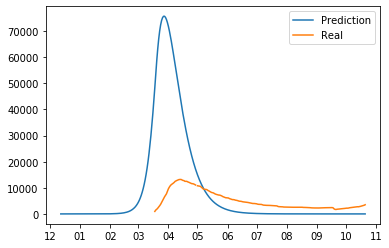

34542.50269697508
error_groups 5914.4534291622285
error_total 5725.609853562571
mix_other: 0.5576595117562452 mix_leisure: 0.16130961300848345
{'work': 1.3813971313033566, 'transport': 1.3813971313033566, 'school': 1.3813971313033566, 'other': 1.3813971313033566, 'leisure': 1.3813971313033566, 'home': 1.3813971313033566}
[7.20696905e+01 1.38139713e+00 5.16830294e-01 5.57659512e-01
 1.61309613e-01 5.60162486e-02 5.58805277e-01 5.59368467e-02
 8.20190661e-01]
55155.1407682758
error_groups 9226.250358239331
error_total 9185.778082007293
mix_other: 0.3222257192095212 mix_leisure: 0.8881953272728422
{'work': 1.4816643828581946, 'transport': 1.4816643828581946, 'school': 1.4816643828581946, 'other': 1.4816643828581946, 'leisure': 1.4816643828581946, 'home': 1.4816643828581946}
[1.32062104e+02 1.48166438e+00 1.96799144e+00 3.22225719e-01
 8.88195327e-01 5.18991320e-02 5.94019942e-01 1.75048867e-01
 6.46516787e-01]


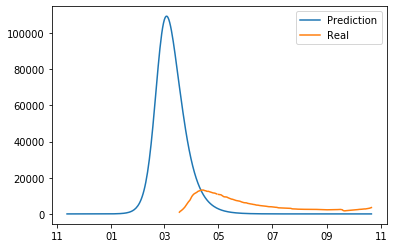

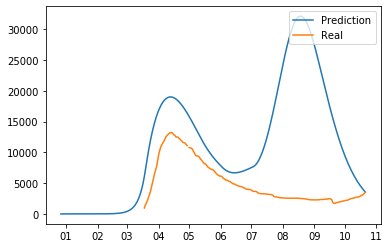

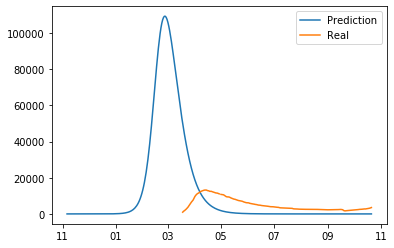

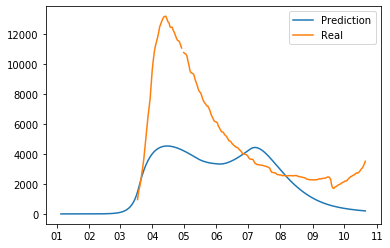

20480.545374222314
error_groups 4133.206547999467
error_total 3269.4677652445694
mix_other: 0.4562003772761452 mix_leisure: 0.20459249295314352
{'work': 1.6525769509559556, 'transport': 1.6525769509559556, 'school': 1.6525769509559556, 'other': 1.6525769509559556, 'leisure': 1.6525769509559556, 'home': 1.6525769509559556}
[6.71633313e+01 1.65257695e+00 6.65039959e-01 4.56200377e-01
 2.04592493e-01 6.61036027e-02 6.31350315e-01 4.92505522e-02
 9.63670206e-01]
59755.48355569546
error_groups 9987.256102660955
error_total 9953.645490606901
mix_other: 0.7066904166461537 mix_leisure: 0.10449564988233423
{'work': 0.5014218212198244, 'transport': 0.5014218212198244, 'school': 0.5014218212198244, 'other': 0.5014218212198244, 'leisure': 0.5014218212198244, 'home': 0.5014218212198244}
[80.87312464  0.50142182  1.09889285  0.70669042  0.10449565  0.09930479
  0.78184264  0.08370489  0.50945817]


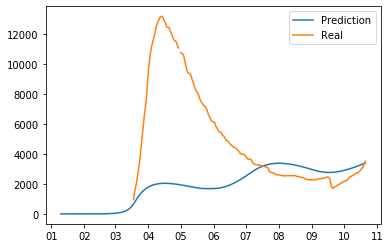

52195.37274363375
error_groups 8724.942519304519
error_total 8694.086044865846
mix_other: 0.1903715095791812 mix_leisure: 0.17019053072010681
{'work': 1.6342117314260265, 'transport': 1.6342117314260265, 'school': 1.6342117314260265, 'other': 1.6342117314260265, 'leisure': 1.6342117314260265, 'home': 1.6342117314260265}
[1.37364733e+02 1.63421173e+00 8.44161440e-01 1.90371510e-01
 1.70190531e-01 7.27962449e-02 5.83312283e-01 8.84715869e-02
 9.79864252e-01]


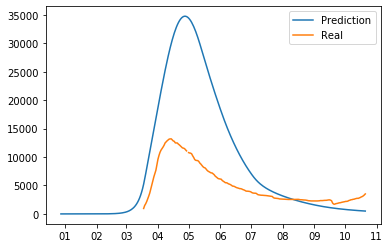

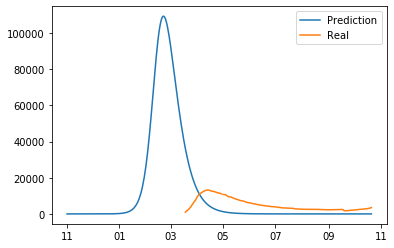

51793.44898943449
error_groups 8654.474351423936
error_total 8627.79492760211
mix_other: 0.5132416927595462 mix_leisure: 0.13985146974213025
{'work': 1.8500668653722507, 'transport': 1.8500668653722507, 'school': 1.8500668653722507, 'other': 1.8500668653722507, 'leisure': 1.8500668653722507, 'home': 1.8500668653722507}
[1.38577115e+02 1.85006687e+00 1.86624973e+00 5.13241693e-01
 1.39851470e-01 5.64415153e-02 3.84242057e-01 8.64024410e-02
 7.16622812e-01]


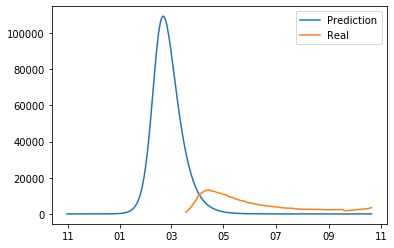

35942.17286964728
error_groups 6497.445580663783
error_total 5888.945457796699
mix_other: 0.40258294324935096 mix_leisure: 0.8244396035543289
{'work': 1.6023871764904776, 'transport': 1.6023871764904776, 'school': 1.6023871764904776, 'other': 1.6023871764904776, 'leisure': 1.6023871764904776, 'home': 1.6023871764904776}
[7.95601350e+01 1.60238718e+00 5.37083166e-01 4.02582943e-01
 8.24439604e-01 5.71810694e-02 4.06468792e-01 1.52439914e-02
 5.03731742e-01]


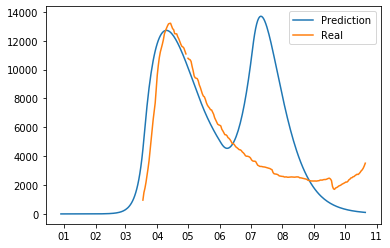

57753.942212147784
error_groups 9659.873404021095
error_total 9618.813761625339
mix_other: 0.07315755866360285 mix_leisure: 0.9658268713021847
{'work': 1.6525769509559556, 'transport': 1.6525769509559556, 'school': 1.6525769509559556, 'other': 1.6525769509559556, 'leisure': 1.6525769509559556, 'home': 1.6525769509559556}
[1.29970622e+02 1.65257695e+00 9.95738872e-01 7.31575587e-02
 9.65826871e-01 1.88607335e-02 7.40045227e-01 1.00761464e-01
 9.82223417e-01]


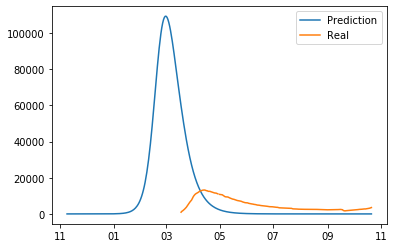

53612.69515796398
error_groups 9335.37486514159
error_total 8855.464058564477
mix_other: 0.49985410036291444 mix_leisure: 0.7377618782007863
{'work': 1.7370326354354049, 'transport': 1.7370326354354049, 'school': 1.7370326354354049, 'other': 1.7370326354354049, 'leisure': 1.7370326354354049, 'home': 1.7370326354354049}
[7.97944293e+01 1.73703264e+00 9.74181978e-01 4.99854100e-01
 7.37761878e-01 2.54796499e-02 4.38914420e-01 6.05579980e-02
 9.73344238e-01]
31040.125126217183
57233.87328987606
error_groups 5340.371149676978
error_groups 10030.202871988542
error_total 9440.734083577503
error_total 5139.950795308041
mix_other: 0.04482988782397457 mix_leisure: 0.9775729668072367
mix_other: 0.7838386444110954 mix_leisure: 0.19903602920396818
{'work': 0.8307636593745317, 'transport': 0.8307636593745317, 'school': 0.8307636593745317, 'other': 0.8307636593745317, 'leisure': 0.8307636593745317, 'home': 0.8307636593745317}
{'work': 1.4213102274509992, 'transport': 1.4213102274509992, 'school': 1.

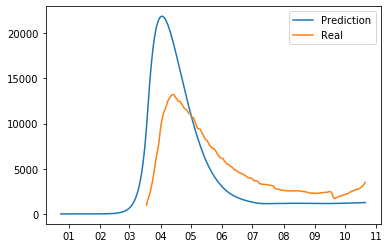

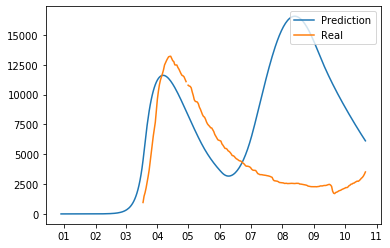

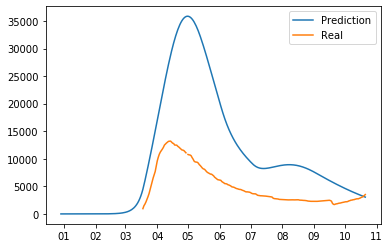

35597.95656877262
47494.775633551035
error_groups 6064.1348310292215
error_groups 8084.405182772617
error_total 5906.76434754868
error_total 7882.074090155685
mix_other: 0.5918144277049672 mix_leisure: 0.7957972979861541
mix_other: 0.44984644099721616 mix_leisure: 0.3956413878433065
{'work': 1.593540770869898, 'transport': 1.593540770869898, 'school': 1.593540770869898, 'other': 1.593540770869898, 'leisure': 1.593540770869898, 'home': 1.593540770869898}
{'work': 0.8321325244795471, 'transport': 0.8321325244795471, 'school': 0.8321325244795471, 'other': 0.8321325244795471, 'leisure': 0.8321325244795471, 'home': 0.8321325244795471}
[5.25968147e+01 1.59354077e+00 5.28583968e-01 5.91814428e-01
 7.95797298e-01 1.65953133e-02 7.20500025e-01 8.80025635e-03
 8.99571235e-01][7.62696439e+01 8.32132524e-01 7.60542535e-01 4.49846441e-01
 3.95641388e-01 3.74799309e-02 3.56168456e-01 1.69360073e-01
 6.95402327e-01]

56816.97883540994
error_groups 9502.603738398733
error_total 9462.87501940224
mix_ot

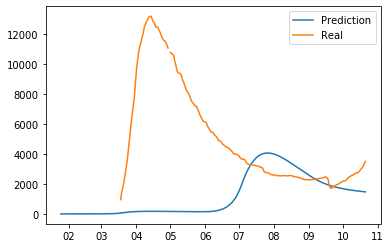

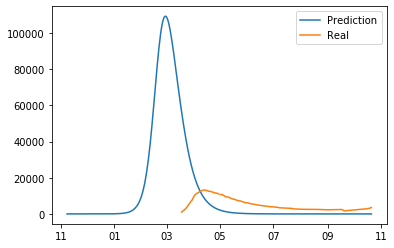

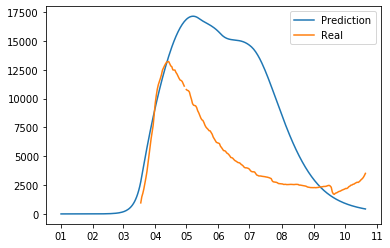

52654.00686244611
error_groups 8806.632608044678
error_total 8769.474850880288
mix_other: 0.7898852682793138 mix_leisure: 0.5483193462095864
{'work': 0.6577681076601212, 'transport': 0.6577681076601212, 'school': 0.6577681076601212, 'other': 0.6577681076601212, 'leisure': 0.6577681076601212, 'home': 0.6577681076601212}
[1.36469688e+02 6.57768108e-01 1.19329047e+00 7.89885268e-01
 5.48319346e-01 1.24096436e-02 8.85376592e-01 1.64876270e-01
 8.38546049e-01]
25431.888248812393
error_groups 4910.830107722139
error_total 4104.2116282180505
mix_other: 0.7289618760830704 mix_leisure: 0.23776720261845158
{'work': 1.3952672370755788, 'transport': 1.3952672370755788, 'school': 1.3952672370755788, 'other': 1.3952672370755788, 'leisure': 1.3952672370755788, 'home': 1.3952672370755788}
[60.28890842  1.39526724  0.63477781  0.72896188  0.2377672   0.08327545
  0.88917318  0.06702975  0.71252332]


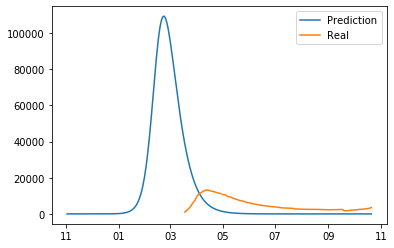

28342.384315979514
error_groups 5271.244287611704
error_total 4614.228005673562


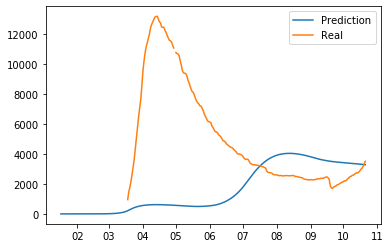

mix_other: 0.26900542470017186 mix_leisure: 0.11203028514890367
{'work': 1.7795279841717093, 'transport': 1.7795279841717093, 'school': 1.7795279841717093, 'other': 1.7795279841717093, 'leisure': 1.7795279841717093, 'home': 1.7795279841717093}
[7.80403254e+01 1.77952798e+00 5.59687007e-01 2.69005425e-01
 1.12030285e-01 1.32542449e-02 9.67712896e-01 5.19900891e-02
 9.23714245e-01]
16741.647182695448
error_groups 3355.8578203522047
error_total 2677.1578724686487
mix_other: 0.5179700635504716 mix_leisure: 0.0954858268723312
{'work': 1.462063380043052, 'transport': 1.462063380043052, 'school': 1.462063380043052, 'other': 1.462063380043052, 'leisure': 1.462063380043052, 'home': 1.462063380043052}
[7.75899067e+01 1.46206338e+00 7.59616429e-01 5.17970064e-01
 9.54858269e-02 6.81050430e-02 4.18539628e-01 9.20405707e-02
 7.08751631e-01]


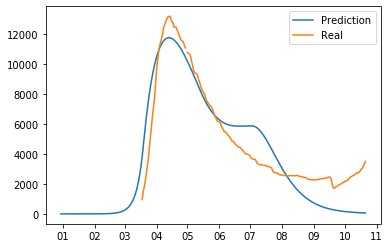

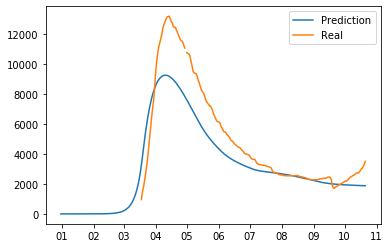

53748.111755514576
error_groups 8992.329341802088
error_total 8951.156482742497
mix_other: 0.2914450644592703 mix_leisure: 0.4091902297463609
{'work': 0.4314247753537549, 'transport': 0.4314247753537549, 'school': 0.4314247753537549, 'other': 0.4314247753537549, 'leisure': 0.4314247753537549, 'home': 0.4314247753537549}
[1.34586465e+02 4.31424775e-01 1.85192839e+00 2.91445064e-01
 4.09190230e-01 9.45992652e-02 4.65547640e-01 1.66134063e-02
 7.78517707e-01]


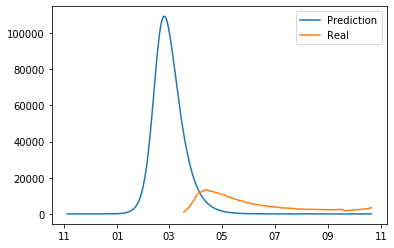

28550.10108346284
error_groups 4963.075397043999
error_total 4717.405137283768
mix_other: 0.6649012868115913 mix_leisure: 0.3587832266290873
{'work': 1.5590131926079889, 'transport': 1.5590131926079889, 'school': 1.5590131926079889, 'other': 1.5590131926079889, 'leisure': 1.5590131926079889, 'home': 1.5590131926079889}
25423.435999809444
[8.48953962e+01 1.55901319e+00 9.09132156e-01 6.64901287e-01
 3.58783227e-01 1.48171260e-02 9.08605347e-01 8.40250302e-02
 8.53222103e-01]error_groups 4514.919474459757
error_total 4181.703305069937

mix_other: 0.9111365936992268 mix_leisure: 0.23964117869412038
{'work': 1.096630136158867, 'transport': 1.096630136158867, 'school': 1.096630136158867, 'other': 1.096630136158867, 'leisure': 1.096630136158867, 'home': 1.096630136158867}
[7.50476170e+01 1.09663014e+00 6.17862174e-01 9.11136594e-01
 2.39641179e-01 3.42322756e-02 1.72094595e-01 5.67232939e-02
 9.33946318e-01]
51746.64325496413
error_groups 8648.607789595959
error_total 8619.607093073635
mix_o

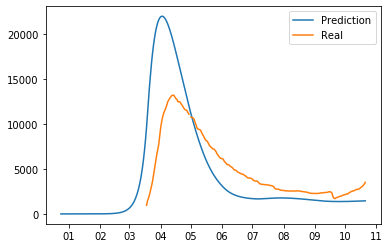

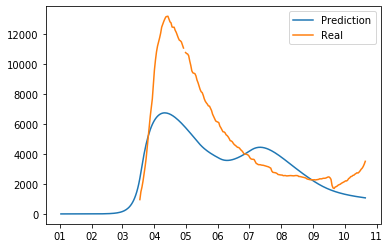

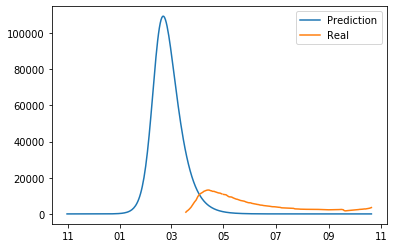

43817.183970014885
error_groups 7554.138925567231
error_total 7252.609008889531
mix_other: 0.2219209469876534 mix_leisure: 0.2662713050489589
28009.428229545436
{'work': 1.2321553213966547, 'transport': 1.2321553213966547, 'school': 1.2321553213966547, 'other': 1.2321553213966547, 'leisure': 1.2321553213966547, 'home': 1.2321553213966547}
error_groups 4969.900083744079
[7.49201188e+01 1.23215532e+00 9.71313710e-01 2.21920947e-01
 2.66271305e-01 6.99850948e-02 3.61072787e-01 1.64086681e-02
 7.01384571e-01]
error_total 4607.905629160271
mix_other: 0.6020110537128659 mix_leisure: 0.13364526285738088
{'work': 1.5064971732645929, 'transport': 1.5064971732645929, 'school': 1.5064971732645929, 'other': 1.5064971732645929, 'leisure': 1.5064971732645929, 'home': 1.5064971732645929}
[7.83883003e+01 1.50649717e+00 7.12662137e-01 6.02011054e-01
 1.33645263e-01 2.59283616e-02 3.69316129e-01 1.42724154e-01
 6.46841133e-01]


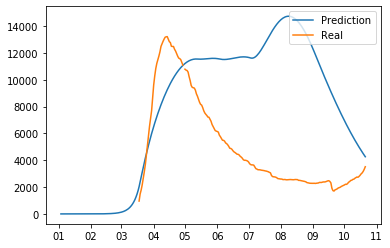

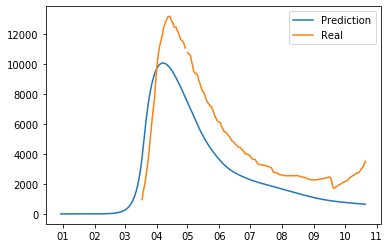

32649.39732155427
error_groups 5749.202771950956
error_total 5380.038909920662
mix_other: 0.6338489340286149 mix_leisure: 0.03801744751507452
{'work': 1.405234919419028, 'transport': 1.405234919419028, 'school': 1.405234919419028, 'other': 1.405234919419028, 'leisure': 1.405234919419028, 'home': 1.405234919419028}
[7.88120858e+01 1.40523492e+00 5.79981307e-01 6.33848934e-01
 3.80174475e-02 7.86812177e-02 3.69226215e-02 6.19719413e-02
 8.29241101e-01]
42359.766515343
error_groups 7101.155458338249
error_total 7051.722211400951
mix_other: 0.07621339182361031 mix_leisure: 0.5099337667997568
{'work': 1.5820490760315136, 'transport': 1.5820490760315136, 'school': 1.5820490760315136, 'other': 1.5820490760315136, 'leisure': 1.5820490760315136, 'home': 1.5820490760315136}
[8.58841176e+01 1.58204908e+00 1.14319425e+00 7.62133918e-02
 5.09933767e-01 6.37140465e-02 3.77186031e-01 1.02398996e-01
 7.79982309e-01]


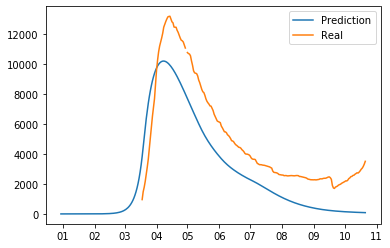

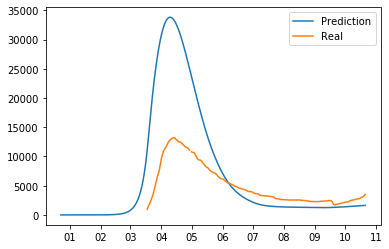

51412.327531377625
error_groups 8586.913865776944
error_total 8565.082733120136
mix_other: 0.24832041493004342 mix_leisure: 0.722255121271114
{'work': 1.5029628121268237, 'transport': 1.5029628121268237, 'school': 1.5029628121268237, 'other': 1.5029628121268237, 'leisure': 1.5029628121268237, 'home': 1.5029628121268237}
[1.39494716e+02 1.50296281e+00 7.85854656e-01 2.48320415e-01
 7.22255121e-01 6.03451470e-02 5.90169192e-01 1.86681483e-01
 6.59537631e-01]
40254.556079267306
error_groups 6766.809840522743
error_total 6697.549247748912
mix_other: 0.0638913112518571 mix_leisure: 0.11203028514890367
{'work': 1.7814456195699124, 'transport': 1.7814456195699124, 'school': 1.7814456195699124, 'other': 1.7814456195699124, 'leisure': 1.7814456195699124, 'home': 1.7814456195699124}
[6.29827229e+01 1.78144562e+00 5.59687007e-01 6.38913113e-02
 1.12030285e-01 4.01736699e-02 7.98801093e-01 3.23669053e-03
 7.37071397e-01]


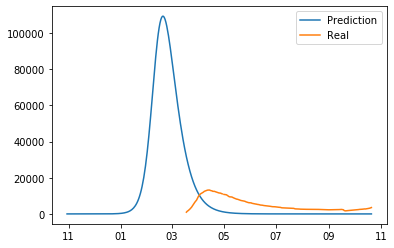

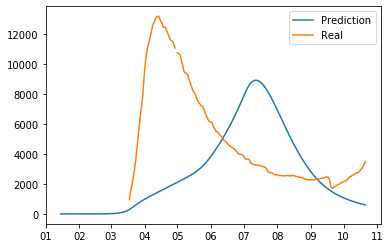

27010.584731686475
error_groups 4744.688106334732
error_total 4453.179325070349
mix_other: 0.882255609819651 mix_leisure: 0.12164745217347844
{'work': 1.1802544914135804, 'transport': 1.1802544914135804, 'school': 1.1802544914135804, 'other': 1.1802544914135804, 'leisure': 1.1802544914135804, 'home': 1.1802544914135804}
[75.09046739  1.18025449  0.6450365   0.88225561  0.12164745  0.08057046
  0.75771195  0.13882646  0.77614859]


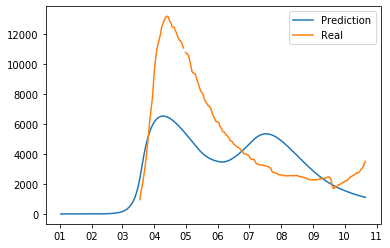

45686.31517900982
error_groups 7715.049432005781
error_total 7594.253149400807
mix_other: 0.43440302127513397 mix_leisure: 0.13555336061089235
{'work': 1.478751199135505, 'transport': 1.478751199135505, 'school': 1.478751199135505, 'other': 1.478751199135505, 'leisure': 1.478751199135505, 'home': 1.478751199135505}
[8.58656088e+01 1.47875120e+00 7.52305355e-01 4.34403021e-01
 1.35553361e-01 6.64352634e-02 3.58187043e-01 1.55880121e-01
 8.35407973e-01]


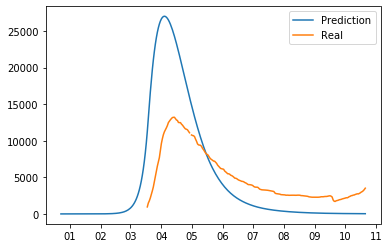

36606.69540890361
error_groups 6192.959526344429
error_total 6082.747176511835
mix_other: 0.20395578136617665 mix_leisure: 0.017157015240763185
{'work': 1.6964523726742753, 'transport': 1.6964523726742753, 'school': 1.6964523726742753, 'other': 1.6964523726742753, 'leisure': 1.6964523726742753, 'home': 1.6964523726742753}
[8.27377470e+01 1.69645237e+00 8.65794367e-01 2.03955781e-01
 1.71570152e-02 6.91162453e-02 1.92137213e-01 8.51400112e-02
 8.43981860e-01]


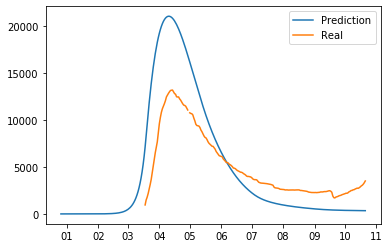

41219.16039213039
error_groups 7036.3543885102445
error_total 6836.561200724031
mix_other: 0.5173215047431812 mix_leisure: 0.4751299415568413
{'work': 1.9450172908444918, 'transport': 1.9450172908444918, 'school': 1.9450172908444918, 'other': 1.9450172908444918, 'leisure': 1.9450172908444918, 'home': 1.9450172908444918}
[75.67813753  1.94501729  0.84419689  0.5173215   0.47512994  0.089684
  0.7240299   0.08807749  0.6567543 ]


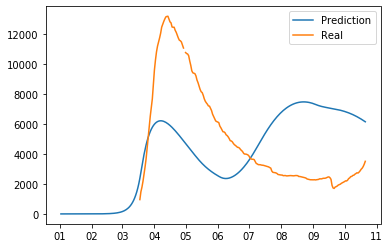

19161.807518090205
error_groups 3705.3765767676623
error_total 3091.2861882645084
mix_other: 0.7898307278375648 mix_leisure: 0.0954858268723312
{'work': 0.9863677267793896, 'transport': 0.9863677267793896, 'school': 0.9863677267793896, 'other': 0.9863677267793896, 'leisure': 0.9863677267793896, 'home': 0.9863677267793896}
[7.75899067e+01 9.86367727e-01 7.08497831e-01 7.89830728e-01
 9.54858269e-02 6.81050430e-02 2.54476078e-01 1.74222868e-01
 5.32385707e-01]
26701.542497518767
error_groups 4905.136052945695
error_total 4359.281288914614
mix_other: 0.2719489539673058 mix_leisure: 0.33583245514027715
{'work': 1.6449726240523668, 'transport': 1.6449726240523668, 'school': 1.6449726240523668, 'other': 1.6449726240523668, 'leisure': 1.6449726240523668, 'home': 1.6449726240523668}
[7.99285796e+01 1.64497262e+00 6.53821216e-01 2.71948954e-01
 3.35832455e-01 3.46048710e-02 1.00639689e-01 3.01891457e-02
 5.78286886e-01]


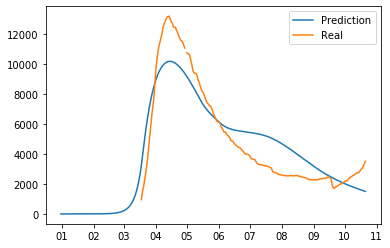

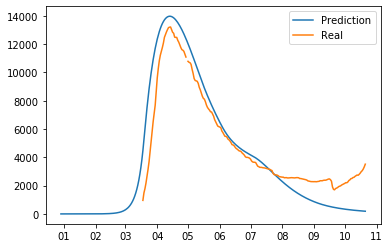

22377.696165017518
error_groups 4095.230575287278
error_total 3656.4931179460477
mix_other: 0.7409750466741524 mix_leisure: 0.8066671567422766
{'work': 1.5272261242914997, 'transport': 1.5272261242914997, 'school': 1.5272261242914997, 'other': 1.5272261242914997, 'leisure': 1.5272261242914997, 'home': 1.5272261242914997}
[8.24916418e+01 1.52722612e+00 7.95642831e-01 7.40975047e-01
 8.06667157e-01 6.18768551e-02 2.84008733e-02 1.19031959e-01
 7.71860860e-01]
37197.94878041696
error_groups 6394.04870352493
error_total 6160.7800153784065
mix_other: 0.6832096527569093 mix_leisure: 0.06414422704231948
{'work': 1.83435708975119, 'transport': 1.83435708975119, 'school': 1.83435708975119, 'other': 1.83435708975119, 'leisure': 1.83435708975119, 'home': 1.83435708975119}
[7.93053506e+01 1.83435709e+00 5.29323510e-01 6.83209653e-01
 6.41442270e-02 9.01885625e-02 2.53597095e-01 8.67559628e-02
 6.27022622e-01]


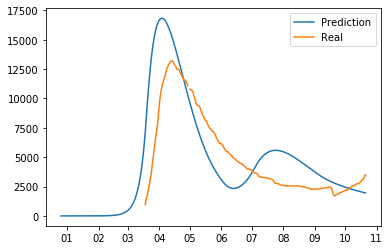

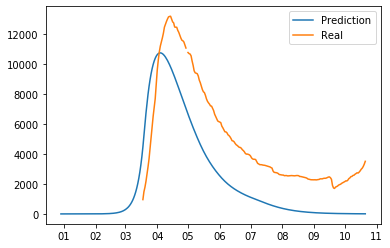

39244.97729209518
error_groups 6596.258774483751
error_total 6529.7437035222865
mix_other: 0.6446408097922043 mix_leisure: 0.03295557902646279
{'work': 1.3580167052433376, 'transport': 1.3580167052433376, 'school': 1.3580167052433376, 'other': 1.3580167052433376, 'leisure': 1.3580167052433376, 'home': 1.3580167052433376}
[6.54105389e+01 1.35801671e+00 7.08120180e-01 6.44640810e-01
 3.29555790e-02 7.43747794e-02 3.17502688e-01 8.34074159e-02
 7.80063282e-01]


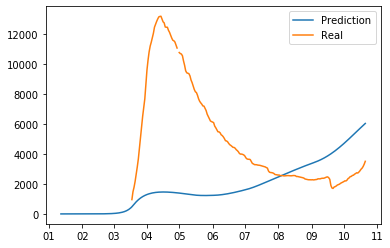

28601.974563334945
error_groups 5013.906949784043
error_total 4717.61352271018
mix_other: 0.3127852459801086 mix_leisure: 0.12424259706509344
{'work': 1.6817045690913224, 'transport': 1.6817045690913224, 'school': 1.6817045690913224, 'other': 1.6817045690913224, 'leisure': 1.6817045690913224, 'home': 1.6817045690913224}
[7.33169697e+01 1.68170457e+00 6.34777813e-01 3.12785246e-01
 1.24242597e-01 3.85606602e-02 6.43005189e-01 3.04785151e-02
 6.70888564e-01]


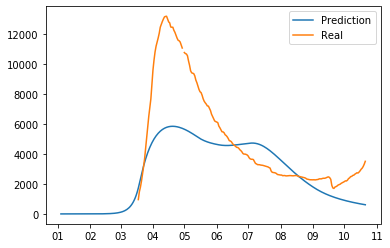

12253.431633992197
error_groups 2854.452649159225
error_total 1879.7957969665945
mix_other: 0.7422730799985496 mix_leisure: 0.178257047042656
{'work': 1.2306120974196395, 'transport': 1.2306120974196395, 'school': 1.2306120974196395, 'other': 1.2306120974196395, 'leisure': 1.2306120974196395, 'home': 1.2306120974196395}
[7.75945711e+01 1.23061210e+00 7.73471455e-01 7.42273080e-01
 1.78257047e-01 6.74973104e-02 4.94370635e-01 1.42365841e-01
 5.86259981e-01]


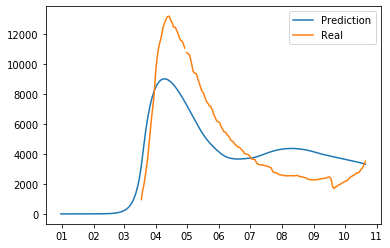

36911.70591749463
error_groups 6196.073056654003
error_total 6143.126572168127
mix_other: 0.38701088629641356 mix_leisure: 0.20591379770249696
{'work': 1.2376409431559836, 'transport': 1.2376409431559836, 'school': 1.2376409431559836, 'other': 1.2376409431559836, 'leisure': 1.2376409431559836, 'home': 1.2376409431559836}
[5.76265591e+01 1.23764094e+00 5.35834303e-01 3.87010886e-01
 2.05913798e-01 2.51150696e-02 7.81225342e-01 4.70515316e-02
 7.31815615e-01]
23421.712577961025
error_groups 4413.563967376879
error_total 3801.6297221168293
mix_other: 0.1866336514540025 mix_leisure: 0.018420535673426053
{'work': 1.5093815235501986, 'transport': 1.5093815235501986, 'school': 1.5093815235501986, 'other': 1.5093815235501986, 'leisure': 1.5093815235501986, 'home': 1.5093815235501986}
[6.19633950e+01 1.50938152e+00 6.21862792e-01 1.86633651e-01
 1.84205357e-02 7.39738789e-02 2.36269210e-01 5.70481384e-02
 8.95338278e-01]


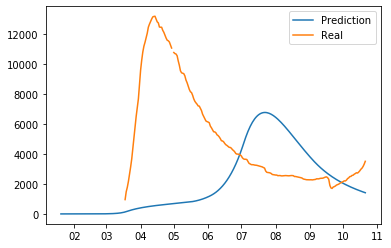

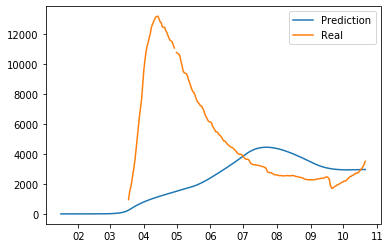

35357.22931113238
error_groups 6041.051979272026
error_total 5863.235466372071
mix_other: 0.7382694031584115 mix_leisure: 0.3885769886711078
{'work': 1.3935147925662739, 'transport': 1.3935147925662739, 'school': 1.3935147925662739, 'other': 1.3935147925662739, 'leisure': 1.3935147925662739, 'home': 1.3935147925662739}
[7.37516737e+01 1.39351479e+00 5.16830294e-01 7.38269403e-01
 3.88576989e-01 5.60162486e-02 2.27897157e-01 5.59368467e-02
 5.08451397e-01]


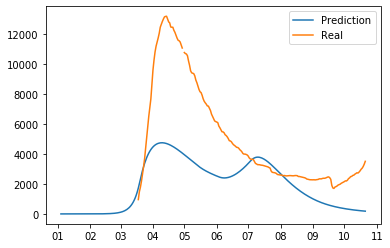

15116.752339506318
error_groups 2924.244448220947
error_total 2438.5015782570745
mix_other: 0.1903715095791812 mix_leisure: 0.22371473853277657
{'work': 1.7446945293362661, 'transport': 1.7446945293362661, 'school': 1.7446945293362661, 'other': 1.7446945293362661, 'leisure': 1.7446945293362661, 'home': 1.7446945293362661}
[7.81540511e+01 1.74469453e+00 8.39073002e-01 1.90371510e-01
 2.23714739e-01 7.73753971e-02 1.95324918e-01 7.63574283e-02
 5.52619768e-01]


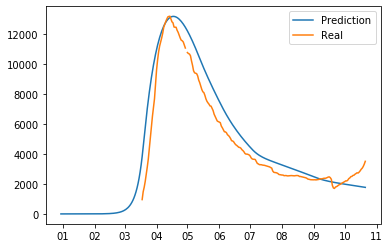

34749.89433405016
error_groups 5919.951486505535
error_total 5765.988569508925
mix_other: 0.7618603256367019 mix_leisure: 0.158543209248718
{'work': 1.0854016189234248, 'transport': 1.0854016189234248, 'school': 1.0854016189234248, 'other': 1.0854016189234248, 'leisure': 1.0854016189234248, 'home': 1.0854016189234248}
[61.13997172  1.08540162  0.54065522  0.76186033  0.15854321  0.07155925
  0.37604739  0.07020532  0.53270991]


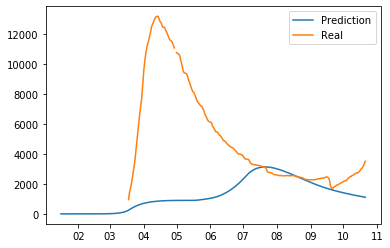

21808.908937629054
error_groups 4040.081739754605
error_total 3553.76543957489
mix_other: 0.8603826801161802 mix_leisure: 0.4019685925463465
{'work': 1.1706910502954693, 'transport': 1.1706910502954693, 'school': 1.1706910502954693, 'other': 1.1706910502954693, 'leisure': 1.1706910502954693, 'home': 1.1706910502954693}
[75.03607244  1.17069105  0.69088829  0.86038268  0.40196859  0.0854274
  0.32779201  0.17841132  0.59447989]


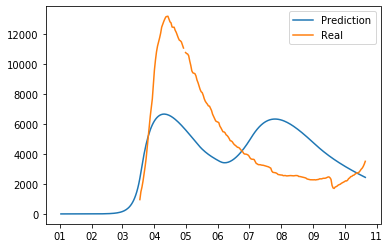

11513.566370747965
error_groups 2539.0448820770516
error_total 1794.9042977341828
mix_other: 0.38277582863325016 mix_leisure: 0.1524392991706015
{'work': 1.5087167927888727, 'transport': 1.5087167927888727, 'school': 1.5087167927888727, 'other': 1.5087167927888727, 'leisure': 1.5087167927888727, 'home': 1.5087167927888727}
[8.00611569e+01 1.50871679e+00 8.86545303e-01 3.82775829e-01
 1.52439299e-01 6.80758596e-02 1.59656510e-01 9.61949218e-02
 5.19748908e-01]
21022.187662156757
error_groups 3793.4954717681285
error_total 3445.7384380777257
mix_other: 0.23573240474412832 mix_leisure: 0.24373690657063785
{'work': 1.4613702918625546, 'transport': 1.4613702918625546, 'school': 1.4613702918625546, 'other': 1.4613702918625546, 'leisure': 1.4613702918625546, 'home': 1.4613702918625546}
[8.28810050e+01 1.46137029e+00 9.73582427e-01 2.35732405e-01
 2.43736907e-01 7.19502134e-02 8.21412540e-01 1.37328063e-02
 8.90995778e-01]


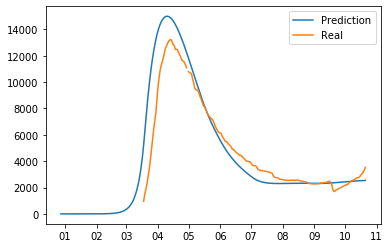

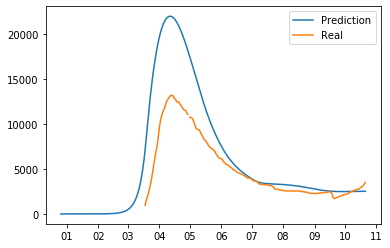

22666.43835719576
error_groups 4165.8973712135175
error_total 3700.1081971964477
mix_other: 0.8652022366546748 mix_leisure: 0.023333415635875876
{'work': 1.8019410930302935, 'transport': 1.8019410930302935, 'school': 1.8019410930302935, 'other': 1.8019410930302935, 'leisure': 1.8019410930302935, 'home': 1.8019410930302935}
[8.09120647e+01 1.80194109e+00 9.73685404e-01 8.65202237e-01
 2.33334156e-02 4.65544504e-02 1.97006050e-01 9.87032783e-02
 8.09036130e-01]


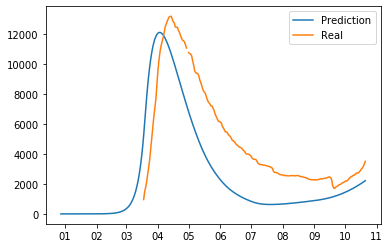

33672.34129443648
error_groups 6017.980828495005
error_total 5530.872093188296
mix_other: 0.8263846113163297 mix_leisure: 0.8403860413789942
{'work': 1.3740013606157193, 'transport': 1.3740013606157193, 'school': 1.3740013606157193, 'other': 1.3740013606157193, 'leisure': 1.3740013606157193, 'home': 1.3740013606157193}
[8.00611569e+01 1.37400136e+00 8.86545303e-01 8.26384611e-01
 8.40386041e-01 7.76802157e-02 3.86449671e-01 1.11170358e-01
 6.46746079e-01]
31498.46523022897
error_groups 5549.289656975452
error_total 5189.835114650703
mix_other: 0.5053222336298729 mix_leisure: 0.6615174032839822
{'work': 1.4478290766675581, 'transport': 1.4478290766675581, 'school': 1.4478290766675581, 'other': 1.4478290766675581, 'leisure': 1.4478290766675581, 'home': 1.4478290766675581}
[8.26927238e+01 1.44782908e+00 7.76817220e-01 5.05322234e-01
 6.61517403e-01 4.66687531e-02 9.15336766e-01 1.10070198e-01
 6.02654860e-01]


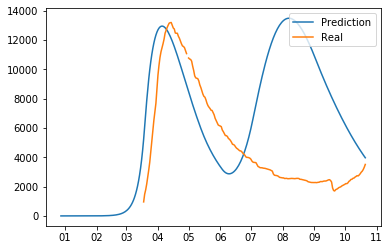

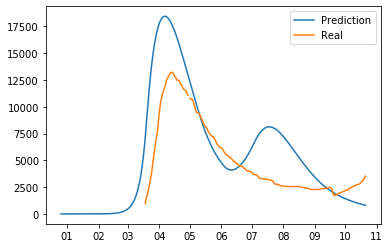

33910.5542367864
error_groups 5797.593536939757
error_total 5622.592139969329
mix_other: 0.7670342762993381 mix_leisure: 0.3527031575205877
{'work': 1.857920525733181, 'transport': 1.857920525733181, 'school': 1.857920525733181, 'other': 1.857920525733181, 'leisure': 1.857920525733181, 'home': 1.857920525733181}
[78.76599144  1.85792053  0.71565969  0.76703428  0.35270316  0.09443315
  0.48693703  0.10001857  0.57845345]


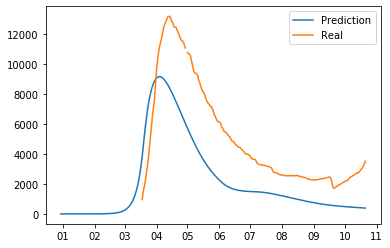

13247.220959142787
error_groups 2720.1464540645593
error_total 2105.4149010156457
mix_other: 0.4861864034637195 mix_leisure: 0.3424557200184911
{'work': 1.2655396737756475, 'transport': 1.2655396737756475, 'school': 1.2655396737756475, 'other': 1.2655396737756475, 'leisure': 1.2655396737756475, 'home': 1.2655396737756475}
[8.08931896e+01 1.26553967e+00 8.32918458e-01 4.86186403e-01
 3.42455720e-01 6.23348885e-02 9.91222517e-02 1.02576538e-01
 6.21081020e-01]


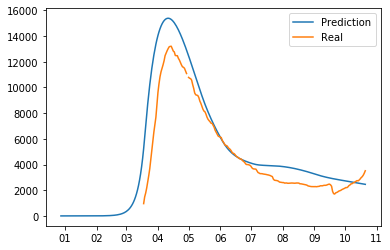

15854.605922025934
error_groups 3411.1629347246026
error_total 2488.6885974602665
mix_other: 0.43368923024967737 mix_leisure: 0.45219172960909015
{'work': 1.4874428636662673, 'transport': 1.4874428636662673, 'school': 1.4874428636662673, 'other': 1.4874428636662673, 'leisure': 1.4874428636662673, 'home': 1.4874428636662673}
[78.45241148  1.48744286  0.81059102  0.43368923  0.45219173  0.09957123
  0.6633229   0.11962379  0.970856  ]


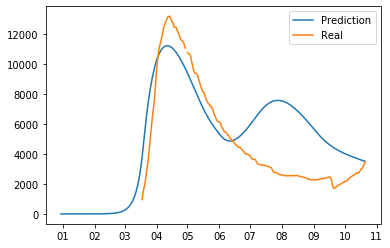

18131.56056708758
14236.112680966588
error_groups 3347.972151378819
error_groups 3051.7845399171265
error_total 2956.717683141753
error_total 2236.8656282098923
mix_other: 0.23681753523523374 mix_leisure: 0.20140353009201928
mix_other: 0.47279237240633093 mix_leisure: 0.3638331925734468
{'work': 1.7446699526328908, 'transport': 1.7446699526328908, 'school': 1.7446699526328908, 'other': 1.7446699526328908, 'leisure': 1.7446699526328908, 'home': 1.7446699526328908}
{'work': 1.3212755458387573, 'transport': 1.3212755458387573, 'school': 1.3212755458387573, 'other': 1.3212755458387573, 'leisure': 1.3212755458387573, 'home': 1.3212755458387573}
[80.49086771  1.74466995  0.98151509  0.23681754  0.20140353  0.08797129
  0.66042638  0.11672175  0.62566524][7.91393248e+01 1.32127555e+00 7.93324054e-01 4.72792372e-01
 3.63833193e-01 9.08765501e-02 2.96939626e-01 3.99906473e-02
 5.29001322e-01]



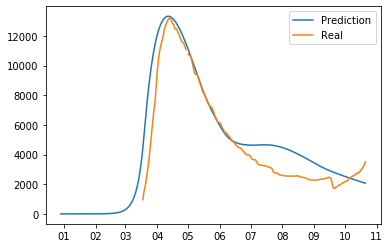

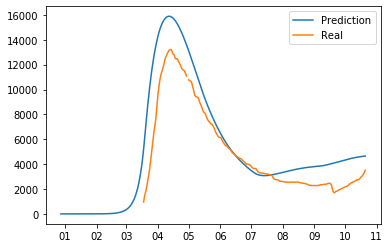

32287.51245541081
error_groups 5617.847586345143
error_total 5333.932973813134
mix_other: 0.6937075537705574 mix_leisure: 0.49773298255956683
{'work': 0.8994703096719041, 'transport': 0.8994703096719041, 'school': 0.8994703096719041, 'other': 0.8994703096719041, 'leisure': 0.8994703096719041, 'home': 0.8994703096719041}
[8.66277673e+01 8.99470310e-01 1.08564801e+00 6.93707554e-01
 4.97732983e-01 4.37965441e-03 2.21287176e-01 5.01452290e-02
 7.86935717e-01]
29088.27394227807
error_groups 5014.613906039751
error_total 4814.732007247663
mix_other: 0.2701417407022189 mix_leisure: 0.03422284857062774
{'work': 1.5803790547873366, 'transport': 1.5803790547873366, 'school': 1.5803790547873366, 'other': 1.5803790547873366, 'leisure': 1.5803790547873366, 'home': 1.5803790547873366}
[8.19732687e+01 1.58037905e+00 8.42231415e-01 2.70141741e-01
 3.42228486e-02 7.64486801e-02 5.65424269e-01 9.44241246e-02
 8.79426451e-01]


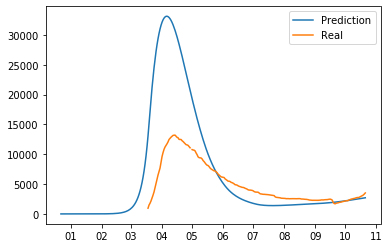

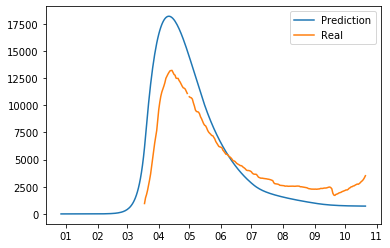

25478.476736436118
error_groups 4317.9231903572545
error_total 4232.110709215773
mix_other: 0.2719489539673058 mix_leisure: 0.29968488365588886
{'work': 1.4318643878773891, 'transport': 1.4318643878773891, 'school': 1.4318643878773891, 'other': 1.4318643878773891, 'leisure': 1.4318643878773891, 'home': 1.4318643878773891}
10393.647433198621
[7.99285796e+01 1.43186439e+00 7.59473107e-01 2.71948954e-01
 2.99684884e-01 6.28718074e-02 1.00639689e-01 3.01891457e-02
 5.53030490e-01]error_groups 2403.539102329236

error_total 1598.0216661738768
mix_other: 0.3360888480360505 mix_leisure: 0.2679201791380288
11241.956634956057
{'work': 1.7280672525755967, 'transport': 1.7280672525755967, 'school': 1.7280672525755967, 'other': 1.7280672525755967, 'leisure': 1.7280672525755967, 'home': 1.7280672525755967}
error_groups 2339.5760295946693
[8.19680400e+01 1.72806725e+00 9.46396449e-01 3.36088848e-01
 2.67920179e-01 7.90104916e-02 1.76990175e-01 1.08781740e-01
 6.38917535e-01]error_total 1780.47612107

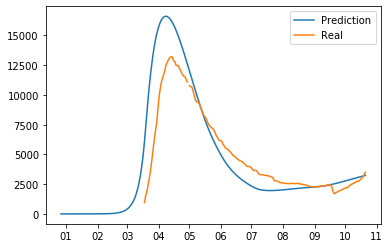

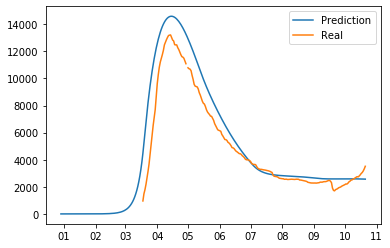

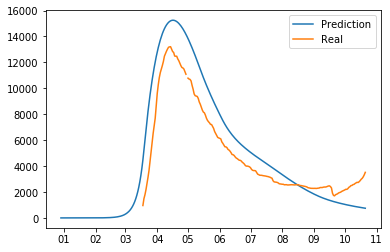

9633.4163053511
error_groups 2476.0237118862624
error_total 1431.4785186929676
mix_other: 0.3622870253415527 mix_leisure: 0.3696268412347544
{'work': 1.7431251364366196, 'transport': 1.7431251364366196, 'school': 1.7431251364366196, 'other': 1.7431251364366196, 'leisure': 1.7431251364366196, 'home': 1.7431251364366196}
[7.99013438e+01 1.74312514e+00 8.21409440e-01 3.62287025e-01
 3.69626841e-01 1.47129154e-02 1.45138075e-01 1.01913317e-01
 9.19911880e-01]


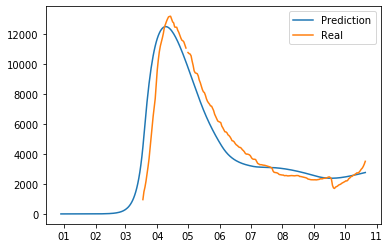

19213.223514945694
error_groups 3735.2567866606705
error_total 3095.5933456570046
mix_other: 0.4001671325924365 mix_leisure: 0.046545867491515514
{'work': 1.5688666768887134, 'transport': 1.5688666768887134, 'school': 1.5688666768887134, 'other': 1.5688666768887134, 'leisure': 1.5688666768887134, 'home': 1.5688666768887134}
[7.96023652e+01 1.56886668e+00 8.20157351e-01 4.00167133e-01
 4.65458675e-02 7.03494926e-02 3.02738954e-02 1.36978250e-01
 5.13901492e-01]
32221.73122088578
error_groups 5693.216402351786
error_total 5305.702963706799
mix_other: 0.6115786878388155 mix_leisure: 0.24038694260716098
{'work': 1.483729673210977, 'transport': 1.483729673210977, 'school': 1.483729673210977, 'other': 1.483729673210977, 'leisure': 1.483729673210977, 'home': 1.483729673210977}
[8.75115505e+01 1.48372967e+00 1.24770424e+00 6.11578688e-01
 2.40386943e-01 6.25946833e-02 5.10247169e-02 2.08025894e-02
 9.58801157e-01]


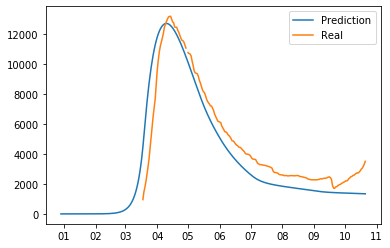

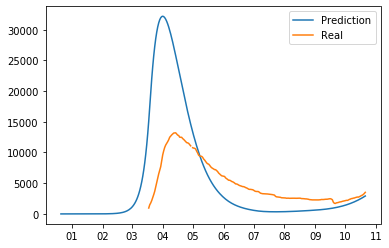

24813.441335294632
error_groups 4788.335591883578
error_total 4005.0211486822113
mix_other: 0.5179700635504716 mix_leisure: 0.17731081135239785
{'work': 1.9399102707698037, 'transport': 1.9399102707698037, 'school': 1.9399102707698037, 'other': 1.9399102707698037, 'leisure': 1.9399102707698037, 'home': 1.9399102707698037}
[6.41676483e+01 1.93991027e+00 7.59616429e-01 5.17970064e-01
 1.77310811e-01 6.81050430e-02 4.18539628e-01 4.35420864e-02
 7.24763719e-01]


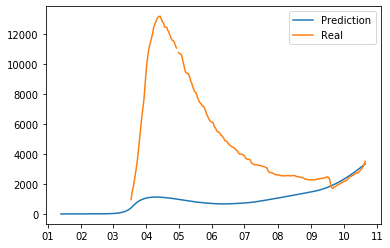

21142.04973998956
error_groups 3989.4656829928354
error_total 3430.5168113993454
mix_other: 0.32233852843921545 mix_leisure: 0.39797783650220986
{'work': 1.5950653915999835, 'transport': 1.5950653915999835, 'school': 1.5950653915999835, 'other': 1.5950653915999835, 'leisure': 1.5950653915999835, 'home': 1.5950653915999835}
[74.47719179  1.59506539  0.72960491  0.32233853  0.39797784  0.09459927
  0.33626817  0.11306028  0.77851771]
8482.4352675764
error_groups 2178.295701144636
error_total 1260.827913286353
mix_other: 0.38002796388316673 mix_leisure: 0.07368066811848734
{'work': 1.6209594304740684, 'transport': 1.6209594304740684, 'school': 1.6209594304740684, 'other': 1.6209594304740684, 'leisure': 1.6209594304740684, 'home': 1.6209594304740684}
[8.02742455e+01 1.62095943e+00 9.28841925e-01 3.80027964e-01
 7.36806681e-02 7.24077432e-02 3.54544412e-02 7.47935012e-02
 7.02410042e-01]


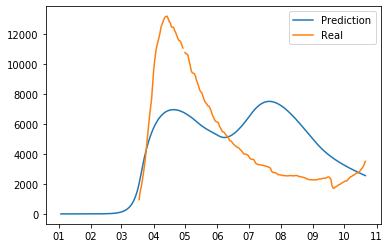

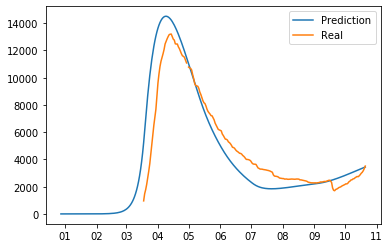

17235.66949364162
error_groups 3329.691520759536
error_total 2781.1955945764166
mix_other: 0.537924221034363 mix_leisure: 0.12388194863972246
{'work': 1.2720667832072916, 'transport': 1.2720667832072916, 'school': 1.2720667832072916, 'other': 1.2720667832072916, 'leisure': 1.2720667832072916, 'home': 1.2720667832072916}
[7.45776440e+01 1.27206678e+00 7.33031594e-01 5.37924221e-01
 1.23881949e-01 9.80262707e-02 1.01900628e-01 2.07918763e-02
 8.79367532e-01]


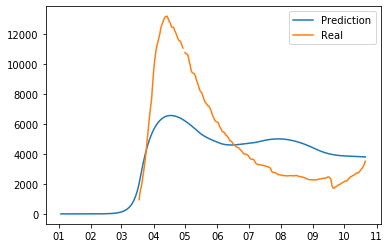

13579.54780383576
error_groups 2619.5162795359706
error_total 2192.0063048599577
mix_other: 0.1906691693827247 mix_leisure: 0.21110215354647677
{'work': 1.615371510383399, 'transport': 1.615371510383399, 'school': 1.615371510383399, 'other': 1.615371510383399, 'leisure': 1.615371510383399, 'home': 1.615371510383399}
[7.83082548e+01 1.61537151e+00 8.57618140e-01 1.90669169e-01
 2.11102154e-01 1.42543051e-03 1.55490127e-01 1.46137153e-01
 8.28445166e-01]


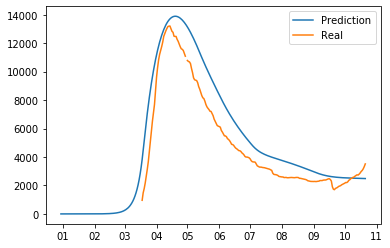

21076.45873862091
error_groups 3911.9124167115897
error_total 3432.9092643818635
mix_other: 0.5210003227941812 mix_leisure: 0.07022464418505725
{'work': 1.6407120567790794, 'transport': 1.6407120567790794, 'school': 1.6407120567790794, 'other': 1.6407120567790794, 'leisure': 1.6407120567790794, 'home': 1.6407120567790794}
[7.98411577e+01 1.64071206e+00 8.26600834e-01 5.21000323e-01
 7.02246442e-02 9.45941224e-02 2.88091914e-01 2.33557330e-02
 8.21896306e-01]


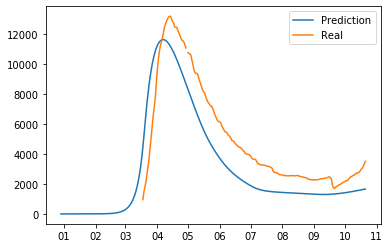

18956.1303993011
error_groups 3573.0533471960043
error_total 3076.615410421019
mix_other: 0.5282619649444497 mix_leisure: 0.73133240140405
{'work': 1.5890434137590885, 'transport': 1.5890434137590885, 'school': 1.5890434137590885, 'other': 1.5890434137590885, 'leisure': 1.5890434137590885, 'home': 1.5890434137590885}
[8.44539384e+01 1.58904341e+00 9.48620878e-01 5.28261965e-01
 7.31332401e-01 6.91442881e-02 4.78254322e-01 7.91236709e-02
 6.93788988e-01]
15503.02597695625
error_groups 3186.9547766793958
error_total 2463.214240055371
mix_other: 0.7289618760830704 mix_leisure: 0.024934544323829244
{'work': 1.4529610292888457, 'transport': 1.4529610292888457, 'school': 1.4529610292888457, 'other': 1.4529610292888457, 'leisure': 1.4529610292888457, 'home': 1.4529610292888457}
[8.30959230e+01 1.45296103e+00 9.89324084e-01 7.28961876e-01
 2.49345443e-02 8.32754481e-02 8.89173179e-01 6.70297450e-02
 7.12523318e-01]


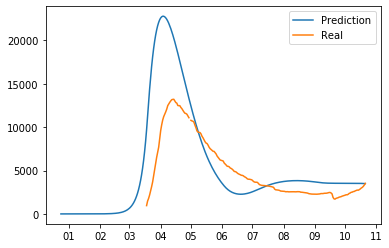

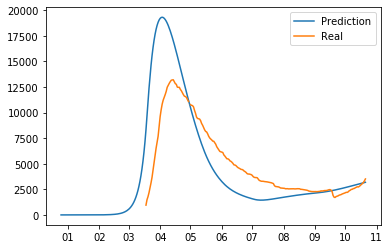

11959.98355478288
error_groups 2714.8378984879673
error_total 1849.0291312589825
mix_other: 0.6305019139497924 mix_leisure: 0.3638331925734468
{'work': 1.355085373716875, 'transport': 1.355085373716875, 'school': 1.355085373716875, 'other': 1.355085373716875, 'leisure': 1.355085373716875, 'home': 1.355085373716875}
[7.91393248e+01 1.35508537e+00 7.93324054e-01 6.30501914e-01
 3.63833193e-01 4.88640704e-02 1.03419447e-01 5.95365687e-02
 6.39452799e-01]
14791.670119442537
error_groups 2996.3969119154053
error_total 2359.054641505426
mix_other: 0.5343194465985847 mix_leisure: 0.3737502780414835
{'work': 1.8331153064875583, 'transport': 1.8331153064875583, 'school': 1.8331153064875583, 'other': 1.8331153064875583, 'leisure': 1.8331153064875583, 'home': 1.8331153064875583}
[83.50953044  1.83311531  0.96707544  0.53431945  0.37375028  0.08617206
  0.93886629  0.08409397  0.91984791]


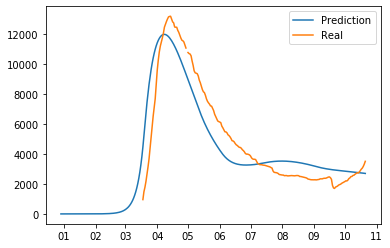

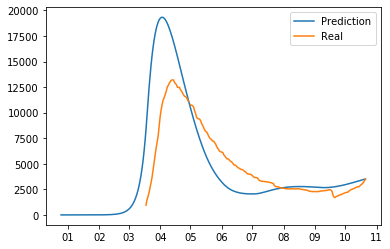

10050.906676031862
error_groups 2474.5885627672883
error_total 1515.2636226529148
mix_other: 0.2394787662929302 mix_leisure: 0.23278536493221746
{'work': 1.7568341828746794, 'transport': 1.7568341828746794, 'school': 1.7568341828746794, 'other': 1.7568341828746794, 'leisure': 1.7568341828746794, 'home': 1.7568341828746794}
[77.46413868  1.75683418  0.8456969   0.23947877  0.23278536  0.07868155
  0.63089174  0.09729218  0.65347082]


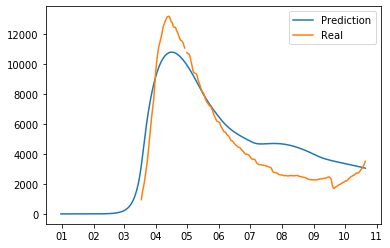

19592.218691073795
error_groups 3743.1266620189813
error_total 3169.8184058109628
mix_other: 0.7106777439592746 mix_leisure: 0.3951800914905115
{'work': 1.4293022913113702, 'transport': 1.4293022913113702, 'school': 1.4293022913113702, 'other': 1.4293022913113702, 'leisure': 1.4293022913113702, 'home': 1.4293022913113702}
[7.83883003e+01 1.42930229e+00 7.59550991e-01 7.10677744e-01
 3.95180091e-01 6.69361299e-02 7.68357826e-01 5.66721748e-02
 6.56672657e-01]


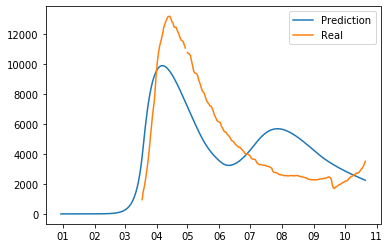

17094.571557864598
error_groups 3213.840566505969
error_total 2776.1461982717256
mix_other: 0.6724840222949663 mix_leisure: 0.3794044634315059
{'work': 1.6311371728205948, 'transport': 1.6311371728205948, 'school': 1.6311371728205948, 'other': 1.6311371728205948, 'leisure': 1.6311371728205948, 'home': 1.6311371728205948}
[78.83311298  1.63113717  0.82631664  0.67248402  0.37940446  0.07941385
  0.58329831  0.10147257  0.71362143]


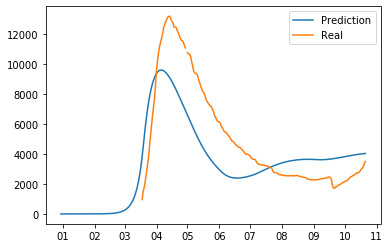

9055.517614596063
error_groups 2026.0307083703935
error_total 1405.897381245134
mix_other: 0.24498738127370756 mix_leisure: 0.1264368568007076
{'work': 1.6103658980433415, 'transport': 1.6103658980433415, 'school': 1.6103658980433415, 'other': 1.6103658980433415, 'leisure': 1.6103658980433415, 'home': 1.6103658980433415}
[7.95521121e+01 1.61036590e+00 9.23301261e-01 2.44987381e-01
 1.26436857e-01 7.58664369e-02 1.48067111e-01 5.72022960e-02
 6.18778839e-01]


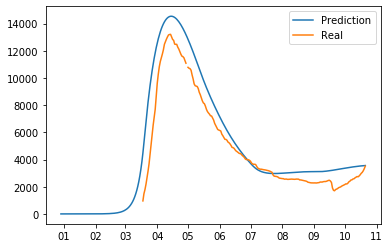

9254.331835286737
error_groups 2310.2006189274816
error_total 1388.8262432718511
mix_other: 0.3571100283269563 mix_leisure: 0.047179850764128284
{'work': 1.7030256615905475, 'transport': 1.7030256615905475, 'school': 1.7030256615905475, 'other': 1.7030256615905475, 'leisure': 1.7030256615905475, 'home': 1.7030256615905475}
[8.07393087e+01 1.70302566e+00 9.32314307e-01 3.57110028e-01
 4.71798508e-02 3.78666768e-05 5.76258126e-01 6.91089793e-02
 6.36779589e-01]


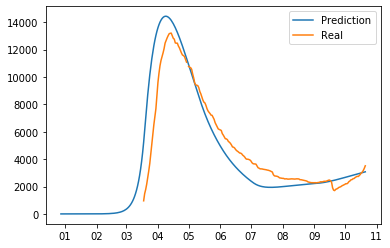

16940.308599557673
error_groups 3178.5748672607997
error_total 2752.346746459375
mix_other: 0.5774762255709391 mix_leisure: 0.11751493968940768
{'work': 1.7389316511699642, 'transport': 1.7389316511699642, 'school': 1.7389316511699642, 'other': 1.7389316511699642, 'leisure': 1.7389316511699642, 'home': 1.7389316511699642}
[7.97366769e+01 1.73893165e+00 9.23098353e-01 5.77476226e-01
 1.17514940e-01 2.50094591e-02 3.10562354e-01 8.41961121e-02
 7.29456629e-01]


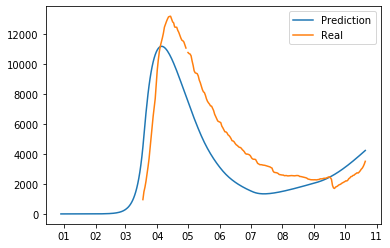

19541.43855584369
error_groups 3512.562069751365
15307.798822906967
error_total 3205.7752972184653
error_groups 3182.6372692003506
mix_other: 0.17665405683648605 mix_leisure: 0.05931173533169071
error_total 2425.0323107413233
{'work': 1.892844302041417, 'transport': 1.892844302041417, 'school': 1.892844302041417, 'other': 1.892844302041417, 'leisure': 1.892844302041417, 'home': 1.892844302041417}
mix_other: 0.6032377714976411 mix_leisure: 0.49393683507398123
[8.21695235e+01 1.89284430e+00 1.09020617e+00 1.76654057e-01
 5.93117353e-02 7.21638844e-02 9.85383723e-01 7.92123968e-02
 7.45219003e-01]{'work': 1.540709663244391, 'transport': 1.540709663244391, 'school': 1.540709663244391, 'other': 1.540709663244391, 'leisure': 1.540709663244391, 'home': 1.540709663244391}

[7.74641387e+01 1.54070966e+00 7.69729607e-01 6.03237771e-01
 4.93936835e-01 9.16494878e-02 2.17977773e-01 7.20137888e-02
 6.53470818e-01]


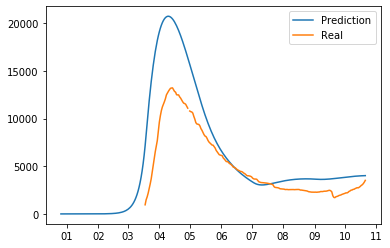

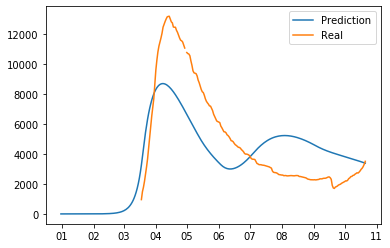

15055.478753002224
error_groups 3244.7401810860156
error_total 2362.1477143832417
mix_other: 0.7764030738550891 mix_leisure: 0.19974068569734715
{'work': 1.7342576574531061, 'transport': 1.7342576574531061, 'school': 1.7342576574531061, 'other': 1.7342576574531061, 'leisure': 1.7342576574531061, 'home': 1.7342576574531061}
[7.76070608e+01 1.73425766e+00 8.57780001e-01 7.76403074e-01
 1.99740686e-01 6.60344360e-02 4.50648413e-01 9.25886683e-02
 6.77150388e-01]


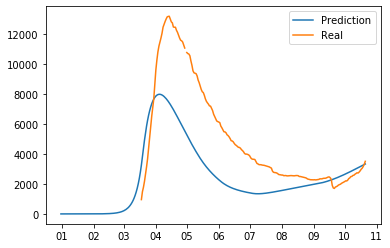

13165.583643855844
error_groups 3097.342587658571
error_total 2013.6482112394544
mix_other: 0.7963879458587942 mix_leisure: 0.2184032919896608
{'work': 1.0047681330373897, 'transport': 1.0047681330373897, 'school': 1.0047681330373897, 'other': 1.0047681330373897, 'leisure': 1.0047681330373897, 'home': 1.0047681330373897}
[7.70159559e+01 1.00476813e+00 7.70093351e-01 7.96387946e-01
 2.18403292e-01 5.25168670e-02 6.94652193e-02 1.01637764e-01
 5.76706530e-01]


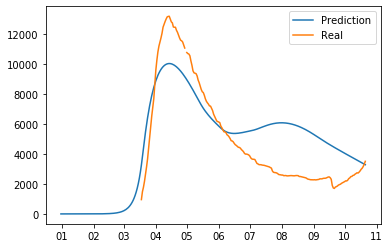

9997.530791555517
error_groups 2462.891199206697
error_total 1506.927918469764
mix_other: 0.2744842946369449 mix_leisure: 0.19807258266281375
{'work': 1.595842037592286, 'transport': 1.595842037592286, 'school': 1.595842037592286, 'other': 1.595842037592286, 'leisure': 1.595842037592286, 'home': 1.595842037592286}
[7.68243034e+01 1.59584204e+00 8.14057840e-01 2.74484295e-01
 1.98072583e-01 4.10544226e-02 1.54871240e-01 3.19919079e-02
 7.37488204e-01]


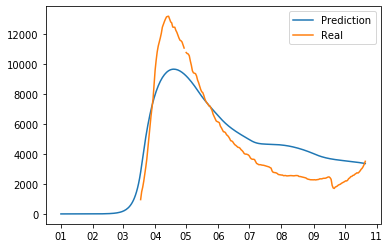

8425.603828748608
error_groups 2119.629862279822
error_total 1261.1947932937571
mix_other: 0.2969326676862316 mix_leisure: 0.18349950513715108
{'work': 1.6137622421989917, 'transport': 1.6137622421989917, 'school': 1.6137622421989917, 'other': 1.6137622421989917, 'leisure': 1.6137622421989917, 'home': 1.6137622421989917}
12978.676623285533
[8.07862528e+01 1.61376224e+00 9.11522776e-01 2.96932668e-01
 1.83499505e-01 2.32520777e-02 4.60924559e-01 3.34734904e-02
 7.94353997e-01]error_groups 2809.128333716202

error_total 2033.909657913866
mix_other: 0.5250123301084053 mix_leisure: 0.1773264710092628
{'work': 1.7936501190671965, 'transport': 1.7936501190671965, 'school': 1.7936501190671965, 'other': 1.7936501190671965, 'leisure': 1.7936501190671965, 'home': 1.7936501190671965}
[7.72103653e+01 1.79365012e+00 8.50775016e-01 5.25012330e-01
 1.77326471e-01 4.17041840e-02 3.87126718e-01 4.38300139e-02
 6.15526885e-01]


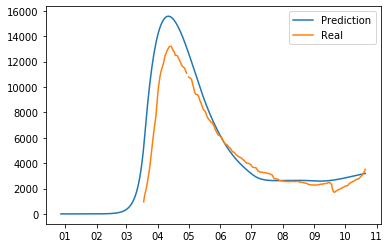

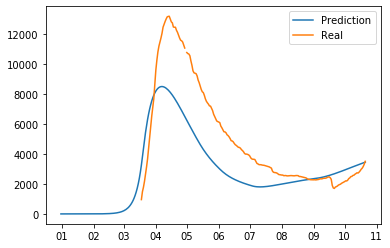

18264.17371134431
error_groups 3252.7259994681535
error_total 3002.2895423752316
mix_other: 0.22985967458448897 mix_leisure: 0.01773027221889656
{'work': 1.405234919419028, 'transport': 1.405234919419028, 'school': 1.405234919419028, 'other': 1.405234919419028, 'leisure': 1.405234919419028, 'home': 1.405234919419028}
9825.524484579902
[7.84033111e+01 1.40523492e+00 8.37103210e-01 2.29859675e-01
 1.77302722e-02 7.86812177e-02 2.92706922e-01 6.19719413e-02
 8.69835346e-01]error_groups 2398.204920014361

error_total 1485.4639129131085
mix_other: 0.27418036438156834 mix_leisure: 0.23415961849607592
{'work': 1.5893653118835311, 'transport': 1.5893653118835311, 'school': 1.5893653118835311, 'other': 1.5893653118835311, 'leisure': 1.5893653118835311, 'home': 1.5893653118835311}
[7.88697734e+01 1.58936531e+00 8.20222654e-01 2.74180364e-01
 2.34159618e-01 7.77612342e-02 4.20171003e-01 4.03231934e-02
 9.46347453e-01]


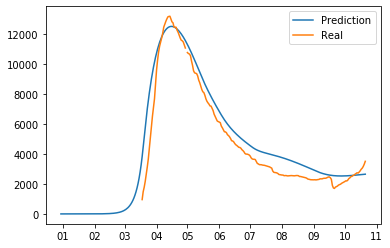

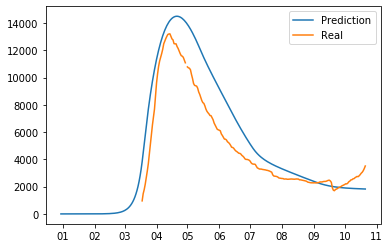

8092.170184591301
error_groups 2248.0529697724774
error_total 1168.8234429637648
mix_other: 0.3391685584912222 mix_leisure: 0.04645593140016102
19430.209301221934
{'work': 1.6137622421989917, 'transport': 1.6137622421989917, 'school': 1.6137622421989917, 'other': 1.6137622421989917, 'leisure': 1.6137622421989917, 'home': 1.6137622421989917}
[8.00203515e+01 1.61376224e+00 9.11522776e-01 3.39168558e-01
 4.64559314e-02 1.27288834e-02 1.61976038e-01 6.89087385e-03
 9.64025640e-01]
error_groups 3624.8101151183746
error_total 3161.079837220712
mix_other: 0.6303826515819686 mix_leisure: 0.023127066620168224
{'work': 1.5258627056435747, 'transport': 1.5258627056435747, 'school': 1.5258627056435747, 'other': 1.5258627056435747, 'leisure': 1.5258627056435747, 'home': 1.5258627056435747}
[7.74591173e+01 1.52586271e+00 7.97559684e-01 6.30382652e-01
 2.31270666e-02 7.81950926e-02 8.22274514e-02 1.65528762e-02
 6.48145533e-01]


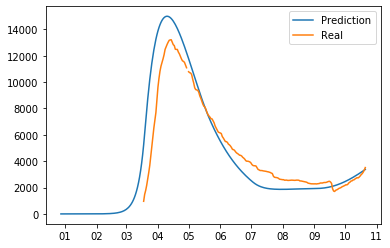

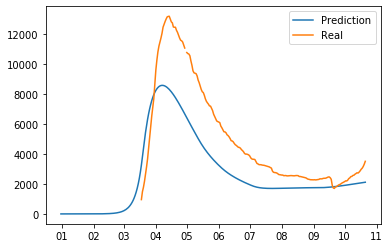

11338.756294956227
error_groups 2437.3320625494207
error_total 1780.2848464813612
mix_other: 0.41513273836946407 mix_leisure: 0.3527031575205877
{'work': 1.5945305392217244, 'transport': 1.5945305392217244, 'school': 1.5945305392217244, 'other': 1.5945305392217244, 'leisure': 1.5945305392217244, 'home': 1.5945305392217244}
[8.14735664e+01 1.59453054e+00 9.11461509e-01 4.15132738e-01
 3.52703158e-01 1.62984239e-02 9.51253061e-02 1.00018571e-01
 7.73968756e-01]
9713.0851255909
error_groups 2472.9638027148612
error_total 1448.0242645752076
mix_other: 0.5918144277049672 mix_leisure: 0.14351840280214057
{'work': 1.3240104677412865, 'transport': 1.3240104677412865, 'school': 1.3240104677412865, 'other': 1.3240104677412865, 'leisure': 1.3240104677412865, 'home': 1.3240104677412865}
[8.17933122e+01 1.32401047e+00 8.81982239e-01 5.91814428e-01
 1.43518403e-01 7.16057297e-02 4.90907763e-01 2.48048379e-02
 9.09369816e-01]


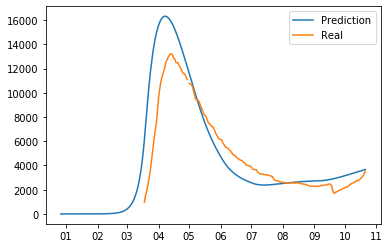

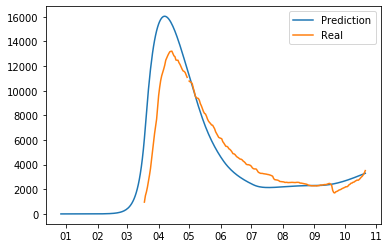

12390.51588054606
error_groups 2740.3517846009468
error_total 1930.0328191890223
mix_other: 0.404271396777085 mix_leisure: 0.06462341320637616
{'work': 1.6439599447957867, 'transport': 1.6439599447957867, 'school': 1.6439599447957867, 'other': 1.6439599447957867, 'leisure': 1.6439599447957867, 'home': 1.6439599447957867}
[7.68292374e+01 1.64395994e+00 7.95439775e-01 4.04271397e-01
 6.46234132e-02 9.71703919e-02 6.09964218e-01 6.27495984e-02
 7.18432281e-01]


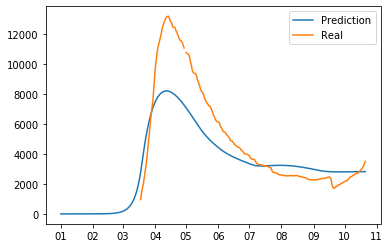

12289.495539480107
error_groups 2728.8308289267334
error_total 1912.1329421106748
mix_other: 0.3622870253415527 mix_leisure: 0.5260883375241083
{'work': 1.7431251364366196, 'transport': 1.7431251364366196, 'school': 1.7431251364366196, 'other': 1.7431251364366196, 'leisure': 1.7431251364366196, 'home': 1.7431251364366196}
[8.03364773e+01 1.74312514e+00 8.21409440e-01 3.62287025e-01
 5.26088338e-01 1.47129154e-02 1.96168655e-01 5.10321277e-03
 9.19911880e-01]


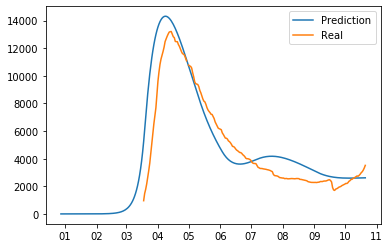

11811.399802533519
error_groups 2839.3796483756323
error_total 1794.404030831577
mix_other: 0.38026408131333 mix_leisure: 0.3363318702135448
{'work': 1.511510963205624, 'transport': 1.511510963205624, 'school': 1.511510963205624, 'other': 1.511510963205624, 'leisure': 1.511510963205624, 'home': 1.511510963205624}
[7.86251324e+01 1.51151096e+00 8.20962435e-01 3.80264081e-01
 3.36331870e-01 3.35315512e-02 6.42817884e-01 7.98043939e-02
 7.72694302e-01]


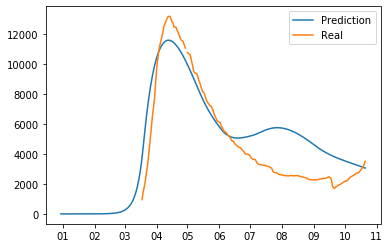

9786.61746987314
error_groups 2419.5841990156705
error_total 1473.4066541714938
mix_other: 0.2634096229606795 mix_leisure: 0.029114141633712398
{'work': 1.62774771715578, 'transport': 1.62774771715578, 'school': 1.62774771715578, 'other': 1.62774771715578, 'leisure': 1.62774771715578, 'home': 1.62774771715578}
[7.59796366e+01 1.62774772e+00 8.07330903e-01 2.63409623e-01
 2.91141416e-02 7.54833336e-02 1.87565671e-01 8.62902824e-02
 7.13691535e-01]


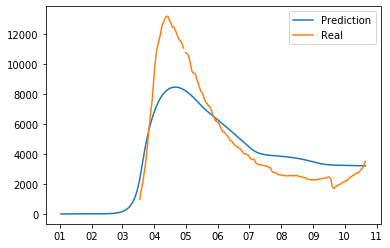

15872.7086924235
error_groups 3264.4679476980064
error_total 2521.648148945099
mix_other: 0.6569478851148274 mix_leisure: 0.16795580696930418
{'work': 1.4802204776121273, 'transport': 1.4802204776121273, 'school': 1.4802204776121273, 'other': 1.4802204776121273, 'leisure': 1.4802204776121273, 'home': 1.4802204776121273}
[7.81335646e+01 1.48022048e+00 7.81338658e-01 6.56947885e-01
 1.67955807e-01 5.25835889e-02 8.77644281e-02 1.39107036e-01
 9.66051080e-01]


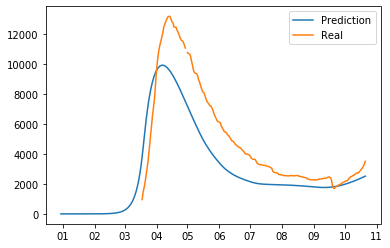

7022.239919363493
error_groups 2027.7282990877702
error_total 998.9023240551445
mix_other: 0.22537161903792874 mix_leisure: 0.18847983168373578
{'work': 1.8085401743674265, 'transport': 1.8085401743674265, 'school': 1.8085401743674265, 'other': 1.8085401743674265, 'leisure': 1.8085401743674265, 'home': 1.8085401743674265}
[7.90334402e+01 1.80854017e+00 8.93544433e-01 2.25371619e-01
 1.88479832e-01 1.63683280e-02 5.26404042e-01 1.01074783e-01
 8.86748056e-01]


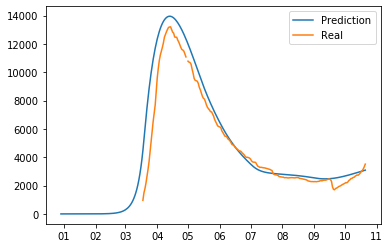

10490.200701043392
error_groups 2378.8816840413265
error_total 1622.2638034004128
mix_other: 0.2388474673954447 mix_leisure: 0.02647790094634228
{'work': 1.990346046754753, 'transport': 1.990346046754753, 'school': 1.990346046754753, 'other': 1.990346046754753, 'leisure': 1.990346046754753, 'home': 1.990346046754753}
9387.968447762547
error_groups 2111.832630276809
[7.58053199e+01 1.99034605e+00 8.37705527e-01 2.38847467e-01
 2.64779009e-02 4.40350580e-02 4.83707768e-01 9.02189744e-02
 8.20849943e-01]
error_total 1455.2271634971476
mix_other: 0.2088164801386827 mix_leisure: 0.18481470344141082
{'work': 1.7266181530288813, 'transport': 1.7266181530288813, 'school': 1.7266181530288813, 'other': 1.7266181530288813, 'leisure': 1.7266181530288813, 'home': 1.7266181530288813}
[7.96746711e+01 1.72661815e+00 9.20399652e-01 2.08816480e-01
 1.84814703e-01 1.66984704e-02 6.69347092e-01 6.91089793e-02
 7.52880830e-01]


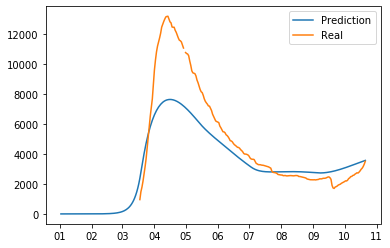

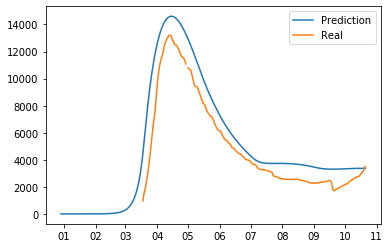

9701.174960861386
error_groups 2460.6937337551435
error_total 1448.0962454212486
mix_other: 0.21318665349789745 mix_leisure: 0.1775472812816289
{'work': 1.8907348316586563, 'transport': 1.8907348316586563, 'school': 1.8907348316586563, 'other': 1.8907348316586563, 'leisure': 1.8907348316586563, 'home': 1.8907348316586563}
[76.12698647  1.89073483  0.80371668  0.21318665  0.17754728  0.08575147
  0.54833493  0.15415901  0.96047765]


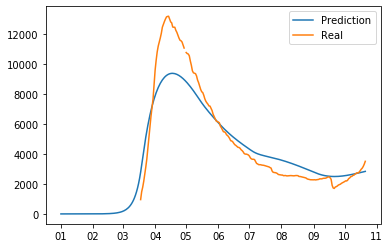

6342.7995317042005
error_groups 2075.0221661225146
error_total 853.5554731163373
mix_other: 0.23373948729354999 mix_leisure: 0.0043367421027813435
{'work': 1.874160580664924, 'transport': 1.874160580664924, 'school': 1.874160580664924, 'other': 1.874160580664924, 'leisure': 1.874160580664924, 'home': 1.874160580664924}
[7.83772734e+01 1.87416058e+00 9.03250847e-01 2.33739487e-01
 4.33674210e-03 3.31396462e-03 1.46643401e-01 6.36969362e-02
 7.58912325e-01]


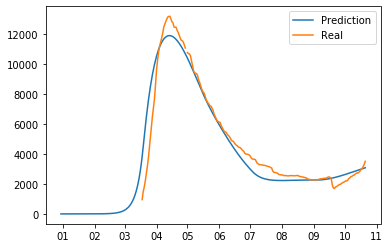

12193.960792727596
error_groups 2654.2070041473585
error_total 1907.9507577160475
mix_other: 0.3292807620561595 mix_leisure: 0.220083351548515
{'work': 1.7106295399849123, 'transport': 1.7106295399849123, 'school': 1.7106295399849123, 'other': 1.7106295399849123, 'leisure': 1.7106295399849123, 'home': 1.7106295399849123}
[7.92058613e+01 1.71062954e+00 8.98027728e-01 3.29280762e-01
 2.20083352e-01 2.58371228e-04 1.74149105e-01 2.48048379e-02
 8.23792794e-01]


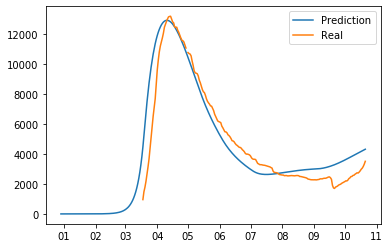

11057.892965745146
error_groups 2462.4501352065727
error_total 1719.0885661077145
mix_other: 0.21318665349789745 mix_leisure: 0.046609102092337706
{'work': 1.8670282692209375, 'transport': 1.8670282692209375, 'school': 1.8670282692209375, 'other': 1.8670282692209375, 'leisure': 1.8670282692209375, 'home': 1.8670282692209375}
[7.46761000e+01 1.86702827e+00 7.95355660e-01 2.13186653e-01
 4.66091021e-02 3.89139707e-04 2.37690350e-01 6.19267183e-02
 9.60477654e-01]


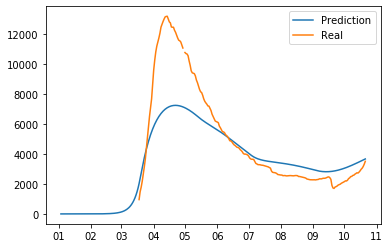

9222.778763170736
error_groups 2203.4232030060934
error_total 1403.8711120329285
mix_other: 0.20801034219976688 mix_leisure: 0.1513132511629901
{'work': 1.658303303816159, 'transport': 1.658303303816159, 'school': 1.658303303816159, 'other': 1.658303303816159, 'leisure': 1.658303303816159, 'home': 1.658303303816159}
[7.74724045e+01 1.65830330e+00 8.68860955e-01 2.08010342e-01
 1.51313251e-01 1.32535869e-02 6.72116839e-02 4.59455253e-02
 7.18780663e-01]


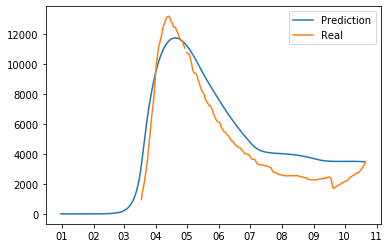

8638.863606305293
error_groups 2328.1522906464547
error_total 1262.1422631317678
mix_other: 0.30045258356995436 mix_leisure: 0.08454888601264321
{'work': 1.5258627056435747, 'transport': 1.5258627056435747, 'school': 1.5258627056435747, 'other': 1.5258627056435747, 'leisure': 1.5258627056435747, 'home': 1.5258627056435747}
[7.60761277e+01 1.52586271e+00 7.97559684e-01 3.00452584e-01
 8.45488860e-02 2.34178765e-02 9.05480525e-02 8.57625013e-02
 9.09909896e-01]


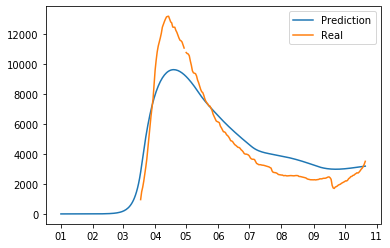

10715.928712680832
error_groups 2452.227300604767
error_total 1652.7402824152132
mix_other: 0.17515945413896694 mix_leisure: 0.20797921437364952
{'work': 1.8990282403613123, 'transport': 1.8990282403613123, 'school': 1.8990282403613123, 'other': 1.8990282403613123, 'leisure': 1.8990282403613123, 'home': 1.8990282403613123}
[7.53247702e+01 1.89902824e+00 8.26798796e-01 1.75159454e-01
 2.07979214e-01 3.37300989e-02 1.54320324e-01 1.19270106e-01
 7.39452806e-01]


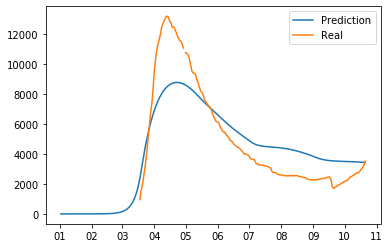

8816.508812854647
error_groups 2306.2215572926716
error_total 1302.057451112395
mix_other: 0.3928644565863708 mix_leisure: 0.06691711585337573
{'work': 1.3881720055644384, 'transport': 1.3881720055644384, 'school': 1.3881720055644384, 'other': 1.3881720055644384, 'leisure': 1.3881720055644384, 'home': 1.3881720055644384}
[7.81149827e+01 1.38817201e+00 8.51439616e-01 3.92864457e-01
 6.69171159e-02 3.02635308e-03 2.06601000e-01 4.45997147e-02
 8.18150290e-01]


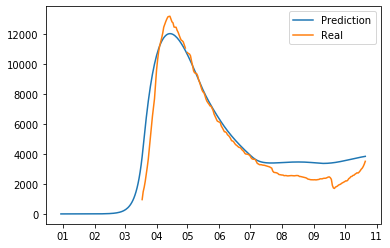

10255.503956713324
error_groups 2323.1202340910577
error_total 1586.4767445244534
mix_other: 0.28315723970175144 mix_leisure: 0.06075662341716659
{'work': 1.9990699026283956, 'transport': 1.9990699026283956, 'school': 1.9990699026283956, 'other': 1.9990699026283956, 'leisure': 1.9990699026283956, 'home': 1.9990699026283956}
[8.09120647e+01 1.99906990e+00 9.73685404e-01 2.83157240e-01
 6.07566234e-02 7.84489385e-03 7.06516462e-01 1.35760674e-01
 8.09036130e-01]
9980.783757125579
error_groups 2592.165732103692
error_total 1477.7236050043773
mix_other: 0.4415225995210743 mix_leisure: 0.020469715842451497
{'work': 1.6282891060327733, 'transport': 1.6282891060327733, 'school': 1.6282891060327733, 'other': 1.6282891060327733, 'leisure': 1.6282891060327733, 'home': 1.6282891060327733}
[7.78345167e+01 1.62828911e+00 8.20704896e-01 4.41522600e-01
 2.04697158e-02 5.09262168e-02 6.85396476e-02 4.38300139e-02
 9.14825900e-01]


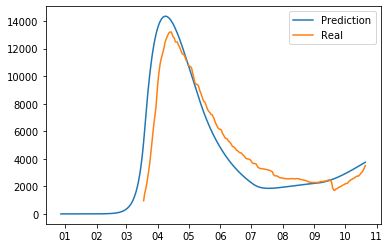

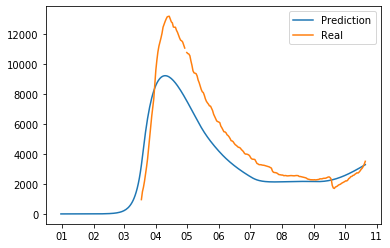

8998.259182588048
error_groups 2177.1874293528026
error_total 1364.214350647049
mix_other: 0.2115673551467364 mix_leisure: 0.26138460671157954
{'work': 1.7158996540413742, 'transport': 1.7158996540413742, 'school': 1.7158996540413742, 'other': 1.7158996540413742, 'leisure': 1.7158996540413742, 'home': 1.7158996540413742}
[78.48324151  1.71589965  0.87500512  0.21156736  0.26138461  0.08822183
  0.21016557  0.10498181  0.61428611]
6577.699391400169
error_groups 2091.297385009327
error_total 897.2804012781683
mix_other: 0.236347130564996 mix_leisure: 0.1667526605837194
{'work': 1.8943586077211614, 'transport': 1.8943586077211614, 'school': 1.8943586077211614, 'other': 1.8943586077211614, 'leisure': 1.8943586077211614, 'home': 1.8943586077211614}
[7.79551921e+01 1.89435861e+00 8.47388282e-01 2.36347131e-01
 1.66752661e-01 1.07057580e-02 5.84952728e-01 2.86162976e-03
 9.01525506e-01]
9219.910691350458
error_groups 2229.515607415996
error_total 1398.0790167868927
mix_other: 0.32669666892608

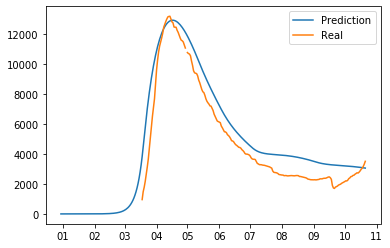

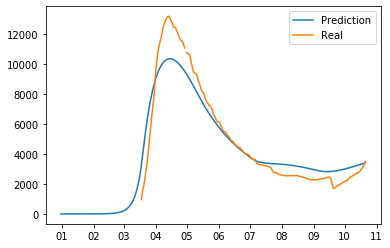

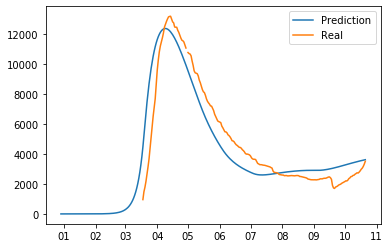

11103.144561605193
error_groups 2435.8481663713937
error_total 1733.45927904676
mix_other: 0.1578561270318669 mix_leisure: 0.03296569033966368
{'work': 1.9734651782516663, 'transport': 1.9734651782516663, 'school': 1.9734651782516663, 'other': 1.9734651782516663, 'leisure': 1.9734651782516663, 'home': 1.9734651782516663}
[7.76596834e+01 1.97346518e+00 9.33346670e-01 1.57856127e-01
 3.29656903e-02 5.09693309e-02 3.78818752e-02 6.46317599e-02
 6.21081020e-01]


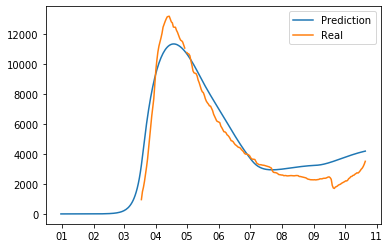

8653.329158124568
error_groups 2124.6337143808587
error_total 1305.7390887487418
mix_other: 0.32468559200181746 mix_leisure: 0.042975263139772846
{'work': 1.6752969855865114, 'transport': 1.6752969855865114, 'school': 1.6752969855865114, 'other': 1.6752969855865114, 'leisure': 1.6752969855865114, 'home': 1.6752969855865114}
[8.06744359e+01 1.67529699e+00 9.40154478e-01 3.24685592e-01
 4.29752631e-02 5.84206601e-02 6.73903262e-01 4.94902106e-02
 7.48135892e-01]


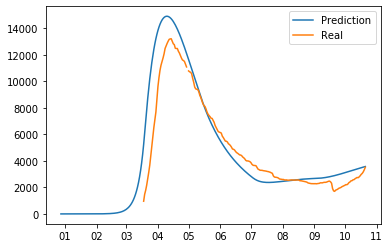

5592.245979108891
error_groups 1937.7540791089664
error_total 730.8983799999851
mix_other: 0.2099343342042167 mix_leisure: 0.0002669869119196755
{'work': 1.8705947337862203, 'transport': 1.8705947337862203, 'school': 1.8705947337862203, 'other': 1.8705947337862203, 'leisure': 1.8705947337862203, 'home': 1.8705947337862203}
[7.81335646e+01 1.87059473e+00 8.95644257e-01 2.09934334e-01
 2.66986912e-04 3.74145043e-02 1.76647486e-02 1.26438206e-01
 9.84343985e-01]


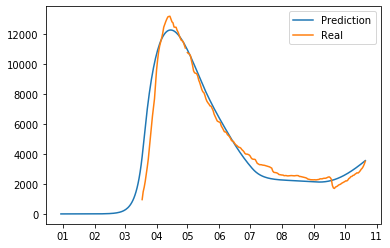

9284.15722468911
error_groups 2066.196506201064
error_total 1443.5921436976091
mix_other: 0.20665037089461008 mix_leisure: 0.03166554059608534
{'work': 1.5743508905046477, 'transport': 1.5743508905046477, 'school': 1.5743508905046477, 'other': 1.5743508905046477, 'leisure': 1.5743508905046477, 'home': 1.5743508905046477}
[7.91247206e+01 1.57435089e+00 9.33015538e-01 2.06650371e-01
 3.16655406e-02 5.47691697e-02 1.93337786e-01 1.37848972e-01
 8.00578313e-01]


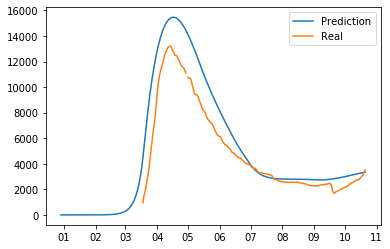

8919.058252435156
error_groups 2306.7880113782085
error_total 1322.4540482113896
mix_other: 0.24330525057764157 mix_leisure: 0.3601589577472384
{'work': 1.903887068580881, 'transport': 1.903887068580881, 'school': 1.903887068580881, 'other': 1.903887068580881, 'leisure': 1.903887068580881, 'home': 1.903887068580881}
[7.75067390e+01 1.90388707e+00 8.18944410e-01 2.43305251e-01
 3.60158958e-01 3.39929255e-02 8.45829356e-02 3.23870501e-02
 9.32544773e-01]


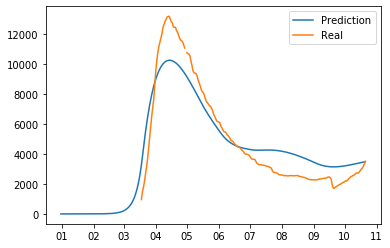

6112.144401862308
error_groups 2092.294199506705
error_total 803.9700404711207
mix_other: 0.2465247504934983 mix_leisure: 0.028236417995237906
{'work': 1.8897037881483865, 'transport': 1.8897037881483865, 'school': 1.8897037881483865, 'other': 1.8897037881483865, 'leisure': 1.8897037881483865, 'home': 1.8897037881483865}
[7.80125935e+01 1.88970379e+00 8.85416970e-01 2.46524750e-01
 2.82364180e-02 4.81191780e-02 1.70224963e-01 3.93306992e-02
 9.64301300e-01]
6834.105773669061
error_groups 2120.041051121104
error_total 942.8129445095915
mix_other: 0.32333600219523007 mix_leisure: 0.10043784718263615
{'work': 1.6038377692395223, 'transport': 1.6038377692395223, 'school': 1.6038377692395223, 'other': 1.6038377692395223, 'leisure': 1.6038377692395223, 'home': 1.6038377692395223}
[7.79750493e+01 1.60383777e+00 8.41062739e-01 3.23336002e-01
 1.00437847e-01 5.49142538e-03 4.24898667e-02 6.16019827e-02
 5.95579521e-01]


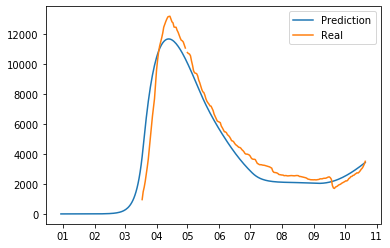

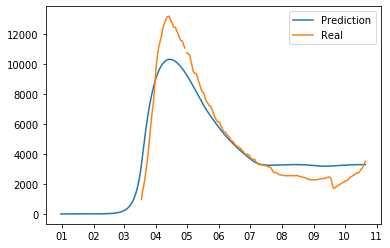

9641.154471682174
error_groups 2263.4732576018214
error_total 1475.5362428160706
mix_other: 0.2643226151229201 mix_leisure: 0.024331060333711352
{'work': 1.5914176024754356, 'transport': 1.5914176024754356, 'school': 1.5914176024754356, 'other': 1.5914176024754356, 'leisure': 1.5914176024754356, 'home': 1.5914176024754356}
[7.89679386e+01 1.59141760e+00 8.92880941e-01 2.64322615e-01
 2.43310603e-02 7.94705719e-02 1.60593666e-02 7.96868488e-02
 8.62207152e-01]


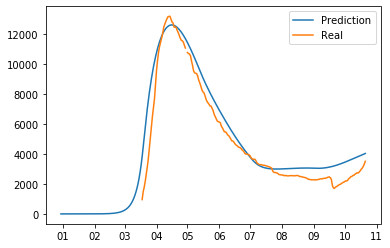

9554.397430227029
error_groups 2369.517424078692
error_total 1436.9760012296672
mix_other: 0.35270893483128785 mix_leisure: 0.040373652415464534
{'work': 1.5743508905046477, 'transport': 1.5743508905046477, 'school': 1.5743508905046477, 'other': 1.5743508905046477, 'leisure': 1.5743508905046477, 'home': 1.5743508905046477}
[8.14617418e+01 1.57435089e+00 9.33015538e-01 3.52708935e-01
 4.03736524e-02 6.15923213e-02 8.69592681e-01 1.17262107e-01
 9.78873040e-01]


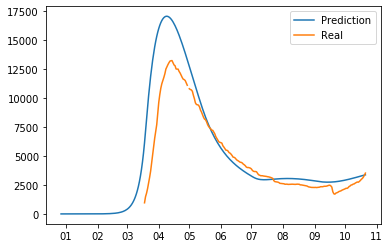

10192.203014502813
error_groups 2368.65930668233
error_total 1564.7087415640967
mix_other: 0.1403771029222074 mix_leisure: 0.025314942529221174
{'work': 1.931758599420096, 'transport': 1.931758599420096, 'school': 1.931758599420096, 'other': 1.931758599420096, 'leisure': 1.931758599420096, 'home': 1.931758599420096}
[7.79203629e+01 1.93175860e+00 8.64605768e-01 1.40377103e-01
 2.53149425e-02 2.19069454e-04 6.42817884e-01 1.58887763e-01
 9.59185637e-01]
8198.925355448437
error_groups 2196.5225413372664
error_total 1200.480562822234
mix_other: 0.3238358182935667 mix_leisure: 0.05425877266226503
{'work': 1.6734501093277017, 'transport': 1.6734501093277017, 'school': 1.6734501093277017, 'other': 1.6734501093277017, 'leisure': 1.6734501093277017, 'home': 1.6734501093277017}
[8.07393087e+01 1.67345011e+00 9.15569694e-01 3.23835818e-01
 5.42587727e-02 9.12115231e-02 8.84647532e-01 6.91089793e-02
 9.40350814e-01]


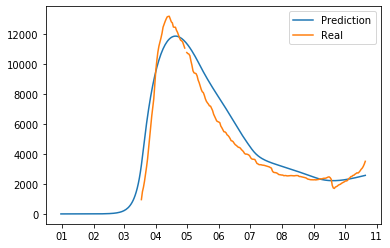

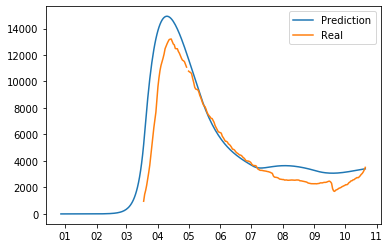

8549.001915125491
error_groups 2198.4647105628355
error_total 1270.107440912531
mix_other: 0.38277582863325016 mix_leisure: 0.2197448646993776
{'work': 1.6363204197754717, 'transport': 1.6363204197754717, 'school': 1.6363204197754717, 'other': 1.6363204197754717, 'leisure': 1.6363204197754717, 'home': 1.6363204197754717}
[8.00611569e+01 1.63632042e+00 8.86545303e-01 3.82775829e-01
 2.19744865e-01 3.08349552e-02 1.57556560e-01 3.30543571e-02
 9.45703767e-01]


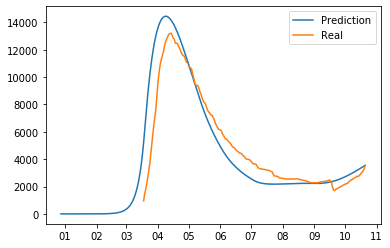

7719.289248938765
error_groups 2074.888962459862
error_total 1128.8800572957807
mix_other: 0.19640953977716652 mix_leisure: 0.07827192413719175
{'work': 1.7577908443862476, 'transport': 1.7577908443862476, 'school': 1.7577908443862476, 'other': 1.7577908443862476, 'leisure': 1.7577908443862476, 'home': 1.7577908443862476}
[7.76940756e+01 1.75779084e+00 8.76895822e-01 1.96409540e-01
 7.82719241e-02 7.08759994e-03 5.02896716e-01 1.70487116e-01
 6.60831347e-01]


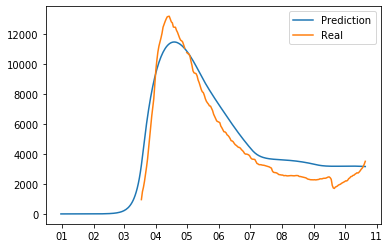

8328.100183516724
error_groups 2383.8422339586787
error_total 1188.8515899116092
mix_other: 0.34724743458883467 mix_leisure: 0.015551994338616648
{'work': 1.773116907547129, 'transport': 1.773116907547129, 'school': 1.773116907547129, 'other': 1.773116907547129, 'leisure': 1.773116907547129, 'home': 1.773116907547129}
[7.86914215e+01 1.77311691e+00 8.55975520e-01 3.47247435e-01
 1.55519943e-02 5.71249404e-02 5.75220545e-01 9.95659364e-02
 9.63405080e-01]


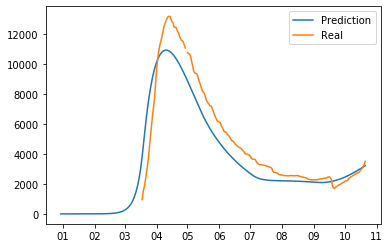

7140.482397289837
error_groups 1946.752547874492
error_total 1038.745969883069
mix_other: 0.26090318393250994 mix_leisure: 0.03722809507285002
{'work': 1.6137622421989917, 'transport': 1.6137622421989917, 'school': 1.6137622421989917, 'other': 1.6137622421989917, 'leisure': 1.6137622421989917, 'home': 1.6137622421989917}
[7.94809498e+01 1.61376224e+00 9.11522776e-01 2.60903184e-01
 3.72280951e-02 1.27288834e-02 1.61976038e-01 7.90583599e-02
 7.58802160e-01]


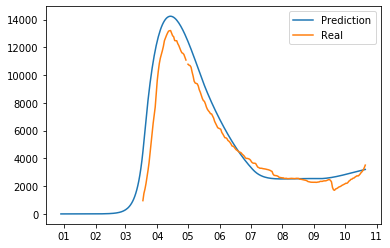

8183.252706361606
error_groups 2023.075399488588
error_total 1232.0354613746035
mix_other: 0.2185317223437545 mix_leisure: 0.03431424044961029
{'work': 1.7157846274960904, 'transport': 1.7157846274960904, 'school': 1.7157846274960904, 'other': 1.7157846274960904, 'leisure': 1.7157846274960904, 'home': 1.7157846274960904}
[7.93365656e+01 1.71578463e+00 9.27768407e-01 2.18531722e-01
 3.43142404e-02 6.90189163e-02 1.98035932e-01 1.57244892e-01
 7.32598501e-01]
9913.749101217349
error_groups 2567.2529528082923
error_total 1469.2992296818113
mix_other: 0.38972454962798286 mix_leisure: 0.0019424045045565719
{'work': 1.719227799491051, 'transport': 1.719227799491051, 'school': 1.719227799491051, 'other': 1.719227799491051, 'leisure': 1.719227799491051, 'home': 1.719227799491051}
[7.98417479e+01 1.71922780e+00 8.86102872e-01 3.89724550e-01
 1.94240450e-03 6.97870809e-03 6.40142382e-02 1.70279962e-01
 9.34718060e-01]
8293.788599416148
error_groups 2234.53033292178
error_total 1211.8516532988735

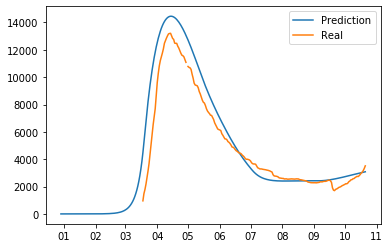

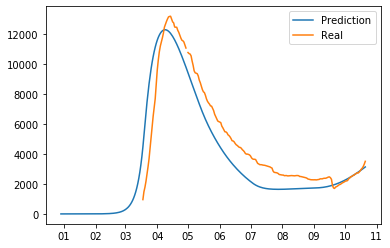

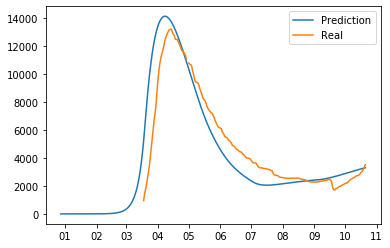

6169.279292826577
error_groups 1924.1275736759462
error_total 849.0303438301262
mix_other: 0.2472623648615031 mix_leisure: 0.06195156752464298
{'work': 1.7880919012778071, 'transport': 1.7880919012778071, 'school': 1.7880919012778071, 'other': 1.7880919012778071, 'leisure': 1.7880919012778071, 'home': 1.7880919012778071}
[7.99817977e+01 1.78809190e+00 9.16489823e-01 2.47262365e-01
 6.19515675e-02 5.55789369e-02 7.28389931e-01 8.18858273e-03
 8.46516236e-01]


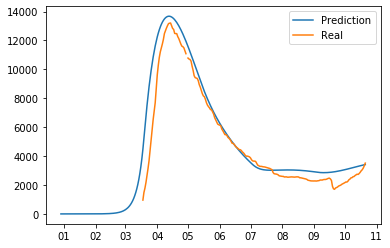

7097.600730647846
error_groups 2112.9591790342115
error_total 996.928310322727
mix_other: 0.203511883465269 mix_leisure: 0.20966838697260898
{'work': 1.870700809801436, 'transport': 1.870700809801436, 'school': 1.870700809801436, 'other': 1.870700809801436, 'leisure': 1.870700809801436, 'home': 1.870700809801436}
[7.73466400e+01 1.87070081e+00 8.46986625e-01 2.03511883e-01
 2.09668387e-01 7.24072229e-02 2.88505490e-02 7.82418560e-02
 8.28445166e-01]


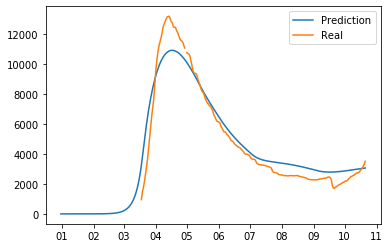

8312.270342270274
error_groups 2097.8228746955742
error_total 1242.88949351494
mix_other: 0.2394787662929302 mix_leisure: 0.07541384120149708
{'work': 1.9745130823741883, 'transport': 1.9745130823741883, 'school': 1.9745130823741883, 'other': 1.9745130823741883, 'leisure': 1.9745130823741883, 'home': 1.9745130823741883}
[7.74641387e+01 1.97451308e+00 8.92594792e-01 2.39478766e-01
 7.54138412e-02 4.31948416e-02 3.02452519e-01 9.50216818e-02
 6.15565637e-01]


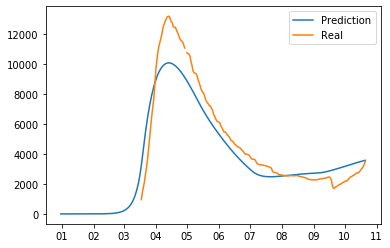

6681.063588325463
error_groups 1918.992199003238
error_total 952.4142778644449
mix_other: 0.26446192200279484 mix_leisure: 0.034797968373421306
{'work': 1.6802196403001222, 'transport': 1.6802196403001222, 'school': 1.6802196403001222, 'other': 1.6802196403001222, 'leisure': 1.6802196403001222, 'home': 1.6802196403001222}
[7.94650851e+01 1.68021964e+00 9.20463709e-01 2.64461922e-01
 3.47979684e-02 2.42102914e-02 2.45579097e-01 1.16321073e-02
 7.75816355e-01]


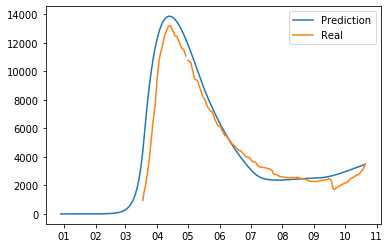

7236.29075209959
error_groups 2117.9989510461
error_total 1023.6583602106979
mix_other: 0.28694824023171817 mix_leisure: 0.19899966389680734
{'work': 1.933338886115721, 'transport': 1.933338886115721, 'school': 1.933338886115721, 'other': 1.933338886115721, 'leisure': 1.933338886115721, 'home': 1.933338886115721}
[7.92180875e+01 1.93333889e+00 9.11929843e-01 2.86948240e-01
 1.98999664e-01 1.32328965e-02 5.25790283e-01 1.18985870e-01
 5.83615199e-01]


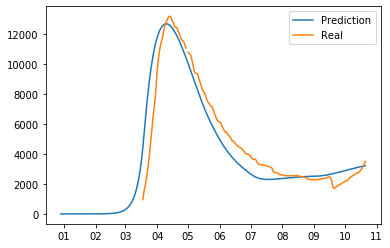

9414.934797671402
error_groups 2265.246092557347
error_total 1429.937741022811
mix_other: 0.16674793252188025 mix_leisure: 0.012802182753193225
{'work': 1.9006282391334848, 'transport': 1.9006282391334848, 'school': 1.9006282391334848, 'other': 1.9006282391334848, 'leisure': 1.9006282391334848, 'home': 1.9006282391334848}
[7.70339006e+01 1.90062824e+00 8.80579067e-01 1.66747933e-01
 1.28021828e-02 2.33178451e-02 7.22695044e-01 1.18250578e-01
 8.11081639e-01]


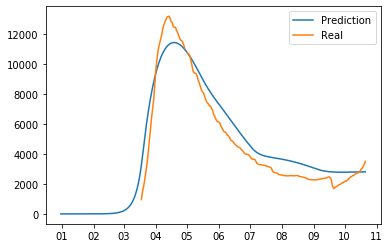

6265.836284272059
error_groups 2025.3197789008457
error_total 848.1033010742427
mix_other: 0.2002592506206572 mix_leisure: 0.18008205637925856
{'work': 1.9425759871386012, 'transport': 1.9425759871386012, 'school': 1.9425759871386012, 'other': 1.9425759871386012, 'leisure': 1.9425759871386012, 'home': 1.9425759871386012}
[7.77485243e+01 1.94257599e+00 8.67257889e-01 2.00259251e-01
 1.80082056e-01 1.02346831e-02 3.89475973e-01 7.22476698e-02
 7.11539866e-01]


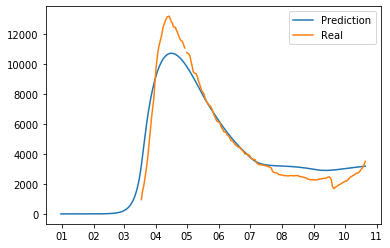

5769.355935586655
error_groups 1891.160136913748
error_total 775.6391597345813
mix_other: 0.19818732986536403 mix_leisure: 0.00900942161525814
{'work': 1.8436674322791045, 'transport': 1.8436674322791045, 'school': 1.8436674322791045, 'other': 1.8436674322791045, 'leisure': 1.8436674322791045, 'home': 1.8436674322791045}
[7.87382759e+01 1.84366743e+00 9.19252742e-01 1.98187330e-01
 9.00942162e-03 3.31517088e-02 1.16690880e-01 7.60372530e-02
 6.24062154e-01]


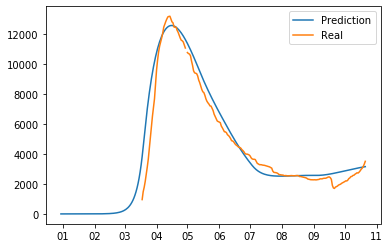

7005.594969210492
error_groups 2205.969021030781
error_total 959.9251896359424
mix_other: 0.28988963575771604 mix_leisure: 0.041031905939736435
{'work': 1.857586791038496, 'transport': 1.857586791038496, 'school': 1.857586791038496, 'other': 1.857586791038496, 'leisure': 1.857586791038496, 'home': 1.857586791038496}
[7.83424538e+01 1.85758679e+00 8.78595270e-01 2.89889636e-01
 4.10319059e-02 4.66006234e-02 3.86184108e-01 1.25797811e-01
 9.23672308e-01]


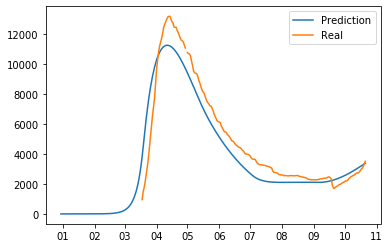

5900.325044890382
error_groups 2057.355702267173
7071.5700047496875
error_groups 2174.5311295860874
error_total 768.5938685246417
error_total 979.4077750327201
mix_other: 0.2747184548496072 mix_leisure: 0.11821899048210621
{'work': 1.7147710369311402, 'transport': 1.7147710369311402, 'school': 1.7147710369311402, 'other': 1.7147710369311402, 'leisure': 1.7147710369311402, 'home': 1.7147710369311402}
mix_other: 0.37300520165098483 mix_leisure: 0.0198648658126927
[7.74299817e+01 1.71477104e+00 8.31158043e-01 2.74718455e-01
 1.18218990e-01 2.49943590e-02 2.88766047e-01 1.39167665e-01
 9.44841553e-01]{'work': 1.4289508428747135, 'transport': 1.4289508428747135, 'school': 1.4289508428747135, 'other': 1.4289508428747135, 'leisure': 1.4289508428747135, 'home': 1.4289508428747135}

[7.91292246e+01 1.42895084e+00 8.54772732e-01 3.73005202e-01
 1.98648658e-02 5.13371545e-02 1.67555814e-02 5.04713594e-02
 9.68723853e-01]


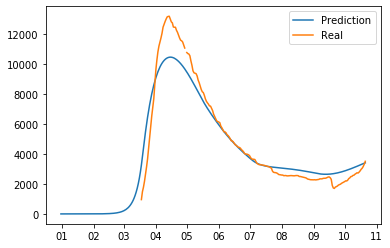

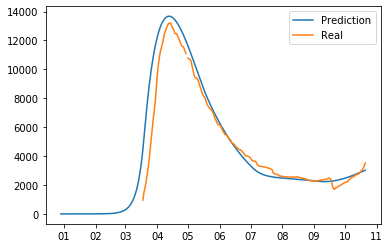

7696.821800543141
error_groups 2247.9666414554695
error_total 1089.7710318175343
mix_other: 0.2834728391834088 mix_leisure: 0.012802182753193225
{'work': 1.7008982502718015, 'transport': 1.7008982502718015, 'school': 1.7008982502718015, 'other': 1.7008982502718015, 'leisure': 1.7008982502718015, 'home': 1.7008982502718015}
[7.70339006e+01 1.70089825e+00 8.48268540e-01 2.83472839e-01
 1.28021828e-02 2.33178451e-02 7.22695044e-01 1.15311558e-01
 8.57906080e-01]


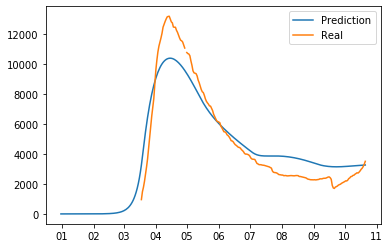

6330.433603141815
error_groups 1842.0507683614674
error_total 897.6765669560696
mix_other: 0.18099873960776414 mix_leisure: 0.002734725767670254
{'work': 1.8461623597267909, 'transport': 1.8461623597267909, 'school': 1.8461623597267909, 'other': 1.8461623597267909, 'leisure': 1.8461623597267909, 'home': 1.8461623597267909}
5984.929194115794
[7.89681580e+01 1.84616236e+00 9.28970720e-01 1.80998740e-01
 2.73472577e-03 2.24078897e-02 2.33897349e-01 1.41147320e-01
 7.47008163e-01]error_groups 2056.3517393335187
error_total 785.7154909564551

mix_other: 0.34169436342841053 mix_leisure: 0.08103437399940938
{'work': 1.6734742541651348, 'transport': 1.6734742541651348, 'school': 1.6734742541651348, 'other': 1.6734742541651348, 'leisure': 1.6734742541651348, 'home': 1.6734742541651348}
[7.99457112e+01 1.67347425e+00 8.82670334e-01 3.41694363e-01
 8.10343740e-02 3.00313757e-02 6.45135740e-01 7.60176070e-02
 8.76983845e-01]


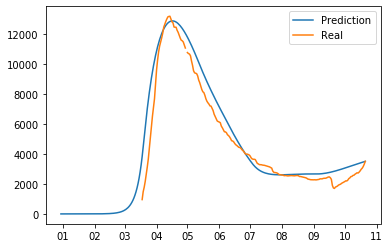

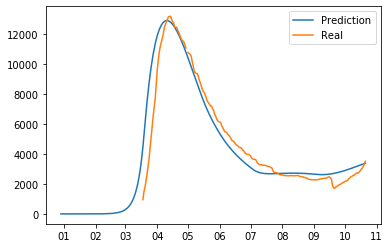

6399.373593307942
error_groups 2023.6809030164618
error_total 875.1385380582963
mix_other: 0.26675546740919687 mix_leisure: 0.07886117939997017
{'work': 1.874160580664924, 'transport': 1.874160580664924, 'school': 1.874160580664924, 'other': 1.874160580664924, 'leisure': 1.874160580664924, 'home': 1.874160580664924}
[7.87222509e+01 1.87416058e+00 9.03250847e-01 2.66755467e-01
 7.88611794e-02 5.54634539e-02 1.46643401e-01 8.91064771e-02
 5.41833096e-01]


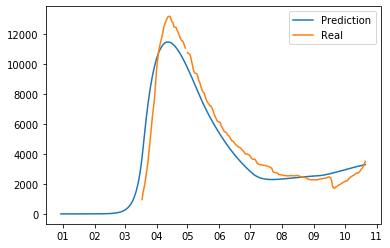

9295.65884849301
error_groups 2149.702068859286
error_total 1429.191355926745
mix_other: 0.1816286023702468 mix_leisure: 0.04172218346144185
{'work': 1.914132265902514, 'transport': 1.914132265902514, 'school': 1.914132265902514, 'other': 1.914132265902514, 'leisure': 1.914132265902514, 'home': 1.914132265902514}
[7.98702627e+01 1.91413227e+00 9.43981607e-01 1.81628602e-01
 4.17221835e-02 2.65212037e-03 6.32734007e-01 1.12544355e-01
 5.97736145e-01]


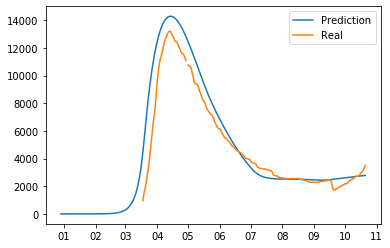

5900.407916451364
error_groups 1958.9633180217616
error_total 788.2889196859205
mix_other: 0.2042793505145486 mix_leisure: 0.03210676342478491
{'work': 1.803201791966364, 'transport': 1.803201791966364, 'school': 1.803201791966364, 'other': 1.803201791966364, 'leisure': 1.803201791966364, 'home': 1.803201791966364}
[7.70309690e+01 1.80320179e+00 8.72206721e-01 2.04279351e-01
 3.21067634e-02 1.50142634e-02 5.49539813e-01 1.67958148e-01
 8.56244412e-01]


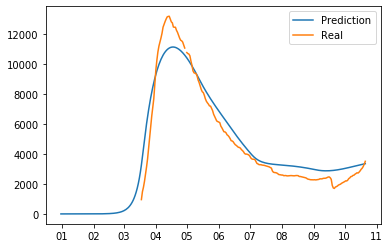

6675.1271513793145
error_groups 2122.0111975493683
error_total 910.6231907659893
mix_other: 0.4098451452733839 mix_leisure: 0.05167179127861199
{'work': 1.5422619647944322, 'transport': 1.5422619647944322, 'school': 1.5422619647944322, 'other': 1.5422619647944322, 'leisure': 1.5422619647944322, 'home': 1.5422619647944322}
[7.91223968e+01 1.54226196e+00 8.83206423e-01 4.09845145e-01
 5.16717913e-02 4.12581027e-02 3.18568208e-01 6.01079360e-02
 6.82590245e-01]


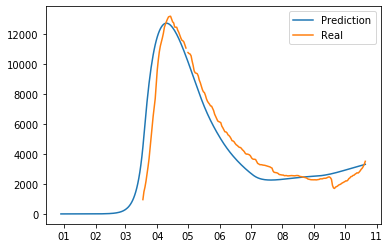

5924.426546516093
error_groups 1952.0225945825125
error_total 794.4807903867162
mix_other: 0.19103229207600336 mix_leisure: 0.09713377591733718
{'work': 1.807944101367239, 'transport': 1.807944101367239, 'school': 1.807944101367239, 'other': 1.807944101367239, 'leisure': 1.807944101367239, 'home': 1.807944101367239}
[7.81355098e+01 1.80794410e+00 8.84296387e-01 1.91032292e-01
 9.71337759e-02 2.50594239e-02 9.77152475e-02 1.34586665e-01
 9.28538761e-01]


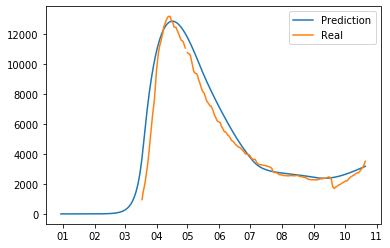

9063.739540696693
error_groups 2196.1110710828075
error_total 1373.5256939227772
mix_other: 0.23151809375265175 mix_leisure: 0.0680764499485983
{'work': 1.7069958160146999, 'transport': 1.7069958160146999, 'school': 1.7069958160146999, 'other': 1.7069958160146999, 'leisure': 1.7069958160146999, 'home': 1.7069958160146999}
[7.84099602e+01 1.70699582e+00 9.07386037e-01 2.31518094e-01
 6.80764499e-02 3.34258341e-02 4.59240492e-01 1.27113442e-01
 7.48135892e-01]


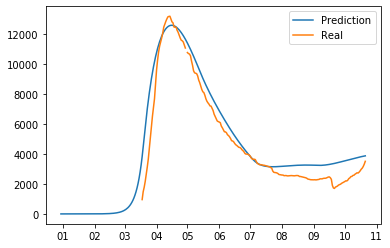

6914.348333026117
error_groups 1922.4534089940505
error_total 998.3789848064132
mix_other: 0.18448658195139478 mix_leisure: 0.011464217272079025
{'work': 1.9470753488336092, 'transport': 1.9470753488336092, 'school': 1.9470753488336092, 'other': 1.9470753488336092, 'leisure': 1.9470753488336092, 'home': 1.9470753488336092}
[7.98393146e+01 1.94707535e+00 9.49141660e-01 1.84486582e-01
 1.14642173e-02 2.90260629e-02 7.81505396e-01 9.76770574e-02
 8.11976067e-01]


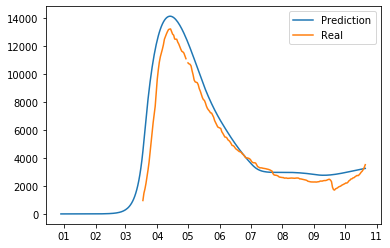

5906.734740904279
error_groups 1991.5158710140038
error_total 783.043773978055
mix_other: 0.184761603002501 mix_leisure: 0.17126162918913623
{'work': 1.8677135301532473, 'transport': 1.8677135301532473, 'school': 1.8677135301532473, 'other': 1.8677135301532473, 'leisure': 1.8677135301532473, 'home': 1.8677135301532473}
[77.27528096  1.86771353  0.84878893  0.1847616   0.17126163  0.0949535
  0.38136871  0.1188352   0.96621309]


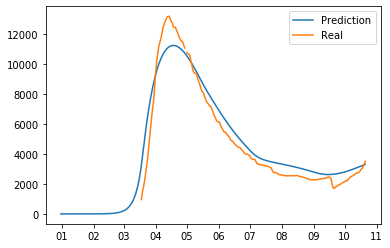

5279.681782469917
error_groups 1847.4441394937503
error_total 686.4475285952334
mix_other: 0.22724050201001378 mix_leisure: 0.049613024416582774
{'work': 1.7389405552146944, 'transport': 1.7389405552146944, 'school': 1.7389405552146944, 'other': 1.7389405552146944, 'leisure': 1.7389405552146944, 'home': 1.7389405552146944}
[7.83994019e+01 1.73894056e+00 8.87777132e-01 2.27240502e-01
 4.96130244e-02 1.77050407e-02 2.23439146e-02 1.21788360e-01
 8.98535291e-01]


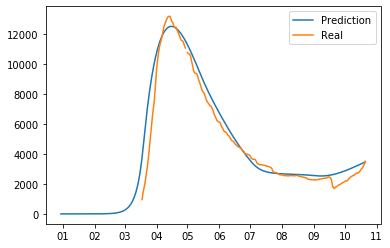

5413.010963256546
error_groups 1796.678229998632
error_total 723.2665466515829
mix_other: 0.1718797405852734 mix_leisure: 0.1401561709080602
{'work': 1.935735816513013, 'transport': 1.935735816513013, 'school': 1.935735816513013, 'other': 1.935735816513013, 'leisure': 1.935735816513013, 'home': 1.935735816513013}
[7.85204342e+01 1.93573582e+00 9.16533005e-01 1.71879741e-01
 1.40156171e-01 4.86356093e-02 1.74409917e-01 1.04938797e-01
 7.02876725e-01]


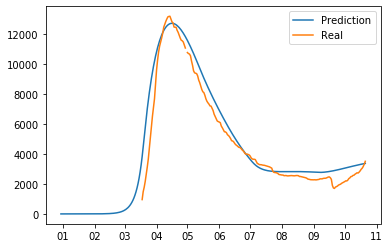

4924.14843160842
error_groups 1897.0832849179626
error_total 605.4130293380914
mix_other: 0.1965770691862937 mix_leisure: 0.053156019708213376
{'work': 1.8919204852263896, 'transport': 1.8919204852263896, 'school': 1.8919204852263896, 'other': 1.8919204852263896, 'leisure': 1.8919204852263896, 'home': 1.8919204852263896}
[7.80590209e+01 1.89192049e+00 9.05061577e-01 1.96577069e-01
 5.31560197e-02 5.56844302e-02 7.06441609e-02 9.39106969e-02
 8.41942680e-01]


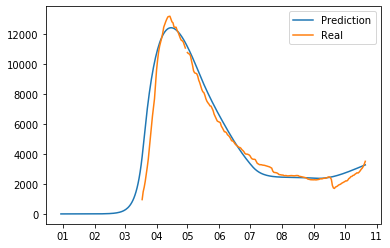

6492.16926190962
error_groups 2072.5964306394517
error_total 883.9145662540337
mix_other: 0.18122556573585913 mix_leisure: 0.035811242832043566
{'work': 1.9833986368414087, 'transport': 1.9833986368414087, 'school': 1.9833986368414087, 'other': 1.9833986368414087, 'leisure': 1.9833986368414087, 'home': 1.9833986368414087}
[7.74175465e+01 1.98339864e+00 8.76307293e-01 1.81225566e-01
 3.58112428e-02 8.41846620e-02 6.52985523e-01 1.39341242e-01
 8.75076042e-01]


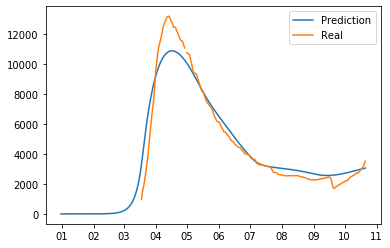

6800.693322216228
error_groups 1987.4411094451582
error_total 962.650442554214
mix_other: 0.22662491517916972 mix_leisure: 0.07681519240535278
{'work': 1.831233226818279, 'transport': 1.831233226818279, 'school': 1.831233226818279, 'other': 1.831233226818279, 'leisure': 1.831233226818279, 'home': 1.831233226818279}
[7.73671851e+01 1.83123323e+00 8.78698891e-01 2.26624915e-01
 7.68151924e-02 4.26480906e-02 2.36150912e-01 1.98062997e-01
 7.10328665e-01]


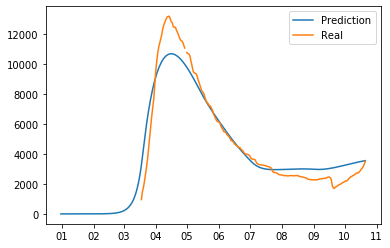

5808.32792878367
error_groups 1990.3857602474227
error_total 763.5884337072495
mix_other: 0.2570406420915555 mix_leisure: 0.151146119032664
{'work': 1.7608860739290249, 'transport': 1.7608860739290249, 'school': 1.7608860739290249, 'other': 1.7608860739290249, 'leisure': 1.7608860739290249, 'home': 1.7608860739290249}
[7.87715560e+01 1.76088607e+00 8.76483400e-01 2.57040642e-01
 1.51146119e-01 2.72611554e-02 2.78381486e-01 3.68050335e-02
 6.54177703e-01]


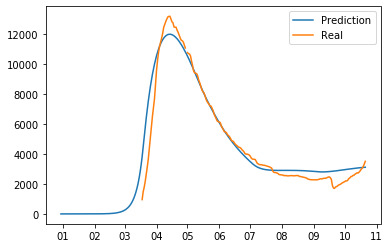

6780.0445625867815
error_groups 1904.173220095406
error_total 975.1742684982752
mix_other: 0.14194636237169456 mix_leisure: 0.014227585660797126
{'work': 1.913763203675113, 'transport': 1.913763203675113, 'school': 1.913763203675113, 'other': 1.913763203675113, 'leisure': 1.913763203675113, 'home': 1.913763203675113}
[7.71212960e+01 1.91376320e+00 9.12990114e-01 1.41946362e-01
 1.42275857e-02 5.15956891e-03 4.39516080e-01 1.13169338e-01
 6.46451085e-01]


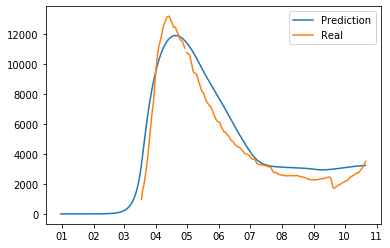

5074.16768681161
error_groups 1924.2455364366167
error_total 629.9844300749987
mix_other: 0.1922613011372043 mix_leisure: 0.060251549779885116
{'work': 1.8537845983798178, 'transport': 1.8537845983798178, 'school': 1.8537845983798178, 'other': 1.8537845983798178, 'leisure': 1.8537845983798178, 'home': 1.8537845983798178}
[7.77622564e+01 1.85378460e+00 8.68404815e-01 1.92261301e-01
 6.02515498e-02 5.85721126e-02 1.31863077e-02 1.74156413e-01
 9.00952420e-01]


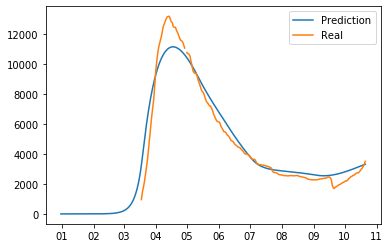

6462.468514036121
error_groups 2103.648781261508
error_total 871.7639465549225
mix_other: 0.3645907159564038 mix_leisure: 0.11437136836335937
{'work': 1.4488354383361868, 'transport': 1.4488354383361868, 'school': 1.4488354383361868, 'other': 1.4488354383361868, 'leisure': 1.4488354383361868, 'home': 1.4488354383361868}
[7.80419543e+01 1.44883544e+00 8.43025888e-01 3.64590716e-01
 1.14371368e-01 2.41003553e-02 2.44174185e-01 1.87454744e-02
 6.89300740e-01]


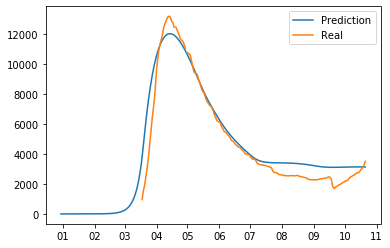

5803.282781841522
error_groups 1998.8528726951656
error_total 760.8859818292713
mix_other: 0.294145053343275 mix_leisure: 0.09671509683528856
{'work': 1.688329615623151, 'transport': 1.688329615623151, 'school': 1.688329615623151, 'other': 1.688329615623151, 'leisure': 1.688329615623151, 'home': 1.688329615623151}
[7.86555207e+01 1.68832962e+00 8.70194198e-01 2.94145053e-01
 9.67150968e-02 3.74250890e-02 2.54538786e-01 8.57625013e-02
 7.22628944e-01]
6217.545924794857
error_groups 2008.920483210542
error_total 841.7250883168629
mix_other: 0.269701608326978 mix_leisure: 0.1312888559459574
{'work': 1.8048674433892786, 'transport': 1.8048674433892786, 'school': 1.8048674433892786, 'other': 1.8048674433892786, 'leisure': 1.8048674433892786, 'home': 1.8048674433892786}
[7.89930731e+01 1.80486744e+00 8.83390063e-01 2.69701608e-01
 1.31288856e-01 7.90104916e-02 3.28411490e-02 1.60779537e-01
 6.14681924e-01]


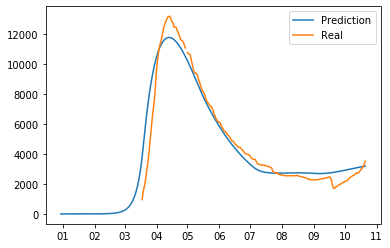

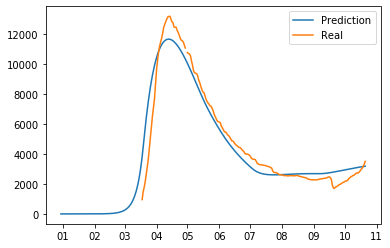

5472.3173659616405
error_groups 1999.3154982463923
error_total 694.6003735430497
mix_other: 0.26139167874005237 mix_leisure: 0.06447498046879219
{'work': 1.8133048186022847, 'transport': 1.8133048186022847, 'school': 1.8133048186022847, 'other': 1.8133048186022847, 'leisure': 1.8133048186022847, 'home': 1.8133048186022847}
[7.86914215e+01 1.81330482e+00 8.86763523e-01 2.61391679e-01
 6.44749805e-02 2.71616195e-02 2.60864189e-02 3.83088367e-02
 8.08622035e-01]


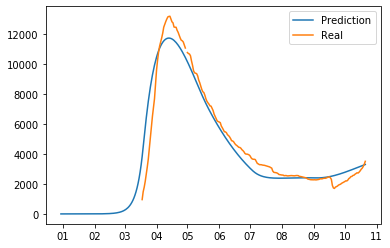

5242.979711383669
error_groups 2022.5263321964155
error_total 644.0906758374507
mix_other: 0.23440603139125687 mix_leisure: 0.0019291592757345044
{'work': 1.8296600110166366, 'transport': 1.8296600110166366, 'school': 1.8296600110166366, 'other': 1.8296600110166366, 'leisure': 1.8296600110166366, 'home': 1.8296600110166366}
[7.78815858e+01 1.82966001e+00 8.61376395e-01 2.34406031e-01
 1.92915928e-03 3.78880736e-02 2.99045762e-01 1.30543869e-01
 9.31578065e-01]
5407.536083837992
error_groups 1917.784949871141
error_total 697.9502267933702
mix_other: 0.2070413320445723 mix_leisure: 0.03423463886562711
{'work': 1.9021798679031987, 'transport': 1.9021798679031987, 'school': 1.9021798679031987, 'other': 1.9021798679031987, 'leisure': 1.9021798679031987, 'home': 1.9021798679031987}
[7.77068895e+01 1.90217987e+00 8.84274543e-01 2.07041332e-01
 3.42346389e-02 6.22813439e-02 1.42548847e-01 6.60237597e-02
 7.87421263e-01]


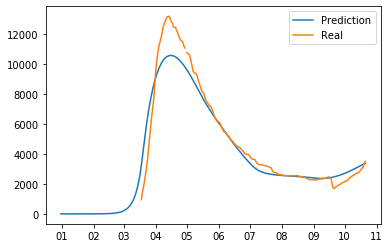

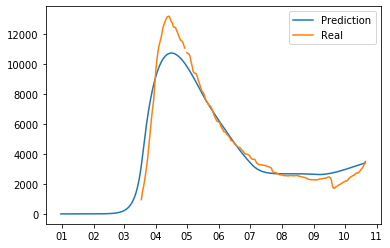

4787.206086087029
error_groups 1924.617586485342
error_total 572.5176999203373
mix_other: 0.28237272367510924 mix_leisure: 0.08441545013897783
{'work': 1.6656604621690523, 'transport': 1.6656604621690523, 'school': 1.6656604621690523, 'other': 1.6656604621690523, 'leisure': 1.6656604621690523, 'home': 1.6656604621690523}
[7.80503059e+01 1.66566046e+00 8.73383242e-01 2.82372724e-01
 8.44154501e-02 3.95561190e-02 1.59256737e-01 5.55278061e-02
 7.63996540e-01]


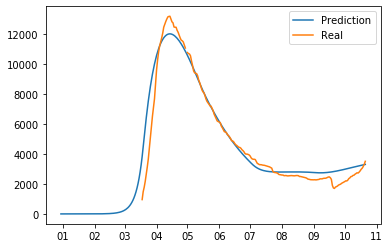

5982.063995589417
error_groups 1916.3649814410294
error_total 813.1398028296775
mix_other: 0.17230405057274084 mix_leisure: 0.14211151629049573
{'work': 1.9122212673419958, 'transport': 1.9122212673419958, 'school': 1.9122212673419958, 'other': 1.9122212673419958, 'leisure': 1.9122212673419958, 'home': 1.9122212673419958}
[7.74839086e+01 1.91222127e+00 8.87305074e-01 1.72304051e-01
 1.42111516e-01 3.16859241e-02 1.89424728e-01 1.02595847e-01
 6.43694849e-01]


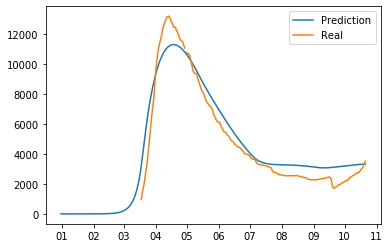

6387.243700870375
error_groups 2074.9789738480367
error_total 862.4529454044675
mix_other: 0.22415196640748292 mix_leisure: 0.0046070209553562
{'work': 1.9210353190434222, 'transport': 1.9210353190434222, 'school': 1.9210353190434222, 'other': 1.9210353190434222, 'leisure': 1.9210353190434222, 'home': 1.9210353190434222}
[7.85207880e+01 1.92103532e+00 9.19309100e-01 2.24151966e-01
 4.60702096e-03 3.87456001e-02 8.19473672e-01 4.10906038e-02
 6.13147693e-01]


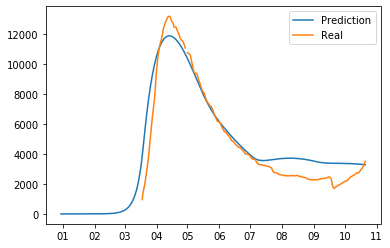

5547.607975239691
error_groups 1905.8152593234697
error_total 728.3585431832443
mix_other: 0.18605715312129195 mix_leisure: 0.09174710948116171
{'work': 1.8765717849682204, 'transport': 1.8765717849682204, 'school': 1.8765717849682204, 'other': 1.8765717849682204, 'leisure': 1.8765717849682204, 'home': 1.8765717849682204}
[7.72902479e+01 1.87657178e+00 8.80250228e-01 1.86057153e-01
 9.17471095e-02 6.39692244e-02 4.31081739e-02 9.29854664e-02
 7.57571023e-01]


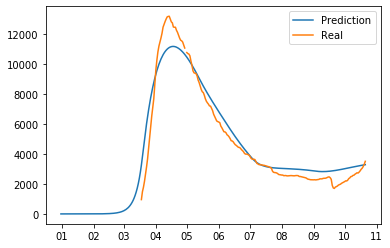

5106.103816167346
error_groups 1920.5102771468437
error_total 637.1187078041004
mix_other: 0.27398545586706 mix_leisure: 0.06447498046879219
{'work': 1.710278947652353, 'transport': 1.710278947652353, 'school': 1.710278947652353, 'other': 1.710278947652353, 'leisure': 1.710278947652353, 'home': 1.710278947652353}
[7.86914215e+01 1.71027895e+00 8.86763523e-01 2.73985456e-01
 6.44749805e-02 5.77913710e-02 9.75871045e-02 6.51214347e-03
 6.40977575e-01]


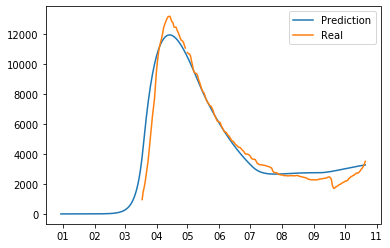

5727.592385705104
error_groups 2054.244215184512
error_total 734.6696341041184
mix_other: 0.2920676903564505 mix_leisure: 0.06888663733656247
{'work': 1.723859393061248, 'transport': 1.723859393061248, 'school': 1.723859393061248, 'other': 1.723859393061248, 'leisure': 1.723859393061248, 'home': 1.723859393061248}
[7.80547537e+01 1.72385939e+00 8.59341052e-01 2.92067690e-01
 6.88866373e-02 2.78026322e-03 1.67030608e-01 8.69647978e-02
 9.72873576e-01]


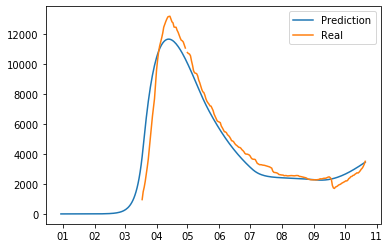

6209.43969631819
error_groups 2011.2523280262708
error_total 839.6374736583837
mix_other: 0.30517549802894633 mix_leisure: 0.14744223152825126
{'work': 1.582294972563708, 'transport': 1.582294972563708, 'school': 1.582294972563708, 'other': 1.582294972563708, 'leisure': 1.582294972563708, 'home': 1.582294972563708}
[7.80740312e+01 1.58229497e+00 8.60641916e-01 3.05175498e-01
 1.47442232e-01 8.56478631e-02 2.21177044e-01 6.83511386e-02
 7.83249798e-01]


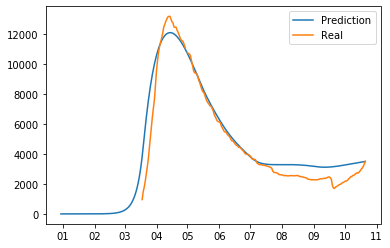

5201.158758893808
error_groups 1919.2992557854634
error_total 656.371900621669
mix_other: 0.2049425256381897 mix_leisure: 0.08024915297375723
{'work': 1.8901876493156922, 'transport': 1.8901876493156922, 'school': 1.8901876493156922, 'other': 1.8901876493156922, 'leisure': 1.8901876493156922, 'home': 1.8901876493156922}
[7.70722746e+01 1.89018765e+00 8.80587013e-01 2.04942526e-01
 8.02491530e-02 5.85713618e-02 7.79561877e-03 6.07020728e-02
 7.24852662e-01]


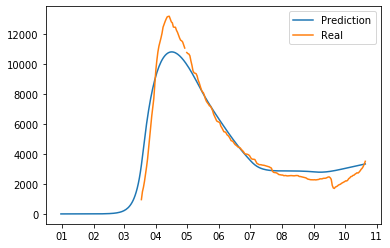

5551.835372503604
error_groups 1904.0177538536407
error_total 729.5635237299927
mix_other: 0.272031955324384 mix_leisure: 0.0650853035321951
{'work': 1.6530890582409425, 'transport': 1.6530890582409425, 'school': 1.6530890582409425, 'other': 1.6530890582409425, 'leisure': 1.6530890582409425, 'home': 1.6530890582409425}
[7.83452604e+01 1.65308906e+00 8.87807348e-01 2.72031955e-01
 6.50853035e-02 3.31749608e-03 1.40183882e-01 1.34651249e-02
 6.60831347e-01]


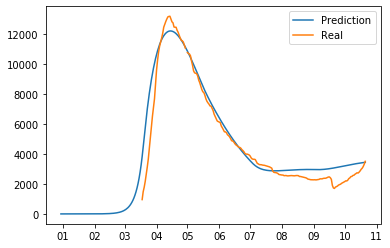

4746.374064815811
error_groups 1867.664913765481
error_total 575.741830210066
mix_other: 0.2294906408941464 mix_leisure: 0.10205483684818967
{'work': 1.7534295079434203, 'transport': 1.7534295079434203, 'school': 1.7534295079434203, 'other': 1.7534295079434203, 'leisure': 1.7534295079434203, 'home': 1.7534295079434203}
[7.81588805e+01 1.75342951e+00 8.85802441e-01 2.29490641e-01
 1.02054837e-01 3.76475995e-02 4.69217389e-02 8.36052260e-02
 8.16266953e-01]


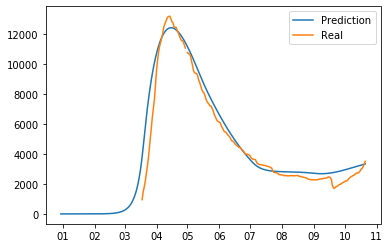

5535.906172901939
error_groups 1990.231121107849
error_total 709.1350103588179
mix_other: 0.24659591193470998 mix_leisure: 0.12197303598163922
{'work': 1.678643367216897, 'transport': 1.678643367216897, 'school': 1.678643367216897, 'other': 1.678643367216897, 'leisure': 1.678643367216897, 'home': 1.678643367216897}
[7.89983415e+01 1.67864337e+00 8.56519321e-01 2.46595912e-01
 1.21973036e-01 1.95883685e-02 1.47326256e-01 1.76850868e-02
 9.51291248e-01]


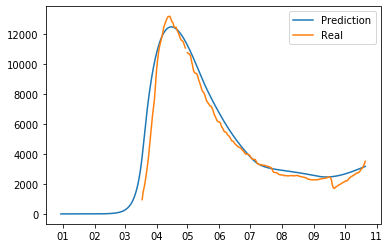

5296.985274069249
error_groups 1983.3657173822967
error_total 662.7239113373904
mix_other: 0.2853049846912362 mix_leisure: 0.15807281411627294
{'work': 1.6421627807751982, 'transport': 1.6421627807751982, 'school': 1.6421627807751982, 'other': 1.6421627807751982, 'leisure': 1.6421627807751982, 'home': 1.6421627807751982}
[7.80932803e+01 1.64216278e+00 8.57098296e-01 2.85304985e-01
 1.58072814e-01 3.42557647e-02 2.98440446e-01 1.11459229e-01
 8.08649860e-01]


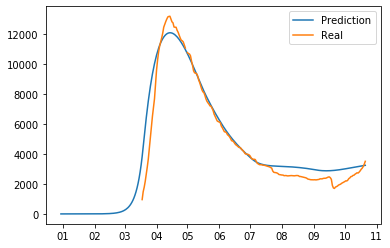

5396.165604835285
error_groups 2010.8186643838758
error_total 677.069388090282
mix_other: 0.28713807842185474 mix_leisure: 0.11533216635235083
{'work': 1.6579059233113047, 'transport': 1.6579059233113047, 'school': 1.6579059233113047, 'other': 1.6579059233113047, 'leisure': 1.6579059233113047, 'home': 1.6579059233113047}
[7.87083045e+01 1.65790592e+00 8.56525950e-01 2.87138078e-01
 1.15332166e-01 3.70586785e-02 3.02583982e-01 7.85177781e-02
 8.51946095e-01]


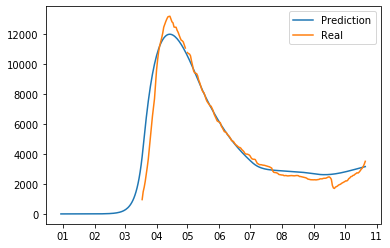

5764.588731362432
error_groups 2029.3089924527414
error_total 747.055947781938
mix_other: 0.27687835942151573 mix_leisure: 0.1475233462519452
{'work': 1.723859393061248, 'transport': 1.723859393061248, 'school': 1.723859393061248, 'other': 1.723859393061248, 'leisure': 1.723859393061248, 'home': 1.723859393061248}
[7.80547537e+01 1.72385939e+00 8.59341052e-01 2.76878359e-01
 1.47523346e-01 2.32978457e-02 1.67030608e-01 5.41040734e-02
 8.29790811e-01]


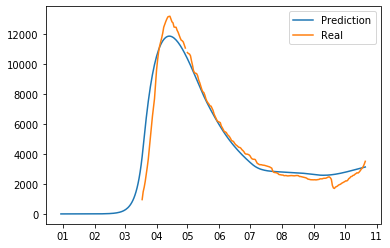

5422.9445743660535
error_groups 1953.3949532052377
error_total 693.9099242321631
mix_other: 0.21603083395005795 mix_leisure: 0.07237292404984352
{'work': 1.874829927274305, 'transport': 1.874829927274305, 'school': 1.874829927274305, 'other': 1.874829927274305, 'leisure': 1.874829927274305, 'home': 1.874829927274305}
[7.70981097e+01 1.87482993e+00 8.74646807e-01 2.16030834e-01
 7.23729240e-02 3.62064617e-02 4.13022980e-02 1.01692356e-01
 7.54859823e-01]


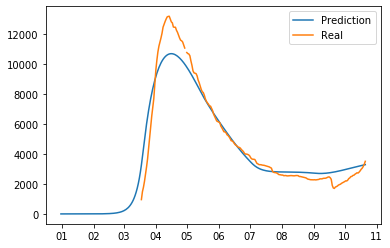

4896.515002140124
error_groups 1929.7735618665502
error_total 593.3482880547148
mix_other: 0.27515379600768863 mix_leisure: 0.05999254121713271
{'work': 1.662693625060098, 'transport': 1.662693625060098, 'school': 1.662693625060098, 'other': 1.662693625060098, 'leisure': 1.662693625060098, 'home': 1.662693625060098}
[7.82804980e+01 1.66269363e+00 8.73778556e-01 2.75153796e-01
 5.99925412e-02 1.63769794e-02 1.93337786e-01 7.89947242e-02
 8.00578313e-01]


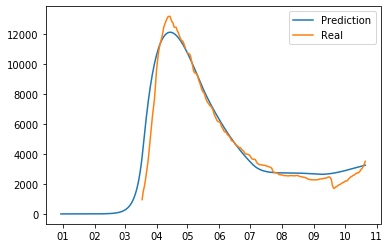

4554.114304472388
error_groups 1928.9550988343556
error_total 525.0318411276064
mix_other: 0.22653709094873992 mix_leisure: 0.0008009192650925145
{'work': 1.8008994843704904, 'transport': 1.8008994843704904, 'school': 1.8008994843704904, 'other': 1.8008994843704904, 'leisure': 1.8008994843704904, 'home': 1.8008994843704904}
[7.86582155e+01 1.80089948e+00 8.82098653e-01 2.26537091e-01
 8.00919265e-04 1.55286268e-02 6.05683067e-01 1.30232552e-01
 9.87051013e-01]


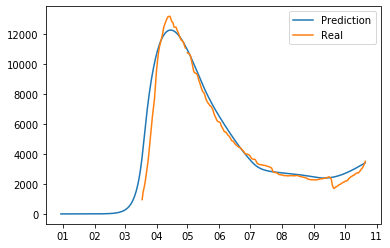

5655.207171746471
error_groups 2054.33120759267
error_total 720.1751928307601
mix_other: 0.25410864740423467 mix_leisure: 0.06888663733656247
{'work': 1.7379154482386832, 'transport': 1.7379154482386832, 'school': 1.7379154482386832, 'other': 1.7379154482386832, 'leisure': 1.7379154482386832, 'home': 1.7379154482386832}
[7.85020680e+01 1.73791545e+00 8.68289452e-01 2.54108647e-01
 6.88866373e-02 2.78026322e-03 7.24340978e-01 8.61050698e-02
 9.52340678e-01]


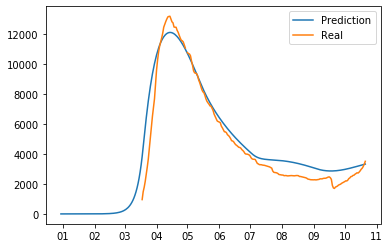

5044.264434998548
error_groups 2012.2262566433196
5239.038847959888
error_groups 1858.0445153860703
error_total 606.4076356710456
error_total 676.1988665147635
mix_other: 0.20250049323514863 mix_leisure: 0.04619150739587208
mix_other: 0.2226632011826437 mix_leisure: 0.045294639877644594
{'work': 1.9018058310405057, 'transport': 1.9018058310405057, 'school': 1.9018058310405057, 'other': 1.9018058310405057, 'leisure': 1.9018058310405057, 'home': 1.9018058310405057}
{'work': 1.7775535667132507, 'transport': 1.7775535667132507, 'school': 1.7775535667132507, 'other': 1.7775535667132507, 'leisure': 1.7775535667132507, 'home': 1.7775535667132507}
[7.84602729e+01 1.90180583e+00 8.82565761e-01 2.02500493e-01
 4.61915074e-02 9.32334450e-03 6.22360754e-01 8.51869565e-02
 9.81272963e-01][7.88868231e+01 1.77755357e+00 8.88523721e-01 2.22663201e-01
 4.52946399e-02 4.23332265e-02 4.42970145e-01 1.43723099e-01
 9.22413208e-01]



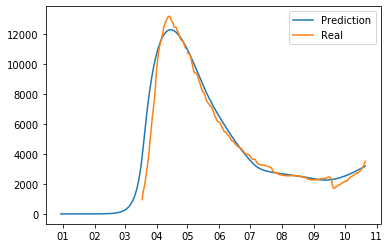

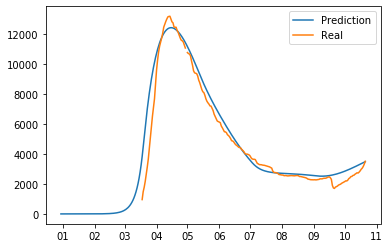

4598.336145373224
error_groups 1917.2287477690093
error_total 536.221479520843
mix_other: 0.24235420077027026 mix_leisure: 0.08431951548841699
{'work': 1.754327727944203, 'transport': 1.754327727944203, 'school': 1.754327727944203, 'other': 1.754327727944203, 'leisure': 1.754327727944203, 'home': 1.754327727944203}
[7.81393374e+01 1.75432773e+00 8.72473084e-01 2.42354201e-01
 8.43195155e-02 4.50278445e-02 7.57712324e-02 1.47767524e-01
 9.48608895e-01]


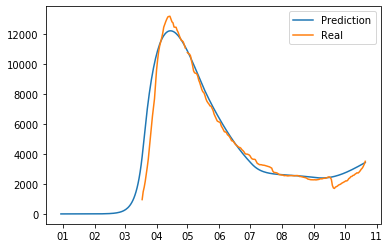

4551.51116112237
error_groups 1985.1709902684206
error_total 513.2680341707899
mix_other: 0.25065000451094954 mix_leisure: 0.038004503389756694
{'work': 1.7173672364358588, 'transport': 1.7173672364358588, 'school': 1.7173672364358588, 'other': 1.7173672364358588, 'leisure': 1.7173672364358588, 'home': 1.7173672364358588}
[7.83717072e+01 1.71736724e+00 8.65585653e-01 2.50650005e-01
 3.80045034e-02 7.55256840e-03 2.85465243e-01 7.41833686e-02
 9.88713098e-01]


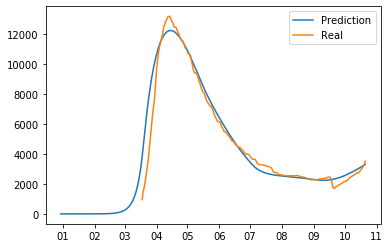

5380.536477083443
error_groups 1913.9776883932868
error_total 693.3117577380312
mix_other: 0.2701965151970704 mix_leisure: 0.049613024416582774
{'work': 1.652216847727812, 'transport': 1.652216847727812, 'school': 1.652216847727812, 'other': 1.652216847727812, 'leisure': 1.652216847727812, 'home': 1.652216847727812}
[7.83994019e+01 1.65221685e+00 8.66818627e-01 2.70196515e-01
 4.96130244e-02 2.55632823e-02 1.86594063e-01 1.21788360e-01
 9.61792453e-01]


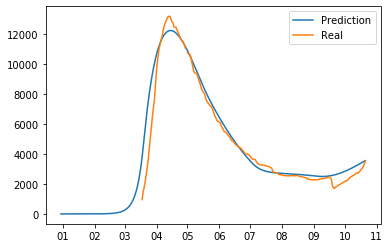

4736.228778362064
error_groups 1991.701696571455
error_total 548.9054163581218
mix_other: 0.2226632011826437 mix_leisure: 0.10119111575817868
{'work': 1.8076301688876746, 'transport': 1.8076301688876746, 'school': 1.8076301688876746, 'other': 1.8076301688876746, 'leisure': 1.8076301688876746, 'home': 1.8076301688876746}
[7.88977989e+01 1.80763017e+00 8.65288233e-01 2.22663201e-01
 1.01191116e-01 1.03033130e-02 4.42970145e-01 1.28694304e-01
 9.99415822e-01]


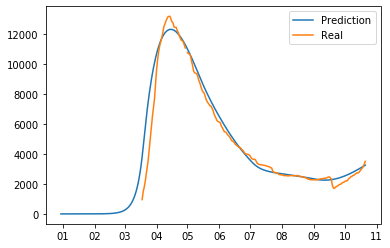

4944.331835841553
error_groups 2037.2980566646643
error_total 581.4067558353776
mix_other: 0.2492720629048505 mix_leisure: 0.01066026348190574
{'work': 1.7665794128135044, 'transport': 1.7665794128135044, 'school': 1.7665794128135044, 'other': 1.7665794128135044, 'leisure': 1.7665794128135044, 'home': 1.7665794128135044}
[7.80788986e+01 1.76657941e+00 8.71763338e-01 2.49272063e-01
 1.06602635e-02 4.29556135e-02 2.62483702e-01 5.30623031e-02
 9.86247723e-01]


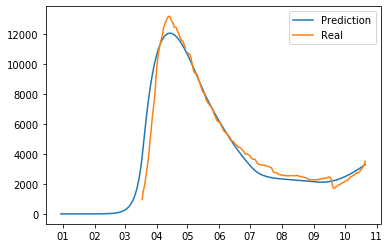

4787.999328994789
error_groups 1926.7082898161884
error_total 572.2582078357202
mix_other: 0.25065000451094954 mix_leisure: 0.09262684215542588
{'work': 1.7173672364358588, 'transport': 1.7173672364358588, 'school': 1.7173672364358588, 'other': 1.7173672364358588, 'leisure': 1.7173672364358588, 'home': 1.7173672364358588}
[7.83717072e+01 1.71736724e+00 8.62427788e-01 2.50650005e-01
 9.26268422e-02 4.79783547e-02 3.13599498e-01 7.41833686e-02
 9.92922866e-01]


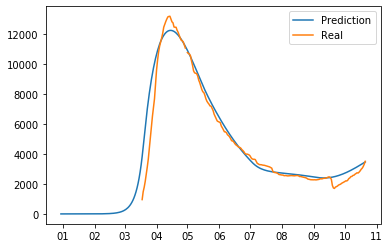

4581.499182678571
error_groups 1980.9605040107124
error_total 520.1077357335716
mix_other: 0.2775117990834417 mix_leisure: 0.1302909858586232
{'work': 1.6460400841682512, 'transport': 1.6460400841682512, 'school': 1.6460400841682512, 'other': 1.6460400841682512, 'leisure': 1.6460400841682512, 'home': 1.6460400841682512}
[7.82119156e+01 1.64604008e+00 8.45124296e-01 2.77511799e-01
 1.30290986e-01 7.58664369e-02 1.53041485e-01 7.67497161e-02
 9.85399955e-01]


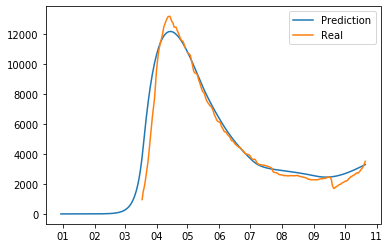

5052.223289408269
error_groups 1955.856114066636
error_total 619.2734350683265
mix_other: 0.2628265667726933 mix_leisure: 0.04525141395256593
{'work': 1.7343068444862926, 'transport': 1.7343068444862926, 'school': 1.7343068444862926, 'other': 1.7343068444862926, 'leisure': 1.7343068444862926, 'home': 1.7343068444862926}
[7.84920080e+01 1.73430684e+00 8.71077413e-01 2.62826567e-01
 4.52514140e-02 1.00929681e-02 2.39231400e-01 9.70804172e-02
 9.63492588e-01]


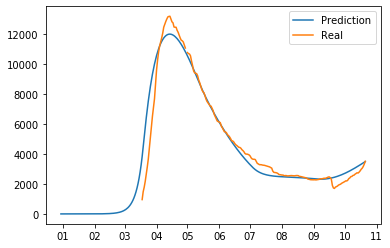

5157.576183422241
error_groups 1893.5896383462655
error_total 652.7973090151952
mix_other: 0.25926154744191005 mix_leisure: 0.0666340842007409
{'work': 1.7357078583904706, 'transport': 1.7357078583904706, 'school': 1.7357078583904706, 'other': 1.7357078583904706, 'leisure': 1.7357078583904706, 'home': 1.7357078583904706}
[7.87146374e+01 1.73570786e+00 8.80702394e-01 2.59261547e-01
 6.66340842e-02 2.78116453e-02 1.30674913e-01 4.66149235e-02
 8.70050315e-01]


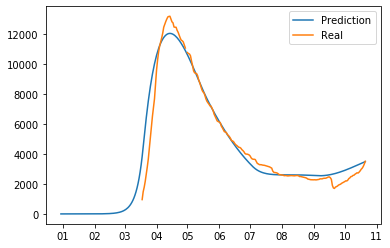

4966.406043540512
error_groups 1947.8461214043914
error_total 603.711984427224
mix_other: 0.3136974359061504 mix_leisure: 0.07499044629878038
{'work': 1.537633400763214, 'transport': 1.537633400763214, 'school': 1.537633400763214, 'other': 1.537633400763214, 'leisure': 1.537633400763214, 'home': 1.537633400763214}
[7.80590209e+01 1.53763340e+00 8.45493390e-01 3.13697436e-01
 7.49904463e-02 5.56844302e-02 1.10623251e-01 6.34906831e-02
 9.73811001e-01]


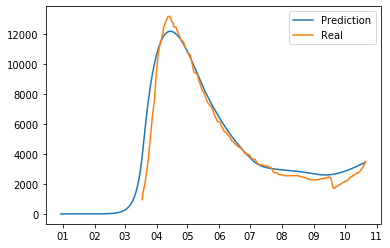

4583.969720682116
error_groups 1884.1590667311527
error_total 539.9621307901925
mix_other: 0.23689987752266406 mix_leisure: 0.11760883219568974
{'work': 1.7949048424821246, 'transport': 1.7949048424821246, 'school': 1.7949048424821246, 'other': 1.7949048424821246, 'leisure': 1.7949048424821246, 'home': 1.7949048424821246}
[7.85974172e+01 1.79490484e+00 8.87888413e-01 2.36899878e-01
 1.17608832e-01 2.04676499e-02 1.74409917e-01 8.10338203e-02
 7.60239360e-01]4437.237294980656

error_groups 1907.3930802106008
error_total 505.96884295401105
mix_other: 0.2486629032204558 mix_leisure: 0.06600708396246763
{'work': 1.7010830571217967, 'transport': 1.7010830571217967, 'school': 1.7010830571217967, 'other': 1.7010830571217967, 'leisure': 1.7010830571217967, 'home': 1.7010830571217967}
[7.86760483e+01 1.70108306e+00 8.73243577e-01 2.48662903e-01
 6.60070840e-02 5.07899804e-02 9.86402630e-02 2.59657775e-02
 9.12792925e-01]


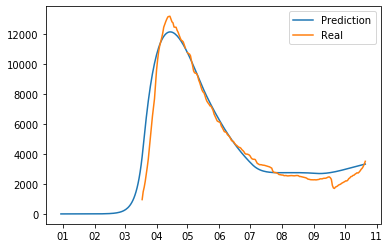

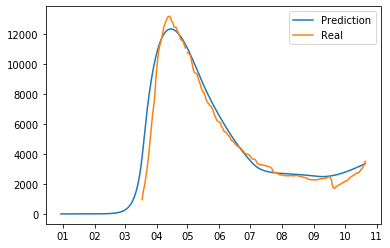

4596.893433921343
error_groups 1943.4134745830902
error_total 530.6959918676505
mix_other: 0.2483353198579744 mix_leisure: 0.060438323619475876
{'work': 1.7986074172880469, 'transport': 1.7986074172880469, 'school': 1.7986074172880469, 'other': 1.7986074172880469, 'leisure': 1.7986074172880469, 'home': 1.7986074172880469}
[7.85461617e+01 1.79860742e+00 8.84145919e-01 2.48335320e-01
 6.04383236e-02 6.94307485e-02 3.26698359e-01 7.65588201e-03
 8.72772791e-01]


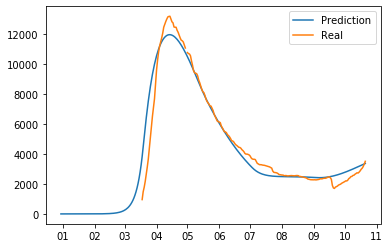

4417.188985958695
error_groups 1959.6835710667624
error_total 491.50108297838665
mix_other: 0.28498739929074746 mix_leisure: 0.09386501606863346
{'work': 1.6556069540583738, 'transport': 1.6556069540583738, 'school': 1.6556069540583738, 'other': 1.6556069540583738, 'leisure': 1.6556069540583738, 'home': 1.6556069540583738}
[7.87343109e+01 1.65560695e+00 8.56174727e-01 2.84987399e-01
 9.38650161e-02 5.16046319e-02 2.51068120e-01 1.92904182e-01
 9.28290554e-01]


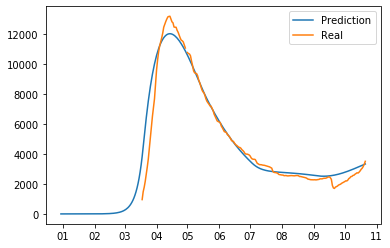

4773.054832120959
error_groups 1904.4179541184371
error_total 573.7273756005044
mix_other: 0.25680851486047945 mix_leisure: 0.04966524442682574
{'work': 1.6445423496562266, 'transport': 1.6445423496562266, 'school': 1.6445423496562266, 'other': 1.6445423496562266, 'leisure': 1.6445423496562266, 'home': 1.6445423496562266}
[7.87153504e+01 1.64454235e+00 8.67765100e-01 2.56808515e-01
 4.96652444e-02 4.29556135e-02 2.63316209e-01 5.30623031e-02
 9.44949408e-01]


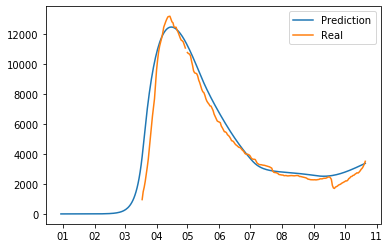

4976.949563309377
error_groups 1957.9723183662718
error_total 603.7954489886209
mix_other: 0.25322815575164603 mix_leisure: 0.033689294224289956
{'work': 1.7534295079434203, 'transport': 1.7534295079434203, 'school': 1.7534295079434203, 'other': 1.7534295079434203, 'leisure': 1.7534295079434203, 'home': 1.7534295079434203}
[7.89441837e+01 1.75342951e+00 8.85802441e-01 2.53228156e-01
 3.36892942e-02 7.38017382e-02 1.70902218e-01 4.67922436e-02
 8.16266953e-01]


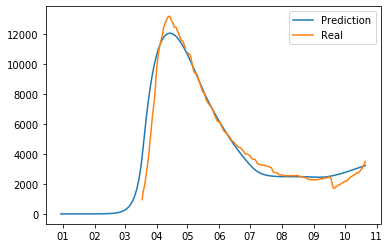

4517.626950827212
error_groups 1929.6696780040838
error_total 517.5914545646256
mix_other: 0.2751642367216068 mix_leisure: 0.01891620633852653
{'work': 1.6501930813462025, 'transport': 1.6501930813462025, 'school': 1.6501930813462025, 'other': 1.6501930813462025, 'leisure': 1.6501930813462025, 'home': 1.6501930813462025}
[7.88361019e+01 1.65019308e+00 8.69249340e-01 2.75164237e-01
 1.89162063e-02 4.29791741e-02 1.67517573e-01 1.91557402e-01
 9.28049129e-01]


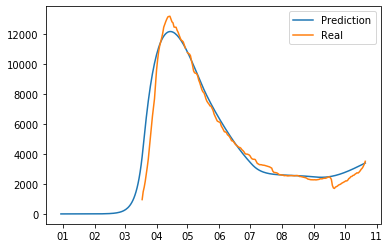

4503.05203575571
error_groups 1995.2613997237122
error_total 501.55812720639955
mix_other: 0.30859953094078374 mix_leisure: 0.1099393426936569
{'work': 1.5846357466755223, 'transport': 1.5846357466755223, 'school': 1.5846357466755223, 'other': 1.5846357466755223, 'leisure': 1.5846357466755223, 'home': 1.5846357466755223}
[7.87757387e+01 1.58463575e+00 8.39365378e-01 3.08599531e-01
 1.09939343e-01 4.61078981e-02 2.53712695e-01 7.16485091e-02
 9.83309657e-01]


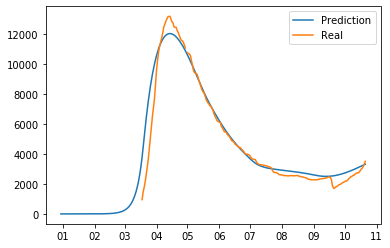

4519.1770649127375
error_groups 1901.8464362687296
error_total 523.4661257288014
mix_other: 0.2339343703026887 mix_leisure: 0.1302909858586232
{'work': 1.8156996343606768, 'transport': 1.8156996343606768, 'school': 1.8156996343606768, 'other': 1.8156996343606768, 'leisure': 1.8156996343606768, 'home': 1.8156996343606768}
[7.86813512e+01 1.81569963e+00 8.78686766e-01 2.33934370e-01
 1.30290986e-01 4.89473593e-02 1.62161215e-01 1.18665106e-01
 8.80700504e-01]


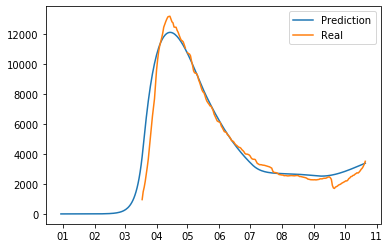

4667.26238343547
error_groups 1891.904785445653
error_total 555.0715195979634
mix_other: 0.25785594067058987 mix_leisure: 0.04445169383223474
{'work': 1.6806572090005192, 'transport': 1.6806572090005192, 'school': 1.6806572090005192, 'other': 1.6806572090005192, 'leisure': 1.6806572090005192, 'home': 1.6806572090005192}
[7.83107345e+01 1.68065721e+00 8.79952477e-01 2.57855941e-01
 4.44516938e-02 3.92661272e-02 3.69323358e-01 1.20489731e-01
 8.40938527e-01]


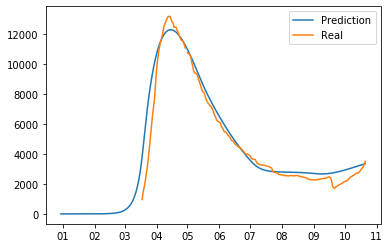

4331.336064191446
error_groups 1912.148588079127
error_total 483.83749522246393
mix_other: 0.24403024870764334 mix_leisure: 0.10471863214305777
{'work': 1.7685415518898995, 'transport': 1.7685415518898995, 'school': 1.7685415518898995, 'other': 1.7685415518898995, 'leisure': 1.7685415518898995, 'home': 1.7685415518898995}
[7.83174321e+01 1.76854155e+00 8.76230814e-01 2.44030249e-01
 1.04718632e-01 4.89473593e-02 2.07084726e-01 1.18665106e-01
 8.80292393e-01]


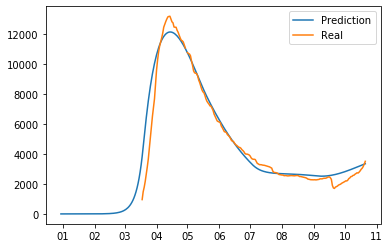

4698.020845318904
error_groups 1934.6364984121992
error_total 552.6768693813411
mix_other: 0.27941772849521385 mix_leisure: 0.10277218023105861
{'work': 1.6052153013346844, 'transport': 1.6052153013346844, 'school': 1.6052153013346844, 'other': 1.6052153013346844, 'leisure': 1.6052153013346844, 'home': 1.6052153013346844}
[7.88521045e+01 1.60521530e+00 8.55524295e-01 2.79417728e-01
 1.02772180e-01 7.67907574e-02 7.54565779e-02 6.71303799e-02
 9.28378248e-01]


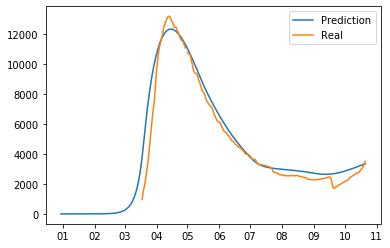

4670.35312406618
error_groups 1947.4901770166912
error_total 544.5725894098978
mix_other: 0.29220694940306097 mix_leisure: 0.12361477053816616
{'work': 1.6169552471139503, 'transport': 1.6169552471139503, 'school': 1.6169552471139503, 'other': 1.6169552471139503, 'leisure': 1.6169552471139503, 'home': 1.6169552471139503}
[7.82931608e+01 1.61695525e+00 8.54402561e-01 2.92206949e-01
 1.23614771e-01 7.05039068e-02 1.70224963e-01 1.73093119e-01
 8.88370529e-01]
4605.781785347284
error_groups 1898.997220593329
error_total 541.356912950791
mix_other: 0.24774230313473838 mix_leisure: 0.07730126045987312
{'work': 1.710212766465341, 'transport': 1.710212766465341, 'school': 1.710212766465341, 'other': 1.710212766465341, 'leisure': 1.710212766465341, 'home': 1.710212766465341}
[7.84135353e+01 1.71021277e+00 8.76524688e-01 2.47742303e-01
 7.73012605e-02 3.33154728e-02 1.88339446e-01 1.02097777e-01
 8.68836181e-01]


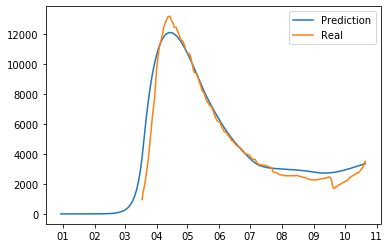

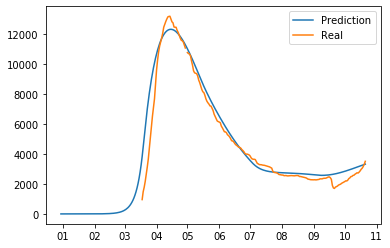

4568.939413468398
error_groups 1909.5969681812178
error_total 531.8684890574361
mix_other: 0.22391010338391315 mix_leisure: 0.10662508760963385
{'work': 1.8835908352667263, 'transport': 1.8835908352667263, 'school': 1.8835908352667263, 'other': 1.8835908352667263, 'leisure': 1.8835908352667263, 'home': 1.8835908352667263}
[7.80658399e+01 1.88359084e+00 8.87895528e-01 2.23910103e-01
 1.06625088e-01 2.25895593e-02 4.98057207e-01 8.80271809e-02
 8.78969376e-01]


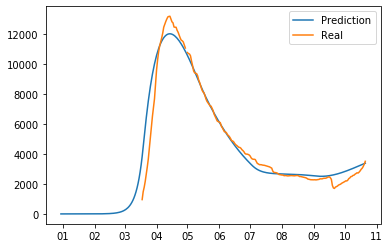

4483.989341380091
error_groups 1916.4861327409278
error_total 513.5006417278325
mix_other: 0.19766101377904 mix_leisure: 0.14144226119063202
{'work': 1.9054086078287837, 'transport': 1.9054086078287837, 'school': 1.9054086078287837, 'other': 1.9054086078287837, 'leisure': 1.9054086078287837, 'home': 1.9054086078287837}
[7.85969543e+01 1.90540861e+00 8.77732677e-01 1.97661014e-01
 1.41442261e-01 1.03745037e-02 4.02105016e-01 1.24484686e-01
 9.84238840e-01]


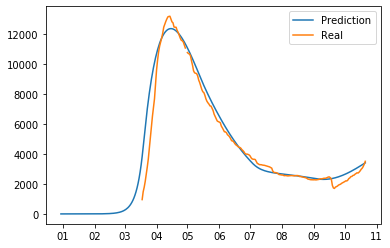

4849.957967021823
error_groups 1965.7635116744486
error_total 576.8388910694748
mix_other: 0.21986457106677548 mix_leisure: 0.1426036066601667
{'work': 1.793062640216999, 'transport': 1.793062640216999, 'school': 1.793062640216999, 'other': 1.793062640216999, 'leisure': 1.793062640216999, 'home': 1.793062640216999}
[78.23318637  1.79306264  0.86198938  0.21986457  0.14260361  0.08793848
  0.3504146   0.09116699  0.99092132]
4667.531189884987
error_groups 1856.290346175032
error_total 562.248168741991
mix_other: 0.21791544787304185 mix_leisure: 0.06222580152339702
{'work': 1.8732433082610276, 'transport': 1.8732433082610276, 'school': 1.8732433082610276, 'other': 1.8732433082610276, 'leisure': 1.8732433082610276, 'home': 1.8732433082610276}
[7.81451568e+01 1.87324331e+00 9.11072152e-01 2.17915448e-01
 6.22258015e-02 6.48727670e-02 3.90991293e-01 6.98802498e-02
 6.77150597e-01]


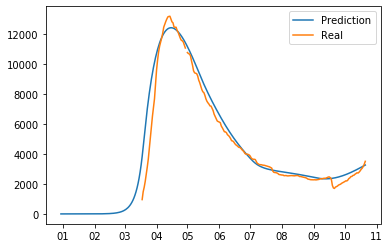

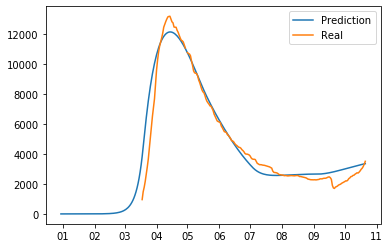

4387.53735962218
error_groups 1926.7453795196386
error_total 492.15839602050823
mix_other: 0.24559976783197535 mix_leisure: 0.07362053842589317
{'work': 1.7704428825692635, 'transport': 1.7704428825692635, 'school': 1.7704428825692635, 'other': 1.7704428825692635, 'leisure': 1.7704428825692635, 'home': 1.7704428825692635}
[7.85263908e+01 1.77044288e+00 8.75362048e-01 2.45599768e-01
 7.36205384e-02 3.31749608e-03 4.76006387e-01 1.34651249e-02
 9.20737484e-01]
4279.750405754396
error_groups 1951.6561279401863
error_total 465.618855562842
mix_other: 0.23659957491403494 mix_leisure: 0.14861646137130036
{'work': 1.8335167456379213, 'transport': 1.8335167456379213, 'school': 1.8335167456379213, 'other': 1.8335167456379213, 'leisure': 1.8335167456379213, 'home': 1.8335167456379213}
[7.81942033e+01 1.83351675e+00 8.68776657e-01 2.36599575e-01
 1.48616461e-01 7.00085317e-02 5.01747761e-02 1.17863096e-01
 9.37019989e-01]


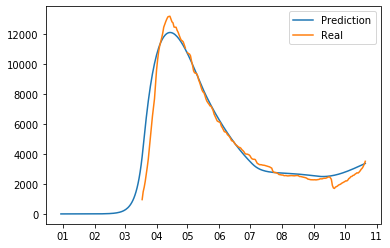

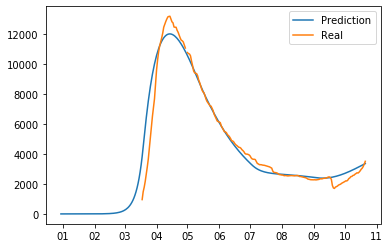

4481.981986115758
error_groups 1962.5623797152937
error_total 503.88392128009286
mix_other: 0.20212996881908452 mix_leisure: 0.11675464285888765
{'work': 1.941238273445032, 'transport': 1.941238273445032, 'school': 1.941238273445032, 'other': 1.941238273445032, 'leisure': 1.941238273445032, 'home': 1.941238273445032}
[7.83438390e+01 1.94123827e+00 8.85212864e-01 2.02129969e-01
 1.16754643e-01 1.14440954e-02 1.90546663e-01 6.04510687e-02
 9.52774031e-01]


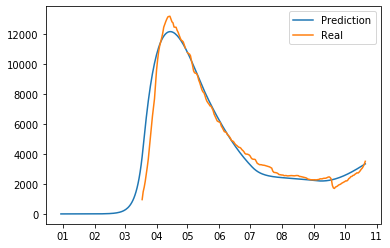

4642.65316665573
error_groups 1937.8071797212167
error_total 540.9691973869027
mix_other: 0.27562693327966553 mix_leisure: 0.06875106273164311
{'work': 1.7023807788329433, 'transport': 1.7023807788329433, 'school': 1.7023807788329433, 'other': 1.7023807788329433, 'leisure': 1.7023807788329433, 'home': 1.7023807788329433}
[7.81591635e+01 1.70238078e+00 8.70238095e-01 2.75626933e-01
 6.87510627e-02 6.50200769e-02 3.74794071e-01 1.59729825e-01
 8.80383990e-01]


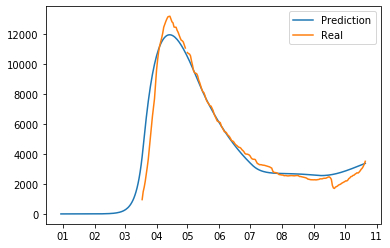

4660.655387605921
error_groups 1894.0653812276146
error_total 553.3180012756613
mix_other: 0.22475645188349286 mix_leisure: 0.15109969044971322
{'work': 1.7922660616622297, 'transport': 1.7922660616622297, 'school': 1.7922660616622297, 'other': 1.7922660616622297, 'leisure': 1.7922660616622297, 'home': 1.7922660616622297}
[7.80971238e+01 1.79226606e+00 8.75799785e-01 2.24756452e-01
 1.51099690e-01 2.53498947e-03 9.83523870e-02 1.49375727e-02
 8.77621758e-01]
4561.84418825069
error_groups 1942.4433547091653
error_total 523.880166708305
mix_other: 0.29442760045585786 mix_leisure: 0.10277218023105861
{'work': 1.6052153013346844, 'transport': 1.6052153013346844, 'school': 1.6052153013346844, 'other': 1.6052153013346844, 'leisure': 1.6052153013346844, 'home': 1.6052153013346844}
[7.88521045e+01 1.60521530e+00 8.55524295e-01 2.94427600e-01
 1.02772180e-01 6.26593136e-02 7.54565779e-02 5.62016235e-02
 8.92866133e-01]


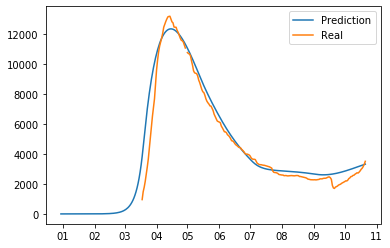

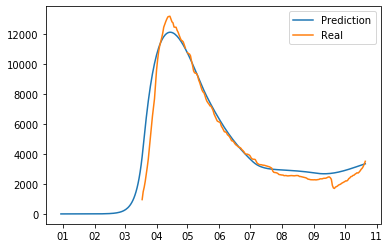

4400.216376234168
error_groups 1940.5530636997303
error_total 491.9326625068876
mix_other: 0.25391996678781203 mix_leisure: 0.04184079579728828
{'work': 1.7309982683016814, 'transport': 1.7309982683016814, 'school': 1.7309982683016814, 'other': 1.7309982683016814, 'leisure': 1.7309982683016814, 'home': 1.7309982683016814}
[7.85475346e+01 1.73099827e+00 8.72951588e-01 2.53919967e-01
 4.18407958e-02 6.23836464e-02 3.74838305e-01 6.57637394e-02
 9.46832209e-01]


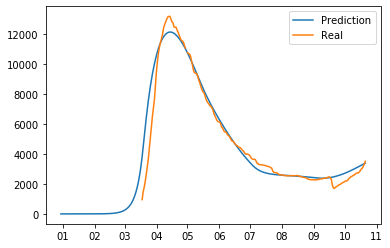

4487.528525000043
error_groups 1915.3381837831678
error_total 514.4380682433751
mix_other: 0.18583462009072604 mix_leisure: 0.25996970541049946
{'work': 1.9903249527690312, 'transport': 1.9903249527690312, 'school': 1.9903249527690312, 'other': 1.9903249527690312, 'leisure': 1.9903249527690312, 'home': 1.9903249527690312}
[7.83668404e+01 1.99032495e+00 8.71165062e-01 1.85834620e-01
 2.59969705e-01 9.57507236e-02 3.98622832e-01 4.99725933e-02
 9.50786712e-01]
5044.143007161604
error_groups 1882.163438702577
error_total 632.3959136918054
mix_other: 0.20614460767634735 mix_leisure: 0.14775266314415053
{'work': 1.8946548296527208, 'transport': 1.8946548296527208, 'school': 1.8946548296527208, 'other': 1.8946548296527208, 'leisure': 1.8946548296527208, 'home': 1.8946548296527208}
[7.84028791e+01 1.89465483e+00 8.80421247e-01 2.06144608e-01
 1.47752663e-01 4.72757288e-02 3.45537896e-01 6.15440425e-02
 9.61951176e-01]


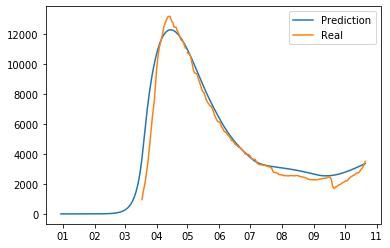

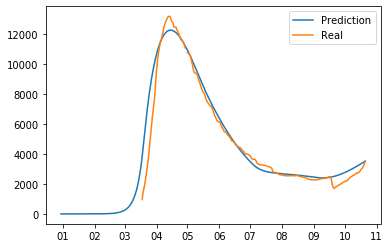

4523.475153171197
error_groups 1993.9899400738866
error_total 505.89704261946207
mix_other: 0.21366573043881376 mix_leisure: 0.08776620246688127
{'work': 1.8772493714509944, 'transport': 1.8772493714509944, 'school': 1.8772493714509944, 'other': 1.8772493714509944, 'leisure': 1.8772493714509944, 'home': 1.8772493714509944}
[78.5687486   1.87724937  0.87527698  0.21366573  0.0877662   0.09397823
  0.33140587  0.10810141  0.99934114]


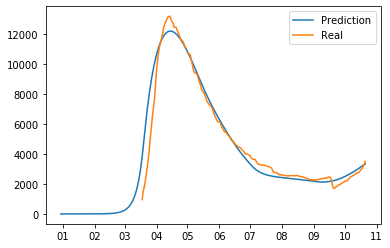

4576.211072025727
error_groups 1900.6589021359134
error_total 535.1104339779628
mix_other: 0.21661745309998492 mix_leisure: 0.2221137655563974
4496.820814502704
{'work': 1.8981755441649826, 'transport': 1.8981755441649826, 'school': 1.8981755441649826, 'other': 1.8981755441649826, 'leisure': 1.8981755441649826, 'home': 1.8981755441649826}
error_groups 1893.716137338832
error_total 520.6209354327743
[7.85172992e+01 1.89817554e+00 8.78602843e-01 2.16617453e-01
 2.22113766e-01 1.82887819e-02 1.50437110e-01 1.00095613e-02
 8.22713925e-01]mix_other: 0.21366573043881376 mix_leisure: 0.18448090480771884

{'work': 1.8639452552463016, 'transport': 1.8639452552463016, 'school': 1.8639452552463016, 'other': 1.8639452552463016, 'leisure': 1.8639452552463016, 'home': 1.8639452552463016}
[7.80974270e+01 1.86394526e+00 8.75276979e-01 2.13665730e-01
 1.84480905e-01 5.13732328e-02 1.22564939e-01 1.85356094e-02
 9.07456080e-01]


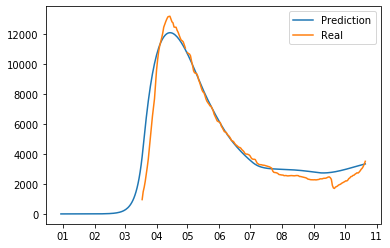

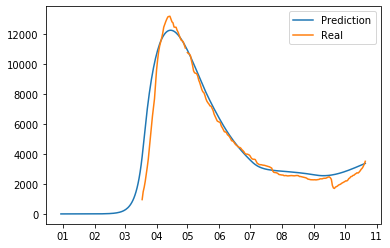

4570.640550572987
error_groups 1973.1944282266575
error_total 519.489224469266
mix_other: 0.2535900303427121 mix_leisure: 0.11655177266537436
{'work': 1.7708441656719662, 'transport': 1.7708441656719662, 'school': 1.7708441656719662, 'other': 1.7708441656719662, 'leisure': 1.7708441656719662, 'home': 1.7708441656719662}
[7.85600977e+01 1.77084417e+00 8.65265218e-01 2.53590030e-01
 1.16551773e-01 6.04521048e-02 2.01707378e-01 1.41411476e-01
 9.28162702e-01]


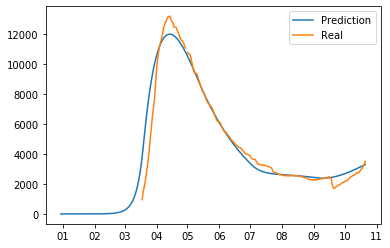

4302.304243004893
error_groups 1967.3777363451914
error_total 466.98530133194026
mix_other: 0.23476491924771964 mix_leisure: 0.15286363524971502
{'work': 1.8315084043983316, 'transport': 1.8315084043983316, 'school': 1.8315084043983316, 'other': 1.8315084043983316, 'leisure': 1.8315084043983316, 'home': 1.8315084043983316}
[7.86805081e+01 1.83150840e+00 8.62299300e-01 2.34764919e-01
 1.52863635e-01 2.55294676e-02 2.08284967e-01 1.54776454e-01
 9.84893931e-01]


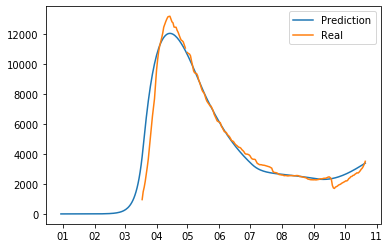

4346.165209552922
error_groups 1970.4944216222927
error_total 475.1341575861257
mix_other: 0.27419136854622606 mix_leisure: 0.04741141819893335
{'work': 1.6826144394730487, 'transport': 1.6826144394730487, 'school': 1.6826144394730487, 'other': 1.6826144394730487, 'leisure': 1.6826144394730487, 'home': 1.6826144394730487}
[7.83394021e+01 1.68261444e+00 8.60871950e-01 2.74191369e-01
 4.74114182e-02 5.41214998e-02 3.69323358e-01 1.60359867e-01
 9.76518274e-01]


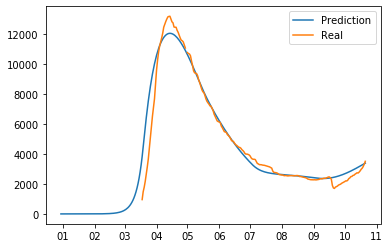

4320.801489301965
error_groups 1928.2234699182068
error_total 478.5156038767517
mix_other: 0.24775192665860113 mix_leisure: 0.06346248937827542
{'work': 1.728767566877273, 'transport': 1.728767566877273, 'school': 1.728767566877273, 'other': 1.728767566877273, 'leisure': 1.728767566877273, 'home': 1.728767566877273}
[7.84641713e+01 1.72876757e+00 8.72550787e-01 2.47751927e-01
 6.34624894e-02 3.68910779e-02 1.22564939e-01 1.85356094e-02
 9.37594574e-01]


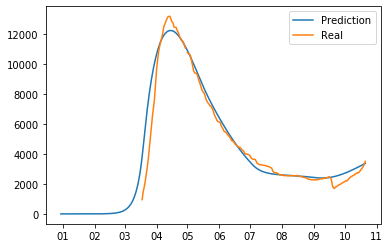

4572.318150706561
error_groups 1917.5346301409875
error_total 530.9567041131147
mix_other: 0.2553675240636321 mix_leisure: 0.12135797968745732
{'work': 1.7033513971638101, 'transport': 1.7033513971638101, 'school': 1.7033513971638101, 'other': 1.7033513971638101, 'leisure': 1.7033513971638101, 'home': 1.7033513971638101}
[7.85629829e+01 1.70335140e+00 8.62961822e-01 2.55367524e-01
 1.21357980e-01 9.78716274e-02 6.35915608e-02 1.18316643e-02
 9.34428719e-01]


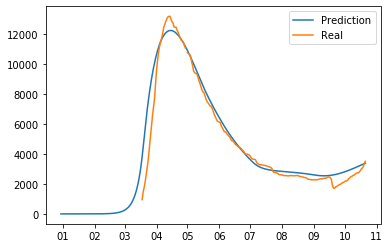

4383.642121863616
error_groups 1965.475520004824
error_total 483.6333203717584
mix_other: 0.2365746405833552 mix_leisure: 0.21454204364865753
{'work': 1.8514205818824319, 'transport': 1.8514205818824319, 'school': 1.8514205818824319, 'other': 1.8514205818824319, 'leisure': 1.8514205818824319, 'home': 1.8514205818824319}
[7.87812611e+01 1.85142058e+00 8.56519321e-01 2.36574641e-01
 2.14542044e-01 5.38542906e-02 1.11724251e-01 1.45844046e-01
 9.61393879e-01]


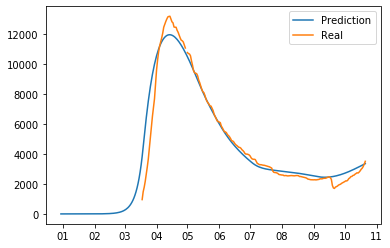

4548.37803519021
error_groups 2005.85033467061
error_total 508.5055401039199
mix_other: 0.22415196640748292 mix_leisure: 0.11465623029203764
{'work': 1.88072166397041, 'transport': 1.88072166397041, 'school': 1.88072166397041, 'other': 1.88072166397041, 'leisure': 1.88072166397041, 'home': 1.88072166397041}
[7.82496255e+01 1.88072166e+00 8.71528176e-01 2.24151966e-01
 1.14656230e-01 3.87456001e-02 2.25042338e-01 1.36821875e-01
 9.85871548e-01]


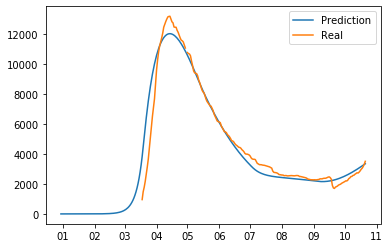

4433.3629196754355
4238.981638843243
error_groups 1959.4250250409077
error_groups 1928.6938135355638
error_total 494.78757892690544
error_total 462.05756506153585
mix_other: 0.2222709050325774 mix_leisure: 0.13928291060668013
mix_other: 0.20445084793045698 mix_leisure: 0.15281232131495848
{'work': 1.8648051261136036, 'transport': 1.8648051261136036, 'school': 1.8648051261136036, 'other': 1.8648051261136036, 'leisure': 1.8648051261136036, 'home': 1.8648051261136036}
{'work': 1.912806076724403, 'transport': 1.912806076724403, 'school': 1.912806076724403, 'other': 1.912806076724403, 'leisure': 1.912806076724403, 'home': 1.912806076724403}
[7.84719333e+01 1.86480513e+00 8.71893664e-01 2.22270905e-01
 1.39282911e-01 6.37627538e-02 3.61532411e-01 1.41078092e-01
 9.47761120e-01][7.82014173e+01 1.91280608e+00 8.77928803e-01 2.04450848e-01
 1.52812321e-01 4.15620788e-02 1.45653190e-01 1.94176512e-02
 9.58162762e-01]



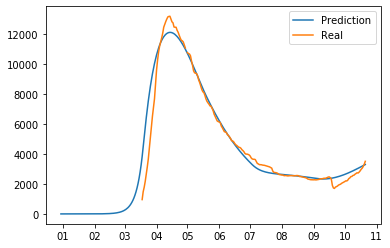

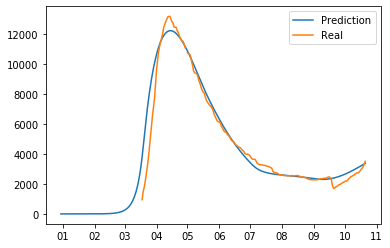

4321.735575290737
error_groups 1919.483573785909
error_total 480.45040030096567
mix_other: 0.20888327233619525 mix_leisure: 0.1583611093849402
{'work': 1.9073641752082118, 'transport': 1.9073641752082118, 'school': 1.9073641752082118, 'other': 1.9073641752082118, 'leisure': 1.9073641752082118, 'home': 1.9073641752082118}
[7.81913964e+01 1.90736418e+00 8.78345393e-01 2.08883272e-01
 1.58361109e-01 7.61117358e-02 1.27876725e-01 1.06618035e-01
 9.42168213e-01]


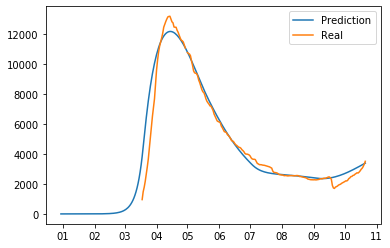

4520.138775206919
error_groups 1919.9435253070103
error_total 520.0390499799817
mix_other: 0.2495492473514364 mix_leisure: 0.16089424945134678
{'work': 1.774201437546929, 'transport': 1.774201437546929, 'school': 1.774201437546929, 'other': 1.774201437546929, 'leisure': 1.774201437546929, 'home': 1.774201437546929}
[7.84349238e+01 1.77420144e+00 8.68595811e-01 2.49549247e-01
 1.60894249e-01 7.46657365e-02 1.43265118e-01 9.34560648e-02
 8.70969319e-01]


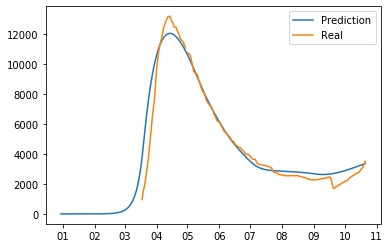

4371.060156119787
error_groups 1955.4939220883584
error_total 483.1132468062859
mix_other: 0.2065619932325951 mix_leisure: 0.12224553862199311
{'work': 1.899095672111227, 'transport': 1.899095672111227, 'school': 1.899095672111227, 'other': 1.899095672111227, 'leisure': 1.899095672111227, 'home': 1.899095672111227}
[7.81923945e+01 1.89909567e+00 8.78515215e-01 2.06561993e-01
 1.22245539e-01 3.67716597e-02 9.07548690e-02 1.33713499e-01
 9.69203789e-01]


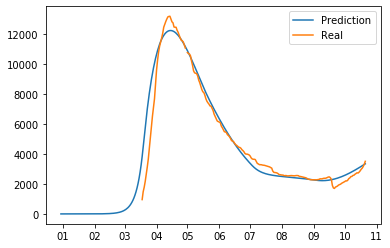

4464.006485365853
error_groups 1978.147840477876
error_total 497.1717289775954
mix_other: 0.1974151144765045 mix_leisure: 0.12382002407871284
{'work': 1.9504736742021773, 'transport': 1.9504736742021773, 'school': 1.9504736742021773, 'other': 1.9504736742021773, 'leisure': 1.9504736742021773, 'home': 1.9504736742021773}
[7.83717072e+01 1.95047367e+00 8.79655848e-01 1.97415114e-01
 1.23820024e-01 2.31439975e-02 2.24438001e-01 7.41833686e-02
 9.97066385e-01]


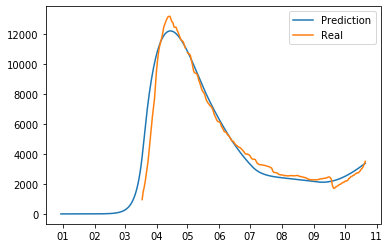

4350.2080309603625
error_groups 1955.245161751532
error_total 478.99257384176616
mix_other: 0.25410864740423467 mix_leisure: 0.035282205602663375
{'work': 1.7379154482386832, 'transport': 1.7379154482386832, 'school': 1.7379154482386832, 'other': 1.7379154482386832, 'leisure': 1.7379154482386832, 'home': 1.7379154482386832}
[7.82211755e+01 1.73791545e+00 8.76509434e-01 2.54108647e-01
 3.52822056e-02 9.10293334e-02 2.05987911e-02 1.24303524e-02
 9.22538780e-01]


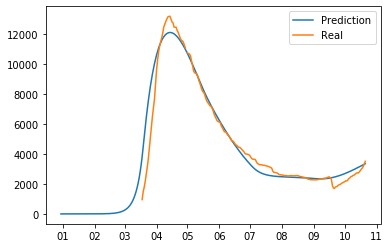

4209.453925625394
error_groups 1930.6591694498156
error_total 455.75895123511566
mix_other: 0.20427394248994868 mix_leisure: 0.1752890216602413
{'work': 1.8880563189770243, 'transport': 1.8880563189770243, 'school': 1.8880563189770243, 'other': 1.8880563189770243, 'leisure': 1.8880563189770243, 'home': 1.8880563189770243}
[7.84756428e+01 1.88805632e+00 8.69763336e-01 2.04273942e-01
 1.75289022e-01 2.01665139e-02 9.27848453e-02 5.49553561e-02
 9.80846937e-01]


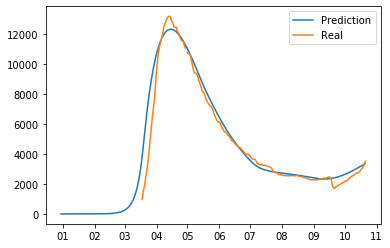

4245.996266409116
error_groups 1907.3868182427072
error_total 467.7218896332817
mix_other: 0.18968115960632814 mix_leisure: 0.1741926714532268
{'work': 1.9479445651023473, 'transport': 1.9479445651023473, 'school': 1.9479445651023473, 'other': 1.9479445651023473, 'leisure': 1.9479445651023473, 'home': 1.9479445651023473}
[7.88202597e+01 1.94794457e+00 8.81207057e-01 1.89681160e-01
 1.74192671e-01 4.21639581e-03 1.90546663e-01 6.04510687e-02
 9.51741269e-01]


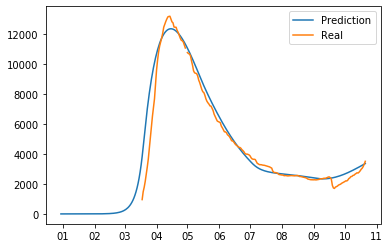

4223.188507746913
error_groups 1948.1796942959338
error_total 455.0017626901959
mix_other: 0.2294291212443318 mix_leisure: 0.17200591788555714
{'work': 1.8260153772683605, 'transport': 1.8260153772683605, 'school': 1.8260153772683605, 'other': 1.8260153772683605, 'leisure': 1.8260153772683605, 'home': 1.8260153772683605}
[7.84699981e+01 1.82601538e+00 8.62602123e-01 2.29429121e-01
 1.72005918e-01 4.24248014e-02 1.80765510e-02 1.31985241e-01
 9.64303507e-01]


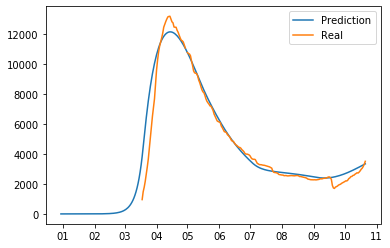

4196.570358911586
error_groups 1978.5231907803218
error_total 443.60943362625267
mix_other: 0.2081292355337211 mix_leisure: 0.21483835373972765
{'work': 1.9589767385836883, 'transport': 1.9589767385836883, 'school': 1.9589767385836883, 'other': 1.9589767385836883, 'leisure': 1.9589767385836883, 'home': 1.9589767385836883}
[7.81483715e+01 1.95897674e+00 8.63520568e-01 2.08129236e-01
 2.14838354e-01 2.77267655e-02 1.51389261e-01 1.45287306e-01
 9.92873214e-01]
4416.584489337897
error_groups 1949.366609442525
error_total 493.4435759790744
mix_other: 0.2710334879396399 mix_leisure: 0.08287312742489683
{'work': 1.7001935076089523, 'transport': 1.7001935076089523, 'school': 1.7001935076089523, 'other': 1.7001935076089523, 'leisure': 1.7001935076089523, 'home': 1.7001935076089523}
[7.85667722e+01 1.70019351e+00 8.64167173e-01 2.71033488e-01
 8.28731274e-02 9.69219787e-02 1.47941298e-01 7.85418599e-02
 9.30921275e-01]


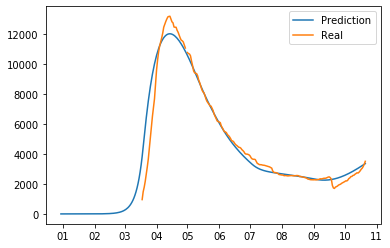

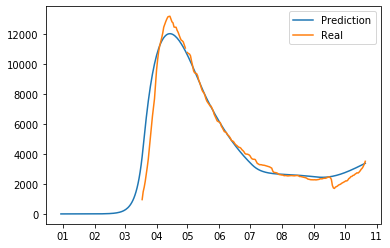

4201.315467473578
error_groups 1965.6337811687833
error_total 447.13633726095884
mix_other: 0.22800495934567683 mix_leisure: 0.2173064914229264
{'work': 1.834769443670988, 'transport': 1.834769443670988, 'school': 1.834769443670988, 'other': 1.834769443670988, 'leisure': 1.834769443670988, 'home': 1.834769443670988}
[7.88472819e+01 1.83476944e+00 8.52208602e-01 2.28004959e-01
 2.17306491e-01 5.08514132e-02 1.38485153e-01 6.23713454e-02
 9.97144882e-01]


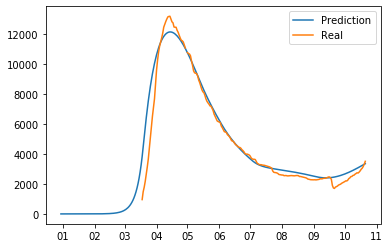

4266.461518460565
error_groups 1932.1671263864605
error_total 466.8588784148209
mix_other: 0.1969620252696639 mix_leisure: 0.13748468587300033
{'work': 1.9433101039477887, 'transport': 1.9433101039477887, 'school': 1.9433101039477887, 'other': 1.9433101039477887, 'leisure': 1.9433101039477887, 'home': 1.9433101039477887}
[7.85312912e+01 1.94331010e+00 8.83517227e-01 1.96962025e-01
 1.37484686e-01 3.57650033e-02 4.06932935e-01 4.48033464e-02
 9.51766423e-01]


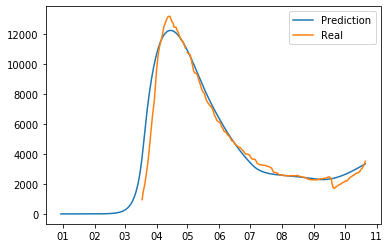

4248.741287582608
error_groups 1930.5437466533663
error_total 463.6395081858483
mix_other: 0.2174214419310122 mix_leisure: 0.1684748525414403
{'work': 1.9023458472398906, 'transport': 1.9023458472398906, 'school': 1.9023458472398906, 'other': 1.9023458472398906, 'leisure': 1.9023458472398906, 'home': 1.9023458472398906}
[7.80342780e+01 1.90234585e+00 8.76869478e-01 2.17421442e-01
 1.68474853e-01 5.22249161e-02 1.06996333e-01 9.17724103e-02
 9.15786827e-01]


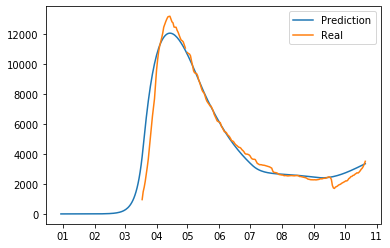

4226.99819268357
error_groups 1957.2826248500703
error_total 453.9431135666999
mix_other: 0.20188492071812858 mix_leisure: 0.21621756041823853
{'work': 1.9680267133251257, 'transport': 1.9680267133251257, 'school': 1.9680267133251257, 'other': 1.9680267133251257, 'leisure': 1.9680267133251257, 'home': 1.9680267133251257}
[7.83659449e+01 1.96802671e+00 8.65072437e-01 2.01884921e-01
 2.16217560e-01 4.19179603e-02 5.04181698e-01 3.55894888e-02
 9.96700587e-01]


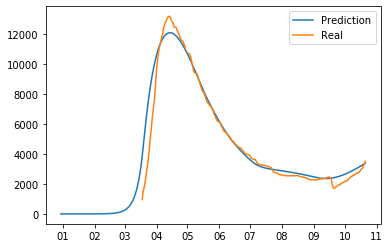

4226.966267449888
error_groups 1959.1179173080961
error_total 453.5696700283583
mix_other: 0.2124011041763893 mix_leisure: 0.24689467537472537
{'work': 1.920101475634687, 'transport': 1.920101475634687, 'school': 1.920101475634687, 'other': 1.920101475634687, 'leisure': 1.920101475634687, 'home': 1.920101475634687}
[7.82131055e+01 1.92010148e+00 8.57359237e-01 2.12401104e-01
 2.46894675e-01 2.58723060e-02 6.93920181e-02 1.54776454e-01
 9.82771291e-01]


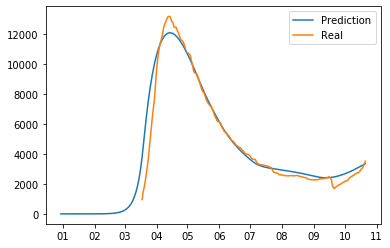

4397.2381753760355
error_groups 1937.250316215891
error_total 491.9975718320289
mix_other: 0.20555710338687516 mix_leisure: 0.1741626666441458
{'work': 1.9137980002527861, 'transport': 1.9137980002527861, 'school': 1.9137980002527861, 'other': 1.9137980002527861, 'leisure': 1.9137980002527861, 'home': 1.9137980002527861}
[7.81183894e+01 1.91379800e+00 8.70404761e-01 2.05557103e-01
 1.74162667e-01 5.86954810e-02 1.51115038e-01 1.71758029e-01
 9.90937969e-01]


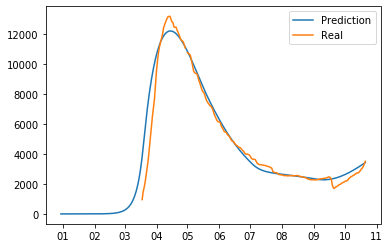

4196.709940922081
error_groups 1955.979926194283
error_total 448.1460029455595
mix_other: 0.22104404751487294 mix_leisure: 0.2279707570936489
{'work': 1.8666997973007302, 'transport': 1.8666997973007302, 'school': 1.8666997973007302, 'other': 1.8666997973007302, 'leisure': 1.8666997973007302, 'home': 1.8666997973007302}
[7.80465252e+01 1.86669980e+00 8.55362902e-01 2.21044048e-01
 2.27970757e-01 1.06429910e-02 2.34630797e-01 1.90703917e-01
 9.86672625e-01]


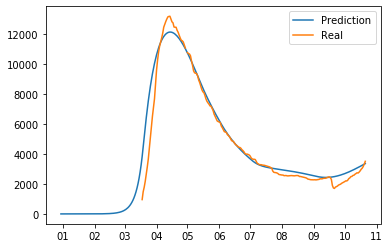

4272.212848840837
error_groups 1950.9240289910342
error_total 464.25776396996065
mix_other: 0.20197249674301987 mix_leisure: 0.25452788886543104
{'work': 1.9764824755173316, 'transport': 1.9764824755173316, 'school': 1.9764824755173316, 'other': 1.9764824755173316, 'leisure': 1.9764824755173316, 'home': 1.9764824755173316}
[7.83628935e+01 1.97648248e+00 8.63361310e-01 2.01972497e-01
 2.54527889e-01 3.67290689e-03 2.57983745e-01 1.55923497e-01
 9.68725377e-01]


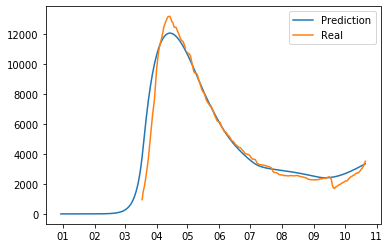

4219.834099991137
error_groups 1974.2789785561888
error_total 449.11102428698956
mix_other: 0.24368121319559088 mix_leisure: 0.1285012055920361
{'work': 1.8015159730592516, 'transport': 1.8015159730592516, 'school': 1.8015159730592516, 'other': 1.8015159730592516, 'leisure': 1.8015159730592516, 'home': 1.8015159730592516}
[7.83025042e+01 1.80151597e+00 8.63771111e-01 2.43681213e-01
 1.28501206e-01 4.61976736e-02 7.19380732e-02 7.13549891e-02
 9.69628351e-01]
4323.488258337856
error_groups 1949.7960357857667
error_total 474.7384445104179
mix_other: 0.21057122122394473 mix_leisure: 0.24014549389976225
{'work': 1.9348945261510648, 'transport': 1.9348945261510648, 'school': 1.9348945261510648, 'other': 1.9348945261510648, 'leisure': 1.9348945261510648, 'home': 1.9348945261510648}
[7.81909259e+01 1.93489453e+00 8.62717889e-01 2.10571221e-01
 2.40145494e-01 6.18374982e-02 1.24461748e-01 1.39448112e-01
 9.59637181e-01]


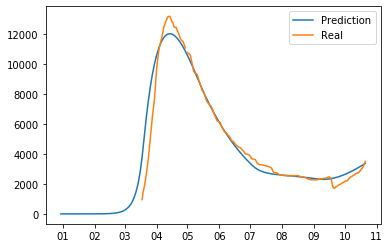

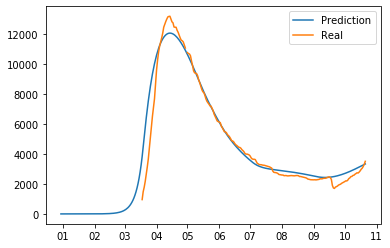

4177.850854904733
error_groups 1941.8777703025785
error_total 447.1946169204309
mix_other: 0.22178711293008624 mix_leisure: 0.16774084143727536
{'work': 1.8718894984818555, 'transport': 1.8718894984818555, 'school': 1.8718894984818555, 'other': 1.8718894984818555, 'leisure': 1.8718894984818555, 'home': 1.8718894984818555}
[7.81205406e+01 1.87188950e+00 8.70111268e-01 2.21787113e-01
 1.67740841e-01 2.68153346e-02 1.33848334e-01 1.59245187e-01
 9.46425905e-01]


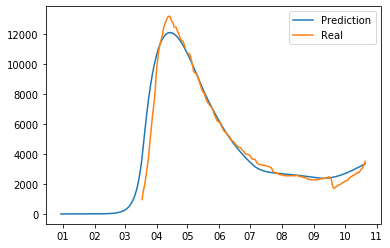

4226.121841051102
error_groups 1946.7755486029143
error_total 455.8692584896375
mix_other: 0.21891355461651196 mix_leisure: 0.18416429032435444
{'work': 1.903287004607193, 'transport': 1.903287004607193, 'school': 1.903287004607193, 'other': 1.903287004607193, 'leisure': 1.903287004607193, 'home': 1.903287004607193}
[7.80243012e+01 1.90328700e+00 8.70469956e-01 2.18913555e-01
 1.84164290e-01 7.66203253e-02 2.26338653e-03 1.70513204e-01
 9.43143042e-01]


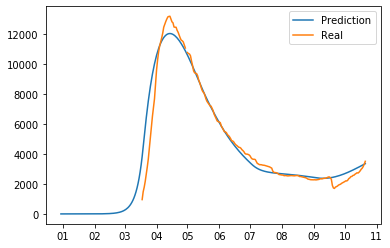

4119.551247426499
error_groups 1941.613522337788
error_total 435.5875450177422
mix_other: 0.19781905195479055 mix_leisure: 0.2228518736888313
{'work': 1.9517812121767881, 'transport': 1.9517812121767881, 'school': 1.9517812121767881, 'other': 1.9517812121767881, 'leisure': 1.9517812121767881, 'home': 1.9517812121767881}
[7.83116056e+01 1.95178121e+00 8.66466428e-01 1.97819052e-01
 2.22851874e-01 2.98233563e-02 2.67197243e-01 4.59455253e-02
 9.83628609e-01]


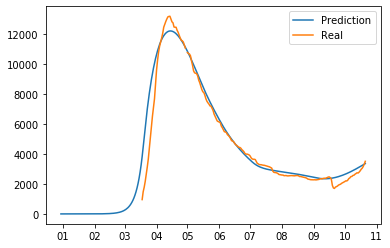

4140.828482649052
error_groups 1959.6552306806468
error_total 436.2346503936809
mix_other: 0.20029711848614018 mix_leisure: 0.19352595261334354
{'work': 1.9542034269664195, 'transport': 1.9542034269664195, 'school': 1.9542034269664195, 'other': 1.9542034269664195, 'leisure': 1.9542034269664195, 'home': 1.9542034269664195}
[7.86251316e+01 1.95420343e+00 8.69000928e-01 2.00297118e-01
 1.93525953e-01 3.74830771e-02 3.33490747e-01 7.03305657e-02
 9.89299432e-01]


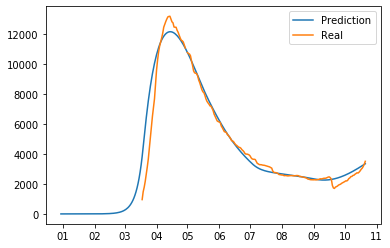

4109.210801950694
error_groups 1957.8253159767235
error_total 430.2770971947941
mix_other: 0.2065730789149719 mix_leisure: 0.20711463813476227
{'work': 1.9387325294505748, 'transport': 1.9387325294505748, 'school': 1.9387325294505748, 'other': 1.9387325294505748, 'leisure': 1.9387325294505748, 'home': 1.9387325294505748}
[7.86976685e+01 1.93873253e+00 8.65788180e-01 2.06573079e-01
 2.07114638e-01 4.29961318e-02 4.64066608e-02 3.44713784e-02
 9.84002903e-01]
4255.568820977151
error_groups 1930.9607493888934
error_total 464.92161431765135
mix_other: 0.1862736582896607 mix_leisure: 0.21353633489894563
{'work': 1.9635641334364262, 'transport': 1.9635641334364262, 'school': 1.9635641334364262, 'other': 1.9635641334364262, 'leisure': 1.9635641334364262, 'home': 1.9635641334364262}
[7.84153808e+01 1.96356413e+00 8.70205467e-01 1.86273658e-01
 2.13536335e-01 1.38078519e-02 3.67499902e-01 1.34026497e-02
 9.92668643e-01]


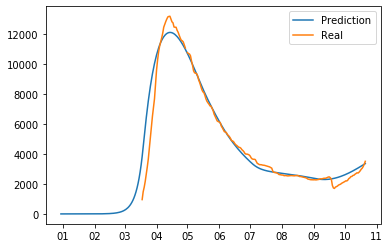

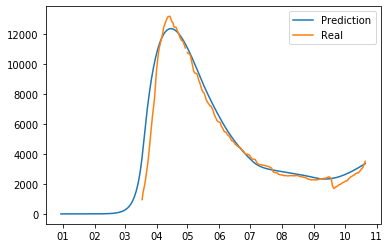

4335.207442473021
error_groups 1994.0261510424234
error_total 468.2362582861195
mix_other: 0.2246968147566002 mix_leisure: 0.12652086805305374
{'work': 1.865597822149085, 'transport': 1.865597822149085, 'school': 1.865597822149085, 'other': 1.865597822149085, 'leisure': 1.865597822149085, 'home': 1.865597822149085}
[7.81591635e+01 1.86559782e+00 8.66691614e-01 2.24696815e-01
 1.26520868e-01 5.53568637e-02 3.74794071e-01 1.00194278e-01
 9.97237252e-01]


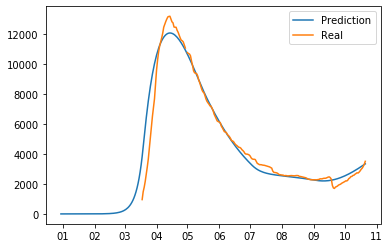

4390.062577989596
error_groups 1909.708424008163
error_total 496.07083079628666
mix_other: 0.18681595861260014 mix_leisure: 0.23364567536150865
{'work': 1.985652607002119, 'transport': 1.985652607002119, 'school': 1.985652607002119, 'other': 1.985652607002119, 'leisure': 1.985652607002119, 'home': 1.985652607002119}
[7.83569237e+01 1.98565261e+00 8.73442781e-01 1.86815959e-01
 2.33645675e-01 1.09001945e-03 3.74229435e-01 6.60451430e-03
 9.62549597e-01]


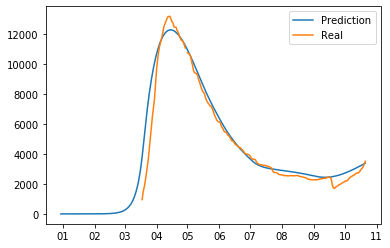

4282.601419340624
error_groups 1961.6152030931823
error_total 464.1972432494882
mix_other: 0.21723890677416124 mix_leisure: 0.19959260418925606
{'work': 1.8945864166035005, 'transport': 1.8945864166035005, 'school': 1.8945864166035005, 'other': 1.8945864166035005, 'leisure': 1.8945864166035005, 'home': 1.8945864166035005}
[7.84053909e+01 1.89458642e+00 8.63087345e-01 2.17238907e-01
 1.99592604e-01 2.25895593e-02 2.26865674e-01 6.54566046e-02
 9.72773807e-01]


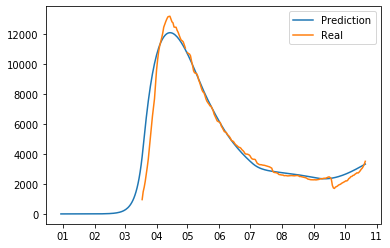

4162.177325032255
error_groups 1976.4112102669794
error_total 437.1532229530551
mix_other: 0.2084073370640635 mix_leisure: 0.21415307091566682
{'work': 1.955920760536801, 'transport': 1.955920760536801, 'school': 1.955920760536801, 'other': 1.955920760536801, 'leisure': 1.955920760536801, 'home': 1.955920760536801}
[78.30448001  1.95592076  0.86341391  0.20840734  0.21415307  0.08129458
  0.2289342   0.08474994  0.99376452]


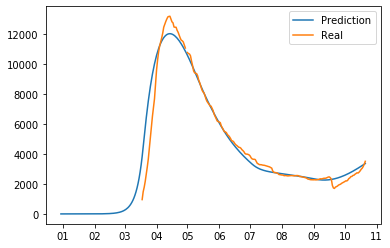

4174.914422970911
error_groups 1958.1164124286267
error_total 443.3596021084569
mix_other: 0.217007652749439 mix_leisure: 0.17695782259368775
{'work': 1.900376634645085, 'transport': 1.900376634645085, 'school': 1.900376634645085, 'other': 1.900376634645085, 'leisure': 1.900376634645085, 'home': 1.900376634645085}
[7.86026218e+01 1.90037663e+00 8.67913590e-01 2.17007653e-01
 1.76957823e-01 3.67399805e-02 3.82497665e-03 3.14659794e-02
 9.72833243e-01]


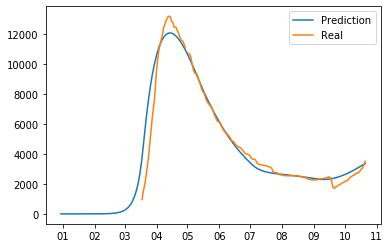

4279.579638652644
error_groups 1922.9594995065988
error_total 471.324027829209
mix_other: 0.19538966585351925 mix_leisure: 0.2141821185703195
{'work': 1.9595610248915052, 'transport': 1.9595610248915052, 'school': 1.9595610248915052, 'other': 1.9595610248915052, 'leisure': 1.9595610248915052, 'home': 1.9595610248915052}
[7.88148369e+01 1.95956102e+00 8.71715832e-01 1.95389666e-01
 2.14182119e-01 3.04247457e-02 9.25719666e-02 2.53496171e-02
 9.70903372e-01]


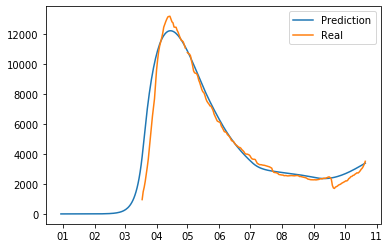

4154.616989435504
error_groups 1960.9305169172744
error_total 438.7372945036459
mix_other: 0.2074676855144192 mix_leisure: 0.22723913681031038
{'work': 1.9450381114850104, 'transport': 1.9450381114850104, 'school': 1.9450381114850104, 'other': 1.9450381114850104, 'leisure': 1.9450381114850104, 'home': 1.9450381114850104}
[7.86081015e+01 1.94503811e+00 8.62475127e-01 2.07467686e-01
 2.27239137e-01 3.27893211e-02 2.05987911e-02 9.12270736e-02
 9.85043478e-01]


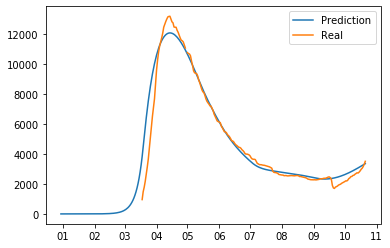

4120.557938538363
error_groups 1962.7806813334914
error_total 431.55545144097425
mix_other: 0.21440331863078915 mix_leisure: 0.2191300518553202
{'work': 1.9004785480816757, 'transport': 1.9004785480816757, 'school': 1.9004785480816757, 'other': 1.9004785480816757, 'leisure': 1.9004785480816757, 'home': 1.9004785480816757}
[78.50042634  1.90047855  0.85831338  0.21440332  0.21913005  0.0909804
  0.16097445  0.08929702  0.99716352]
4186.3922735989245
error_groups 1939.0807680044745
error_total 449.46230111888997
mix_other: 0.20863954676378743 mix_leisure: 0.17483200537821375
{'work': 1.8986892960165174, 'transport': 1.8986892960165174, 'school': 1.8986892960165174, 'other': 1.8986892960165174, 'leisure': 1.8986892960165174, 'home': 1.8986892960165174}
[7.87107353e+01 1.89868930e+00 8.69622413e-01 2.08639547e-01
 1.74832005e-01 6.61087797e-02 2.24608721e-01 1.84245006e-01
 9.78304032e-01]


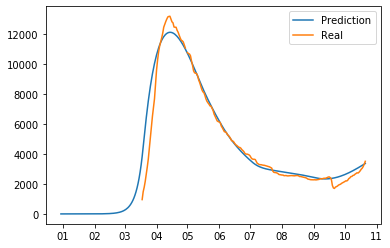

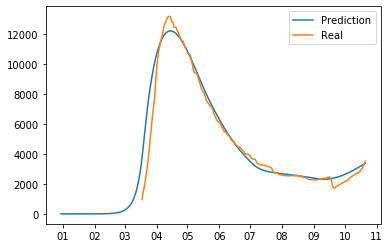

4174.243130651232
error_groups 1969.4487610025387
error_total 440.9588739297385
4266.616488528145
mix_other: 0.2068491055988485 mix_leisure: 0.2003562670399318
error_groups 1965.8157872549623
{'work': 1.9279426659613357, 'transport': 1.9279426659613357, 'school': 1.9279426659613357, 'other': 1.9279426659613357, 'leisure': 1.9279426659613357, 'home': 1.9279426659613357}
error_total 460.1601402546365
mix_other: 0.20435635906892902 mix_leisure: 0.21066573685979573
[7.89000727e+01 1.92794267e+00 8.63706033e-01 2.06849106e-01
 2.00356267e-01 3.67716597e-02 9.07548690e-02 3.94108206e-02
 9.96434041e-01]
{'work': 1.9595610248915052, 'transport': 1.9595610248915052, 'school': 1.9595610248915052, 'other': 1.9595610248915052, 'leisure': 1.9595610248915052, 'home': 1.9595610248915052}
4100.437676737647
[7.88148369e+01 1.95956102e+00 8.67161859e-01 2.04356359e-01
 2.10665737e-01 3.66473887e-02 9.25719666e-02 3.91773519e-02
 9.77054954e-01]
error_groups 1958.7517573539517
error_total 428.3371838767

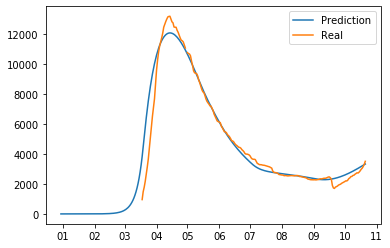

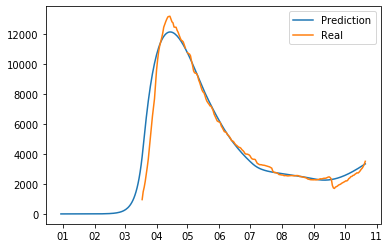

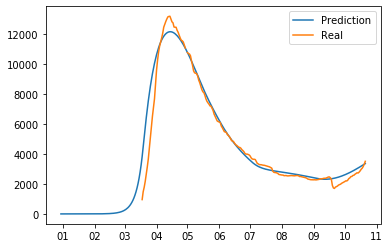

4091.5142359121546
error_groups 1955.975875397676
error_total 427.1076721028957
mix_other: 0.19319855695655147 mix_leisure: 0.21382851101880224
{'work': 1.9776498186145113, 'transport': 1.9776498186145113, 'school': 1.9776498186145113, 'other': 1.9776498186145113, 'leisure': 1.9776498186145113, 'home': 1.9776498186145113}
[7.88043740e+01 1.97764982e+00 8.67819376e-01 1.93198557e-01
 2.13828511e-01 2.85405840e-02 1.15615202e-01 4.83743694e-02
 9.97237252e-01]
4154.088591717135
error_groups 1957.5839234083678
error_total 439.3009336617535
mix_other: 0.20896151865267643 mix_leisure: 0.1846413260745593
{'work': 1.9359117431056792, 'transport': 1.9359117431056792, 'school': 1.9359117431056792, 'other': 1.9359117431056792, 'leisure': 1.9359117431056792, 'home': 1.9359117431056792}
[7.88040744e+01 1.93591174e+00 8.70469956e-01 2.08961519e-01
 1.84641326e-01 7.66203253e-02 1.34052512e-01 1.70513204e-01
 9.72360928e-01]


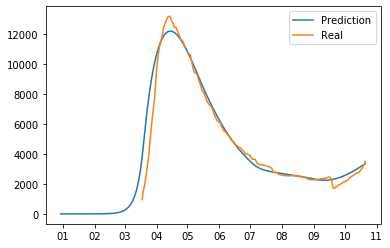

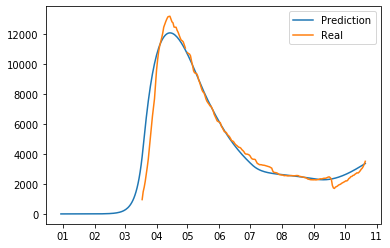

4077.802115987296
error_groups 1960.6123283450154
error_total 423.4379575284561
mix_other: 0.19764009974880792 mix_leisure: 0.2149568318296563
{'work': 1.9785454079792566, 'transport': 1.9785454079792566, 'school': 1.9785454079792566, 'other': 1.9785454079792566, 'leisure': 1.9785454079792566, 'home': 1.9785454079792566}
[7.87469905e+01 1.97854541e+00 8.66912383e-01 1.97640100e-01
 2.14956832e-01 1.29524953e-02 3.44240332e-01 1.66214385e-01
 9.94333519e-01]4114.996392476352

error_groups 1953.0346395629108
error_total 432.3923505826883
mix_other: 0.19982908864409754 mix_leisure: 0.18999353180064132
{'work': 1.9535250877555388, 'transport': 1.9535250877555388, 'school': 1.9535250877555388, 'other': 1.9535250877555388, 'leisure': 1.9535250877555388, 'home': 1.9535250877555388}
[7.89597972e+01 1.95352509e+00 8.71222494e-01 1.99829089e-01
 1.89993532e-01 4.52268286e-02 1.23392571e-01 6.24220509e-02
 9.81975046e-01]


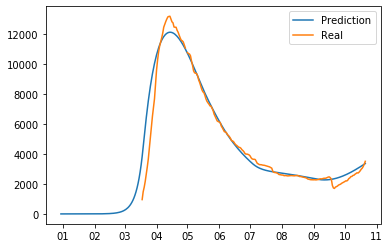

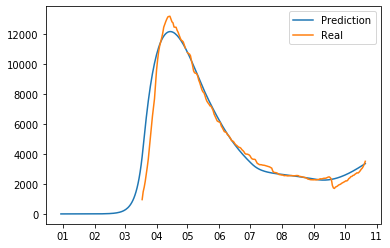

4161.863730380616
error_groups 1933.9091932047916
error_total 445.59090743516487
mix_other: 0.20131784720817658 mix_leisure: 0.20630878161739807
{'work': 1.9295167301764247, 'transport': 1.9295167301764247, 'school': 1.9295167301764247, 'other': 1.9295167301764247, 'leisure': 1.9295167301764247, 'home': 1.9295167301764247}
[7.87300271e+01 1.92951673e+00 8.68986107e-01 2.01317847e-01
 2.06308782e-01 3.05362009e-02 2.20959053e-01 1.11940846e-01
 9.70780171e-01]


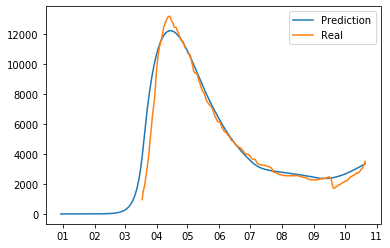

4225.862289393075
error_groups 1959.1798756475773
4187.9876999478665
error_total 453.3364827490997
4207.255902257931
error_groups 1955.228200301832
mix_other: 0.1987550484793456 mix_leisure: 0.24713237950968092
error_groups 1966.412235983285
{'work': 1.9982717835959116, 'transport': 1.9982717835959116, 'school': 1.9982717835959116, 'other': 1.9982717835959116, 'leisure': 1.9982717835959116, 'home': 1.9982717835959116}
error_total 448.1687332549292
error_total 446.55189992920697
mix_other: 0.19135939548074443 mix_leisure: 0.24204954480988378
[7.85781285e+01 1.99827178e+00 8.63967049e-01 1.98755048e-01
 2.47132380e-01 6.50323261e-02 9.07548690e-02 5.69192281e-02
 9.88554529e-01]mix_other: 0.2035632208488825 mix_leisure: 0.17817015946252873
{'work': 1.9842639699553666, 'transport': 1.9842639699553666, 'school': 1.9842639699553666, 'other': 1.9842639699553666, 'leisure': 1.9842639699553666, 'home': 1.9842639699553666}

[7.89874476e+01 1.98426397e+00 8.63892580e-01 1.91359395e-01
 2.4204954

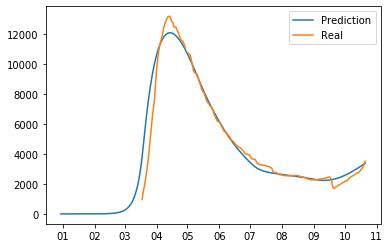

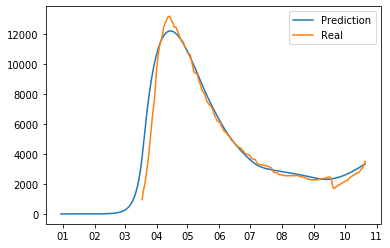

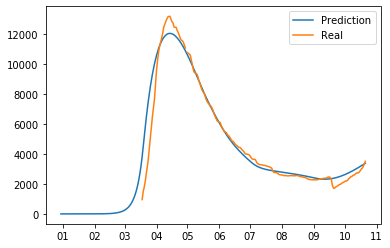

4085.99105313669
error_groups 1952.3675187384379
error_total 426.7247068796504
mix_other: 0.19154229513686627 mix_leisure: 0.20420311912384337
{'work': 1.979798951088517, 'transport': 1.979798951088517, 'school': 1.979798951088517, 'other': 1.979798951088517, 'leisure': 1.979798951088517, 'home': 1.979798951088517}
[7.89289818e+01 1.97979895e+00 8.70404761e-01 1.91542295e-01
 2.04203119e-01 5.54533344e-03 1.51115038e-01 4.97280916e-02
 9.94992069e-01]


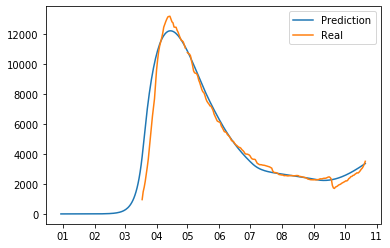

4193.699599034687
error_groups 1948.1866351878184
error_total 449.10259276937364
mix_other: 0.1984170873764436 mix_leisure: 0.2149568318296563
{'work': 1.9633611650198852, 'transport': 1.9633611650198852, 'school': 1.9633611650198852, 'other': 1.9633611650198852, 'leisure': 1.9633611650198852, 'home': 1.9633611650198852}
[7.88927477e+01 1.96336117e+00 8.66912383e-01 1.98417087e-01
 2.14956832e-01 1.03295352e-02 2.59269860e-01 1.08850760e-01
 9.94333519e-01]


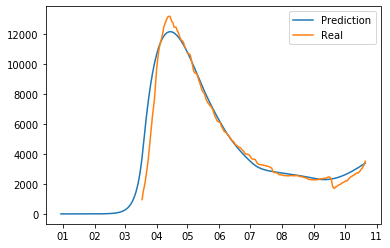

4112.3416997992235
error_groups 1949.0325519139044
error_total 432.6618295770638
mix_other: 0.19621085776025027 mix_leisure: 0.23136009700062254
{'work': 1.9904585130861077, 'transport': 1.9904585130861077, 'school': 1.9904585130861077, 'other': 1.9904585130861077, 'leisure': 1.9904585130861077, 'home': 1.9904585130861077}
[7.83038921e+01 1.99045851e+00 8.67972770e-01 1.96210858e-01
 2.31360097e-01 3.15771831e-02 2.37911139e-02 3.17086737e-02
 9.79942254e-01]


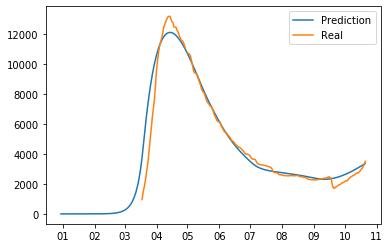

4158.641629179425
error_groups 1956.1018233937598
error_total 440.50796115713297
mix_other: 0.22429081864522926 mix_leisure: 0.12975512260401506
{'work': 1.8438401354337415, 'transport': 1.8438401354337415, 'school': 1.8438401354337415, 'other': 1.8438401354337415, 'leisure': 1.8438401354337415, 'home': 1.8438401354337415}
[7.82014173e+01 1.84384014e+00 8.68757380e-01 2.24290819e-01
 1.29755123e-01 1.06944372e-02 3.97311888e-01 1.62326490e-01
 9.76819051e-01]


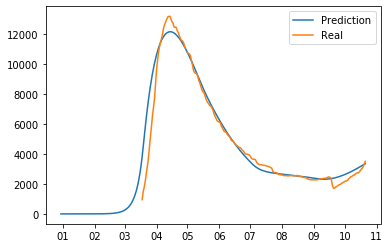

4171.20845045279
error_groups 1963.6851815418079
error_total 441.50465378219644
mix_other: 0.19660767448394123 mix_leisure: 0.20910035783168962
{'work': 1.9664182663157916, 'transport': 1.9664182663157916, 'school': 1.9664182663157916, 'other': 1.9664182663157916, 'leisure': 1.9664182663157916, 'home': 1.9664182663157916}
[7.88145955e+01 1.96641827e+00 8.66793069e-01 1.96607674e-01
 2.09100358e-01 3.41676795e-02 9.11920141e-02 1.44452916e-01
 9.96362667e-01]


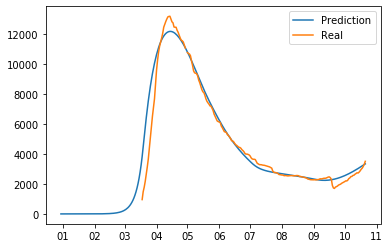

4181.054608348584
error_groups 1953.1259647149852
error_total 445.5857287267199
mix_other: 0.21725556906376836 mix_leisure: 0.18063990459683998
{'work': 1.8793065582792492, 'transport': 1.8793065582792492, 'school': 1.8793065582792492, 'other': 1.8793065582792492, 'leisure': 1.8793065582792492, 'home': 1.8793065582792492}
[7.86535409e+01 1.87930656e+00 8.64278566e-01 2.17255569e-01
 1.80639905e-01 4.37934755e-02 1.01294286e-01 3.12125920e-02
 9.87937230e-01]


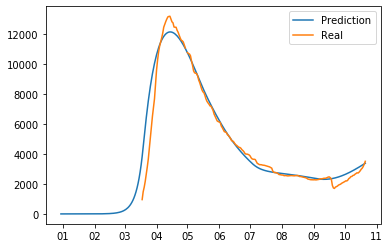

4103.690705319794
error_groups 1944.9721760660575
error_total 431.7437058507473
mix_other: 0.19882077504806994 mix_leisure: 0.1983647350694726
{'work': 1.9535250877555388, 'transport': 1.9535250877555388, 'school': 1.9535250877555388, 'other': 1.9535250877555388, 'leisure': 1.9535250877555388, 'home': 1.9535250877555388}
[7.87367833e+01 1.95352509e+00 8.70493228e-01 1.98820775e-01
 1.98364735e-01 3.72681740e-02 1.23392571e-01 1.33382193e-01
 9.81975046e-01]


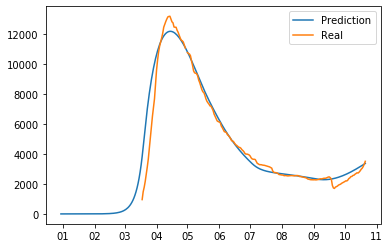

4180.025030256823
error_groups 1954.3015685931377
error_total 445.14469233273707
mix_other: 0.20455506313456084 mix_leisure: 0.18015020030687362
{'work': 1.9324678330164333, 'transport': 1.9324678330164333, 'school': 1.9324678330164333, 'other': 1.9324678330164333, 'leisure': 1.9324678330164333, 'home': 1.9324678330164333}
[7.87474622e+01 1.93246783e+00 8.70020417e-01 2.04555063e-01
 1.80150200e-01 3.26401256e-02 4.00063231e-01 1.54204315e-01
 9.80425185e-01]
4108.553718315525
error_groups 1940.710814368947
error_total 433.56858078931555
mix_other: 0.19504597930900552 mix_leisure: 0.2193574903607064
{'work': 1.9845973992996986, 'transport': 1.9845973992996986, 'school': 1.9845973992996986, 'other': 1.9845973992996986, 'leisure': 1.9845973992996986, 'home': 1.9845973992996986}
[7.88660250e+01 1.98459740e+00 8.70803737e-01 1.95045979e-01
 2.19357490e-01 5.26554059e-02 3.64846950e-01 1.19598192e-01
 9.72934600e-01]


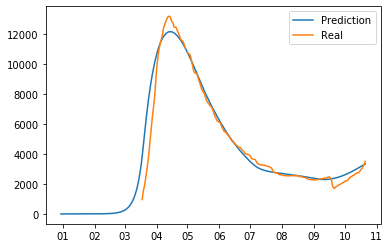

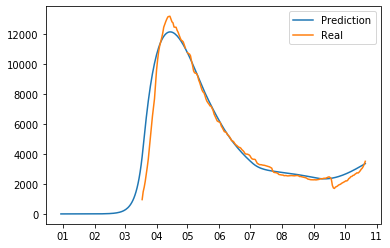

4101.738092289961
error_groups 1965.1075637268486
error_total 427.3261057126225
mix_other: 0.20245587093973194 mix_leisure: 0.21400167024960737
{'work': 1.9687606061267977, 'transport': 1.9687606061267977, 'school': 1.9687606061267977, 'other': 1.9687606061267977, 'leisure': 1.9687606061267977, 'home': 1.9687606061267977}
[7.87640416e+01 1.96876061e+00 8.66221482e-01 2.02455871e-01
 2.14001670e-01 5.51060060e-02 1.97222380e-01 1.84686944e-01
 9.89821452e-01]


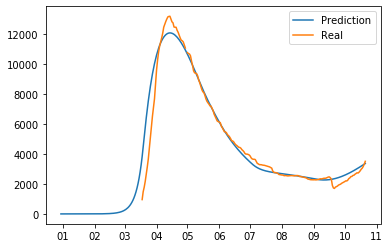

4094.850024862015
error_groups 1962.5080054310176
error_total 426.4684038861994
mix_other: 0.2052296102732284 mix_leisure: 0.2153322414729456
{'work': 1.9464120271859948, 'transport': 1.9464120271859948, 'school': 1.9464120271859948, 'other': 1.9464120271859948, 'leisure': 1.9464120271859948, 'home': 1.9464120271859948}
[7.89056355e+01 1.94641203e+00 8.63870009e-01 2.05229610e-01
 2.15332241e-01 8.55398385e-02 1.75708021e-01 5.23446903e-02
 9.92470242e-01]


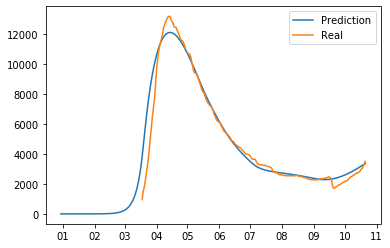

4134.411702371395
error_groups 1951.2819305474388
error_total 436.62595436479137
mix_other: 0.19224951868044704 mix_leisure: 0.22748614493059116
{'work': 1.9973211340109298, 'transport': 1.9973211340109298, 'school': 1.9973211340109298, 'other': 1.9973211340109298, 'leisure': 1.9973211340109298, 'home': 1.9973211340109298}
[7.87799437e+01 1.99732113e+00 8.67369586e-01 1.92249519e-01
 2.27486145e-01 2.72089517e-02 3.56843116e-01 1.38086944e-01
 9.96539433e-01]


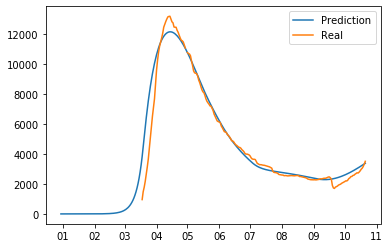

4150.764423238164
error_groups 1966.698974218093
error_total 436.8130898040142
mix_other: 0.201426712071884 mix_leisure: 0.20376082634876047
{'work': 1.9823744722010948, 'transport': 1.9823744722010948, 'school': 1.9823744722010948, 'other': 1.9823744722010948, 'leisure': 1.9823744722010948, 'home': 1.9823744722010948}
[7.87713296e+01 1.98237447e+00 8.69089230e-01 2.01426712e-01
 2.03760826e-01 7.26753132e-03 4.15020477e-01 8.22515123e-02
 9.85981148e-01]


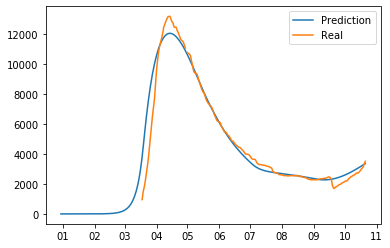

4176.2958195809015
error_groups 1966.0264069627162
error_total 442.0538825236371
mix_other: 0.21809468768127793 mix_leisure: 0.176216644727392
{'work': 1.8965909732079798, 'transport': 1.8965909732079798, 'school': 1.8965909732079798, 'other': 1.8965909732079798, 'leisure': 1.8965909732079798, 'home': 1.8965909732079798}
[7.86422811e+01 1.89659097e+00 8.65857372e-01 2.18094688e-01
 1.76216645e-01 3.27377688e-02 1.71604828e-01 6.77181861e-02
 9.84034544e-01]
4120.9640251350775
error_groups 1957.1748174151603
error_total 432.75784154398355
mix_other: 0.19853932102463884 mix_leisure: 0.24156521292554956
{'work': 1.9691374317869548, 'transport': 1.9691374317869548, 'school': 1.9691374317869548, 'other': 1.9691374317869548, 'leisure': 1.9691374317869548, 'home': 1.9691374317869548}
[7.84041771e+01 1.96913743e+00 8.61608347e-01 1.98539321e-01
 2.41565213e-01 1.41547772e-03 1.52804083e-01 1.88468266e-01
 9.99207264e-01]


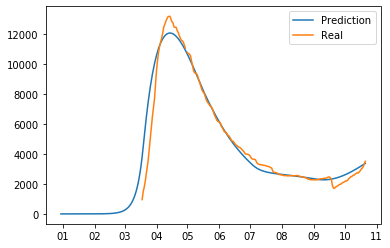

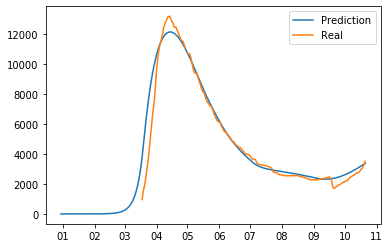

4110.338468082435
error_groups 1958.6792253513693
error_total 430.3318485462131
mix_other: 0.1970656910859374 mix_leisure: 0.20975230498813957
{'work': 1.964220173993214, 'transport': 1.964220173993214, 'school': 1.964220173993214, 'other': 1.964220173993214, 'leisure': 1.964220173993214, 'home': 1.964220173993214}
[7.86726475e+01 1.96422017e+00 8.66867481e-01 1.97065691e-01
 2.09752305e-01 4.29556135e-02 2.63316209e-01 5.30623031e-02
 9.96020896e-01]


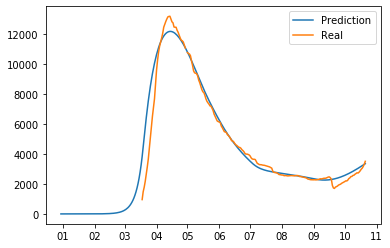

4121.639755838801
error_groups 1952.2775240859162
error_total 433.87244635057687
mix_other: 0.19571829462621715 mix_leisure: 0.19256474370373644
{'work': 1.9723287528852076, 'transport': 1.9723287528852076, 'school': 1.9723287528852076, 'other': 1.9723287528852076, 'leisure': 1.9723287528852076, 'home': 1.9723287528852076}
[7.89665445e+01 1.97232875e+00 8.71800572e-01 1.95718295e-01
 1.92564744e-01 3.57083218e-02 3.16938334e-01 1.17221509e-03
 9.90084588e-01]


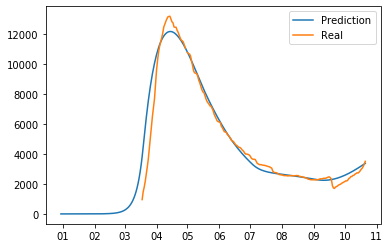

4119.0648131518
error_groups 1968.2282656354325
error_total 430.16730950327354
mix_other: 0.19520282013183066 mix_leisure: 0.22621421118954543
{'work': 1.9995624553432019, 'transport': 1.9995624553432019, 'school': 1.9995624553432019, 'other': 1.9995624553432019, 'leisure': 1.9995624553432019, 'home': 1.9995624553432019}
[7.87438628e+01 1.99956246e+00 8.66142650e-01 1.95202820e-01
 2.26214211e-01 6.56581619e-02 2.75844240e-01 3.53048079e-02
 9.97370050e-01]


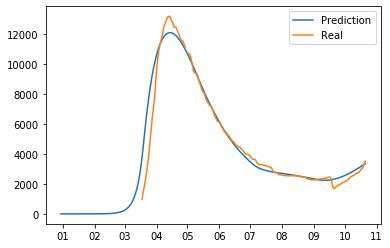

4158.4415899349
error_groups 1952.316251579514
4101.058401611057
error_total 441.22506767107717
error_groups 1962.4718896028894
mix_other: 0.19183477773663177 mix_leisure: 0.19809578635982783
error_total 427.7173024016334
{'work': 1.988542288917972, 'transport': 1.988542288917972, 'school': 1.988542288917972, 'other': 1.988542288917972, 'leisure': 1.988542288917972, 'home': 1.988542288917972}
mix_other: 0.20006741862101246 mix_leisure: 0.17692721862545557
[7.80981829e+01 1.98854229e+00 8.73263894e-01 1.91834778e-01
 1.98095786e-01 6.68130721e-03 3.11567648e-01 4.06707086e-02
 9.82992498e-01]{'work': 1.9477753377864255, 'transport': 1.9477753377864255, 'school': 1.9477753377864255, 'other': 1.9477753377864255, 'leisure': 1.9477753377864255, 'home': 1.9477753377864255}

[7.88382573e+01 1.94777534e+00 8.69984101e-01 2.00067419e-01
 1.76927219e-01 2.06367444e-02 3.81574348e-01 3.54420482e-02
 9.98415279e-01]


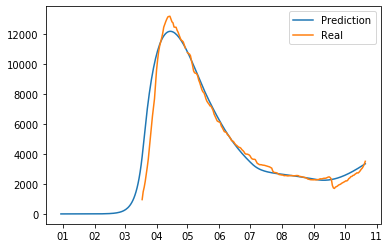

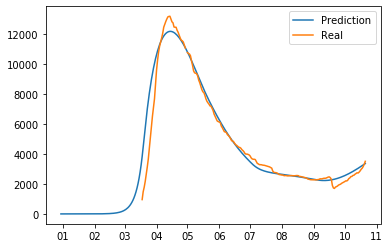

4133.838777964449
error_groups 1945.459632703822
error_total 437.6758290521255
mix_other: 0.19438612200480698 mix_leisure: 0.19045212599962213
{'work': 1.9774908617254896, 'transport': 1.9774908617254896, 'school': 1.9774908617254896, 'other': 1.9774908617254896, 'leisure': 1.9774908617254896, 'home': 1.9774908617254896}
[7.81635629e+01 1.97749086e+00 8.73697146e-01 1.94386122e-01
 1.90452126e-01 3.87613797e-02 4.49772529e-01 1.39338891e-01
 9.79351289e-01]4106.228222601967

error_groups 1961.992254620622
error_total 428.8471935962691
mix_other: 0.20689679876442224 mix_leisure: 0.22415975717351577
{'work': 1.9404911002999912, 'transport': 1.9404911002999912, 'school': 1.9404911002999912, 'other': 1.9404911002999912, 'leisure': 1.9404911002999912, 'home': 1.9404911002999912}
[7.84514745e+01 1.94049110e+00 8.61565390e-01 2.06896799e-01
 2.24159757e-01 1.76296850e-03 2.12956559e-01 1.38229184e-01
 9.94420741e-01]


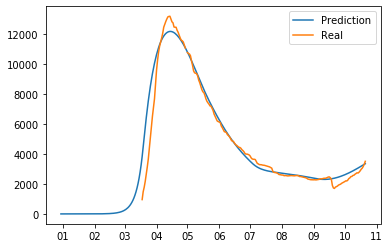

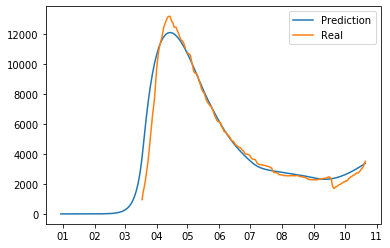

4101.92028807621
error_groups 1961.8443427092895
error_total 428.01518907338414
mix_other: 0.19571829462621715 mix_leisure: 0.22149461478538518
{'work': 1.9969432384635708, 'transport': 1.9969432384635708, 'school': 1.9969432384635708, 'other': 1.9969432384635708, 'leisure': 1.9969432384635708, 'home': 1.9969432384635708}
[7.89665445e+01 1.99694324e+00 8.67895118e-01 1.95718295e-01
 2.21494615e-01 7.41222323e-03 3.16938334e-01 1.30001252e-01
 9.90586218e-01]


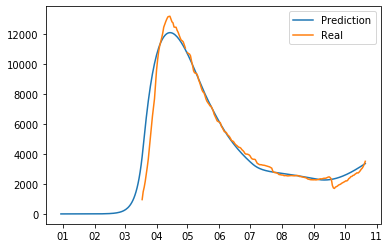

4079.0499630161657
error_groups 1962.7246341998384
error_total 423.26506576326545
mix_other: 0.20658768029304725 mix_leisure: 0.20230299666889995
{'work': 1.939820560227617, 'transport': 1.939820560227617, 'school': 1.939820560227617, 'other': 1.939820560227617, 'leisure': 1.939820560227617, 'home': 1.939820560227617}
[7.88586951e+01 1.93982056e+00 8.65053960e-01 2.06587680e-01
 2.02302997e-01 6.34687265e-02 3.48848569e-01 1.10280014e-01
 9.93180812e-01]


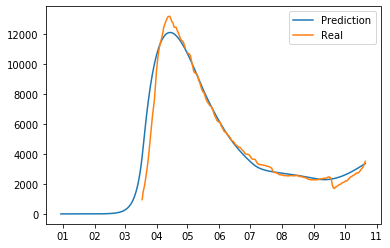

4089.900591591324
error_groups 1962.424293113872
error_total 425.4952596954904
mix_other: 0.19355717935179828 mix_leisure: 0.22277369140663555
{'work': 1.9970830631234602, 'transport': 1.9970830631234602, 'school': 1.9970830631234602, 'other': 1.9970830631234602, 'leisure': 1.9970830631234602, 'home': 1.9970830631234602}
[7.89436915e+01 1.99708306e+00 8.67329511e-01 1.93557179e-01
 2.22773691e-01 3.21698972e-02 2.31077096e-01 1.38727915e-01
 9.96020896e-01]


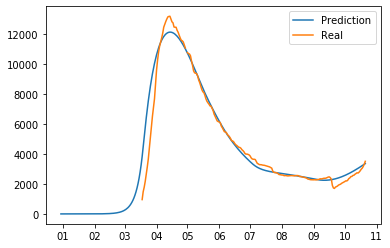

4118.93538230256
error_groups 1962.3554891252086
error_total 431.3159786354703
mix_other: 0.21330252472555478 mix_leisure: 0.1728004741303354
{'work': 1.885605867443878, 'transport': 1.885605867443878, 'school': 1.885605867443878, 'other': 1.885605867443878, 'leisure': 1.885605867443878, 'home': 1.885605867443878}
[7.85065778e+01 1.88560587e+00 8.64729338e-01 2.13302525e-01
 1.72800474e-01 1.97680701e-02 2.46610033e-01 1.47598151e-01
 9.95515906e-01]


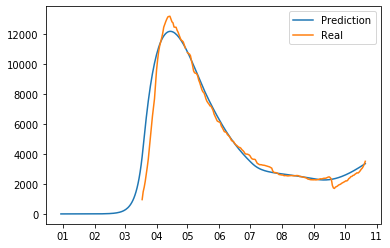

4079.8199864632943
error_groups 1965.0081098741557
error_total 422.96237531782776
mix_other: 0.20593853591339206 mix_leisure: 0.20173240369526485
{'work': 1.9347749591163157, 'transport': 1.9347749591163157, 'school': 1.9347749591163157, 'other': 1.9347749591163157, 'leisure': 1.9347749591163157, 'home': 1.9347749591163157}
[7.87367833e+01 1.93477496e+00 8.64186785e-01 2.05938536e-01
 2.01732404e-01 1.64897645e-03 2.88803844e-01 8.91162721e-02
 9.98300101e-01]


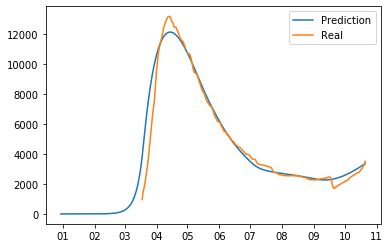

4088.6414197429376
error_groups 1946.1468144301355
error_total 428.4989210625604
mix_other: 0.19322148886687723 mix_leisure: 0.2147704012918622
{'work': 1.9695576718691366, 'transport': 1.9695576718691366, 'school': 1.9695576718691366, 'other': 1.9695576718691366, 'leisure': 1.9695576718691366, 'home': 1.9695576718691366}
[7.84987834e+01 1.96955767e+00 8.68434891e-01 1.93221489e-01
 2.14770401e-01 3.55189415e-03 1.64071466e-01 1.43899774e-01
 9.91418400e-01]


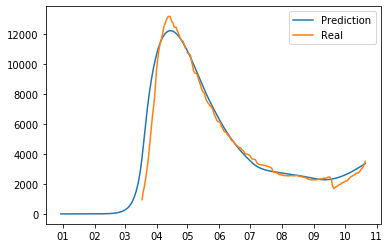

4085.7674248605927
error_groups 1953.9377524871295
error_total 426.36593447469255
mix_other: 0.19413033714742656 mix_leisure: 0.21369934517637335
{'work': 1.9764475168072955, 'transport': 1.9764475168072955, 'school': 1.9764475168072955, 'other': 1.9764475168072955, 'leisure': 1.9764475168072955, 'home': 1.9764475168072955}
[7.83528971e+01 1.97644752e+00 8.67654364e-01 1.94130337e-01
 2.13699345e-01 6.78655729e-02 1.99429068e-01 1.09145951e-01
 9.98804828e-01]


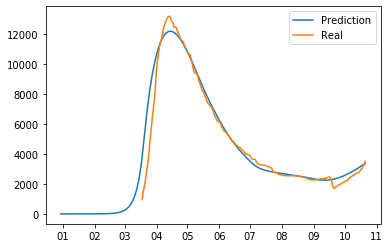

4096.345276249618
error_groups 1941.722622964141
error_total 430.92453065709554
mix_other: 0.19962763275356787 mix_leisure: 0.18834715588713913
{'work': 1.9387037582847841, 'transport': 1.9387037582847841, 'school': 1.9387037582847841, 'other': 1.9387037582847841, 'leisure': 1.9387037582847841, 'home': 1.9387037582847841}
[7.86853055e+01 1.93870376e+00 8.71337598e-01 1.99627633e-01
 1.88347156e-01 7.19761752e-02 1.28893780e-01 1.45912208e-01
 9.79923180e-01]


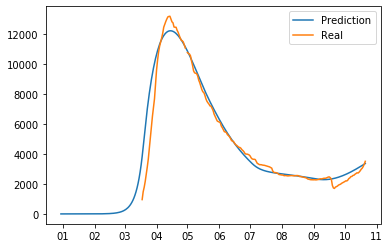

4090.0752109374152
error_groups 1947.4667904930752
error_total 428.521684088868
mix_other: 0.1954882010082954 mix_leisure: 0.1968932897935708
{'work': 1.9858727952586974, 'transport': 1.9858727952586974, 'school': 1.9858727952586974, 'other': 1.9858727952586974, 'leisure': 1.9858727952586974, 'home': 1.9858727952586974}
[7.88703279e+01 1.98587280e+00 8.73599992e-01 1.95488201e-01
 1.96893290e-01 1.47819284e-02 3.98300532e-01 1.07089546e-01
 9.77359556e-01]


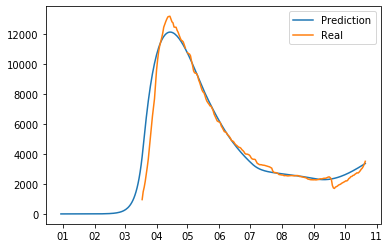

4089.6421870942213
error_groups 1958.599449738538
error_total 426.20854747113674
mix_other: 0.2002170878836549 mix_leisure: 0.2030541626250928
{'work': 1.9563236319839465, 'transport': 1.9563236319839465, 'school': 1.9563236319839465, 'other': 1.9563236319839465, 'leisure': 1.9563236319839465, 'home': 1.9563236319839465}
[7.87502975e+01 1.95632363e+00 8.67726238e-01 2.00217088e-01
 2.03054163e-01 3.05963193e-02 6.80491346e-02 5.97053948e-02
 9.91122929e-01]


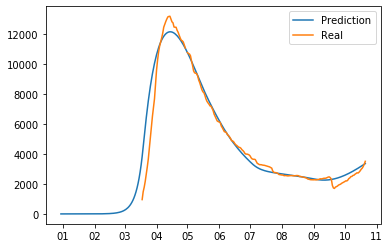

4088.1356443691657
error_groups 1952.3348968649825
error_total 427.16014950083667
mix_other: 0.19907065852350037 mix_leisure: 0.2202312056065423
{'work': 1.9491787779005108, 'transport': 1.9491787779005108, 'school': 1.9491787779005108, 'other': 1.9491787779005108, 'leisure': 1.9491787779005108, 'home': 1.9491787779005108}
[7.88213273e+01 1.94917878e+00 8.64348657e-01 1.99070659e-01
 2.20231206e-01 8.36618118e-02 2.40370504e-01 4.62979302e-02
 9.96064888e-01]


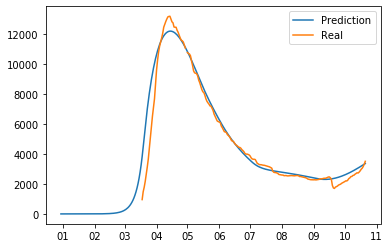

4097.8417074270255
error_groups 1958.005208562356
error_total 427.96729977293376
mix_other: 0.1978273062006145 mix_leisure: 0.22550822309280455
{'work': 1.9749739717244084, 'transport': 1.9749739717244084, 'school': 1.9749739717244084, 'other': 1.9749739717244084, 'leisure': 1.9749739717244084, 'home': 1.9749739717244084}
[7.86081015e+01 1.97497397e+00 8.64728815e-01 1.97827306e-01
 2.25508223e-01 1.24525122e-02 3.30199903e-01 9.12270736e-02
 9.98122137e-01]
4092.14773050834
error_groups 1957.6219373103904
error_total 426.9051586395899
mix_other: 0.19682975397087715 mix_leisure: 0.21088056056026772
{'work': 1.9842595632908537, 'transport': 1.9842595632908537, 'school': 1.9842595632908537, 'other': 1.9842595632908537, 'leisure': 1.9842595632908537, 'home': 1.9842595632908537}
[7.87548971e+01 1.98425956e+00 8.68708693e-01 1.96829754e-01
 2.10880561e-01 4.84729077e-02 3.53743105e-01 1.81348553e-01
 9.91418400e-01]


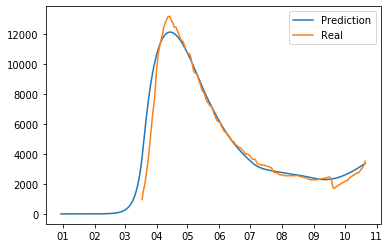

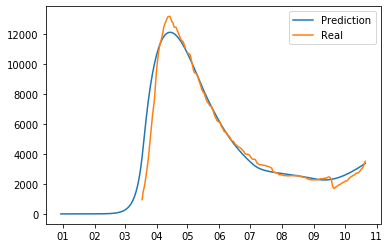

4072.8358762328553
error_groups 1958.9523934152637
error_total 422.7766965635183
mix_other: 0.19979546955936528 mix_leisure: 0.2186388556313522
{'work': 1.964265452162536, 'transport': 1.964265452162536, 'school': 1.964265452162536, 'other': 1.964265452162536, 'leisure': 1.964265452162536, 'home': 1.964265452162536}
[7.89649469e+01 1.96426545e+00 8.65334303e-01 1.99795470e-01
 2.18638856e-01 7.24799154e-02 1.12928968e-01 1.81695255e-01
 9.93714233e-01]


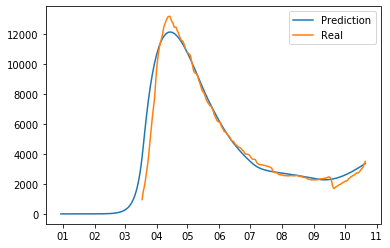

4083.5524821438394
error_groups 1958.2993018092582
error_total 425.05063606691624
mix_other: 0.20334854945279568 mix_leisure: 0.22375200028084585
{'work': 1.9474970040928081, 'transport': 1.9474970040928081, 'school': 1.9474970040928081, 'other': 1.9474970040928081, 'leisure': 1.9474970040928081, 'home': 1.9474970040928081}
[7.88274135e+01 1.94749700e+00 8.62804262e-01 2.03348549e-01
 2.23752000e-01 9.20230674e-03 1.19953213e-01 1.98703666e-01
 9.93861871e-01]


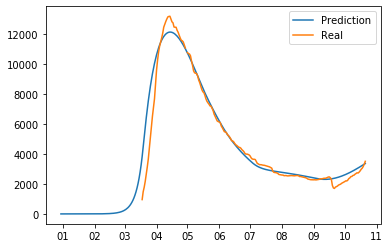

4095.541657519613
error_groups 1959.7507353962212
error_total 427.1581844246784
mix_other: 0.1943365452906981 mix_leisure: 0.22364382126107096
{'work': 1.9950247331813324, 'transport': 1.9950247331813324, 'school': 1.9950247331813324, 'other': 1.9950247331813324, 'leisure': 1.9950247331813324, 'home': 1.9950247331813324}
[7.84987834e+01 1.99502473e+00 8.67677233e-01 1.94336545e-01
 2.23643821e-01 5.05845018e-02 1.64071466e-01 1.31190711e-01
 9.91638287e-01]


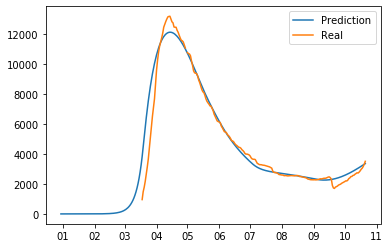

4076.8519278489807
error_groups 1952.936127836711
error_total 424.78316000245394
mix_other: 0.1982429431006723 mix_leisure: 0.19260038831938786
{'work': 1.9520731932069562, 'transport': 1.9520731932069562, 'school': 1.9520731932069562, 'other': 1.9520731932069562, 'leisure': 1.9520731932069562, 'home': 1.9520731932069562}
[7.89252666e+01 1.95207319e+00 8.69855224e-01 1.98242943e-01
 1.92600388e-01 8.89341300e-02 1.39805918e-01 8.13228480e-03
 9.91124792e-01]


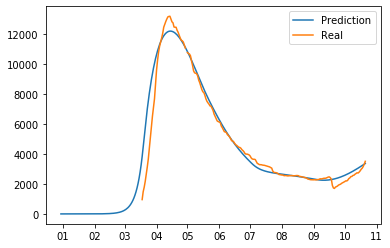

4082.839015577976
error_groups 1958.0262617515752
error_total 424.9625507652802
mix_other: 0.1957426233060544 mix_leisure: 0.20271978234989396
{'work': 1.9848871232895684, 'transport': 1.9848871232895684, 'school': 1.9848871232895684, 'other': 1.9848871232895684, 'leisure': 1.9848871232895684, 'home': 1.9848871232895684}
[7.89399285e+01 1.98488712e+00 8.70388068e-01 1.95742623e-01
 2.02719782e-01 1.78004350e-04 3.41812872e-01 1.36846021e-01
 9.91107342e-01]


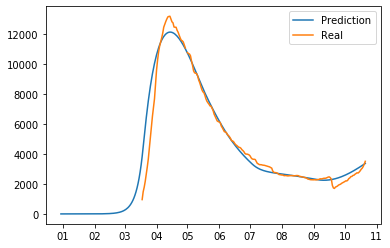

4083.753267812793
error_groups 1964.9017135457157
error_total 423.77031085341554
mix_other: 0.20353309158128818 mix_leisure: 0.1940875355446271
{'work': 1.9470190422989875, 'transport': 1.9470190422989875, 'school': 1.9470190422989875, 'other': 1.9470190422989875, 'leisure': 1.9470190422989875, 'home': 1.9470190422989875}
[78.94911902  1.94701904  0.8669246   0.20353309  0.19408754  0.08188556
  0.28023206  0.16673811  0.99687467]


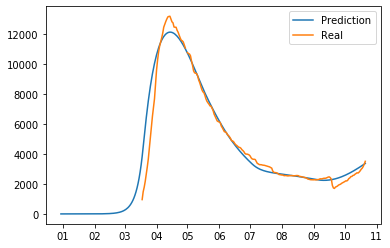

4071.984641073389
error_groups 1955.9563719293717
error_total 423.20565382880346
4069.4499291140846
mix_other: 0.19722774435437823 mix_leisure: 0.22467713830199865
error_groups 1962.3466799535852
{'work': 1.9724019434539994, 'transport': 1.9724019434539994, 'school': 1.9724019434539994, 'other': 1.9724019434539994, 'leisure': 1.9724019434539994, 'home': 1.9724019434539994}
error_total 421.4206498320999
[78.97217262  1.97240194  0.86524742  0.19722774  0.22467714  0.09983979
  0.13236172  0.18661983  0.99569993]mix_other: 0.20505435614177325 mix_leisure: 0.2087054198418033

{'work': 1.9417033083723791, 'transport': 1.9417033083723791, 'school': 1.9417033083723791, 'other': 1.9417033083723791, 'leisure': 1.9417033083723791, 'home': 1.9417033083723791}
[78.88870511  1.94170331  0.86433675  0.20505436  0.20870542  0.08893413
  0.16097288  0.15520726  0.99496376]
4054.271092680772
error_groups 1953.2913537381478
error_total 420.1959477885249
mix_other: 0.19405649618780696 mix_leisure: 0.223

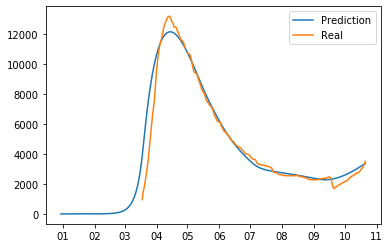

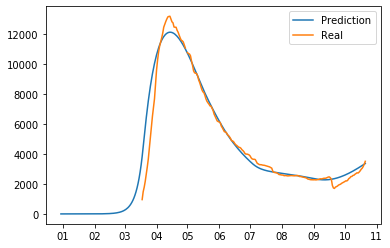

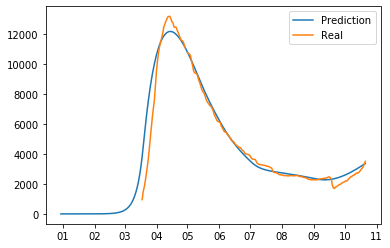

4072.145203295506
error_groups 1957.8985109685866
error_total 422.8493384653839
mix_other: 0.19484555305835605 mix_leisure: 0.23468346657846273
{'work': 1.9802426116199827, 'transport': 1.9802426116199827, 'school': 1.9802426116199827, 'other': 1.9802426116199827, 'leisure': 1.9802426116199827, 'home': 1.9802426116199827}
[7.87748385e+01 1.98024261e+00 8.63817560e-01 1.94845553e-01
 2.34683467e-01 7.22697592e-02 1.39030531e-01 1.72675679e-01
 9.99827227e-01]


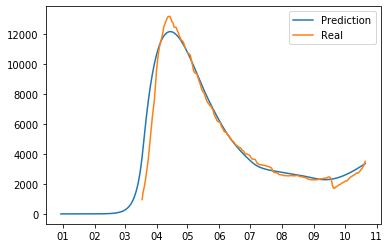

4065.6987567169585
error_groups 1952.8150791291105
error_total 422.57673551756966
mix_other: 0.2005550114912638 mix_leisure: 0.20616928056808137
{'work': 1.9529341015327413, 'transport': 1.9529341015327413, 'school': 1.9529341015327413, 'other': 1.9529341015327413, 'leisure': 1.9529341015327413, 'home': 1.9529341015327413}
[7.85107595e+01 1.95293410e+00 8.67673187e-01 2.00555011e-01
 2.06169281e-01 9.74003385e-02 4.22614886e-02 1.12685974e-01
 9.88119617e-01]


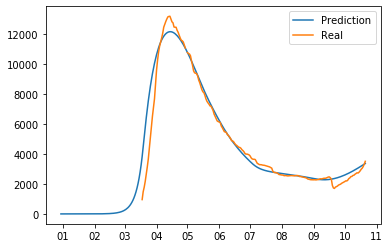

4083.4587140307603
error_groups 1955.194228436579
error_total 425.6528971188363
mix_other: 0.1914773339343675 mix_leisure: 0.229660830630673
{'work': 1.9973211340109298, 'transport': 1.9973211340109298, 'school': 1.9973211340109298, 'other': 1.9973211340109298, 'leisure': 1.9973211340109298, 'home': 1.9973211340109298}
[7.88149662e+01 1.99732113e+00 8.66657142e-01 1.91477334e-01
 2.29660831e-01 2.72089517e-02 3.56843116e-01 1.90740723e-01
 9.96539433e-01]


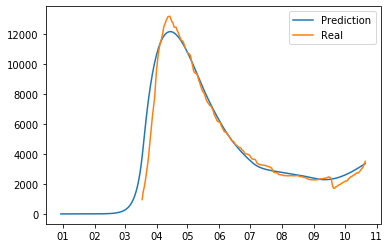

4080.7299381942785
error_groups 1952.392770799293
error_total 425.6674334789971
mix_other: 0.1929197543039416 mix_leisure: 0.20952865816297062
{'work': 1.9779614229387918, 'transport': 1.9779614229387918, 'school': 1.9779614229387918, 'other': 1.9779614229387918, 'leisure': 1.9779614229387918, 'home': 1.9779614229387918}
[78.14798097  1.97796142  0.8688484   0.19291975  0.20952866  0.09300321
  0.34046727  0.13782979  0.9956561 ]


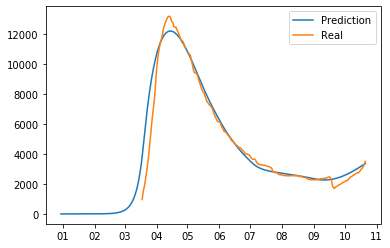

4073.1247984266693
error_groups 1952.073341757485
error_total 424.2102913338368
mix_other: 0.19648079243814842 mix_leisure: 0.20890962000749824
{'work': 1.9587609722574166, 'transport': 1.9587609722574166, 'school': 1.9587609722574166, 'other': 1.9587609722574166, 'leisure': 1.9587609722574166, 'home': 1.9587609722574166}
[7.88311968e+01 1.95876097e+00 8.67054727e-01 1.96480792e-01
 2.08909620e-01 1.88398448e-02 3.01368732e-01 1.53595884e-01
 9.96553876e-01]


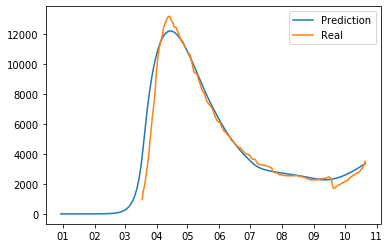

4082.001012566131
error_groups 1952.8631230169783
error_total 425.82757790983055
mix_other: 0.19732906942077622 mix_leisure: 0.22498094027202042
{'work': 1.9695284575806316, 'transport': 1.9695284575806316, 'school': 1.9695284575806316, 'other': 1.9695284575806316, 'leisure': 1.9695284575806316, 'home': 1.9695284575806316}
[7.85635403e+01 1.96952846e+00 8.65541623e-01 1.97329069e-01
 2.24980940e-01 6.52201239e-02 1.30644572e-01 1.17960671e-01
 9.93302828e-01]


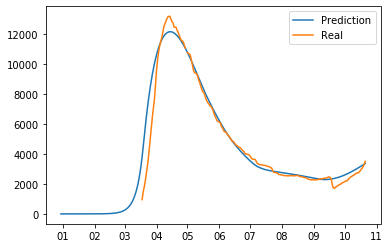

4067.1749637431662
error_groups 1953.7128955862408
error_total 422.6924136313851
mix_other: 0.19269156048773567 mix_leisure: 0.21670786202414571
{'work': 1.983106958016032, 'transport': 1.983106958016032, 'school': 1.983106958016032, 'other': 1.983106958016032, 'leisure': 1.983106958016032, 'home': 1.983106958016032}
[7.83772986e+01 1.98310696e+00 8.68148916e-01 1.92691560e-01
 2.16707862e-01 6.30192266e-02 2.14813798e-01 8.93506825e-02
 9.95574298e-01]


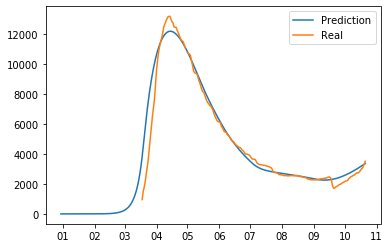

4086.095030372915
error_groups 1945.750215893254
error_total 428.06896289593226
mix_other: 0.19156805301117025 mix_leisure: 0.21800426123775374
{'work': 1.9776719454030607, 'transport': 1.9776719454030607, 'school': 1.9776719454030607, 'other': 1.9776719454030607, 'leisure': 1.9776719454030607, 'home': 1.9776719454030607}
[7.88833765e+01 1.97767195e+00 8.68650497e-01 1.91568053e-01
 2.18004261e-01 6.29404179e-02 1.81421390e-01 1.75072185e-01
 9.91809027e-01]
4069.8663328963567
error_groups 1955.793367868771
error_total 422.81459300551717
mix_other: 0.19513038970815877 mix_leisure: 0.22138794413814156
{'work': 1.9835935805707925, 'transport': 1.9835935805707925, 'school': 1.9835935805707925, 'other': 1.9835935805707925, 'leisure': 1.9835935805707925, 'home': 1.9835935805707925}
[7.88589542e+01 1.98359358e+00 8.67001658e-01 1.95130390e-01
 2.21387944e-01 3.82033635e-02 2.41099271e-01 1.40284039e-01
 9.94914257e-01]


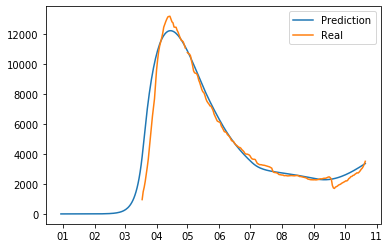

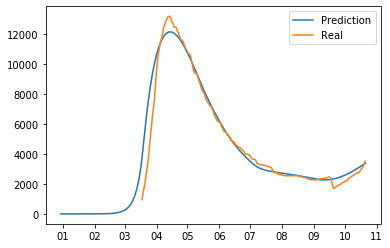

4081.9130888690897
error_groups 1956.7754437270294
error_total 425.02752902841206
mix_other: 0.19001968086876042 mix_leisure: 0.21051689331568285
{'work': 1.9979508140698727, 'transport': 1.9979508140698727, 'school': 1.9979508140698727, 'other': 1.9979508140698727, 'leisure': 1.9979508140698727, 'home': 1.9979508140698727}
[7.86185397e+01 1.99795081e+00 8.69997785e-01 1.90019681e-01
 2.10516893e-01 7.64679702e-02 2.44590019e-01 1.89389517e-01
 9.99283473e-01]


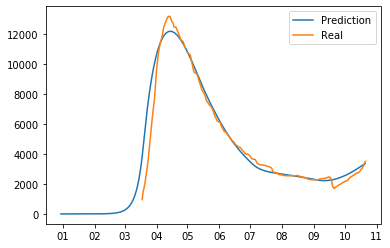

4079.3317149025834
error_groups 1957.4924748847654
error_total 424.36784800356367
mix_other: 0.19297473161346845 mix_leisure: 0.24159302803331656
{'work': 1.9937725805567565, 'transport': 1.9937725805567565, 'school': 1.9937725805567565, 'other': 1.9937725805567565, 'leisure': 1.9937725805567565, 'home': 1.9937725805567565}
[7.83407340e+01 1.99377258e+00 8.64118707e-01 1.92974732e-01
 2.41593028e-01 1.29554596e-02 1.72190143e-01 1.30136684e-01
 9.98120034e-01]


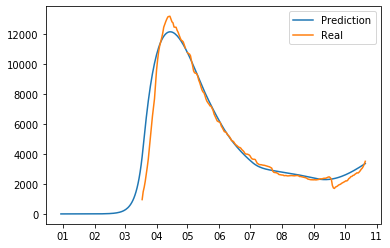

4083.206342104433
error_groups 1962.773703986885
error_total 424.08652762350954
mix_other: 0.2056448815802917 mix_leisure: 0.20510530556493767
{'work': 1.9368583228916052, 'transport': 1.9368583228916052, 'school': 1.9368583228916052, 'other': 1.9368583228916052, 'leisure': 1.9368583228916052, 'home': 1.9368583228916052}
[7.88085555e+01 1.93685832e+00 8.64521466e-01 2.05644882e-01
 2.05105306e-01 6.46988621e-02 1.56874973e-01 8.47097251e-02
 9.94626414e-01]
4077.952556037861
error_groups 1951.324060475899
error_total 425.3256991123924
mix_other: 0.2030163278500986 mix_leisure: 0.20575962766680023
{'work': 1.9443470199215098, 'transport': 1.9443470199215098, 'school': 1.9443470199215098, 'other': 1.9443470199215098, 'leisure': 1.9443470199215098, 'home': 1.9443470199215098}
[7.86214484e+01 1.94434702e+00 8.67205712e-01 2.03016328e-01
 2.05759628e-01 4.55909262e-02 2.21579980e-01 1.82036759e-01
 9.84000024e-01]


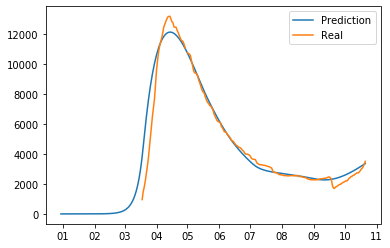

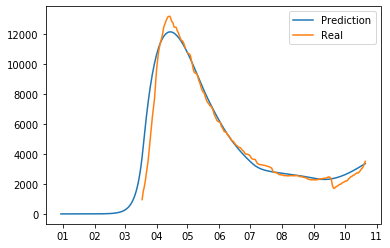

4051.926719519743
error_groups 1956.4326520246127
error_total 419.0988134990261
mix_other: 0.1921596497079806 mix_leisure: 0.2129248665044745
{'work': 1.989039934757285, 'transport': 1.989039934757285, 'school': 1.989039934757285, 'other': 1.989039934757285, 'leisure': 1.989039934757285, 'home': 1.989039934757285}
[7.86685745e+01 1.98903993e+00 8.69010134e-01 1.92159650e-01
 2.12924867e-01 3.87613797e-02 1.85546269e-01 1.24079411e-01
 9.96846314e-01]


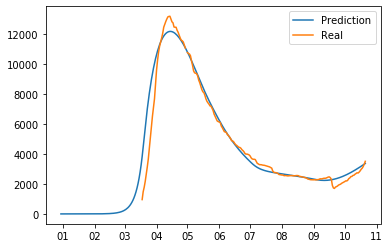

4072.0785175218957
error_groups 1960.787128951551
error_total 422.2582777140689
mix_other: 0.19913098124768874 mix_leisure: 0.2074642929290068
{'work': 1.965793645069391, 'transport': 1.965793645069391, 'school': 1.965793645069391, 'other': 1.965793645069391, 'leisure': 1.965793645069391, 'home': 1.965793645069391}
[7.87457943e+01 1.96579365e+00 8.66981880e-01 1.99130981e-01
 2.07464293e-01 3.99295162e-02 3.22996793e-01 8.93506825e-02
 9.95486936e-01]


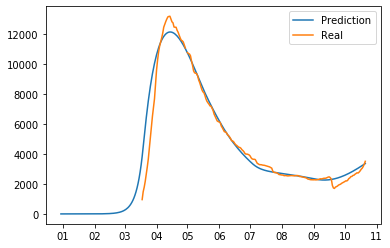

4067.444695560561
error_groups 1952.46946056201
error_total 422.99504699971015
mix_other: 0.19368322013350886 mix_leisure: 0.2131481919429169
{'work': 1.9713849794524472, 'transport': 1.9713849794524472, 'school': 1.9713849794524472, 'other': 1.9713849794524472, 'leisure': 1.9713849794524472, 'home': 1.9713849794524472}
[7.86235188e+01 1.97138498e+00 8.67619926e-01 1.93683220e-01
 2.13148192e-01 3.99408351e-02 2.14875973e-01 8.44418800e-02
 9.97579362e-01]


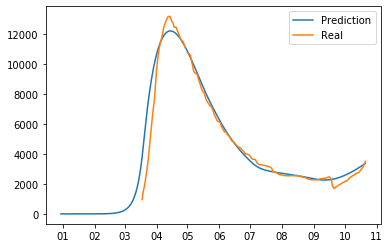

4057.4445676299165
error_groups 1957.9342619808554
error_total 419.90206112981224
mix_other: 0.19393986224188947 mix_leisure: 0.21341404605685532
{'work': 1.9844388385585519, 'transport': 1.9844388385585519, 'school': 1.9844388385585519, 'other': 1.9844388385585519, 'leisure': 1.9844388385585519, 'home': 1.9844388385585519}
[7.86342703e+01 1.98443884e+00 8.68223809e-01 1.93939862e-01
 2.13414046e-01 3.21270576e-02 1.59089215e-01 1.57138520e-01
 9.96997318e-01]


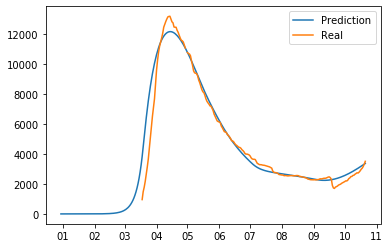

4052.960588329277
error_groups 1955.9588985368177
error_total 419.4003379584919
mix_other: 0.19322169342268236 mix_leisure: 0.21207715093619484
{'work': 1.9847505873673634, 'transport': 1.9847505873673634, 'school': 1.9847505873673634, 'other': 1.9847505873673634, 'leisure': 1.9847505873673634, 'home': 1.9847505873673634}
[7.85161069e+01 1.98475059e+00 8.68438661e-01 1.93221693e-01
 2.12077151e-01 1.85316045e-02 3.25074199e-01 7.42745941e-02
 9.97973392e-01]


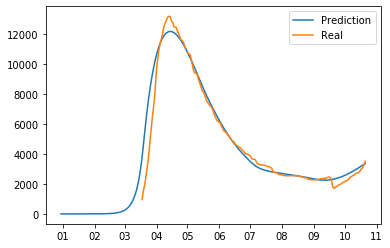

4076.4347473217304
error_groups 1962.4280482745207
error_total 422.80133980944197
mix_other: 0.19956979670306707 mix_leisure: 0.2175892033704544
{'work': 1.972577848159584, 'transport': 1.972577848159584, 'school': 1.972577848159584, 'other': 1.972577848159584, 'leisure': 1.972577848159584, 'home': 1.972577848159584}
[7.87323481e+01 1.97257785e+00 8.65763525e-01 1.99569797e-01
 2.17589203e-01 4.96009411e-02 2.82417365e-01 1.59913179e-01
 9.94637277e-01]


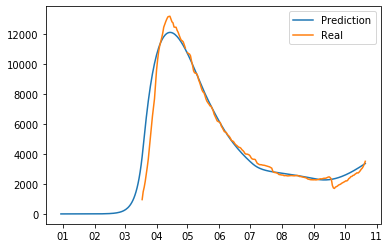

4051.926719519743
error_groups 1956.4326520246127
error_total 419.0988134990261
mix_other: 0.1921596497079806 mix_leisure: 0.2129248665044745
{'work': 1.989039934757285, 'transport': 1.989039934757285, 'school': 1.989039934757285, 'other': 1.989039934757285, 'leisure': 1.989039934757285, 'home': 1.989039934757285}
[7.86685745e+01 1.98903993e+00 8.69010134e-01 1.92159650e-01
 2.12924867e-01 3.87613797e-02 1.85546269e-01 1.24079411e-01
 9.96846314e-01]


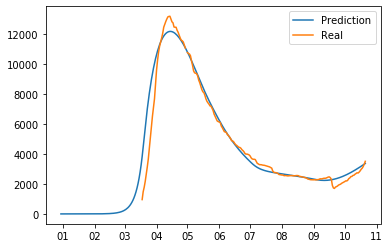

4051.9249047671165
error_groups 1956.432540801735
error_total 419.0984727930763
mix_other: 0.1921596497079806 mix_leisure: 0.2129248665044745
{'work': 1.989039934757285, 'transport': 1.989039934757285, 'school': 1.989039934757285, 'other': 1.989039934757285, 'leisure': 1.989039934757285, 'home': 1.989039934757285}
[7.86685745e+01 1.98903993e+00 8.69010144e-01 1.92159650e-01
 2.12924867e-01 3.87613797e-02 1.85546269e-01 1.24079411e-01
 9.96846314e-01]


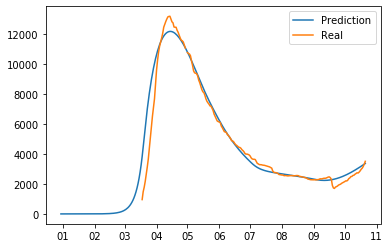

4051.0498927128533
error_groups 1956.3815431219396
error_total 418.9336699181828
mix_other: 0.1921621249460672 mix_leisure: 0.21292727811754472
{'work': 1.9890341467032568, 'transport': 1.9890341467032568, 'school': 1.9890341467032568, 'other': 1.9890341467032568, 'leisure': 1.9890341467032568, 'home': 1.9890341467032568}
[7.86685745e+01 1.98903415e+00 8.69013599e-01 1.92162125e-01
 2.12927278e-01 3.87612609e-02 1.85548765e-01 1.24079643e-01
 9.96846324e-01]


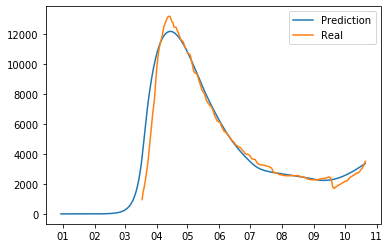

4051.0480778813935
error_groups 1956.3814318938528
error_total 418.93332919750816
mix_other: 0.1921621249460672 mix_leisure: 0.21292727811754472
{'work': 1.9890341467032568, 'transport': 1.9890341467032568, 'school': 1.9890341467032568, 'other': 1.9890341467032568, 'leisure': 1.9890341467032568, 'home': 1.9890341467032568}
[7.86685745e+01 1.98903415e+00 8.69013609e-01 1.92162125e-01
 2.12927278e-01 3.87612609e-02 1.85548765e-01 1.24079643e-01
 9.96846324e-01]


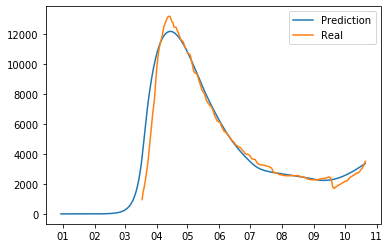

4051.0470406935215
error_groups 1956.366334745464
error_total 418.93614118961153
mix_other: 0.19216286147487963 mix_leisure: 0.21292799571417528
{'work': 1.9890324244169915, 'transport': 1.9890324244169915, 'school': 1.9890324244169915, 'other': 1.9890324244169915, 'leisure': 1.9890324244169915, 'home': 1.9890324244169915}
[7.86685745e+01 1.98903242e+00 8.69014630e-01 1.92162861e-01
 2.12927996e-01 3.87612256e-02 1.85549507e-01 1.24079712e-01
 9.96846327e-01]


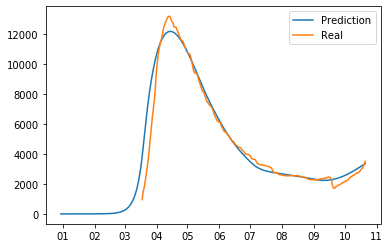

4051.0469600988017
error_groups 1956.3663446151857
error_total 418.93612309672324
mix_other: 0.19216286147487963 mix_leisure: 0.21292799571417528
{'work': 1.9890324344169914, 'transport': 1.9890324344169914, 'school': 1.9890324344169914, 'other': 1.9890324344169914, 'leisure': 1.9890324344169914, 'home': 1.9890324344169914}
[7.86685745e+01 1.98903243e+00 8.69014630e-01 1.92162861e-01
 2.12927996e-01 3.87612256e-02 1.85549507e-01 1.24079712e-01
 9.96846327e-01]


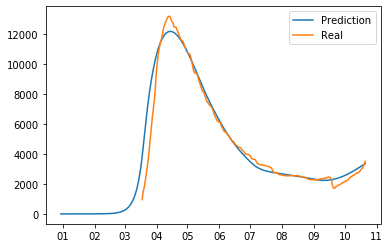

4050.923701310263
error_groups 1956.3741875904063
error_total 418.90990274397126
mix_other: 0.19216248116955412 mix_leisure: 0.2129276251844478
{'work': 1.989033313716402, 'transport': 1.989033313716402, 'school': 1.989033313716402, 'other': 1.989033313716402, 'leisure': 1.989033313716402, 'home': 1.989033313716402}
[7.86685745e+01 1.98903331e+00 8.69014098e-01 1.92162481e-01
 2.12927625e-01 3.87612438e-02 1.85549124e-01 1.24079677e-01
 9.96846326e-01]


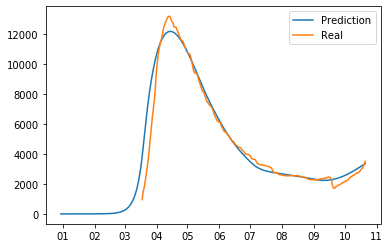

4050.921886467418
error_groups 1956.3740763615688
error_total 418.90956202116985
mix_other: 0.19216248116955412 mix_leisure: 0.2129276251844478
{'work': 1.989033313716402, 'transport': 1.989033313716402, 'school': 1.989033313716402, 'other': 1.989033313716402, 'leisure': 1.989033313716402, 'home': 1.989033313716402}
[7.86685745e+01 1.98903331e+00 8.69014108e-01 1.92162481e-01
 2.12927625e-01 3.87612438e-02 1.85549124e-01 1.24079677e-01
 9.96846326e-01]


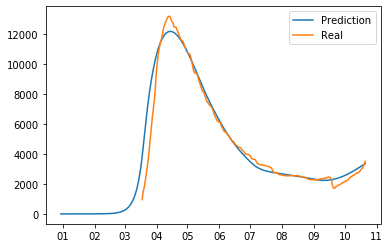

4050.9144562092165
error_groups 1956.373648705318
error_total 418.90816150077967
mix_other: 0.19216250726730283 mix_leisure: 0.2129276506113642
{'work': 1.9890332526898769, 'transport': 1.9890332526898769, 'school': 1.9890332526898769, 'other': 1.9890332526898769, 'leisure': 1.9890332526898769, 'home': 1.9890332526898769}
[7.86685745e+01 1.98903325e+00 8.69014134e-01 1.92162507e-01
 2.12927651e-01 3.87612426e-02 1.85549150e-01 1.24079679e-01
 9.96846326e-01]


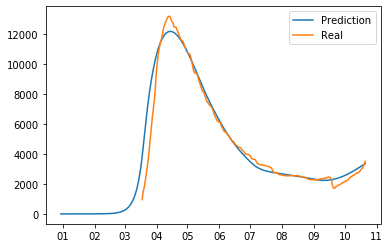

4050.9139477723115
error_groups 1956.3736408657078
error_total 418.90806138132075
mix_other: 0.19216251726730282 mix_leisure: 0.2129276506113642
{'work': 1.9890332526898769, 'transport': 1.9890332526898769, 'school': 1.9890332526898769, 'other': 1.9890332526898769, 'leisure': 1.9890332526898769, 'home': 1.9890332526898769}
[7.86685745e+01 1.98903325e+00 8.69014134e-01 1.92162517e-01
 2.12927651e-01 3.87612426e-02 1.85549150e-01 1.24079679e-01
 9.96846326e-01]


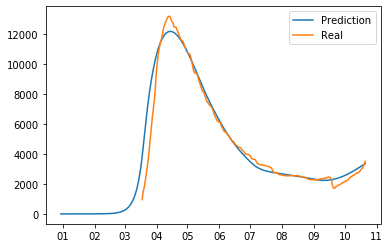

4050.9139032425533
error_groups 1956.3736233631462
error_total 418.90805597588144
mix_other: 0.19216251200636125 mix_leisure: 0.21292765440898606
{'work': 1.989033246322727, 'transport': 1.989033246322727, 'school': 1.989033246322727, 'other': 1.989033246322727, 'leisure': 1.989033246322727, 'home': 1.989033246322727}
[7.86685745e+01 1.98903325e+00 8.69014135e-01 1.92162512e-01
 2.12927654e-01 3.87612424e-02 1.85549153e-01 1.24079679e-01
 9.96846327e-01]


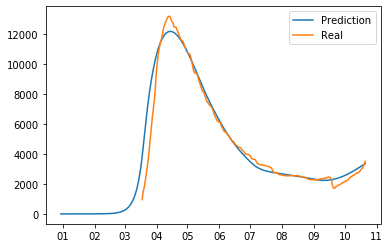

4050.913902629779
error_groups 1956.3736232987171
error_total 418.90805586621235
mix_other: 0.19216251200636125 mix_leisure: 0.21292765440898606
{'work': 1.989033246322727, 'transport': 1.989033246322727, 'school': 1.989033246322727, 'other': 1.989033246322727, 'leisure': 1.989033246322727, 'home': 1.989033246322727}
[7.86685745e+01 1.98903325e+00 8.69014135e-01 1.92162512e-01
 2.12927654e-01 3.87612424e-02 1.85549163e-01 1.24079679e-01
 9.96846327e-01]


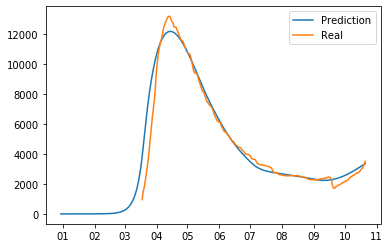

4050.9139022334484
error_groups 1956.3736233039847
error_total 418.90805578589277
mix_other: 0.19216251200636125 mix_leisure: 0.21292765440898606
{'work': 1.989033246322727, 'transport': 1.989033246322727, 'school': 1.989033246322727, 'other': 1.989033246322727, 'leisure': 1.989033246322727, 'home': 1.989033246322727}
[7.86685745e+01 1.98903325e+00 8.69014135e-01 1.92162512e-01
 2.12927654e-01 3.87612424e-02 1.85549153e-01 1.24079689e-01
 9.96846327e-01]


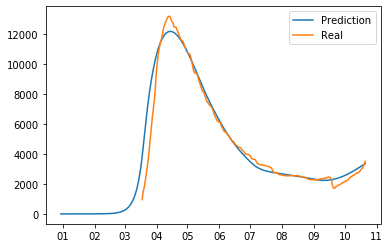

4050.9137898765025
error_groups 1956.373643959742
error_total 418.90802918335214
mix_other: 0.19216252318966104 mix_leisure: 0.21292766152397932
{'work': 1.989033243132321, 'transport': 1.989033243132321, 'school': 1.989033243132321, 'other': 1.989033243132321, 'leisure': 1.989033243132321, 'home': 1.989033243132321}
[7.86685745e+01 1.98903324e+00 8.69014130e-01 1.92162523e-01
 2.12927662e-01 3.87612424e-02 1.85549153e-01 1.24079679e-01
 9.96846334e-01]


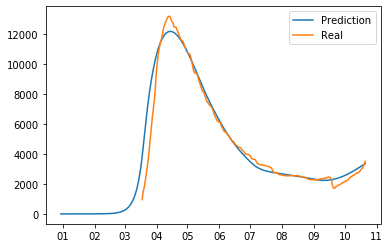

In [33]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution, dual_annealing
epsilon = 0.1
result = differential_evolution(error, [(50,140)]+[windows['alpha_mixing']]*1+[windows['transmission']]+[[0,1]]*2+[windows['school_l'],[0,1],[0,0.2],[0.5,1]],workers = -1)



In [ ]:
best_v = [7.85447048e+01, 6.44205959e-01, 2.17293488e-01, 6.63368073e-02,
 1.00000010e-01, 2.78093696e-01, 0.00000000e+00]
best_v = [7.85447048e+01, 0.3, 2.17293488e-01, 6.63368073e-02,
 1.00000010e-01, 2.78093696e-01, 0.00000000e+00]

In [ ]:
import copy
import math

validation_date = datetime.strptime("2020-10-12", '%Y-%m-%d')


days_ahead = best_v[0]
alpha_mixing = best_v[1]
beta_mixing = 1-alpha_mixing
gamma_mixing_before = 1.0
gamma_mixing_after = 1.0
gamma_change = 0

upper_bound_home = 1.0
upper_bound_leisure = 1.0
upper_bound_other = 1.0
upper_bound_school = 1.0
upper_bound_work = 1.0
upper_bound_transport = 1.0

work_l = best_v[2]
leisure_l = best_v[3]
other_l = best_v[4]
transport_l = best_v[5]
school_l = best_v[6]

In [ ]:
best_error = float('inf')
def error(v):
    
    
    #days_ahead = v[0]
    #alpha_mixing = v[1]
    #beta_mixing = v[2]
    #gamma_mixing_before = 1.0
    #gamma_mixing_after = 1.0
    #gamma_change = 0

    #upper_bound_home = 1.0
    #upper_bound_leisure = 1.0
    #upper_bound_other = 1.0
    #upper_bound_school = 1.0
    #upper_bound_work = 1.0
    #upper_bound_transport = 1.0
    
    #work_l = v[3]
    #leisure_l = v[4]
    #other_l = v[5]
    #transport_l = v[6]
    #school_l = v[7]
    
    
    
    leisure_v = v[0:4]
    leisure_1 = leisure_v[0]
    leisure_2 = leisure_v[1]
    leisure_3 = leisure_v[2]
    leisure_4 = leisure_v[3]
    leisure_denom = leisure_1+leisure_2+leisure_3+leisure_4

    other_v = v[4:8]
    other_1 = other_v[0]
    other_2 = other_v[1]
    other_3 = other_v[2]
    other_4 = other_v[3]
    other_denom = other_1+other_2+other_3+other_4
    
    work_v = v[8:12]
    work_1 = work_v[0]
    work_2 = work_v[1]
    work_3 = work_v[2]
    work_4 = work_v[3]
    work_denom = work_2+work_3+work_4
    
    transport_v = v[12:16]
    transport_1 = transport_v[0]
    transport_2 = transport_v[1]
    transport_3 = transport_v[2]
    transport_4 = transport_v[3]
    transport_denom = transport_1+transport_2+transport_3+transport_4
    
    school_v = v[16:20]
    school_1 = school_v[0]
    school_2 = school_v[1]
    school_3 = school_v[2]
    school_4 = school_v[3]
    school_denom = school_1+school_2+school_3

    # Number of days
    days_before_date_1 = int(days_ahead)
    days_between_dates_1_2 = (date_2-date_1).days
    days_between_dates_2_3 = (date_3-date_2).days
    days_between_dates_3_4 = (date_4-date_3).days
    days_between_dates_4_5 = (date_5-date_4).days
    days_after_date_5 = (final_date-date_5).days
    total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_after_date_5
    days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5
    
    
    # Some additional calculations
    validation_days = days_before_date_1 + (validation_date-date_1).days
    vacation_start_days = days_before_date_1 + (vacation_start-date_1).days
    vacation_end_days = days_before_date_1 + (vacation_end-date_1).days
    
    
    # Construct initialization
    initialization = copy.deepcopy(original_initialization)
    for i,group in enumerate(age_groups):
        if group == "age_group_40_49":
            initialization[group]["I"] = initialization[group]["I"] + 1
            initialization[group]["S"] = initialization[group]["S"] - 1
        initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


    # Alphas
    a_before_date_1 = {
        'home':upper_bound_home,
        'leisure':upper_bound_leisure,
        'other':upper_bound_other,
        'school':upper_bound_school,
        'transport':upper_bound_transport,
        'work':upper_bound_work
    }
    
    a_between_date_1_2 = {
        'home':upper_bound_home,
        'leisure':leisure_l,
        'other':other_l,
        'school':school_l,
        'transport':transport_l,
        'work':work_l
    }
    
    
    a_between_date_2_3 = {
        'home':upper_bound_home,
        'leisure':leisure_1/leisure_denom*(1-leisure_l)+leisure_l,
        'other':other_1/other_denom*(1-other_l)+other_l,
        'school':school_1/school_denom*(1-school_l)+school_l,
        'transport':transport_1/transport_denom*(1-transport_l)+transport_l,
        'work':work_1*(0.5-work_l)+work_l
    }
    
    a_between_date_3_4 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2)/leisure_denom*(1-leisure_l)+leisure_l,
        'other':(other_1+other_2)/other_denom*(1-other_l)+other_l,
        'school':(school_1+school_2)/school_denom*(1-school_l)+school_l,
        'transport':(transport_1+transport_2)/transport_denom*(1-transport_l)+transport_l,
        'work':work_1*(0.5-work_l)+work_l
    }
    
    a_between_date_4_5 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2)/leisure_denom*(1-leisure_l)+leisure_l,
        'other':(other_1+other_2)/other_denom*(1-other_l)+other_l,
        'school':(school_1+school_2)/school_denom*(1-school_l)+school_l,
        'transport':(transport_1+transport_2)/transport_denom*(1-transport_l)+transport_l,
        'work':work_1*(0.5-work_l)+work_l
    }
    
    a_after_date_5 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2+leisure_3)/leisure_denom*(1-leisure_l)+leisure_l,
        'other':(other_1+other_2+other_3)/other_denom*(1-other_l)+other_l,
        'school':school_3*(1-0.5)+0.5,
        'transport':(transport_1+transport_2+transport_3)/transport_denom*(1-transport_l)+transport_l,
        'work':(work_2+work_3)/work_denom*(1-0.5)+0.5
    }
    

    


    # Determine mixing method
    mixing_method_before = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
    }

    # Determine mixing method
    mixing_method_after = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
    }
    #dynModel.mixing_method = mixing_method_after




    # Calculate alphas
    alphas_vec = []
    for t in range(days_before_date_1):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_before_date_1
        alphas_vec.append(alphas)
    for t in range(days_between_dates_1_2):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
    for t in range(days_between_dates_2_3):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_2_3
        alphas_vec.append(alphas)
    for t in range(days_between_dates_3_4):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_3_4
        alphas_vec.append(alphas)
    for t in range(days_between_dates_4_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_4_5
        alphas_vec.append(alphas)
    for t in range(days_after_date_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_after_date_5
        alphas_vec.append(alphas)

    mixing_vec = []
    for t in range(int(gamma_change)):
        mixing_vec.append(mixing_method_before)
    for t in range(int(gamma_change),total_days):
        mixing_vec.append(mixing_method_after)
        
        
        
        
    # Calculate tests
    tests = np.zeros(len(age_groups))


    # Run model
    model_data_beds = {ag:[] for ag in age_groups+["total"]}
    model_data_icus = {ag:[] for ag in age_groups+["total"]}
    model_data_deaths = {ag:[] for ag in age_groups+["total"]}

    state = state_to_matrix(initialization)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)

    recalc_days = [0,
                 days_before_date_1,
                 days_before_date_1+days_between_dates_1_2,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                int(gamma_change)
                ]

    dynModel.beta = np.zeros((len(age_groups),len(dynModel.groups[age_groups[0]].parameters["beta"])))
    for i in range(len(age_groups)):
        for j in range(len(dynModel.groups[age_groups[0]].parameters["beta"])):
            if j < int(vacation_start_days) or j>= int(vacation_end_days):
                dynModel.beta[i,j] = original_beta
            else:
                dynModel.beta[i,j] = original_beta_vacation
    
    for t in range(total_days):
        if t in recalc_days:
            update_contacts = True
        else:
            update_contacts = False
            
        if t>=vacation_start_days and t<vacation_end_days:
            season = "vacation"
        else:
            season = "normal"

        dynModel.mixing_method = mixing_vec[t]
        state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), t, season, update_contacts=update_contacts)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
        #print(t_beds)
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)


    initial_date = date_1-timedelta(days=days_before_date_1)

    # Calculate the days of the model
    days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

    # Indices where to put the real data
    indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

    # Real data
    real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

    for k,ind in enumerate(indices):
        for ag in age_groups+["total"]:
            real_data_beds[ag][ind] = beds_real[ag][k]
            real_data_icus[ag][ind] = icus_real[ag][k]
            real_data_deaths[ag][ind] = deaths_real[ag][k]


    error_beds = 0
    error_icus = 0
    error_deaths = 0
    for ag in age_groups:
        error_beds += np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))[0:validation_days])
        #error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
        #error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
    error_beds_total = np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))[0:validation_days])
    #error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
    #error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

    
    #diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
    #error_beds_above = np.nanmean([max(d,0) for d in diff])
    #error_beds_below = -np.nanmean([min(d,0) for d in diff])

    #cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
    #cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
    #diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
    #error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
    #error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



    #     error = error_beds_total
    #     error = mult_icus*error_icus_total
    #     error = mult_deaths*error_deaths_total
    upper_model_data = model_data_beds["total"]
    upper_days_model = days_model
    upper_real_data = real_data_beds["total"]
    error = error_beds+5*error_beds_total




    
    
    global best_error
    global best_v
    if error<best_error:
        best_error = error
        print(best_error)
        print("error_groups",error_beds)
        print("error_total",error_beds_total)
        best_v = v
        print(v)
        plt.figure(1)
        plt.plot(upper_days_model, upper_model_data, label="Upper")
        plt.plot(upper_days_model, upper_real_data, label="Model L1")
        plt.legend(loc='upper right')
        plt.show()
        print("Before March 17",a_before_date_1)
        print("March17-May11",a_between_date_1_2)
        print("May12-May30", a_between_date_2_3)
        print("June1-June30",a_between_date_3_4)
        print("July1-Aug31",a_between_date_4_5)
        print("Sept1-Oct12",a_after_date_5)
        print("alpha1",alpha_mixing,"alpha2",beta_mixing)
        


    return error





In [ ]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution, dual_annealing
epsilon = 0.1
result = differential_evolution(error, [(0,1)]*20, workers=-1)



In [22]:
best_v = [50.88753474,  0.26877947,  1.33454102,  1.48102971,  0.47847758, 10.14438959,
  0.51890012,  0.41202596,  0.17060711,  0.24185315,  0.25654917,  0.28517006,
  0.20474128,  0.16875515,  0.43551292,  0.05633155]

0.0033064996693500004
0.005534162394714904
0.009348850655232535
0.01537873063733888
0.023728622712360262
0.03443589303407403
0.04762678518989236
0.06358089720196425
0.08276786950556922
0.10587956944734175
0.1338681723682132
0.16799614758695414
0.20990280891813157
0.26169207484963486
0.3260468109223219
0.40637639158365235
0.5070058787828224
0.6334175130020481
0.7925581500089791
0.9932300039100357
1.2465867764370144
1.5667632260711417
1.9716737937705082
2.4840254806502235
3.1326023069561106
3.9538940549019492
4.994161475830896
6.312054819335675
7.981933802065308
10.098076724508584
12.78001656995996
16.179305359300255
20.488088282556877
25.94997056884885
32.87378817784679
41.65105503905201
52.77806321543082
66.88386848190865
84.76571516042216
107.43385606060559
136.1682243456675
172.59003530236714
218.7521610887128
277.25305563726226
351.380133818711
445.2898463199436
564.233242011257
714.8375452884766
905.4561144205865
1146.6009110348234
1451.4729667960514
1836.6066980851167
2262.3294441

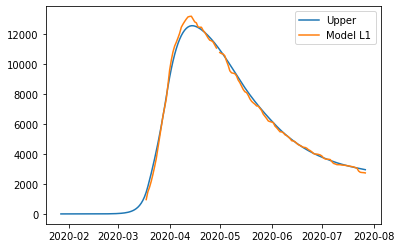

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

2798.055967994423

In [23]:
# v0 = (list(best_v[0:4]) + list(best_v[4]*initial_params["mu"]) + list(best_v[5]*initial_params['sigma']) + list(best_v[6]*initial_params['p_H'])+
#       list(best_v[7]*initial_params['p_ICU'])+list(best_v[8]*initial_params['lambda_H_R'])+list(best_v[9]*initial_params['lambda_H_D'])+
#     list(best_v[10]*initial_params['lambda_ICU_R'])+list(best_v[11]*initial_params['lambda_ICU_D']) + list(best_v[12:]))
v0 = best_v
error(best_v)

In [24]:
lb= ([50,windows['alpha_mixing'][0],windows['beta_mixing'][0],windows['gamma_mixing'][0],0,-50]+
                [0]*10)
ub = ([140,windows['alpha_mixing'][1],windows['beta_mixing'][1],windows['gamma_mixing'][1],0.5,50]+
                [1]*10)
for i in range(len(v0)):
    assert(v0[i]>=lb[i])
    assert(ub[i]>=v0[i])

2798.055886359947
violation 0
error_groups 1901.5072004844485
error_total 179.30973717509974
[50.88753474  0.26877948  1.33454102  1.48102971  0.47847758 10.14438959
  0.51890012  0.41202596  0.17060711  0.24185315  0.25654917  0.28517006
  0.20474128  0.16875515  0.43551292  0.05633155]


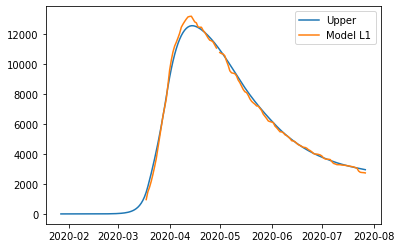

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

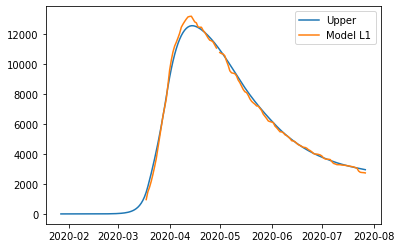

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

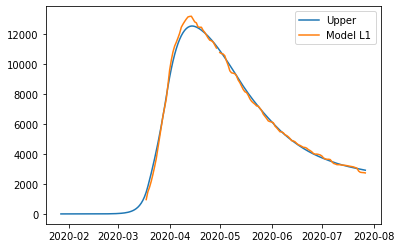

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118493397605296, 'other': 0.3904875720049046, 'school': 0.23545030363217875, 'transport': 0.2528506013354287, 'work': 0.41170446517470677}
{'home': 1.0, 'leisure': 0.33414590391546506, 'other': 0.42401586415990583, 'school': 0.29236728535165846, 'transport': 0.27960814435156445, 'work': 0.5424960556349523}
{'home': 1.0, 'leisure': 0.3556461622077242, 'other': 0.4563467173093713, 'school': 0.3472515177240139, 'transport': 0.30541006083140954, 'work': 0.6686165178644747}
{'home': 1.0, 'leisure': 0.373164891186602, 'other': 0.482690375431158, 'school': 0.3919720033607479, 'transport': 0.3264338446298019, 'work': 0.7713813389403819}
{'home': 1.0, 'leisure': 0.38351686740139346, 'other': 0.49825708250312284, 'school': 0.4183977448733635, 'transport': 0.3388569896015792, 'work': 0.8321060059397816}
{'home': 1.0, 'leisure': 0.38909100844012734, 'other': 0.5066391555418732, 'sc

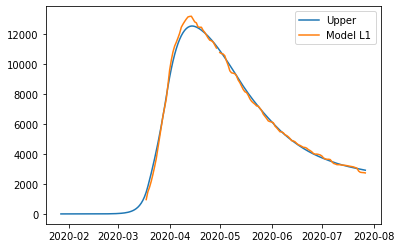

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118493397605296, 'other': 0.3904875720049046, 'school': 0.23545030363217875, 'transport': 0.2528506013354287, 'work': 0.41170446517470677}
{'home': 1.0, 'leisure': 0.33414590391546506, 'other': 0.42401586415990583, 'school': 0.29236728535165846, 'transport': 0.27960814435156445, 'work': 0.5424960556349523}
{'home': 1.0, 'leisure': 0.3556461622077242, 'other': 0.4563467173093713, 'school': 0.3472515177240139, 'transport': 0.30541006083140954, 'work': 0.6686165178644747}
{'home': 1.0, 'leisure': 0.373164891186602, 'other': 0.482690375431158, 'school': 0.3919720033607479, 'transport': 0.3264338446298019, 'work': 0.7713813389403819}
{'home': 1.0, 'leisure': 0.38351686740139346, 'other': 0.49825708250312284, 'school': 0.4183977448733635, 'transport': 0.3388569896015792, 'work': 0.8321060059397816}
{'home': 1.0, 'leisure': 0.38909100844012734, 'other': 0.5066391555418732, 'sc

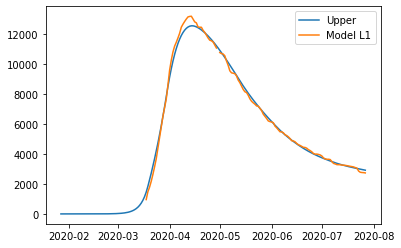

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

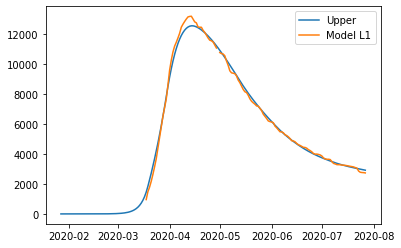

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

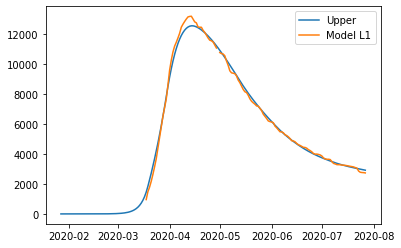

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

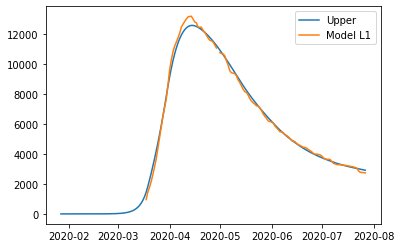

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

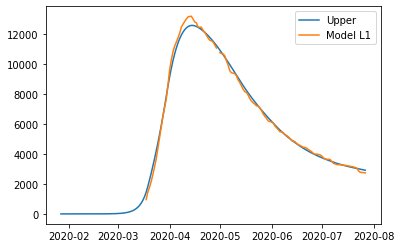

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

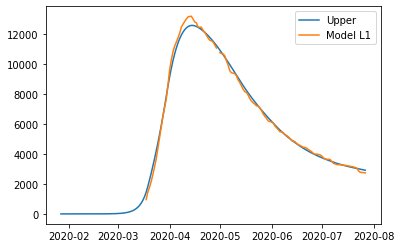

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

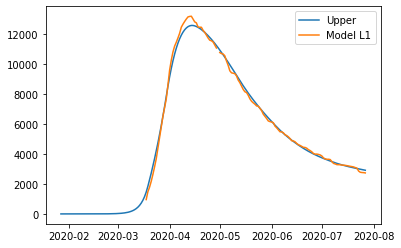

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

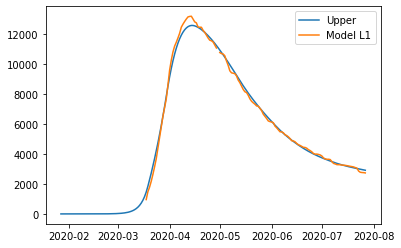

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

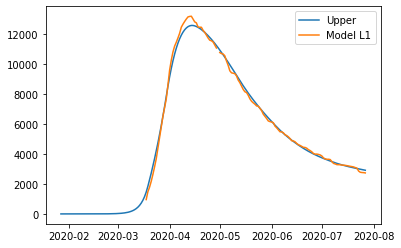

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

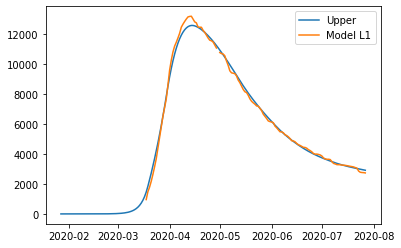

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

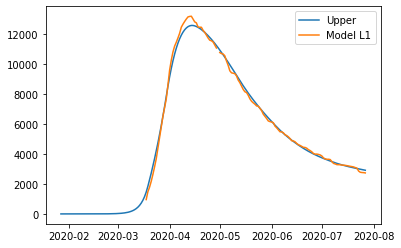

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

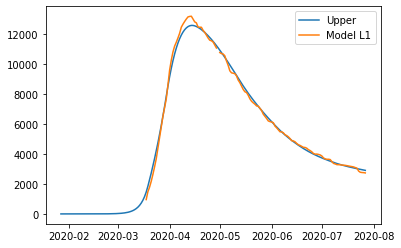

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118092167882165, 'other': 0.39066303851430906, 'school': 0.23534463505874373, 'transport': 0.25282154441452, 'work': 0.4117236447348602}
{'home': 1.0, 'leisure': 0.33413536791582527, 'other': 0.4242444393790572, 'school': 0.29230230343636826, 'transport': 0.27960040107897755, 'work': 0.5426273633561471}
{'home': 1.0, 'leisure': 0.3556641565031623, 'other': 0.4566265044986358, 'school': 0.3472257693719347, 'transport': 0.3054228700054188, 'work': 0.668855949169531}
{'home': 1.0, 'leisure': 0.3732061323891406, 'other': 0.4830118908923665, 'school': 0.39197822309721114, 'transport': 0.32646340024177833, 'work': 0.7717088709433992}
{'home': 1.0, 'leisure': 0.38357184541267325, 'other': 0.49860325557957097, 'school': 0.41842285484396535, 'transport': 0.33889644083599074, 'work': 0.8324855974461396}
{'home': 1.0, 'leisure': 0.3891533831945755, 'other': 0.5069986057957581, 'sc

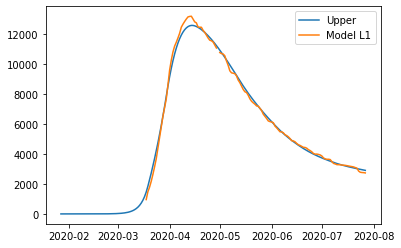

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118092167882165, 'other': 0.39066303851430906, 'school': 0.23534463505874373, 'transport': 0.25282154441452, 'work': 0.4117236447348602}
{'home': 1.0, 'leisure': 0.33413536791582527, 'other': 0.4242444393790572, 'school': 0.29230230343636826, 'transport': 0.27960040107897755, 'work': 0.5426273633561471}
{'home': 1.0, 'leisure': 0.3556641565031623, 'other': 0.4566265044986358, 'school': 0.3472257693719347, 'transport': 0.3054228700054188, 'work': 0.668855949169531}
{'home': 1.0, 'leisure': 0.3732061323891406, 'other': 0.4830118908923665, 'school': 0.39197822309721114, 'transport': 0.32646340024177833, 'work': 0.7717088709433992}
{'home': 1.0, 'leisure': 0.38357184541267325, 'other': 0.49860325557957097, 'school': 0.41842285484396535, 'transport': 0.33889644083599074, 'work': 0.8324855974461396}
{'home': 1.0, 'leisure': 0.3891533831945755, 'other': 0.5069986057957581, 'sc

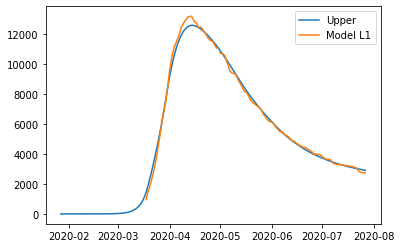

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118064933440953, 'other': 0.39072797616259575, 'school': 0.23532616170538395, 'transport': 0.2528257738280718, 'work': 0.4117384210891717}
{'home': 1.0, 'leisure': 0.33414374239468814, 'other': 0.4243287393041046, 'school': 0.2923021406239019, 'transport': 0.27961389038596235, 'work': 0.5426835763094005}
{'home': 1.0, 'leisure': 0.3556832325506169, 'other': 0.45672947519055956, 'school': 0.34724326315247284, 'transport': 0.3054452884953569, 'work': 0.6689521188431926}
{'home': 1.0, 'leisure': 0.37323392823322554, 'other': 0.4831300748017451, 'school': 0.3920101037313084, 'transport': 0.3264930943622709, 'work': 0.7718375979448009}
{'home': 1.0, 'leisure': 0.38360479386385793, 'other': 0.4987304291174456, 'school': 0.41846323680062036, 'transport': 0.3389304341927202, 'work': 0.8326335628684787}
{'home': 1.0, 'leisure': 0.3891891061265061, 'other': 0.5071306199028228, 's

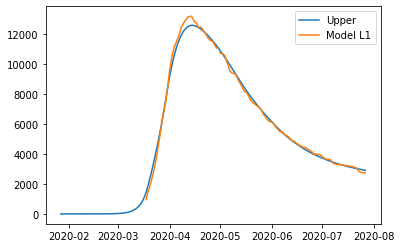

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118064933440953, 'other': 0.39072797616259575, 'school': 0.23532616170538395, 'transport': 0.2528257738280718, 'work': 0.4117384210891717}
{'home': 1.0, 'leisure': 0.33414374239468814, 'other': 0.4243287393041046, 'school': 0.2923021406239019, 'transport': 0.27961389038596235, 'work': 0.5426835763094005}
{'home': 1.0, 'leisure': 0.3556832325506169, 'other': 0.45672947519055956, 'school': 0.34724326315247284, 'transport': 0.3054452884953569, 'work': 0.6689521188431926}
{'home': 1.0, 'leisure': 0.37323392823322554, 'other': 0.4831300748017451, 'school': 0.3920101037313084, 'transport': 0.3264930943622709, 'work': 0.7718375979448009}
{'home': 1.0, 'leisure': 0.38360479386385793, 'other': 0.4987304291174456, 'school': 0.41846323680062036, 'transport': 0.3389304341927202, 'work': 0.8326335628684787}
{'home': 1.0, 'leisure': 0.3891891061265061, 'other': 0.5071306199028228, 's

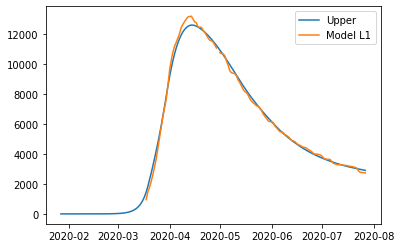

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772749170139, 'other': 0.42466601397771053, 'school': 0.29230149178674913, 'transport': 0.27966785433863145, 'work': 0.5429084281224141}
{'home': 1.0, 'leisure': 0.35575959594621653, 'other': 0.457141486223513, 'school': 0.34731324240231737, 'transport': 0.3055349739598432, 'work': 0.6693367975378391}
{'home': 1.0, 'leisure': 0.37334519085890017, 'other': 0.4836029821275003, 'school': 0.3921376317927804, 'transport': 0.3266118862437935, 'work': 0.7723525059504077}
{'home': 1.0, 'leisure': 0.3837366787618496, 'other': 0.49923932061622, 'school': 0.41862477097805395, 'transport': 0.3390664253206732, 'work': 0.8332254245578345}
{'home': 1.0, 'leisure': 0.38933209532497626, 'other': 0.5076588874947614, 'sc

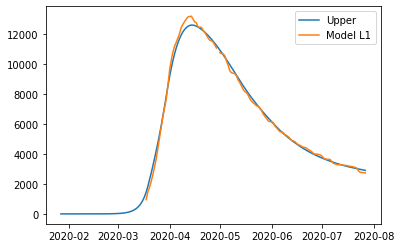

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772749170139, 'other': 0.42466601397771053, 'school': 0.29230149178674913, 'transport': 0.27966785433863145, 'work': 0.5429084281224141}
{'home': 1.0, 'leisure': 0.35575959594621653, 'other': 0.457141486223513, 'school': 0.34731324240231737, 'transport': 0.3055349739598432, 'work': 0.6693367975378391}
{'home': 1.0, 'leisure': 0.37334519085890017, 'other': 0.4836029821275003, 'school': 0.3921376317927804, 'transport': 0.3266118862437935, 'work': 0.7723525059504077}
{'home': 1.0, 'leisure': 0.3837366787618496, 'other': 0.49923932061622, 'school': 0.41862477097805395, 'transport': 0.3390664253206732, 'work': 0.8332254245578345}
{'home': 1.0, 'leisure': 0.38933209532497626, 'other': 0.5076588874947614, 'sc

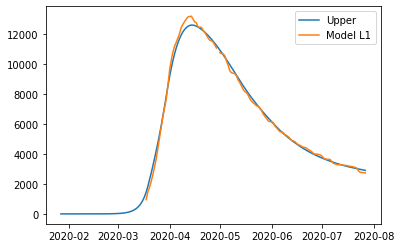

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772753476284, 'other': 0.4246660146256672, 'school': 0.29230149288435386, 'transport': 0.27966785485473705, 'work': 0.5429084306449367}
{'home': 1.0, 'leisure': 0.3557595967920665, 'other': 0.45714148749628514, 'school': 0.3473132445583267, 'transport': 0.3055349749736221, 'work': 0.6693368024927941}
{'home': 1.0, 'leisure': 0.37334519204309013, 'other': 0.4836029839093813, 'school': 0.3921376348111935, 'transport': 0.32661188766308397, 'work': 0.7723525128873447}
{'home': 1.0, 'leisure': 0.38373668014596773, 'other': 0.49923932269893806, 'school': 0.4186247745060693, 'transport': 0.3390664269795841, 'work': 0.8332254326659427}
{'home': 1.0, 'leisure': 0.38933209681674796, 'other': 0.5076588897394687, 

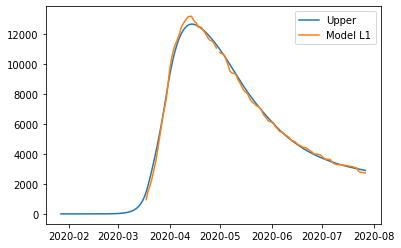

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

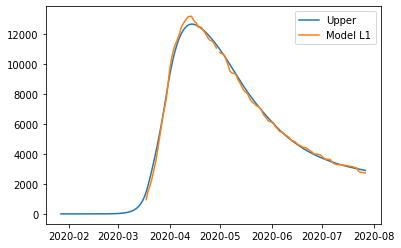

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

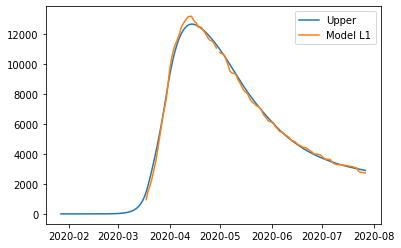

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

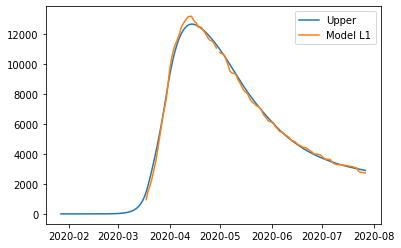

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783309081986, 'other': 0.42615719191778406, 'school': 0.2922956326795745, 'transport': 0.27990818173826, 'work': 0.5439014520984162}
{'home': 1.0, 'leisure': 0.35609208707712486, 'other': 0.4589677092503442, 'school': 0.34762438995438466, 'transport': 0.30593560757389227, 'work': 0.6710457093242805}
{'home': 1.0, 'leisure': 0.3738340718067067, 'other': 0.48570220485465243, 'school': 0.392707081067193, 'transport': 0.32714313973625925, 'work': 0.7746447337305403}
{'home': 1.0, 'leisure': 0.3843179718741868, 'other': 0.5014998613481073, 'school': 0.4193468530883979, 'transport': 0.3396748632867489, 'work': 0.8358623390615121}
{'home': 1.0, 'leisure': 0.3899631488335992, 'other': 0.51000629176766, 'scho

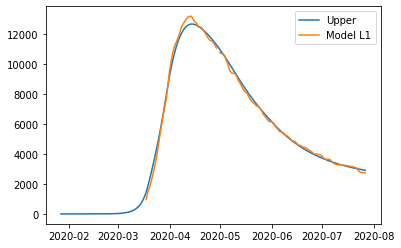

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.33435106744250837, 'other': 0.42654698685376746, 'school': 0.2922973916008377, 'transport': 0.27997615694667044, 'work': 0.5441632308167181}
{'home': 1.0, 'leisure': 0.3561776160872821, 'other': 0.45944859984188374, 'school': 0.3477139738284168, 'transport': 0.3060478603765394, 'work': 0.6715030886588543}
{'home': 1.0, 'leisure': 0.37396221127931994, 'other': 0.4862573215359044, 'school': 0.39286822601385163, 'transport': 0.3272914705786549, 'work': 0.7752614913450394}
{'home': 1.0, 'leisure': 0.38447129025643323, 'other': 0.502098838900553, 'school': 0.41955028412342676, 'transport': 0.339844512970814, 'work': 0.8365732747505124}
{'home': 1.0, 'leisure': 0.3901300250902635, 'other': 0.5106288867122868, 'sc

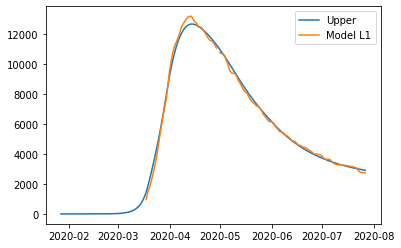

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.33435106744250837, 'other': 0.42654698685376746, 'school': 0.2922973916008377, 'transport': 0.27997615694667044, 'work': 0.5441632308167181}
{'home': 1.0, 'leisure': 0.3561776160872821, 'other': 0.45944859984188374, 'school': 0.3477139738284168, 'transport': 0.3060478603765394, 'work': 0.6715030886588543}
{'home': 1.0, 'leisure': 0.37396221127931994, 'other': 0.4862573215359044, 'school': 0.39286822601385163, 'transport': 0.3272914705786549, 'work': 0.7752614913450394}
{'home': 1.0, 'leisure': 0.38447129025643323, 'other': 0.502098838900553, 'school': 0.41955028412342676, 'transport': 0.339844512970814, 'work': 0.8365732747505124}
{'home': 1.0, 'leisure': 0.3901300250902635, 'other': 0.5106288867122868, 'sc

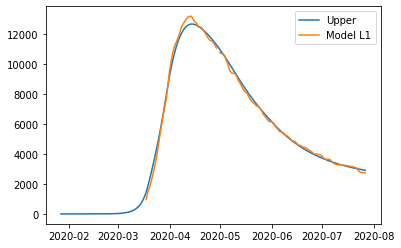

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.3343510678748786, 'other': 0.4265469875055278, 'school': 0.2922973926986054, 'transport': 0.27997615746313453, 'work': 0.5441632333392408}
{'home': 1.0, 'leisure': 0.35617761693658073, 'other': 0.45944860112212715, 'school': 0.3477139759847461, 'transport': 0.3060478613910224, 'work': 0.6715030936138093}
{'home': 1.0, 'leisure': 0.37396221246833805, 'other': 0.4862573233282451, 'school': 0.3928682290327127, 'transport': 0.32729147199893105, 'work': 0.7752614982819763}
{'home': 1.0, 'leisure': 0.38447129164619465, 'other': 0.5020988409954967, 'school': 0.41955028765196567, 'transport': 0.33984451463087706, 'work': 0.8365732828586205}
{'home': 1.0, 'leisure': 0.39013002658811746, 'other': 0.5106288889701707, 

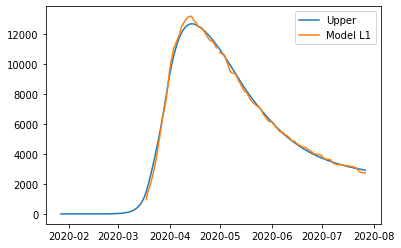

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

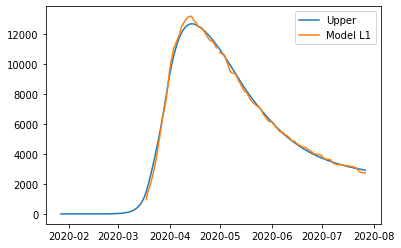

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

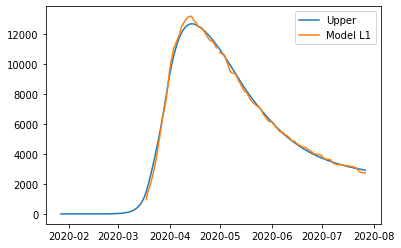

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

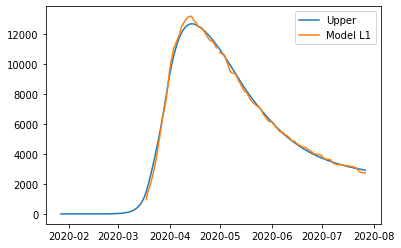

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

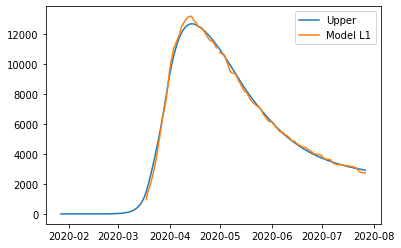

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477984933517, 'other': 0.42810783994076995, 'school': 0.2923045440481086, 'transport': 0.2802482345526174, 'work': 0.5452103583025385}
{'home': 1.0, 'leisure': 0.3565210866776571, 'other': 0.4613750865811646, 'school': 0.348072514523086, 'transport': 0.3064971810043544, 'work': 0.6733326307719246}
{'home': 1.0, 'leisure': 0.3744765959451786, 'other': 0.4884817319918565, 'school': 0.3935130830582528, 'transport': 0.3278852114465106, 'work': 0.7777285564877207}
{'home': 1.0, 'leisure': 0.38508666960325955, 'other': 0.5044992951890837, 'school': 0.4203643281017604, 'transport': 0.34052359307142105, 'work': 0.8394170580470547}
{'home': 1.0, 'leisure': 0.39079978618838, 'other': 0.5131241369106674, 'school':

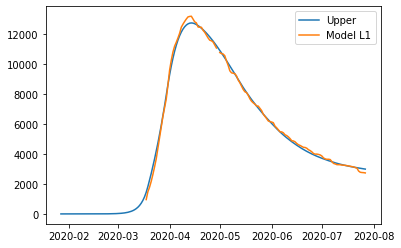

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019351872554, 'other': 0.44579849894890267, 'school': 0.2943887134136331, 'transport': 0.28468361478659276, 'work': 0.5564551192387546}
{'home': 1.0, 'leisure': 0.3620182702989054, 'other': 0.4826900474541398, 'school': 0.35372757978801267, 'transport': 0.31273703058456714, 'work': 0.6918559073746766}
{'home': 1.0, 'leisure': 0.38165374026794086, 'other': 0.5127498277176663, 'school': 0.4020777672041737, 'transport': 0.3355953693829167, 'work': 0.8021824754854279}
{'home': 1.0, 'leisure': 0.3932565179769163, 'other': 0.5305124251461137, 'school': 0.43064833249554163, 'transport': 0.34910256958194136, 'work': 0.8673754475508717}
{'home': 1.0, 'leisure': 0.3995041675125185, 'other': 0.5400769006845085, 's

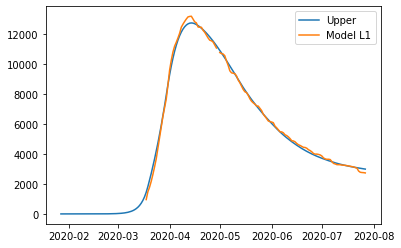

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019351872554, 'other': 0.44579849894890267, 'school': 0.2943887134136331, 'transport': 0.28468361478659276, 'work': 0.5564551192387546}
{'home': 1.0, 'leisure': 0.3620182702989054, 'other': 0.4826900474541398, 'school': 0.35372757978801267, 'transport': 0.31273703058456714, 'work': 0.6918559073746766}
{'home': 1.0, 'leisure': 0.38165374026794086, 'other': 0.5127498277176663, 'school': 0.4020777672041737, 'transport': 0.3355953693829167, 'work': 0.8021824754854279}
{'home': 1.0, 'leisure': 0.3932565179769163, 'other': 0.5305124251461137, 'school': 0.43064833249554163, 'transport': 0.34910256958194136, 'work': 0.8673754475508717}
{'home': 1.0, 'leisure': 0.3995041675125185, 'other': 0.5400769006845085, 's

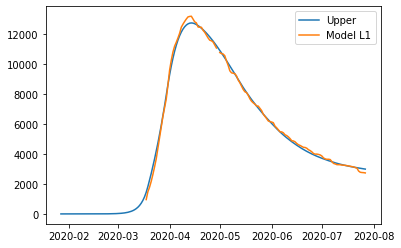

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019396767375, 'other': 0.44579849963619383, 'school': 0.29438871451911874, 'transport': 0.2846836153092291, 'work': 0.5564551217612771}
{'home': 1.0, 'leisure': 0.36201827118076796, 'other': 0.4826900488041759, 'school': 0.35372758195950227, 'transport': 0.3127370316111743, 'work': 0.6918559123296315}
{'home': 1.0, 'leisure': 0.3816537415025484, 'other': 0.5127498296077169, 'school': 0.4020777702442592, 'transport': 0.3355953708201666, 'work': 0.8021824824223648}
{'home': 1.0, 'leisure': 0.3932565194199641, 'other': 0.5305124273552638, 'school': 0.43064833604888836, 'transport': 0.3491025712618439, 'work': 0.8673754556589799}
{'home': 1.0, 'leisure': 0.39950416906780334, 'other': 0.5400769030654814, 'sc

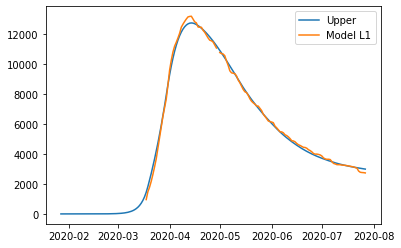

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295971560758, 'other': 0.4075405995199419, 'school': 0.23285211563007083, 'transport': 0.25559118566057315, 'work': 0.4160394970977984}
{'home': 1.0, 'leisure': 0.3379201952984845, 'other': 0.4457985016735211, 'school': 0.294388717796094, 'transport': 0.28468361685847254, 'work': 0.5564551292387545}
{'home': 1.0, 'leisure': 0.3620182720786643, 'other': 0.4826900501787582, 'school': 0.35372758417047356, 'transport': 0.3127370326564469, 'work': 0.6918559173746766}
{'home': 1.0, 'leisure': 0.38165374204769975, 'other': 0.5127498304422846, 'school': 0.40207777158663466, 'transport': 0.33559537145479645, 'work': 0.8021824854854278}
{'home': 1.0, 'leisure': 0.39325651975667525, 'other': 0.5305124278707322, 'school': 0.4306483368780025, 'transport': 0.34910257165382114, 'work': 0.8673754575508716}
{'home': 1.0, 'leisure': 0.3995041692922774, 'other': 0.540076903409127, 'sch

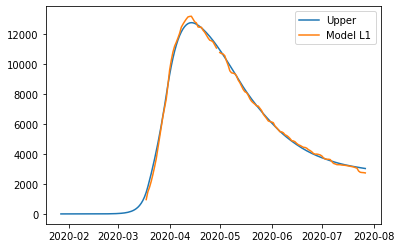

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

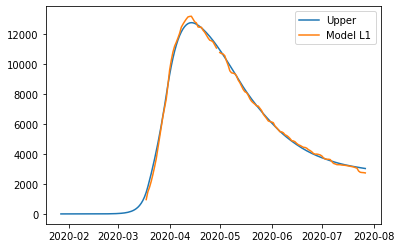

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

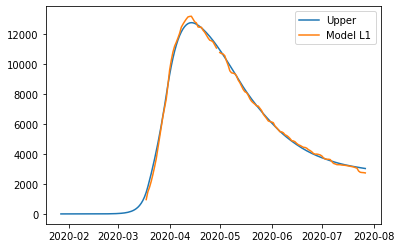

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

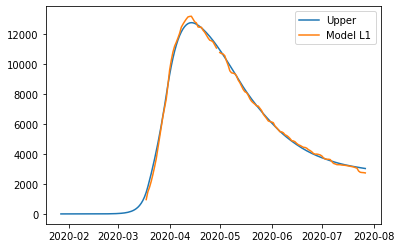

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

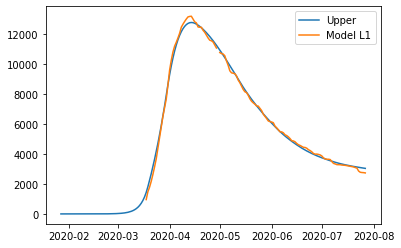

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3134521106056184, 'other': 0.41141986181311324, 'school': 0.23259140173738327, 'transport': 0.2564129603336426, 'work': 0.41713542023651345}
{'home': 1.0, 'leisure': 0.3390195111368879, 'other': 0.4506979105986866, 'school': 0.2951258757926748, 'transport': 0.28601114610814354, 'work': 0.5595142746609696}
{'home': 1.0, 'leisure': 0.363673790220612, 'other': 0.48857317192763233, 'school': 0.35542697577456306, 'transport': 0.31455225381926943, 'work': 0.696808169998838}
{'home': 1.0, 'leisure': 0.38376246206660947, 'other': 0.51943449597344, 'school': 0.404561205389435, 'transport': 0.33780797121352024, 'work': 0.8086772699037679}
{'home': 1.0, 'leisure': 0.39563304088469886, 'other': 0.537670732909599, 'school': 0.43359506834367745, 'transport': 0.3515499860373956, 'work': 0.8747817380294081}
{'home': 1.0, 'leisure': 0.40202489101751626, 'other': 0.5474902451059924, 'scho

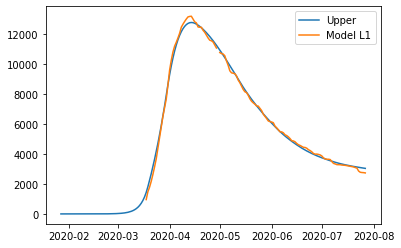

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3134521106056184, 'other': 0.41141986181311324, 'school': 0.23259140173738327, 'transport': 0.2564129603336426, 'work': 0.41713542023651345}
{'home': 1.0, 'leisure': 0.3390195111368879, 'other': 0.4506979105986866, 'school': 0.2951258757926748, 'transport': 0.28601114610814354, 'work': 0.5595142746609696}
{'home': 1.0, 'leisure': 0.363673790220612, 'other': 0.48857317192763233, 'school': 0.35542697577456306, 'transport': 0.31455225381926943, 'work': 0.696808169998838}
{'home': 1.0, 'leisure': 0.38376246206660947, 'other': 0.51943449597344, 'school': 0.404561205389435, 'transport': 0.33780797121352024, 'work': 0.8086772699037679}
{'home': 1.0, 'leisure': 0.39563304088469886, 'other': 0.537670732909599, 'school': 0.43359506834367745, 'transport': 0.3515499860373956, 'work': 0.8747817380294081}
{'home': 1.0, 'leisure': 0.40202489101751626, 'other': 0.5474902451059924, 'scho

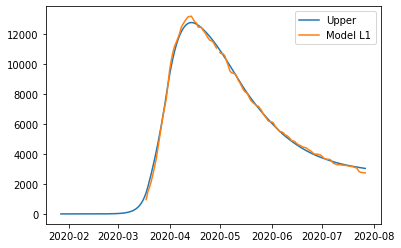

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

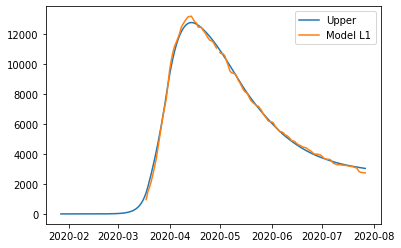

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

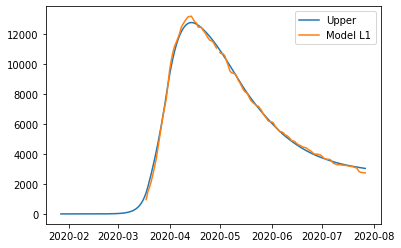

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

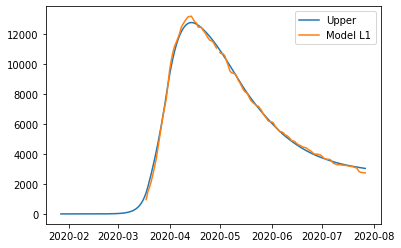

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

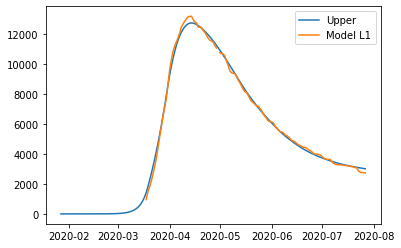

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31393392140033594, 'other': 0.41035350279396027, 'school': 0.23333734576022985, 'transport': 0.25660678165250617, 'work': 0.41701706322523957}
{'home': 1.0, 'leisure': 0.3391797809697084, 'other': 0.44907602927352097, 'school': 0.29538922818447716, 'transport': 0.28596071009828217, 'work': 0.5582097529665602}
{'home': 1.0, 'leisure': 0.36352400269731755, 'other': 0.4864156083788117, 'school': 0.3552249719507157, 'transport': 0.3142662839567091, 'work': 0.6943598466456908}
{'home': 1.0, 'leisure': 0.3833600352161102, 'other': 0.5168404506127523, 'school': 0.40398002242691, 'transport': 0.3373300848783902, 'work': 0.8052969600138714}
{'home': 1.0, 'leisure': 0.3950813271590331, 'other': 0.5348187664782627, 'school': 0.4327898249810249, 'transport': 0.35095869451392914, 'work': 0.8708507088223417}
{'home': 1.0, 'leisure': 0.40139279205137623, 'other': 0.5444993980981528, 's

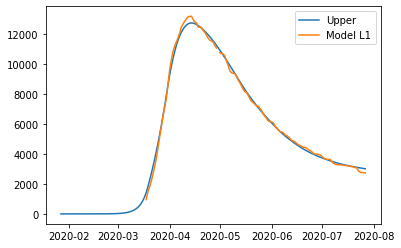

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31393392140033594, 'other': 0.41035350279396027, 'school': 0.23333734576022985, 'transport': 0.25660678165250617, 'work': 0.41701706322523957}
{'home': 1.0, 'leisure': 0.3391797809697084, 'other': 0.44907602927352097, 'school': 0.29538922818447716, 'transport': 0.28596071009828217, 'work': 0.5582097529665602}
{'home': 1.0, 'leisure': 0.36352400269731755, 'other': 0.4864156083788117, 'school': 0.3552249719507157, 'transport': 0.3142662839567091, 'work': 0.6943598466456908}
{'home': 1.0, 'leisure': 0.3833600352161102, 'other': 0.5168404506127523, 'school': 0.40398002242691, 'transport': 0.3373300848783902, 'work': 0.8052969600138714}
{'home': 1.0, 'leisure': 0.3950813271590331, 'other': 0.5348187664782627, 'school': 0.4327898249810249, 'transport': 0.35095869451392914, 'work': 0.8708507088223417}
{'home': 1.0, 'leisure': 0.40139279205137623, 'other': 0.5444993980981528, 's

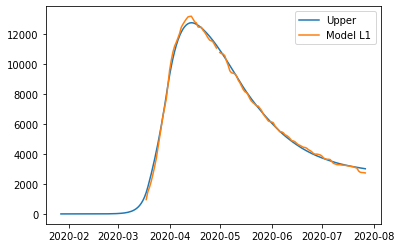

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

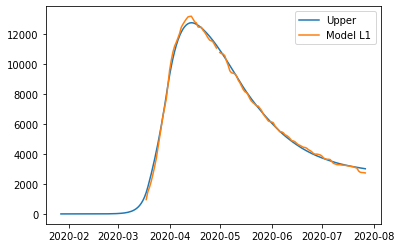

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

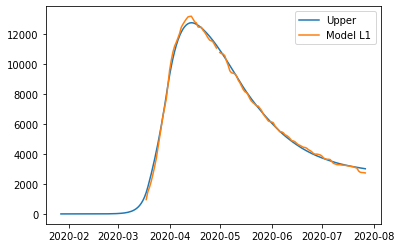

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

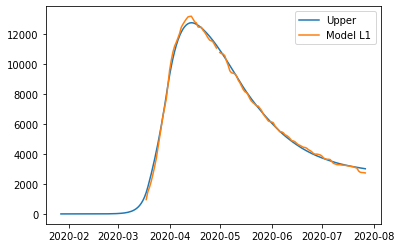

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

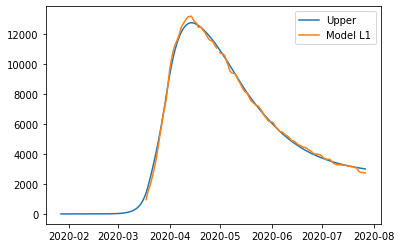

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.410225555786506, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988905576653, 'other': 0.44888151966574646, 'school': 0.2952496107411461, 'transport': 0.28587549719408467, 'work': 0.5579293789804616}
{'home': 1.0, 'leisure': 0.3634013229306639, 'other': 0.4861569134064426, 'school': 0.3550110851339178, 'transport': 0.31414575889358604, 'work': 0.6939317051710995}
{'home': 1.0, 'leisure': 0.3832033048642184, 'other': 0.5165294564544173, 'school': 0.4037056198243245, 'transport': 0.3371807869450316, 'work': 0.8047484154005082}
{'home': 1.0, 'leisure': 0.39490447600677325, 'other': 0.5344768682554932, 'school': 0.4324796630504738, 'transport': 0.3507923944299767, 'work': 0.8702310168997042}
{'home': 1.0, 'leisure': 0.40120510662199516, 'other': 0.5441408592253033, 'scho

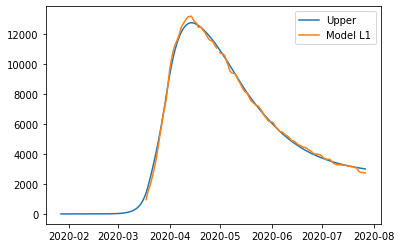

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.410225555786506, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988910084181, 'other': 0.44888152035711715, 'school': 0.2952496118495806, 'transport': 0.28587549771843146, 'work': 0.5579293815029842}
{'home': 1.0, 'leisure': 0.36340132381607126, 'other': 0.4861569147644922, 'school': 0.35501108731119985, 'transport': 0.31414575992355276, 'work': 0.6939317101260545}
{'home': 1.0, 'leisure': 0.38320330610378867, 'other': 0.5165294583556866, 'school': 0.40370562287251927, 'transport': 0.33718078838698506, 'work': 0.8047484223374451}
{'home': 1.0, 'leisure': 0.3949044774556217, 'other': 0.5344768704777562, 'school': 0.4324796666132989, 'transport': 0.3507923961153768, 'work': 0.8702310250078124}
{'home': 1.0, 'leisure': 0.4012051081835317, 'other': 0.5441408616204089, 's

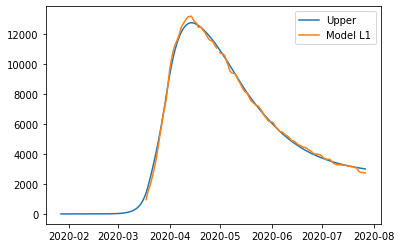

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31389636988369074, 'other': 0.4102255585272969, 'school': 0.2332747528020522, 'transport': 0.25655819084363235, 'work': 0.41688993959757786}
{'home': 1.0, 'leisure': 0.33909889234457824, 'other': 0.4488815224065374, 'school': 0.295249615135297, 'transport': 0.28587549927274486, 'work': 0.5579293889804616}
{'home': 1.0, 'leisure': 0.3634013247175769, 'other': 0.48615691614723355, 'school': 0.35501108952806876, 'transport': 0.3141457609722462, 'work': 0.6939317151710995}
{'home': 1.0, 'leisure': 0.3832033066511314, 'other': 0.5165294591952082, 'school': 0.4037056242184754, 'transport': 0.33718078902369175, 'work': 0.8047484254005082}
{'home': 1.0, 'leisure': 0.3949044777936863, 'other': 0.5344768709962842, 'school': 0.43247966744462474, 'transport': 0.3507923965086368, 'work': 0.8702310268997042}
{'home': 1.0, 'leisure': 0.40120510840890816, 'other': 0.5441408619660942, 's

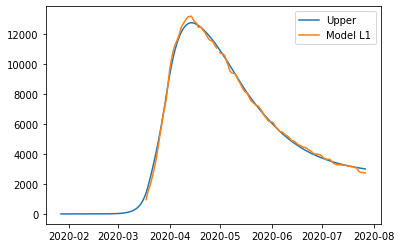

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.41022556578650604, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988905576653, 'other': 0.44888152966574646, 'school': 0.2952496107411461, 'transport': 0.28587549719408467, 'work': 0.5579293789804616}
{'home': 1.0, 'leisure': 0.3634013229306639, 'other': 0.4861569234064426, 'school': 0.3550110851339178, 'transport': 0.31414575889358604, 'work': 0.6939317051710995}
{'home': 1.0, 'leisure': 0.3832033048642184, 'other': 0.5165294664544173, 'school': 0.4037056198243245, 'transport': 0.3371807869450316, 'work': 0.8047484154005082}
{'home': 1.0, 'leisure': 0.39490447600677325, 'other': 0.5344768782554932, 'school': 0.4324796630504738, 'transport': 0.3507923944299767, 'work': 0.8702310168997042}
{'home': 1.0, 'leisure': 0.40120510662199516, 'other': 0.5441408692253034, 'sc

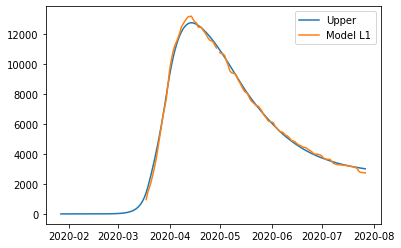

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31383423838875557, 'other': 0.41044137760587507, 'school': 0.23317669762692744, 'transport': 0.2565457698373129, 'work': 0.4169485575179932}
{'home': 1.0, 'leisure': 0.33910117744445667, 'other': 0.4492062575623561, 'school': 0.29525268506838914, 'transport': 0.28591354370798383, 'work': 0.558223734673459}
{'home': 1.0, 'leisure': 0.363465725819597, 'other': 0.4865866775203914, 'school': 0.35511167295837004, 'transport': 0.31423246851184505, 'work': 0.694453369787658}
{'home': 1.0, 'leisure': 0.3833183207919336, 'other': 0.5170447974861979, 'school': 0.4038856630909471, 'transport': 0.3373071479816579, 'work': 0.805455294695524}
{'home': 1.0, 'leisure': 0.3950493996392235, 'other': 0.5350427774659927, 'school': 0.4327066572601972, 'transport': 0.35094218585018366, 'work': 0.8710473412319903}
{'home': 1.0, 'leisure': 0.4013661344031487, 'other': 0.544733997455113, 'school

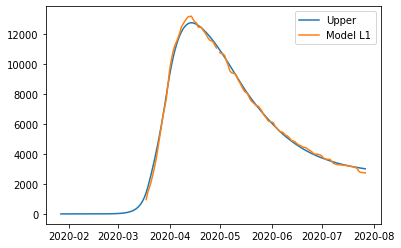

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31383423838875557, 'other': 0.41044137760587507, 'school': 0.23317669762692744, 'transport': 0.2565457698373129, 'work': 0.4169485575179932}
{'home': 1.0, 'leisure': 0.33910117744445667, 'other': 0.4492062575623561, 'school': 0.29525268506838914, 'transport': 0.28591354370798383, 'work': 0.558223734673459}
{'home': 1.0, 'leisure': 0.363465725819597, 'other': 0.4865866775203914, 'school': 0.35511167295837004, 'transport': 0.31423246851184505, 'work': 0.694453369787658}
{'home': 1.0, 'leisure': 0.3833183207919336, 'other': 0.5170447974861979, 'school': 0.4038856630909471, 'transport': 0.3373071479816579, 'work': 0.805455294695524}
{'home': 1.0, 'leisure': 0.3950493996392235, 'other': 0.5350427774659927, 'school': 0.4327066572601972, 'transport': 0.35094218585018366, 'work': 0.8710473412319903}
{'home': 1.0, 'leisure': 0.4013661344031487, 'other': 0.544733997455113, 'school

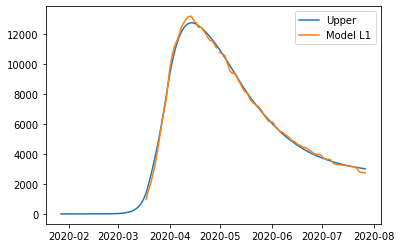

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

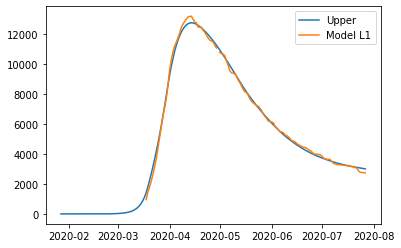

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

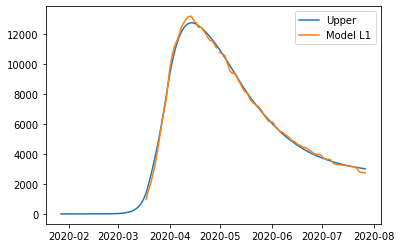

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

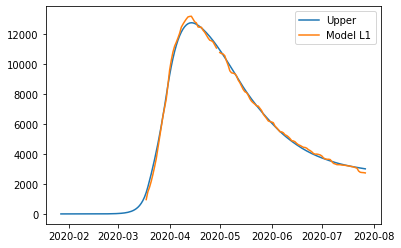

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

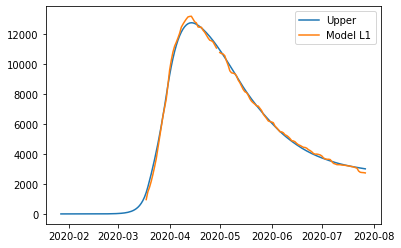

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

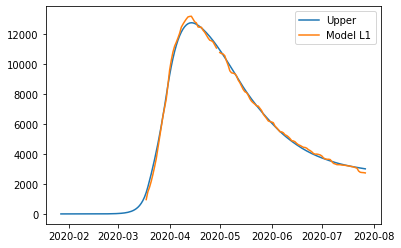

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

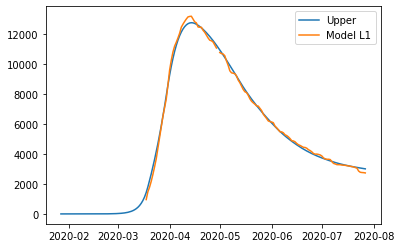

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138291914636026, 'other': 0.41046731237867057, 'school': 0.23313348226128175, 'transport': 0.2565439406316489, 'work': 0.41689179352397193}
{'home': 1.0, 'leisure': 0.339082609043894, 'other': 0.449215254733283, 'school': 0.2951864875710057, 'transport': 0.2859016535999109, 'work': 0.5581164365711726}
{'home': 1.0, 'leisure': 0.3634341188534606, 'other': 0.48657934200380215, 'school': 0.35502331411966814, 'transport': 0.3142108768193064, 'work': 0.6942973423666876}
{'home': 1.0, 'leisure': 0.3832760898094038, 'other': 0.5170241538538547, 'school': 0.4037792468630227, 'transport': 0.3372776512943693, 'work': 0.8052595619037739}
{'home': 1.0, 'leisure': 0.3950008908288248, 'other': 0.5350142699470677, 'school': 0.4325895707568231, 'transport': 0.3509080180296338, 'work': 0.8708281461756885}
{'home': 1.0, 'leisure': 0.40131424522389764, 'other': 0.5447012555357207, 'school

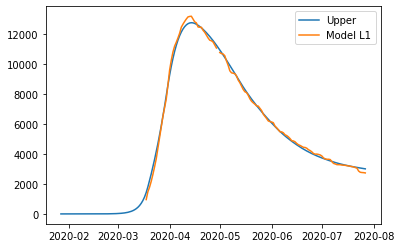

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138291914636026, 'other': 0.41046731237867057, 'school': 0.23313348226128175, 'transport': 0.2565439406316489, 'work': 0.41689179352397193}
{'home': 1.0, 'leisure': 0.339082609043894, 'other': 0.449215254733283, 'school': 0.2951864875710057, 'transport': 0.2859016535999109, 'work': 0.5581164365711726}
{'home': 1.0, 'leisure': 0.3634341188534606, 'other': 0.48657934200380215, 'school': 0.35502331411966814, 'transport': 0.3142108768193064, 'work': 0.6942973423666876}
{'home': 1.0, 'leisure': 0.3832760898094038, 'other': 0.5170241538538547, 'school': 0.4037792468630227, 'transport': 0.3372776512943693, 'work': 0.8052595619037739}
{'home': 1.0, 'leisure': 0.3950008908288248, 'other': 0.5350142699470677, 'school': 0.4325895707568231, 'transport': 0.3509080180296338, 'work': 0.8708281461756885}
{'home': 1.0, 'leisure': 0.40131424522389764, 'other': 0.5447012555357207, 'school

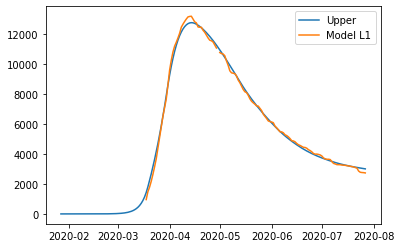

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138146161618781, 'other': 0.41051934762349207, 'school': 0.23305770561173805, 'transport': 0.2565380997654594, 'work': 0.41680658232152884}
{'home': 1.0, 'leisure': 0.3390515874623739, 'other': 0.44924861974695524, 'school': 0.2950818985670496, 'transport': 0.28588361449948146, 'work': 0.5579696860387963}
{'home': 1.0, 'leisure': 0.3633872383592806, 'other': 0.4865947035802947, 'school': 0.35489094177395714, 'transport': 0.3141810751358599, 'work': 0.6940912503375898}
{'home': 1.0, 'leisure': 0.38321628723824164, 'other': 0.5170248459630158, 'school': 0.40362423623884486, 'transport': 0.3372382652840201, 'work': 0.8050051175440143}
{'home': 1.0, 'leisure': 0.3949334524849004, 'other': 0.5350062937346236, 'school': 0.43242118296809656, 'transport': 0.3508629685533875, 'work': 0.870545129984174}
{'home': 1.0, 'leisure': 0.4012426953100243, 'other': 0.5446886117654894, 'sc

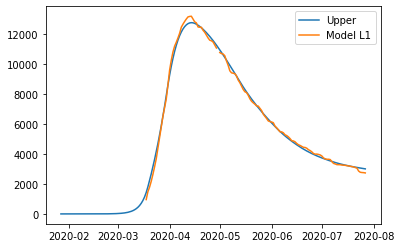

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138146161618781, 'other': 0.41051934762349207, 'school': 0.23305770561173805, 'transport': 0.2565380997654594, 'work': 0.41680658232152884}
{'home': 1.0, 'leisure': 0.3390515874623739, 'other': 0.44924861974695524, 'school': 0.2950818985670496, 'transport': 0.28588361449948146, 'work': 0.5579696860387963}
{'home': 1.0, 'leisure': 0.3633872383592806, 'other': 0.4865947035802947, 'school': 0.35489094177395714, 'transport': 0.3141810751358599, 'work': 0.6940912503375898}
{'home': 1.0, 'leisure': 0.38321628723824164, 'other': 0.5170248459630158, 'school': 0.40362423623884486, 'transport': 0.3372382652840201, 'work': 0.8050051175440143}
{'home': 1.0, 'leisure': 0.3949334524849004, 'other': 0.5350062937346236, 'school': 0.43242118296809656, 'transport': 0.3508629685533875, 'work': 0.870545129984174}
{'home': 1.0, 'leisure': 0.4012426953100243, 'other': 0.5446886117654894, 'sc

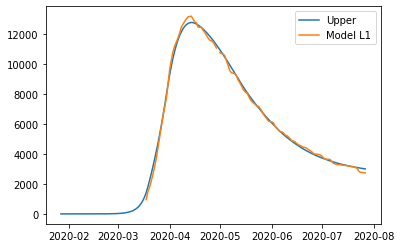

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072751016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.44938211692770363, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.4866562020249852, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276787709184, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.5349744604844244, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.544638112176312

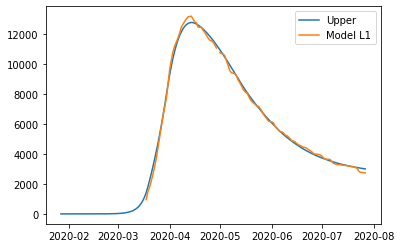

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072751016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.33892761473448585, 'other': 0.4493821176196511, 'school': 0.2946635805116342, 'transport': 0.2858114462608895, 'work': 0.5573826864318132}
{'home': 1.0, 'leisure': 0.36319987616873073, 'other': 0.4866562033841677, 'school': 0.35436150632207797, 'transport': 0.31406185207236315, 'work': 0.6932668871761536}
{'home': 1.0, 'leisure': 0.3829772743744117, 'other': 0.5170276806737738, 'school': 0.40300426068614315, 'transport': 0.33708070125208245, 'work': 0.8039873470419123}
{'home': 1.0, 'leisure': 0.39466391876867774, 'other': 0.5349744627085411, 'school': 0.4317477064467272, 'transport': 0.35068274849464387, 'work': 0.8694130733262244}
{'home': 1.0, 'leisure': 0.40095672728866716, 'other': 0.5446381145734158,

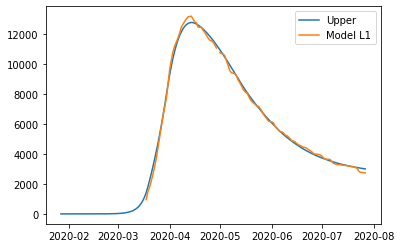

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.4107275143248097, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.4493821225015305, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.48665620895765405, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276868107918, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.534974469178555, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.5446381212227352,

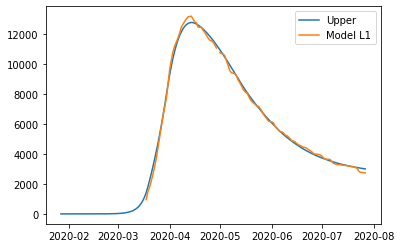

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072752016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.44938212692770363, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.4866562120249852, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276887709184, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.5349744704844244, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.544638122176312

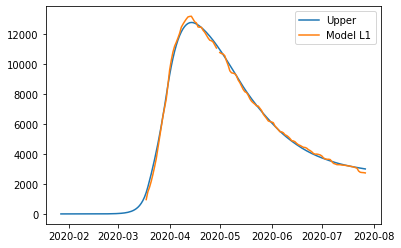

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

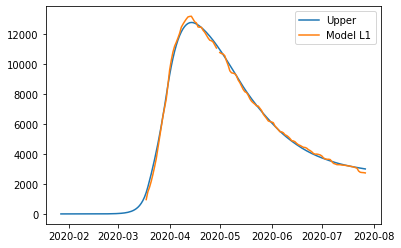

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

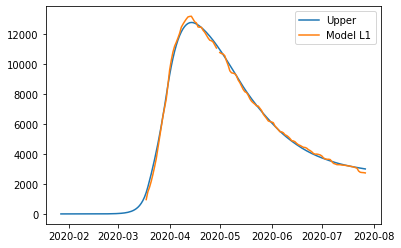

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

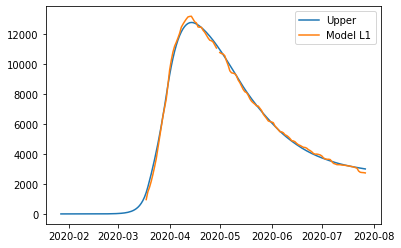

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

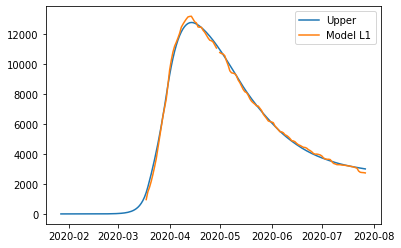

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

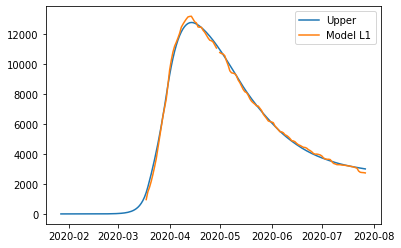

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

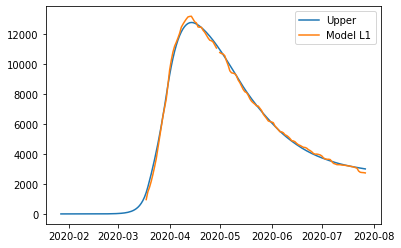

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

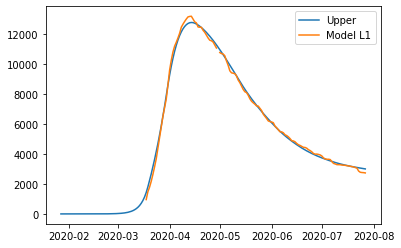

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

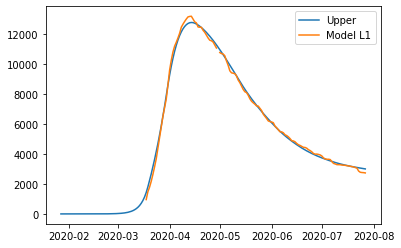

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

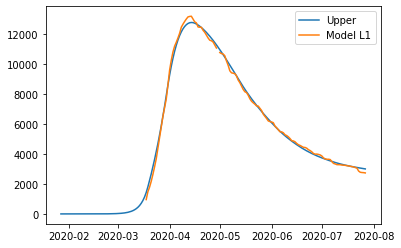

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

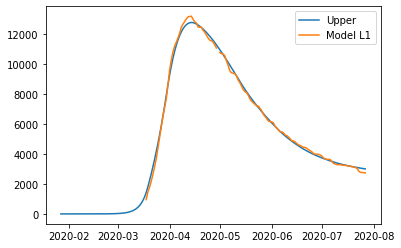

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

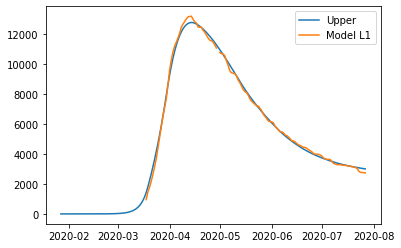

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

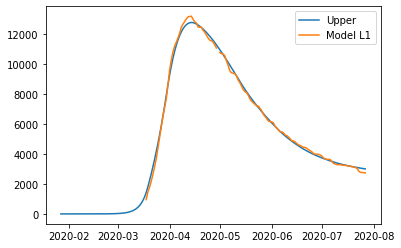

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

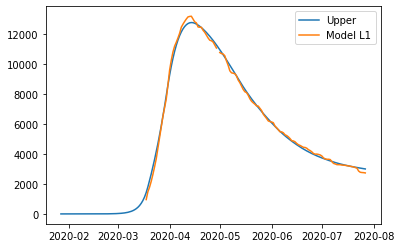

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.44971355071395247, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201454669266, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181115619425, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805460726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526261937751, 'sc

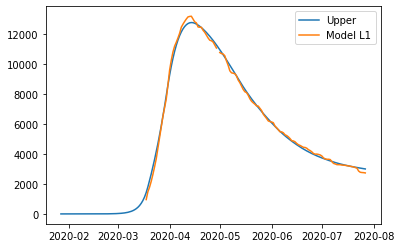

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.44971355071395247, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201454669266, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181115619425, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805460726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526261937751, 'sc

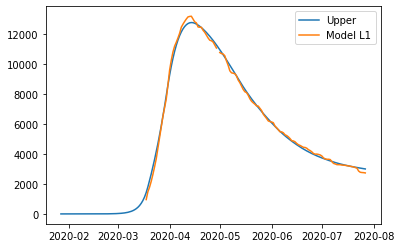

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572862623413, 'other': 0.44971355140645214, 'school': 0.2942906151420619, 'transport': 0.28575529676957684, 'work': 0.5571307616078517}
{'home': 1.0, 'leisure': 0.363060486315999, 'other': 0.48702014682719375, 'school': 0.3539812150749171, 'transport': 0.31400881971289946, 'work': 0.6930250214558753}
{'home': 1.0, 'leisure': 0.3828399185076593, 'other': 0.5174181134663165, 'school': 0.40261800020539174, 'transport': 0.337030208777829, 'work': 0.803753677628339}
{'home': 1.0, 'leisure': 0.39452776480273133, 'other': 0.5353805482985254, 'school': 0.43135791869158124, 'transport': 0.350633756861651, 'work': 0.8691842471847948}
{'home': 1.0, 'leisure': 0.40082122050007785, 'other': 0.5450526285927918, 'sch

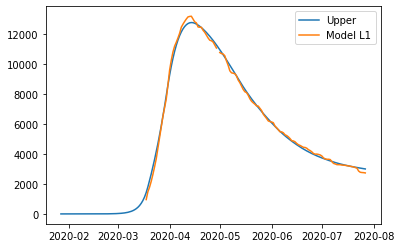

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119076231458, 'other': 0.4110252329746532, 'school': 0.2323892566411604, 'transport': 0.25645534912965695, 'work': 0.4162033910247161}
{'home': 1.0, 'leisure': 0.338785729961934, 'other': 0.44971355345921893, 'school': 0.29429061842649135, 'transport': 0.28575529832420526, 'work': 0.5571307690853291}
{'home': 1.0, 'leisure': 0.3630604872171942, 'other': 0.4870201482121931, 'school': 0.35398121729091775, 'transport': 0.31400882076180536, 'work': 0.6930250265009203}
{'home': 1.0, 'leisure': 0.3828399190548135, 'other': 0.517418114307209, 'school': 0.40261800155082067, 'transport': 0.33703020941466477, 'work': 0.8037536806914021}
{'home': 1.0, 'leisure': 0.3945277651406795, 'other': 0.5353805488179002, 'school': 0.43135791952258146, 'transport': 0.35063375725499074, 'work': 0.8691842490766867}
{'home': 1.0, 'leisure': 0.40082122072537657, 'other': 0.5450526289390416, 's

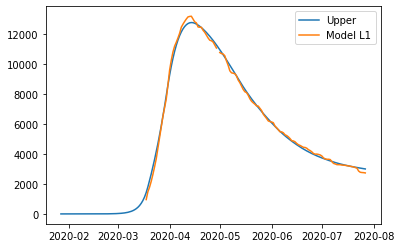

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.4110252343914206, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.4497135562852601, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201523971768, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181195994793, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805547644761, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.545052635237936, 'schoo

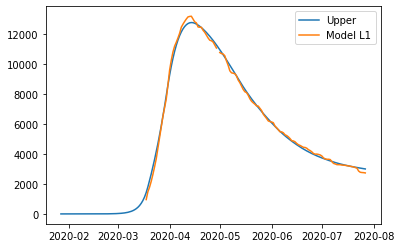

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.4110252402293868, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.4497135607139525, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.48702015546692656, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181215619426, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805560726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526361937752, 'sch

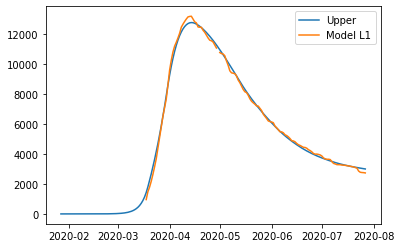

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399549557126, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878363215203, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797662194977, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677284722546, 'sch

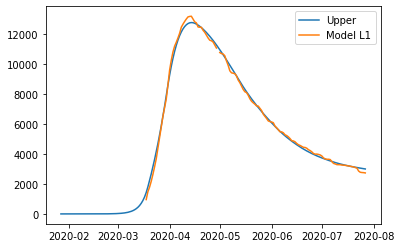

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399549557126, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878363215203, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797662194977, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677284722546, 'sch

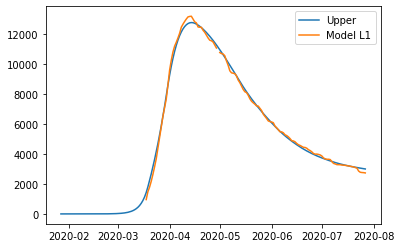

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814138808104, 'other': 0.4505721012460632, 'school': 0.2932316161469287, 'transport': 0.28558619076137987, 'work': 0.5563339321908309}
{'home': 1.0, 'leisure': 0.3626514776683226, 'other': 0.48793995631861636, 'school': 0.3528716972248866, 'transport': 0.31383382771987756, 'work': 0.6921880142175685}
{'home': 1.0, 'leisure': 0.38242160352629717, 'other': 0.5183878382295857, 'school': 0.40146731884396336, 'transport': 0.336850420797172, 'work': 0.8028839329060212}
{'home': 1.0, 'leisure': 0.39410395062419123, 'other': 0.5363797684497038, 'school': 0.4301829134370542, 'transport': 0.35045113488830054, 'work': 0.8682951575855615}
{'home': 1.0, 'leisure': 0.40039444521536505, 'other': 0.5460677308759213, '

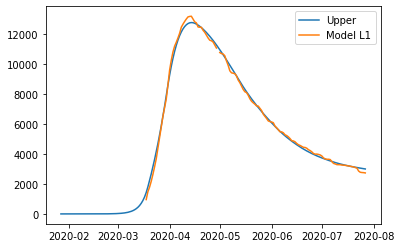

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322616480937115, 'other': 0.4118202542917808, 'school': 0.2313826475672048, 'transport': 0.2562923471059045, 'work': 0.4154482274964364}
{'home': 1.0, 'leisure': 0.33838814272354734, 'other': 0.45057210330280884, 'school': 0.29323161942954895, 'transport': 0.28558619231614407, 'work': 0.5563339396683084}
{'home': 1.0, 'leisure': 0.3626514785693601, 'other': 0.48793995770630016, 'school': 0.3528716994396665, 'transport': 0.3138338287688751, 'work': 0.6921880192626134}
{'home': 1.0, 'leisure': 0.3824216040733557, 'other': 0.518387839072108, 'school': 0.40146732018865117, 'transport': 0.3368504214340634, 'work': 0.8028839359690843}
{'home': 1.0, 'leisure': 0.3941039509620803, 'other': 0.5363797689700852, 'school': 0.43018291426759664, 'transport': 0.3504511352816746, 'work': 0.8682951594774533}
{'home': 1.0, 'leisure': 0.4003944454406244, 'other': 0.5460677312228422, 'sch

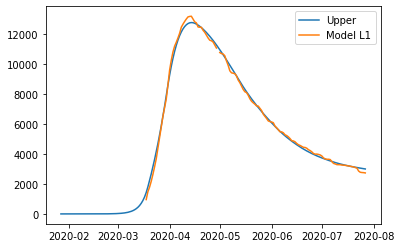

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202556956754, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210611556053, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399618775927, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878443503596, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797749024491, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677375074204, 'sch

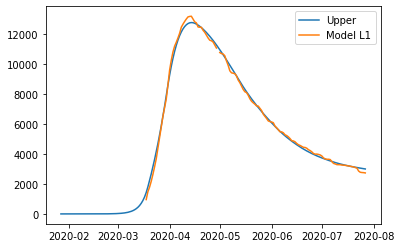

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202615411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057211055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.48793996495571257, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878463215204, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797762194976, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677384722546, 'sc

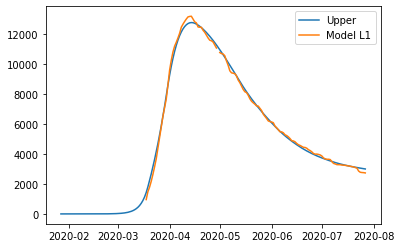

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764766413718, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446433351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927791596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848594195966, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729026364929, 'schoo

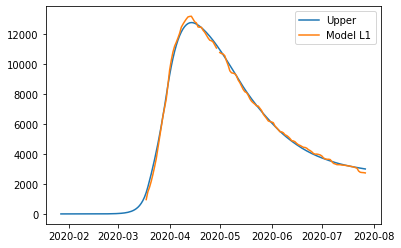

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764766413718, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446433351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927791596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848594195966, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729026364929, 'schoo

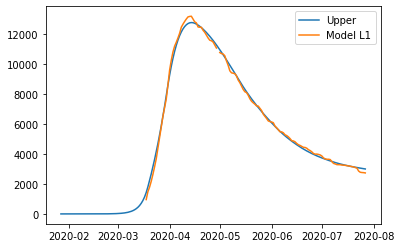

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.3383861139790334, 'other': 0.45057647733522055, 'school': 0.29322621666181514, 'transport': 0.2855853283138769, 'work': 0.5563298686779913}
{'home': 1.0, 'leisure': 0.36264939202106683, 'other': 0.487944644698032, 'school': 0.35286604016355055, 'transport': 0.3138329352524549, 'work': 0.6921837458138336}
{'home': 1.0, 'leisure': 0.38241947042568664, 'other': 0.5183927810677302, 'school': 0.40146145190570526, 'transport': 0.336849503869074, 'work': 0.8028794975541493}
{'home': 1.0, 'leisure': 0.394101789482962, 'other': 0.5363848616498247, 'school': 0.4301769224806149, 'transport': 0.3504502035061671, 'work': 0.8682906235825179}
{'home': 1.0, 'leisure': 0.400392268975341, 'other': 0.5460729050401832, 'school

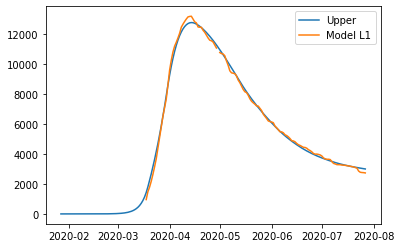

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132241977955007, 'other': 0.4118243065244011, 'school': 0.2313775151981615, 'transport': 0.25629151579017106, 'work': 0.4154443764630438}
{'home': 1.0, 'leisure': 0.3383861153144985, 'other': 0.4505764793919865, 'school': 0.2932262199444261, 'transport': 0.2855853298686418, 'work': 0.5563298761554687}
{'home': 1.0, 'leisure': 0.3626493929221035, 'other': 0.4879446460857295, 'school': 0.3528660423783242, 'transport': 0.3138329363014529, 'work': 0.6921837508588785}
{'home': 1.0, 'leisure': 0.38241947097274465, 'other': 0.518392781910261, 'school': 0.40146145325038934, 'transport': 0.3368495045059657, 'work': 0.8028795006172125}
{'home': 1.0, 'leisure': 0.39410178982085076, 'other': 0.5363848621702112, 'school': 0.43017692331115504, 'transport': 0.3504502038995414, 'work': 0.8682906254744097}
{'home': 1.0, 'leisure': 0.40039226920060017, 'other': 0.5460729053871076, 'schoo

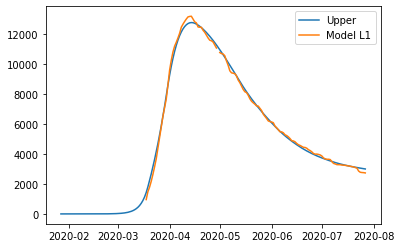

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430792823005, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764822046704, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446502569522, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927871884411, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848681025026, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729116716128, 'schoo

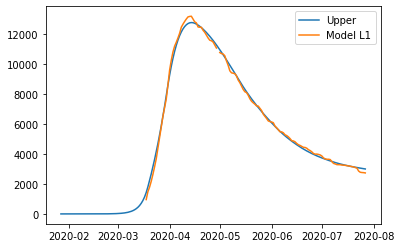

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182431377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.45057648664137173, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446533351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927891596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848694195965, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729126364929, 'scho

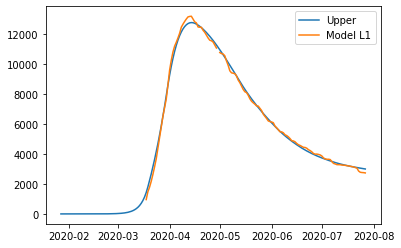

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.41242402939656353, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859582974559, 'other': 0.4512241383577378, 'school': 0.2924269015157371, 'transport': 0.2854576291925675, 'work': 0.5557282398112238}
{'home': 1.0, 'leisure': 0.3623406141253349, 'other': 0.4886385291417273, 'school': 0.3520285938946361, 'transport': 0.31370079058555345, 'work': 0.691551779244344}
{'home': 1.0, 'leisure': 0.3821036670221251, 'other': 0.5191243290397928, 'school': 0.40059293583299815, 'transport': 0.3367137369057641, 'work': 0.8022228113750344}
{'home': 1.0, 'leisure': 0.3937818346429557, 'other': 0.5371386653431951, 'school': 0.429290046978394, 'transport': 0.3503122960949796, 'work': 0.8676193303613515}
{'home': 1.0, 'leisure': 0.4000700787464799, 'other': 0.5468386925834887, 'school'

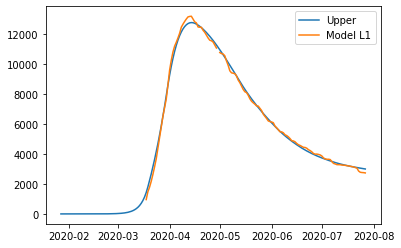

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.41242402939656353, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859587479148, 'other': 0.45122413905259995, 'school': 0.2924269026226631, 'transport': 0.2854576297171011, 'work': 0.5557282423337463}
{'home': 1.0, 'leisure': 0.3623406150101648, 'other': 0.4886385305066352, 'school': 0.35202859606895504, 'transport': 0.31370079161588726, 'work': 0.6915517841992989}
{'home': 1.0, 'leisure': 0.38210366826088693, 'other': 0.5191243309506638, 'school': 0.4005929388770447, 'transport': 0.33671373834823154, 'work': 0.8022228183119713}
{'home': 1.0, 'leisure': 0.3937818360908592, 'other': 0.5371386675766808, 'school': 0.4292900505363706, 'transport': 0.35031229778098044, 'work': 0.8676193384694597}
{'home': 1.0, 'leisure': 0.4000700803069981, 'other': 0.5468386949906899, 's

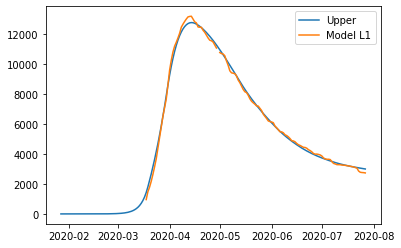

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329836691069, 'other': 0.41242403215119583, 'school': 0.23061774343690178, 'transport': 0.25616842686442765, 'work': 0.4148742089176177}
{'home': 1.0, 'leisure': 0.3380859600832035, 'other': 0.4512241411123701, 'school': 0.2924269059039081, 'transport': 0.28545763127196855, 'work': 0.5557282498112237}
{'home': 1.0, 'leisure': 0.36234061591108246, 'other': 0.48863853189635953, 'school': 0.3520285982828071, 'transport': 0.3137007926649545, 'work': 0.6915517892443439}
{'home': 1.0, 'leisure': 0.3821036688078727, 'other': 0.5191243317944251, 'school': 0.40059294022116926, 'transport': 0.3367137389851652, 'work': 0.8022228213750344}
{'home': 1.0, 'leisure': 0.39378183642870335, 'other': 0.5371386680978274, 'school': 0.429290051366565, 'transport': 0.3503122981743806, 'work': 0.8676193403613515}
{'home': 1.0, 'leisure': 0.4000700805322275, 'other': 0.546838695338121, 'scho

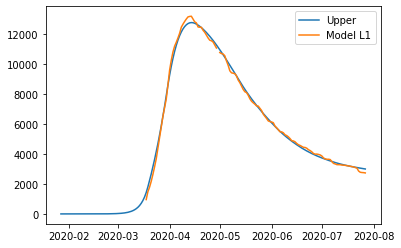

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.4124240393965635, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859582974559, 'other': 0.4512241483577378, 'school': 0.2924269015157371, 'transport': 0.2854576291925675, 'work': 0.5557282398112238}
{'home': 1.0, 'leisure': 0.3623406141253349, 'other': 0.4886385391417273, 'school': 0.3520285938946361, 'transport': 0.31370079058555345, 'work': 0.691551779244344}
{'home': 1.0, 'leisure': 0.3821036670221251, 'other': 0.5191243390397928, 'school': 0.40059293583299815, 'transport': 0.3367137369057641, 'work': 0.8022228113750344}
{'home': 1.0, 'leisure': 0.3937818346429557, 'other': 0.5371386753431951, 'school': 0.429290046978394, 'transport': 0.3503122960949796, 'work': 0.8676193303613515}
{'home': 1.0, 'leisure': 0.4000700787464799, 'other': 0.5468387025834887, 'school':

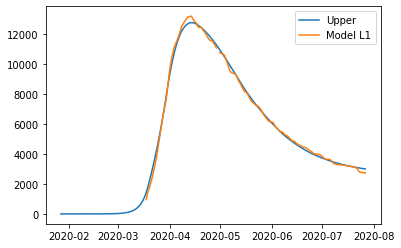

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.41340945873723883, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.33759232615077345, 'other': 0.45228835777432796, 'school': 0.29111267173760713, 'transport': 0.28524755526604734, 'work': 0.5547386876884013}
{'home': 1.0, 'leisure': 0.3618328040296299, 'other': 0.4897787247029496, 'school': 0.35065167209268455, 'transport': 0.31348340366934313, 'work': 0.6905123318145776}
{'home': 1.0, 'leisure': 0.381584304523513, 'other': 0.5203264310892339, 'school': 0.39916493164126626, 'transport': 0.33649039125721386, 'work': 0.8011427085099807}
{'home': 1.0, 'leisure': 0.39325564572444394, 'other': 0.5383773484993111, 'school': 0.42783185773815535, 'transport': 0.35008542937731923, 'work': 0.8665152038299915}
{'home': 1.0, 'leisure': 0.3995402140634067, 'other': 0.5480970732585833

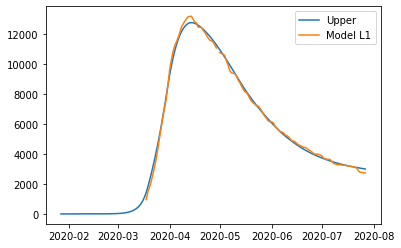

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.41340945873723883, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.3375923266011345, 'other': 0.4522883584708571, 'school': 0.29111267284377523, 'transport': 0.2852475557906378, 'work': 0.5547386902109238}
{'home': 1.0, 'leisure': 0.3618328049142676, 'other': 0.4897787260711318, 'school': 0.35065167426551475, 'transport': 0.3134834046997888, 'work': 0.6905123367695327}
{'home': 1.0, 'leisure': 0.38158430576200575, 'other': 0.5203264330046891, 'school': 0.39916493468322845, 'transport': 0.3364903926998377, 'work': 0.8011427154469177}
{'home': 1.0, 'leisure': 0.39325564717203276, 'other': 0.5383773507381546, 'school': 0.4278318612936956, 'transport': 0.350085431063503, 'work': 0.8665152119380997}
{'home': 1.0, 'leisure': 0.3995402156235858, 'other': 0.5480970756715592, 'sch

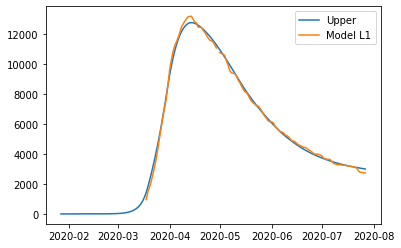

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245405458028186, 'other': 0.41340946149847924, 'school': 0.22936852760639675, 'transport': 0.2559659367792931, 'work': 0.4139364000760702}
{'home': 1.0, 'leisure': 0.33759232793613303, 'other': 0.4522883605355683, 'school': 0.29111267612277336, 'transport': 0.2852475573456739, 'work': 0.5547386976884012}
{'home': 1.0, 'leisure': 0.36183280581498956, 'other': 0.48977872746419, 'school': 0.35065167647785084, 'transport': 0.31348340574896977, 'work': 0.6905123418145777}
{'home': 1.0, 'leisure': 0.38158430630887263, 'other': 0.5203264338504743, 'school': 0.3991649360264325, 'transport': 0.3364903933368405, 'work': 0.8011427185099806}
{'home': 1.0, 'leisure': 0.39325564750980346, 'other': 0.5383773512605514, 'school': 0.42783186212332164, 'transport': 0.3500854314569459, 'work': 0.8665152138299915}
{'home': 1.0, 'leisure': 0.3995402158487663, 'other': 0.5480970760198237, 's

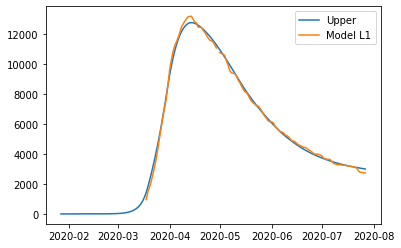

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.4134094687372388, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.33759232615077345, 'other': 0.45228836777432796, 'school': 0.29111267173760713, 'transport': 0.28524755526604734, 'work': 0.5547386876884013}
{'home': 1.0, 'leisure': 0.3618328040296299, 'other': 0.48977873470294964, 'school': 0.35065167209268455, 'transport': 0.31348340366934313, 'work': 0.6905123318145776}
{'home': 1.0, 'leisure': 0.381584304523513, 'other': 0.520326441089234, 'school': 0.39916493164126626, 'transport': 0.33649039125721386, 'work': 0.8011427085099807}
{'home': 1.0, 'leisure': 0.39325564572444394, 'other': 0.538377358499311, 'school': 0.42783185773815535, 'transport': 0.35008542937731923, 'work': 0.8665152038299915}
{'home': 1.0, 'leisure': 0.3995402140634067, 'other': 0.5480970832585833, 

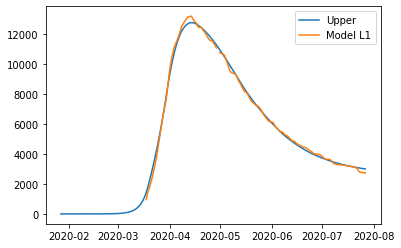

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340991527576976, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920973302806, 'other': 0.4522888508225533, 'school': 0.2911120626240482, 'transport': 0.2852474578694937, 'work': 0.5547382289512084}
{'home': 1.0, 'leisure': 0.3618325686374125, 'other': 0.4897792529569518, 'school': 0.35065103392327146, 'transport': 0.31348330288210724, 'work': 0.6905118499468872}
{'home': 1.0, 'leisure': 0.38158406377655696, 'other': 0.5203269880294246, 'school': 0.39916426979671266, 'transport': 0.3364902877071998, 'work': 0.801142207795218}
{'home': 1.0, 'leisure': 0.39325540181332413, 'other': 0.5383779223904313, 'school': 0.4278311819037461, 'transport': 0.35008532419475447, 'work': 0.8665146919783226}
{'home': 1.0, 'leisure': 0.3995399684485065, 'other': 0.5480976562771271, 's

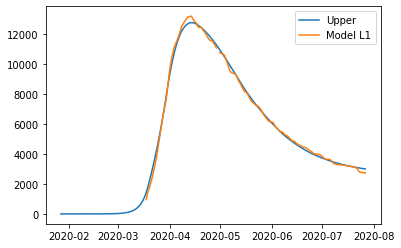

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340991527576976, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920977806416, 'other': 0.45228885151908327, 'school': 0.291112063730216, 'transport': 0.2852474583940843, 'work': 0.554738231473731}
{'home': 1.0, 'leisure': 0.36183256952205, 'other': 0.48977925432513547, 'school': 0.35065103609610093, 'transport': 0.31348330391255297, 'work': 0.6905118549018422}
{'home': 1.0, 'leisure': 0.3815840650150495, 'other': 0.5203269899448817, 'school': 0.39916427283867384, 'transport': 0.33649028914982376, 'work': 0.801142214732155}
{'home': 1.0, 'leisure': 0.39325540326091285, 'other': 0.5383779246292772, 'school': 0.42783118545928517, 'transport': 0.3500853258809383, 'work': 0.8665147000864308}
{'home': 1.0, 'leisure': 0.39953997000868546, 'other': 0.5480976586901056, 'sc

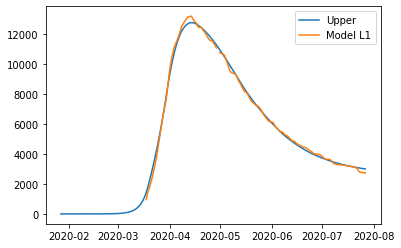

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383257491066, 'other': 0.4134099180370132, 'school': 0.2293679486248334, 'transport': 0.25596584289900265, 'work': 0.4139359653260601}
{'home': 1.0, 'leisure': 0.33759209911564003, 'other': 0.4522888535837968, 'school': 0.2911120670092131, 'transport': 0.28524745994912043, 'work': 0.5547382389512084}
{'home': 1.0, 'leisure': 0.36183257042277184, 'other': 0.48977925571819525, 'school': 0.3506510383084363, 'transport': 0.313483304961734, 'work': 0.6905118599468871}
{'home': 1.0, 'leisure': 0.3815840655619164, 'other': 0.520326990790668, 'school': 0.39916427418187755, 'transport': 0.33649028978682655, 'work': 0.8011422177952181}
{'home': 1.0, 'leisure': 0.39325540359868355, 'other': 0.5383779251516747, 'school': 0.4278311862889109, 'transport': 0.3500853262743812, 'work': 0.8665147019783226}
{'home': 1.0, 'leisure': 0.3995399702338659, 'other': 0.5480976590383706, 'sch

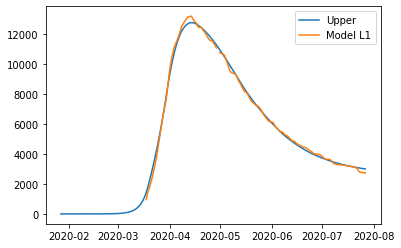

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340992527576975, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920973302806, 'other': 0.4522888608225533, 'school': 0.2911120626240482, 'transport': 0.2852474578694937, 'work': 0.5547382289512084}
{'home': 1.0, 'leisure': 0.3618325686374125, 'other': 0.48977926295695173, 'school': 0.35065103392327146, 'transport': 0.31348330288210724, 'work': 0.6905118499468872}
{'home': 1.0, 'leisure': 0.38158406377655696, 'other': 0.5203269980294246, 'school': 0.39916426979671266, 'transport': 0.3364902877071998, 'work': 0.801142207795218}
{'home': 1.0, 'leisure': 0.39325540181332413, 'other': 0.5383779323904312, 'school': 0.4278311819037461, 'transport': 0.35008532419475447, 'work': 0.8665146919783226}
{'home': 1.0, 'leisure': 0.3995399684485065, 'other': 0.5480976662771271, '

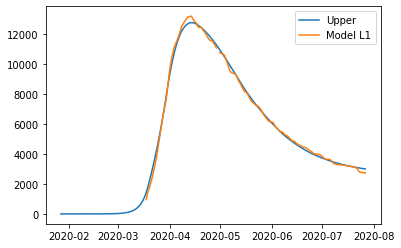

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.4134103699818755, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186942809655, 'other': 0.4522893418918198, 'school': 0.29111145595508425, 'transport': 0.28524736086379815, 'work': 0.5547377720549996}
{'home': 1.0, 'leisure': 0.361832334189878, 'other': 0.48977977909069464, 'school': 0.35065039831506534, 'transport': 0.3134832024993363, 'work': 0.690511370013007}
{'home': 1.0, 'leisure': 0.38158382399577395, 'other': 0.5203275427342223, 'school': 0.3991636106083833, 'transport': 0.33649018457273777, 'work': 0.801141709089902}
{'home': 1.0, 'leisure': 0.3932551588810761, 'other': 0.5383784939781251, 'school': 0.42783050878170753, 'transport': 0.35008521943429316, 'work': 0.8665141821807945}
{'home': 1.0, 'leisure': 0.3995397238193157, 'other': 0.5480982369556111, 'sch

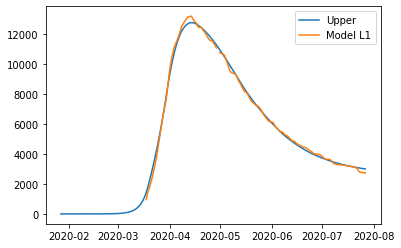

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.4134103699818755, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186987845746, 'other': 0.45228934258835046, 'school': 0.29111145706125163, 'transport': 0.2852473613883887, 'work': 0.5547377745775222}
{'home': 1.0, 'leisure': 0.36183233507451545, 'other': 0.4897797804588798, 'school': 0.3506504004878941, 'transport': 0.31348320352978204, 'work': 0.690511374967962}
{'home': 1.0, 'leisure': 0.38158382523426637, 'other': 0.5203275446496817, 'school': 0.3991636136503436, 'transport': 0.33649018601536185, 'work': 0.801141716026839}
{'home': 1.0, 'leisure': 0.3932551603286647, 'other': 0.5383784962169735, 'school': 0.4278305123372455, 'transport': 0.35008522112047713, 'work': 0.8665141902889026}
{'home': 1.0, 'leisure': 0.39953972537949456, 'other': 0.5480982393685923, 'sc

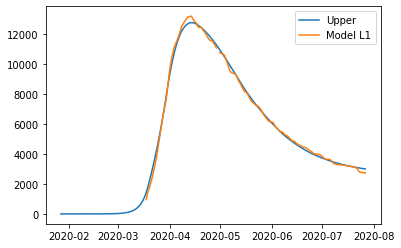

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536114604973, 'other': 0.413410372743122, 'school': 0.22936737196693396, 'transport': 0.25596574939545946, 'work': 0.4139355323207697}
{'home': 1.0, 'leisure': 0.3375918712134558, 'other': 0.45228934465306625, 'school': 0.2911114603402477, 'transport': 0.28524736294342495, 'work': 0.5547377820549996}
{'home': 1.0, 'leisure': 0.36183233597523723, 'other': 0.48977978185194115, 'school': 0.35065040270022885, 'transport': 0.31348320457896317, 'work': 0.690511380013007}
{'home': 1.0, 'leisure': 0.38158382578113315, 'other': 0.5203275454954688, 'school': 0.39916361499354674, 'transport': 0.3364901866523646, 'work': 0.801141719089902}
{'home': 1.0, 'leisure': 0.39325516066643534, 'other': 0.5383784967393715, 'school': 0.427830513166871, 'transport': 0.35008522151391996, 'work': 0.8665141921807944}
{'home': 1.0, 'leisure': 0.399539725604675, 'other': 0.5480982397168576, 'sch

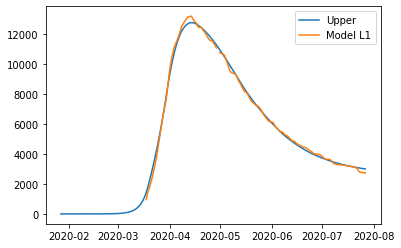

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.41341037998187546, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186942809655, 'other': 0.4522893518918198, 'school': 0.29111145595508425, 'transport': 0.28524736086379815, 'work': 0.5547377720549996}
{'home': 1.0, 'leisure': 0.361832334189878, 'other': 0.48977978909069464, 'school': 0.35065039831506534, 'transport': 0.3134832024993363, 'work': 0.690511370013007}
{'home': 1.0, 'leisure': 0.38158382399577395, 'other': 0.5203275527342224, 'school': 0.3991636106083833, 'transport': 0.33649018457273777, 'work': 0.801141709089902}
{'home': 1.0, 'leisure': 0.3932551588810761, 'other': 0.538378503978125, 'school': 0.42783050878170753, 'transport': 0.35008521943429316, 'work': 0.8665141821807945}
{'home': 1.0, 'leisure': 0.3995397238193157, 'other': 0.548098246955611, 'scho

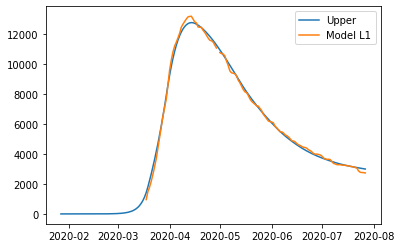

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635361829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.3374649625609959, 'other': 0.45256275498620724, 'school': 0.2907736465009324, 'transport': 0.28519334087943565, 'work': 0.5544833452340038}
{'home': 1.0, 'leisure': 0.3617017826128933, 'other': 0.49007271597502616, 'school': 0.35029647477288295, 'transport': 0.31342730188520335, 'work': 0.6902441144546101}
{'home': 1.0, 'leisure': 0.3814503026551801, 'other': 0.5206363878918416, 'school': 0.39879655706854655, 'transport': 0.33643275159360675, 'work': 0.8008640004862154}
{'home': 1.0, 'leisure': 0.39311988268016773, 'other': 0.5386967394790507, 'school': 0.4274556966068932, 'transport': 0.35002688096675416, 'work': 0.8662302967776185}
{'home': 1.0, 'leisure': 0.3994035026936226, 'other': 0.5484215441798557, 

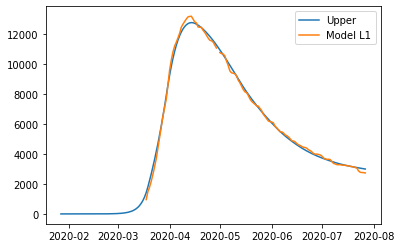

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635361829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.33746496301133166, 'other': 0.4525627556831665, 'school': 0.29077364760690483, 'transport': 0.28519334140404085, 'work': 0.5544833477565263}
{'home': 1.0, 'leisure': 0.3617017834974814, 'other': 0.4900727173440533, 'school': 0.35029647694532895, 'transport': 0.3134273029156779, 'work': 0.6902441194095652}
{'home': 1.0, 'leisure': 0.38145030389360335, 'other': 0.5206363898084795, 'school': 0.3987965601099709, 'transport': 0.33643275303627096, 'work': 0.8008640074231523}
{'home': 1.0, 'leisure': 0.39311988412767546, 'other': 0.5386967417192768, 'school': 0.4274557001618048, 'transport': 0.3500268826529851, 'work': 0.8662303048857267}
{'home': 1.0, 'leisure': 0.3994035042537143, 'other': 0.5484215465943216, 's

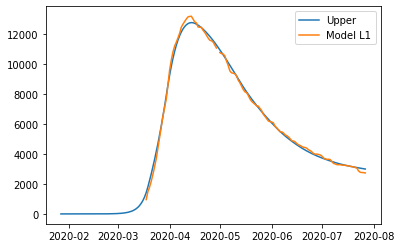

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304842924359, 'other': 0.41366353894593316, 'school': 0.22904627341811518, 'transport': 0.2559136796938798, 'work': 0.4136944093755971}
{'home': 1.0, 'leisure': 0.3374649643462554, 'other': 0.4525627577491528, 'school': 0.29077365088532325, 'transport': 0.28519334295912047, 'work': 0.5544833552340037}
{'home': 1.0, 'leisure': 0.3617017843981528, 'other': 0.4900727187379717, 'school': 0.3502964791572739, 'transport': 0.31342730396488816, 'work': 0.6902441244546101}
{'home': 1.0, 'leisure': 0.3814503044404396, 'other': 0.5206363906547872, 'school': 0.3987965614529375, 'transport': 0.33643275367329156, 'work': 0.8008640104862155}
{'home': 1.0, 'leisure': 0.3931198844654272, 'other': 0.5386967422419963, 'school': 0.42745570099128405, 'transport': 0.350026883046439, 'work': 0.8662303067776185}
{'home': 1.0, 'leisure': 0.39940350447888207, 'other': 0.5484215469428011, 'sch

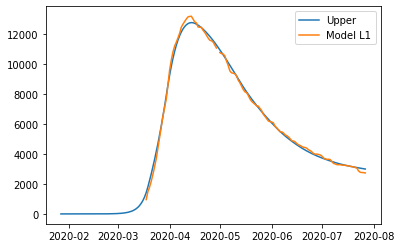

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635461829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.3374649625609959, 'other': 0.4525627649862073, 'school': 0.2907736465009324, 'transport': 0.28519334087943565, 'work': 0.5544833452340038}
{'home': 1.0, 'leisure': 0.3617017826128933, 'other': 0.49007272597502616, 'school': 0.35029647477288295, 'transport': 0.31342730188520335, 'work': 0.6902441144546101}
{'home': 1.0, 'leisure': 0.3814503026551801, 'other': 0.5206363978918416, 'school': 0.39879655706854655, 'transport': 0.33643275159360675, 'work': 0.8008640004862154}
{'home': 1.0, 'leisure': 0.39311988268016773, 'other': 0.5386967494790508, 'school': 0.4274556966068932, 'transport': 0.35002688096675416, 'work': 0.8662302967776185}
{'home': 1.0, 'leisure': 0.3994035026936226, 'other': 0.5484215541798556, '

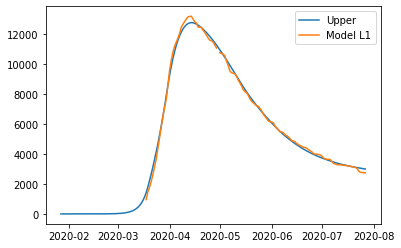

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.4136718127788025, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608608117925, 'other': 0.45257171852581335, 'school': 0.2907627112611542, 'transport': 0.28519161054341646, 'work': 0.5544751892782639}
{'home': 1.0, 'leisure': 0.3616975802268986, 'other': 0.4900823419247168, 'school': 0.3502850459264092, 'transport': 0.31342552486456976, 'work': 0.6902356058187258}
{'home': 1.0, 'leisure': 0.38144601826883684, 'other': 0.5206465535830824, 'school': 0.3987847260240243, 'transport': 0.3364309365336577, 'work': 0.8008552044813244}
{'home': 1.0, 'leisure': 0.39311554983907315, 'other': 0.5387072241084804, 'school': 0.4274436278998878, 'transport': 0.35002504342902774, 'work': 0.866221330963769}
{'home': 1.0, 'leisure': 0.3993991437615081, 'other': 0.5484322005452331, 'schoo

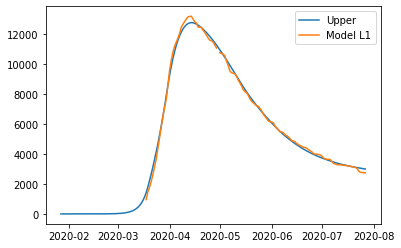

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.4136718127788025, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608612621275, 'other': 0.4525717192227867, 'school': 0.2907627123671204, 'transport': 0.28519161106802215, 'work': 0.5544751918007864}
{'home': 1.0, 'leisure': 0.3616975811114852, 'other': 0.49008234329377154, 'school': 0.35028504809884276, 'transport': 0.31342552589504524, 'work': 0.6902356107736808}
{'home': 1.0, 'leisure': 0.3814460195072582, 'other': 0.5206465554997592, 'school': 0.3987847290654314, 'transport': 0.3364309379763233, 'work': 0.8008552114182614}
{'home': 1.0, 'leisure': 0.3931155512865786, 'other': 0.5387072263487519, 'school': 0.42744363145477915, 'transport': 0.35002504511526034, 'work': 0.8662213390718771}
{'home': 1.0, 'leisure': 0.39939914532159726, 'other': 0.5484322029597479, 'sch

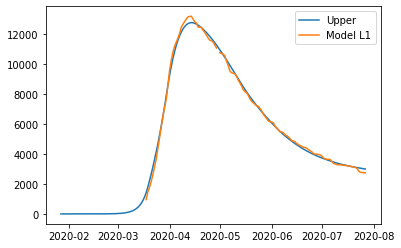

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264869073095, 'other': 0.413671815541804, 'school': 0.2290358500667372, 'transport': 0.2559119977715369, 'work': 0.4136866191622293}
{'home': 1.0, 'leisure': 0.3374608625970492, 'other': 0.4525717212888149, 'school': 0.2907627156455202, 'transport': 0.2851916126231033, 'work': 0.5544751992782639}
{'home': 1.0, 'leisure': 0.3616975820121553, 'other': 0.4900823446877182, 'school': 0.35028505031077506, 'transport': 0.3134255269442565, 'work': 0.6902356158187257}
{'home': 1.0, 'leisure': 0.38144602005409356, 'other': 0.5206465563460839, 'school': 0.39878473040839024, 'transport': 0.33643093861334444, 'work': 0.8008552144813244}
{'home': 1.0, 'leisure': 0.3931155516243298, 'other': 0.5387072268714819, 'school': 0.42744363228425375, 'transport': 0.3500250455087145, 'work': 0.8662213409637689}
{'home': 1.0, 'leisure': 0.39939914554676476, 'other': 0.5484322033082346, 'schoo

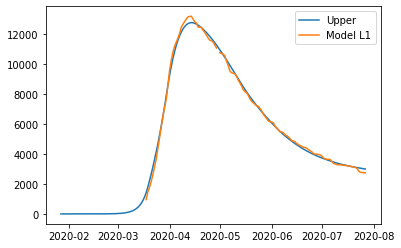

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.41367182277880243, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608608117925, 'other': 0.4525717285258134, 'school': 0.2907627112611542, 'transport': 0.28519161054341646, 'work': 0.5544751892782639}
{'home': 1.0, 'leisure': 0.3616975802268986, 'other': 0.4900823519247167, 'school': 0.3502850459264092, 'transport': 0.31342552486456976, 'work': 0.6902356058187258}
{'home': 1.0, 'leisure': 0.38144601826883684, 'other': 0.5206465635830825, 'school': 0.3987847260240243, 'transport': 0.3364309365336577, 'work': 0.8008552044813244}
{'home': 1.0, 'leisure': 0.39311554983907315, 'other': 0.5387072341084804, 'school': 0.4274436278998878, 'transport': 0.35002504342902774, 'work': 0.866221330963769}
{'home': 1.0, 'leisure': 0.3993991437615081, 'other': 0.5484322105452331, 'schoo

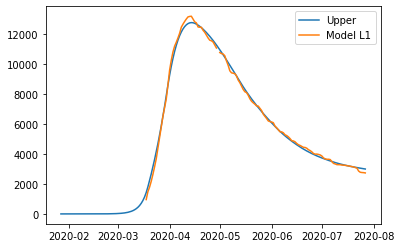

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743349788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.33745961084190657, 'other': 0.4525744500648814, 'school': 0.2907593788543277, 'transport': 0.28519108323860615, 'work': 0.5544727038248879}
{'home': 1.0, 'leisure': 0.3616962995889042, 'other': 0.49008527532645196, 'school': 0.350281563097779, 'transport': 0.31342498333302, 'work': 0.6902330128892815}
{'home': 1.0, 'leisure': 0.38144471264201335, 'other': 0.5206496514655095, 'school': 0.3987811206294801, 'transport': 0.3364303834099498, 'work': 0.8008525239787875}
{'home': 1.0, 'leisure': 0.3931142294461233, 'other': 0.5387104191840435, 'school': 0.4274399500800308, 'transport': 0.3500244834554083, 'work': 0.8662185987134955}
{'home': 1.0, 'leisure': 0.39939781541756714, 'other': 0.5484354479555618, 'school

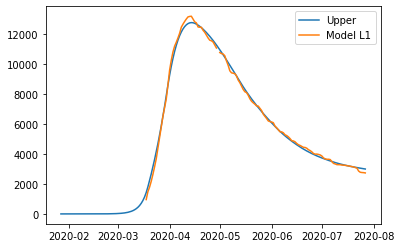

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743349788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.3374596112922414, 'other': 0.4525744507618591, 'school': 0.29075937996029194, 'transport': 0.28519108376321195, 'work': 0.5544727063474104}
{'home': 1.0, 'leisure': 0.36169630047349044, 'other': 0.49008527669551527, 'school': 0.3502815652702088, 'transport': 0.31342498436349575, 'work': 0.6902330178442365}
{'home': 1.0, 'leisure': 0.3814447138804341, 'other': 0.520649653382198, 'school': 0.3987811236708819, 'transport': 0.33643038485261584, 'work': 0.8008525309157244}
{'home': 1.0, 'leisure': 0.39311423089362807, 'other': 0.5387104214243288, 'school': 0.42743995363491594, 'transport': 0.35002448514164136, 'work': 0.8662186068216037}
{'home': 1.0, 'leisure': 0.39939781697765564, 'other': 0.5484354503700916, 

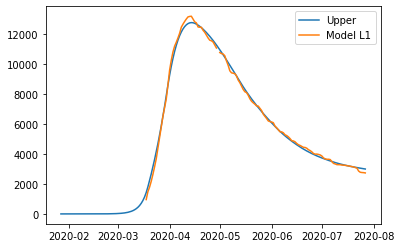

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252687413871, 'other': 0.41367433774182677, 'school': 0.22903267365288463, 'transport': 0.2559114852203829, 'work': 0.4136842451655167}
{'home': 1.0, 'leisure': 0.33745961262716245, 'other': 0.4525744528279, 'school': 0.29075938323868605, 'transport': 0.2851910853182935, 'work': 0.5544727138248879}
{'home': 1.0, 'leisure': 0.36169630137416003, 'other': 0.49008527808947056, 'school': 0.35028156748213735, 'transport': 0.31342498541270736, 'work': 0.6902330228892815}
{'home': 1.0, 'leisure': 0.38144471442726924, 'other': 0.520649654228528, 'school': 0.39878112501383856, 'transport': 0.3364303854896372, 'work': 0.8008525339787875}
{'home': 1.0, 'leisure': 0.39311423123137923, 'other': 0.5387104219470621, 'school': 0.4274399544643891, 'transport': 0.3500244855350957, 'work': 0.8662186087134955}
{'home': 1.0, 'leisure': 0.39939781720282297, 'other': 0.5484354507185804, 'sc

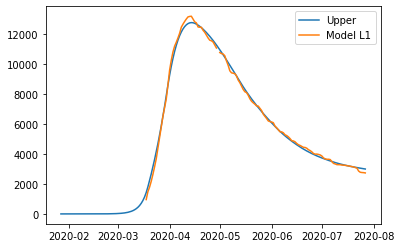

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743449788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.33745961084190657, 'other': 0.4525744600648814, 'school': 0.2907593788543277, 'transport': 0.28519108323860615, 'work': 0.5544727038248879}
{'home': 1.0, 'leisure': 0.3616962995889042, 'other': 0.490085285326452, 'school': 0.350281563097779, 'transport': 0.31342498333302, 'work': 0.6902330128892815}
{'home': 1.0, 'leisure': 0.38144471264201335, 'other': 0.5206496614655095, 'school': 0.3987811206294801, 'transport': 0.3364303834099498, 'work': 0.8008525239787875}
{'home': 1.0, 'leisure': 0.3931142294461233, 'other': 0.5387104291840434, 'school': 0.4274399500800308, 'transport': 0.3500244834554083, 'work': 0.8662185987134955}
{'home': 1.0, 'leisure': 0.39939781541756714, 'other': 0.5484354579555618, 'school':

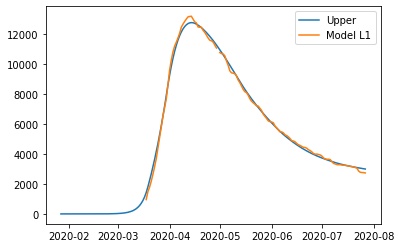

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776113976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.337457987085484, 'other': 0.45257799842236135, 'school': 0.2907550499404233, 'transport': 0.28519039824973685, 'work': 0.5544694751291505}
{'home': 1.0, 'leisure': 0.3616946359935031, 'other': 0.4900890859104451, 'school': 0.35027703878064004, 'transport': 0.31342427986307153, 'work': 0.6902296445781617}
{'home': 1.0, 'leisure': 0.3814430165852224, 'other': 0.5206536757155504, 'school': 0.39877643709489075, 'transport': 0.3364296648813442, 'work': 0.8008490419069857}
{'home': 1.0, 'leisure': 0.39311251420760196, 'other': 0.5387145696912945, 'school': 0.4274351724624025, 'transport': 0.35002375602850533, 'work': 0.8662150494194726}
{'home': 1.0, 'leisure': 0.3993960898504217, 'other': 0.5484396664474643, 's

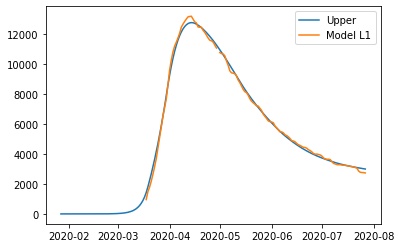

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776113976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.3374579875358185, 'other': 0.4525779991193446, 'school': 0.29075505104638505, 'transport': 0.2851903987743429, 'work': 0.554469477651673}
{'home': 1.0, 'leisure': 0.3616946368780888, 'other': 0.4900890872795194, 'school': 0.350277040953065, 'transport': 0.3134242808935476, 'work': 0.6902296495331167}
{'home': 1.0, 'leisure': 0.3814430178236423, 'other': 0.5206536776322543, 'school': 0.3987764401362856, 'transport': 0.3364296663240107, 'work': 0.8008490488439226}
{'home': 1.0, 'leisure': 0.39311251565510585, 'other': 0.5387145719315978, 'school': 0.42743517601727965, 'transport': 0.3500237577147389, 'work': 0.8662150575275808}
{'home': 1.0, 'leisure': 0.39939609141050925, 'other': 0.5484396688620135, 'schoo

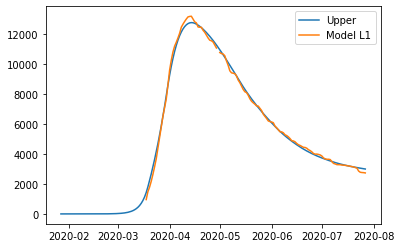

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123236862994597, 'other': 0.4136776141607226, 'school': 0.22902854737936176, 'transport': 0.255910819397078, 'work': 0.41368116125610177}
{'home': 1.0, 'leisure': 0.33745798887073875, 'other': 0.45257800118540203, 'school': 0.2907550543247717, 'transport': 0.285190400329425, 'work': 0.5544694851291505}
{'home': 1.0, 'leisure': 0.3616946377787579, 'other': 0.4900890886734858, 'school': 0.3502770431649885, 'transport': 0.3134242819427596, 'work': 0.6902296545781617}
{'home': 1.0, 'leisure': 0.3814430183704771, 'other': 0.5206536784785911, 'school': 0.3987764414792392, 'transport': 0.3364296669610323, 'work': 0.8008490519069857}
{'home': 1.0, 'leisure': 0.3931125159928567, 'other': 0.5387145724543352, 'school': 0.427435176846751, 'transport': 0.3500237581081934, 'work': 0.8662150594194726}
{'home': 1.0, 'leisure': 0.39939609163567646, 'other': 0.548439669210505, 'school': 

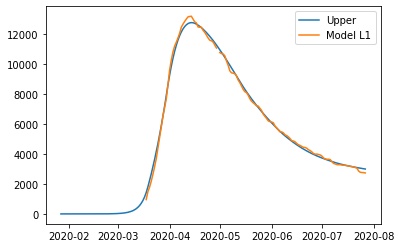

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776213976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.337457987085484, 'other': 0.45257800842236134, 'school': 0.2907550499404233, 'transport': 0.28519039824973685, 'work': 0.5544694751291505}
{'home': 1.0, 'leisure': 0.3616946359935031, 'other': 0.49008909591044514, 'school': 0.35027703878064004, 'transport': 0.31342427986307153, 'work': 0.6902296445781617}
{'home': 1.0, 'leisure': 0.3814430165852224, 'other': 0.5206536857155504, 'school': 0.39877643709489075, 'transport': 0.3364296648813442, 'work': 0.8008490419069857}
{'home': 1.0, 'leisure': 0.39311251420760196, 'other': 0.5387145796912944, 'school': 0.4274351724624025, 'transport': 0.35002375602850533, 'work': 0.8662150494194726}
{'home': 1.0, 'leisure': 0.3993960898504217, 'other': 0.5484396764474643, '

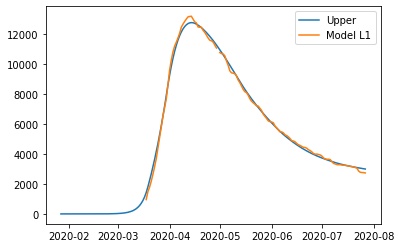

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367835040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.3374576208402605, 'other': 0.4525787987678424, 'school': 0.29075407353595134, 'transport': 0.2851902437474495, 'work': 0.5544687468827878}
{'home': 1.0, 'leisure': 0.36169426076242905, 'other': 0.490089945402171, 'school': 0.35027601830215704, 'transport': 0.31342412119229346, 'work': 0.6902288848409426}
{'home': 1.0, 'leisure': 0.38144263403234413, 'other': 0.5206545834005127, 'school': 0.39877538070425056, 'transport': 0.33642950281401807, 'work': 0.80084825651055}
{'home': 1.0, 'leisure': 0.393112127328203, 'other': 0.5387155058540782, 'school': 0.4274340948509422, 'transport': 0.350023591954128, 'work': 0.8662142488607727}
{'home': 1.0, 'leisure': 0.3993957006413578, 'other': 0.5484406179444598, 'schoo

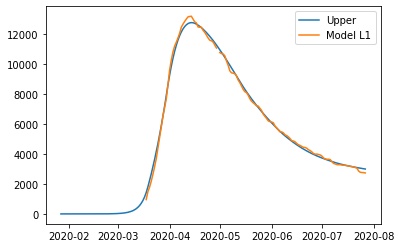

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367835040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.337457621290595, 'other': 0.45257879946482693, 'school': 0.29075407464191255, 'transport': 0.28519024427205564, 'work': 0.5544687494053104}
{'home': 1.0, 'leisure': 0.36169426164701457, 'other': 0.4900899467712476, 'school': 0.35027602047458084, 'transport': 0.3134241222227696, 'work': 0.6902288897958975}
{'home': 1.0, 'leisure': 0.38144263527076394, 'other': 0.5206545853172201, 'school': 0.3987753837456439, 'transport': 0.3364295042566847, 'work': 0.800848263447487}
{'home': 1.0, 'leisure': 0.39311212877570667, 'other': 0.5387155080943856, 'school': 0.42743409840581753, 'transport': 0.35002359364036184, 'work': 0.8662142569688809}
{'home': 1.0, 'leisure': 0.3993957022014451, 'other': 0.5484406203590132, '

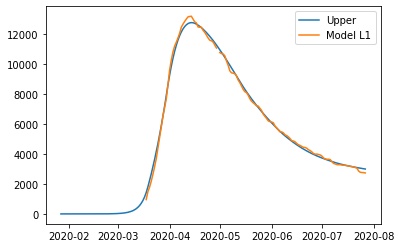

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233293728958, 'other': 0.41367835316936225, 'school': 0.22902761668126942, 'transport': 0.25591066921767014, 'work': 0.41368046566692374}
{'home': 1.0, 'leisure': 0.33745762262551504, 'other': 0.45257880153088814, 'school': 0.29075407792029756, 'transport': 0.28519024582713787, 'work': 0.5544687568827878}
{'home': 1.0, 'leisure': 0.36169426254768355, 'other': 0.49008994816521667, 'school': 0.3502760226865032, 'transport': 0.31342412327198177, 'work': 0.6902288948409425}
{'home': 1.0, 'leisure': 0.38144263581759863, 'other': 0.5206545861635584, 'school': 0.3987753850885968, 'transport': 0.3364295048937064, 'work': 0.8008482665105501}
{'home': 1.0, 'leisure': 0.3931121291134575, 'other': 0.538715508617124, 'school': 0.42743409923528836, 'transport': 0.35002359403381633, 'work': 0.8662142588607726}
{'home': 1.0, 'leisure': 0.3993957024266124, 'other': 0.5484406207075054

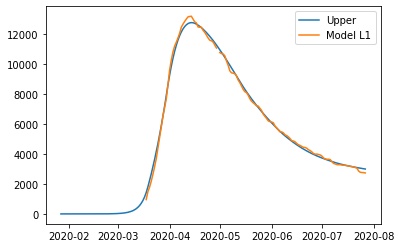

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367836040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.3374576208402605, 'other': 0.4525788087678424, 'school': 0.29075407353595134, 'transport': 0.2851902437474495, 'work': 0.5544687468827878}
{'home': 1.0, 'leisure': 0.36169426076242905, 'other': 0.49008995540217093, 'school': 0.35027601830215704, 'transport': 0.31342412119229346, 'work': 0.6902288848409426}
{'home': 1.0, 'leisure': 0.38144263403234413, 'other': 0.5206545934005127, 'school': 0.39877538070425056, 'transport': 0.33642950281401807, 'work': 0.80084825651055}
{'home': 1.0, 'leisure': 0.393112127328203, 'other': 0.5387155158540783, 'school': 0.4274340948509422, 'transport': 0.350023591954128, 'work': 0.8662142488607727}
{'home': 1.0, 'leisure': 0.3993957006413578, 'other': 0.5484406279444598, 'sch

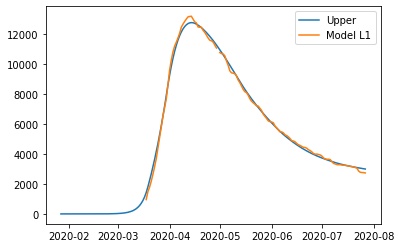

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332506960025, 'other': 0.41367835561986316, 'school': 0.22902760573104683, 'transport': 0.2559106660784979, 'work': 0.41368045075968973}
{'home': 1.0, 'leisure': 0.3374576187068128, 'other': 0.4525788051110919, 'school': 0.29075406775358736, 'transport': 0.2851902431820747, 'work': 0.5544687442676869}
{'home': 1.0, 'leisure': 0.36169425899983915, 'other': 0.49008995283477674, 'school': 0.35027601327532293, 'transport': 0.31342412110338086, 'work': 0.6902288844361127}
{'home': 1.0, 'leisure': 0.38144263257193467, 'other': 0.5206545917207421, 'school': 0.39877537629303345, 'transport': 0.3364295031133341, 'work': 0.800848257906682}
{'home': 1.0, 'leisure': 0.3931121260463548, 'other': 0.5387155146988126, 'school': 0.42743409080349865, 'transport': 0.35002359248285186, 'work': 0.8662142513211092}
{'home': 1.0, 'leisure': 0.3993956994556579, 'other': 0.5484406270716198,

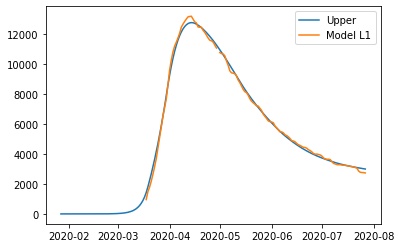

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332685485475, 'other': 0.4136783583829089, 'school': 0.22902761011539302, 'transport': 0.2559106681581862, 'work': 0.4136804607596897}
{'home': 1.0, 'leisure': 0.3374576200417328, 'other': 0.4525788071771531, 'school': 0.29075407103197237, 'transport': 0.28519024473715693, 'work': 0.5544687517451643}
{'home': 1.0, 'leisure': 0.3616942599005081, 'other': 0.49008995422874574, 'school': 0.3502760154872453, 'transport': 0.31342412215259297, 'work': 0.6902288894811577}
{'home': 1.0, 'leisure': 0.38144263311876936, 'other': 0.5206545925670805, 'school': 0.39877537763598625, 'transport': 0.3364295037503557, 'work': 0.8008482609697449}
{'home': 1.0, 'leisure': 0.39311212638410564, 'other': 0.538715515221551, 'school': 0.4274340916329695, 'transport': 0.35002359287630636, 'work': 0.866214253213001}
{'home': 1.0, 'leisure': 0.3993956996808251, 'other': 0.548440627420112, 'sch

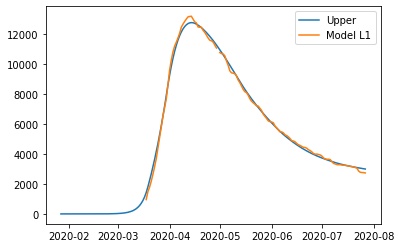

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332506960025, 'other': 0.41367836561986315, 'school': 0.22902760573104683, 'transport': 0.2559106660784979, 'work': 0.41368045075968973}
{'home': 1.0, 'leisure': 0.3374576182564783, 'other': 0.4525788144141074, 'school': 0.29075406664762615, 'transport': 0.2851902426574686, 'work': 0.5544687417451644}
{'home': 1.0, 'leisure': 0.3616942581152536, 'other': 0.4900899614657, 'school': 0.35027601110289913, 'transport': 0.31342412007290466, 'work': 0.6902288794811577}
{'home': 1.0, 'leisure': 0.38144263133351486, 'other': 0.5206545998040347, 'school': 0.3987753732516401, 'transport': 0.3364295016706674, 'work': 0.800848250969745}
{'home': 1.0, 'leisure': 0.39311212459885114, 'other': 0.5387155224585052, 'school': 0.4274340872486233, 'transport': 0.35002359079661804, 'work': 0.866214243213001}
{'home': 1.0, 'leisure': 0.3993956978955706, 'other': 0.5484406346570663, 'schoo

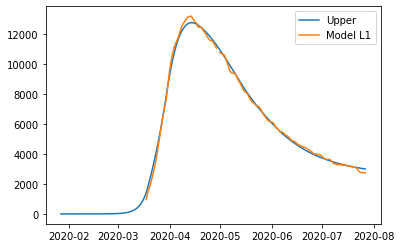

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792205269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571896168701, 'other': 0.452579741107469, 'school': 0.29075292390091845, 'transport': 0.28519006183376155, 'work': 0.5544678894329725}
{'home': 1.0, 'leisure': 0.36169381895894526, 'other': 0.4900909573815649, 'school': 0.3502748167736421, 'transport': 0.31342393437055116, 'work': 0.6902279903132501}
{'home': 1.0, 'leisure': 0.3814421836080436, 'other': 0.5206556521234208, 'school': 0.3987741368921577, 'transport': 0.33642931199312043, 'work': 0.8008473317712541}
{'home': 1.0, 'leisure': 0.3931116718097835, 'other': 0.5387166081072448, 'school': 0.4274328260530987, 'transport': 0.3500233987700932, 'work': 0.8662133062691655}
{'home': 1.0, 'leisure': 0.39939524237995117, 'other': 0.5484417382523807, 'sch

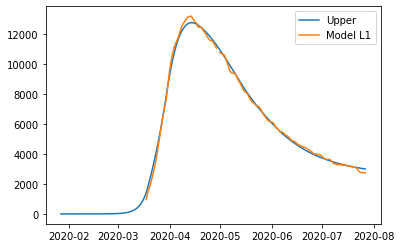

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792205269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571900672045, 'other': 0.45257974180445504, 'school': 0.290752925006879, 'transport': 0.2851900623583677, 'work': 0.5544678919554951}
{'home': 1.0, 'leisure': 0.3616938198435307, 'other': 0.4900909587506445, 'school': 0.3502748189460646, 'transport': 0.3134239354010274, 'work': 0.6902279952682051}
{'home': 1.0, 'leisure': 0.3814421848464632, 'other': 0.5206556540401323, 'school': 0.39877413993354915, 'transport': 0.3364293134357873, 'work': 0.800847338708191}
{'home': 1.0, 'leisure': 0.39311167325728696, 'other': 0.5387166103475568, 'school': 0.42743282960797185, 'transport': 0.3500234004563272, 'work': 0.8662133143772737}
{'home': 1.0, 'leisure': 0.3993952439400382, 'other': 0.5484417406669393, 'school

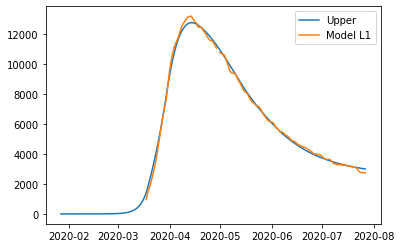

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229091214538, 'other': 0.41367922328997675, 'school': 0.22902652086169678, 'transport': 0.25591049239381647, 'work': 0.41367964666824025}
{'home': 1.0, 'leisure': 0.3374571914021243, 'other': 0.45257974387052063, 'school': 0.29075292828526206, 'transport': 0.2851900639134501, 'work': 0.5544678994329726}
{'home': 1.0, 'leisure': 0.36169382074419953, 'other': 0.4900909601446165, 'school': 0.3502748211579857, 'transport': 0.3134239364502397, 'work': 0.6902280003132502}
{'home': 1.0, 'leisure': 0.38144218539329783, 'other': 0.5206556548864724, 'school': 0.39877414127650124, 'transport': 0.33642931407280896, 'work': 0.800847341771254}
{'home': 1.0, 'leisure': 0.39311167359503774, 'other': 0.5387166108702963, 'school': 0.42743283043744223, 'transport': 0.35002340084978173, 'work': 0.8662133162691654}
{'home': 1.0, 'leisure': 0.39939524416520533, 'other': 0.5484417410154323

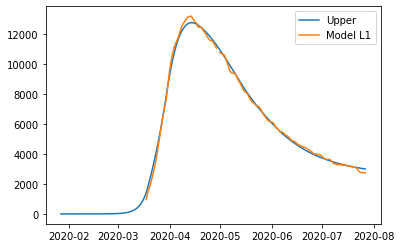

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792305269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571896168701, 'other': 0.452579751107469, 'school': 0.29075292390091845, 'transport': 0.28519006183376155, 'work': 0.5544678894329725}
{'home': 1.0, 'leisure': 0.36169381895894526, 'other': 0.4900909673815649, 'school': 0.3502748167736421, 'transport': 0.31342393437055116, 'work': 0.6902279903132501}
{'home': 1.0, 'leisure': 0.3814421836080436, 'other': 0.5206556621234208, 'school': 0.3987741368921577, 'transport': 0.33642931199312043, 'work': 0.8008473317712541}
{'home': 1.0, 'leisure': 0.3931116718097835, 'other': 0.5387166181072447, 'school': 0.4274328260530987, 'transport': 0.3500233987700932, 'work': 0.8662133062691655}
{'home': 1.0, 'leisure': 0.39939524237995117, 'other': 0.5484417482523807, 'sch

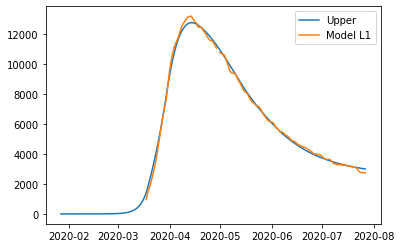

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232290833464105, 'other': 0.41367922491905285, 'school': 0.22902651881005698, 'transport': 0.25591049206275923, 'work': 0.4136796451348759}
{'home': 1.0, 'leisure': 0.3374571905947695, 'other': 0.4525797456348082, 'school': 0.29075292613286663, 'transport': 0.2851900635728635, 'work': 0.5544678978276183}
{'home': 1.0, 'leisure': 0.36169381991703614, 'other': 0.4900909620392865, 'school': 0.35027481890843304, 'transport': 0.31342393610046393, 'work': 0.690227998638477}
{'home': 1.0, 'leisure': 0.3814421845499942, 'other': 0.5206556568873799, 'school': 0.3987741389477835, 'transport': 0.33642931371554585, 'work': 0.8008473400399174}
{'home': 1.0, 'leisure': 0.3931116727421966, 'other': 0.5387166129339807, 'school': 0.4274328280619451, 'transport': 0.3500234004880942, 'work': 0.8662133145044049}
{'home': 1.0, 'leisure': 0.39939524330722875, 'other': 0.5484417431129195, 's

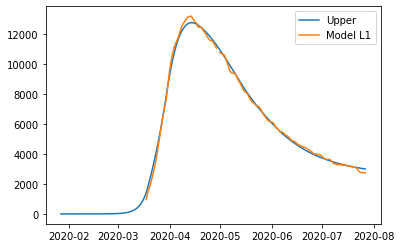

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229065493868, 'other': 0.4136792321560012, 'school': 0.22902651442571337, 'transport': 0.2559104899830707, 'work': 0.4136796351348759}
{'home': 1.0, 'leisure': 0.33745718880951525, 'other': 0.45257975287175656, 'school': 0.290752921748523, 'transport': 0.28519006149317494, 'work': 0.5544678878276182}
{'home': 1.0, 'leisure': 0.3616938181317819, 'other': 0.4900909692762349, 'school': 0.3502748145240895, 'transport': 0.3134239340207754, 'work': 0.690227988638477}
{'home': 1.0, 'leisure': 0.38144218276473996, 'other': 0.5206556641243284, 'school': 0.39877413456343996, 'transport': 0.3364293116358573, 'work': 0.8008473300399175}
{'home': 1.0, 'leisure': 0.39311167095694244, 'other': 0.538716620170929, 'school': 0.42743282367760155, 'transport': 0.3500233984084057, 'work': 0.8662133045044049}
{'home': 1.0, 'leisure': 0.39939524152197453, 'other': 0.5484417503498679, 'scho

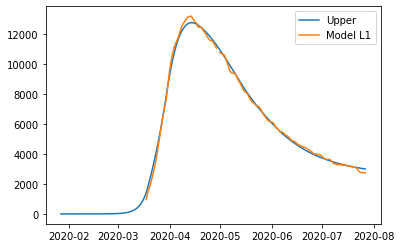

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229064223323, 'other': 0.41367923241906457, 'school': 0.22902651409441438, 'transport': 0.2559104899296116, 'work': 0.41367963488726806}
{'home': 1.0, 'leisure': 0.33745718867914354, 'other': 0.4525797531566539, 'school': 0.29075292140095405, 'transport': 0.285190061438177, 'work': 0.5544678875683855}
{'home': 1.0, 'leisure': 0.36169381799821154, 'other': 0.4900909695821864, 'school': 0.3502748141608315, 'transport': 0.31342393396429363, 'work': 0.6902279883680345}
{'home': 1.0, 'leisure': 0.3814421826285632, 'other': 0.5206556644474352, 'school': 0.3987741341873984, 'transport': 0.33642931157816647, 'work': 0.800847329760341}
{'home': 1.0, 'leisure': 0.3931116708192256, 'other': 0.538716620504173, 'school': 0.42743282329400606, 'transport': 0.3500233983500004, 'work': 0.8662133042194312}
{'home': 1.0, 'leisure': 0.3993952413834284, 'other': 0.5484417506885704, 'scho

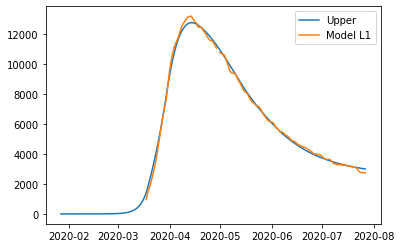

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229062953816, 'other': 0.4136792326819128, 'school': 0.2290265137633863, 'transport': 0.25591048987619613, 'work': 0.41367963463986274}
{'home': 1.0, 'leisure': 0.3374571885488784, 'other': 0.4525797534413182, 'school': 0.2907529210536692, 'transport': 0.285190061383224, 'work': 0.5544678873093647}
{'home': 1.0, 'leisure': 0.3616938178647503, 'other': 0.4900909698878877, 'school': 0.35027481379787057, 'transport': 0.313423933907858, 'work': 0.690227988097813}
{'home': 1.0, 'leisure': 0.38144218249249784, 'other': 0.5206556647702776, 'school': 0.3987741338116643, 'transport': 0.3364293115205228, 'work': 0.8008473294809932}
{'home': 1.0, 'leisure': 0.39311167068162134, 'other': 0.5387166208371443, 'school': 0.4274328229107242, 'transport': 0.35002339829164286, 'work': 0.8662133039346905}
{'home': 1.0, 'leisure': 0.39939524124499554, 'other': 0.5484417510269958, 'school

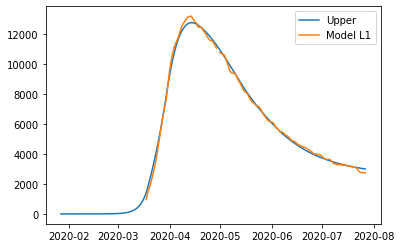

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232290615316743, 'other': 0.4136792329763636, 'school': 0.22902651339255836, 'transport': 0.2559104898163585, 'work': 0.41367963436271155}
{'home': 1.0, 'leisure': 0.33745718840295136, 'other': 0.45257975376020804, 'school': 0.29075292066462993, 'transport': 0.2851900613216639, 'work': 0.5544678870192016}
{'home': 1.0, 'leisure': 0.3616938177152429, 'other': 0.49009097023034376, 'school': 0.35027481339127037, 'transport': 0.31342393384463707, 'work': 0.6902279877951026}
{'home': 1.0, 'leisure': 0.3814421823400731, 'other': 0.5206556651319358, 'school': 0.39877413339075524, 'transport': 0.33642931145594845, 'work': 0.8008473291680591}
{'home': 1.0, 'leisure': 0.39311167052747276, 'other': 0.5387166212101493, 'school': 0.4274328224813599, 'transport': 0.3500233982262688, 'work': 0.8662133036157151}
{'home': 1.0, 'leisure': 0.39939524108991875, 'other': 0.5484417514061104

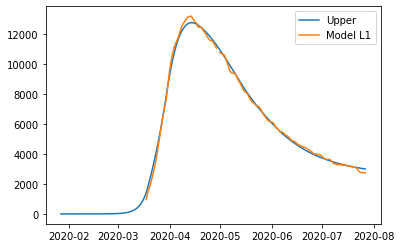

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229060113038, 'other': 0.4136792332700888, 'school': 0.22902651302264415, 'transport': 0.2559104897566683, 'work': 0.4136796340862433}
{'home': 1.0, 'leisure': 0.3374571882573839, 'other': 0.4525797540783122, 'school': 0.29075292027654936, 'transport': 0.2851900612602556, 'work': 0.5544678867297534}
{'home': 1.0, 'leisure': 0.36169381756610397, 'other': 0.49009097057195605, 'school': 0.35027481298567215, 'transport': 0.31342393378157185, 'work': 0.6902279874931381}
{'home': 1.0, 'leisure': 0.38144218218802406, 'other': 0.5206556654927029, 'school': 0.3987741329708834, 'transport': 0.3364293113915333, 'work': 0.800847328855896}
{'home': 1.0, 'leisure': 0.3931116703737041, 'other': 0.5387166215822352, 'school': 0.42743282205305366, 'transport': 0.350023398161056, 'work': 0.8662133032975258}
{'home': 1.0, 'leisure': 0.39939524093522405, 'other': 0.548441751784291, 'scho

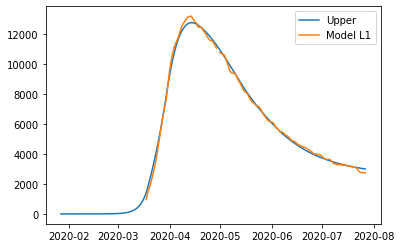

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.4136792942703611, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.3374571530703126, 'other': 0.4525798209715262, 'school': 0.2907528264683657, 'transport': 0.2851900464164156, 'work': 0.5544678167633469}
{'home': 1.0, 'leisure': 0.36169378151571474, 'other': 0.49009104314764973, 'school': 0.35027471494307094, 'transport': 0.3134239185372425, 'work': 0.6902279145012387}
{'home': 1.0, 'leisure': 0.3814421454341905, 'other': 0.5206557426985651, 'school': 0.39877403147801593, 'transport': 0.3364292958208793, 'work': 0.80084725339878}
{'home': 1.0, 'leisure': 0.39311163320419895, 'other': 0.538716701524106, 'school': 0.4274327185213926, 'transport': 0.35002338239757375, 'work': 0.8662132263836909}
{'home': 1.0, 'leisure': 0.39939520354189584, 'other': 0.5484418331993973, 'sch

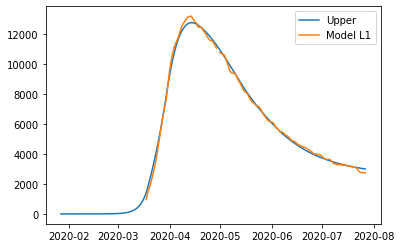

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.4136792942703611, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.337457153520647, 'other': 0.4525798216685123, 'school': 0.2907528275743262, 'transport': 0.28519004694102174, 'work': 0.5544678192858694}
{'home': 1.0, 'leisure': 0.36169378240030015, 'other': 0.4900910445167296, 'school': 0.35027471711549335, 'transport': 0.31342391956771887, 'work': 0.6902279194561936}
{'home': 1.0, 'leisure': 0.3814421466726101, 'other': 0.520655744615277, 'school': 0.39877403451940735, 'transport': 0.33642929726354615, 'work': 0.8008472603357171}
{'home': 1.0, 'leisure': 0.3931116346517024, 'other': 0.5387167037644186, 'school': 0.4274327220762656, 'transport': 0.35002338408380773, 'work': 0.8662132344917991}
{'home': 1.0, 'leisure': 0.3993952051019829, 'other': 0.5484418356139564, 'sc

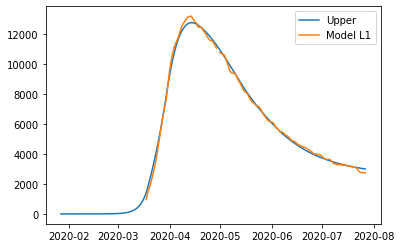

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228735047794, 'other': 0.4136792970334132, 'school': 0.2290264279900518, 'transport': 0.2559104774078392, 'work': 0.413679577257385}
{'home': 1.0, 'leisure': 0.33745715485556677, 'other': 0.4525798237345783, 'school': 0.2907528308527091, 'transport': 0.28519004849610413, 'work': 0.5544678267633468}
{'home': 1.0, 'leisure': 0.3616937833009689, 'other': 0.49009104591070174, 'school': 0.35027471932741433, 'transport': 0.3134239206169311, 'work': 0.6902279245012386}
{'home': 1.0, 'leisure': 0.38144214721944475, 'other': 0.5206557454616172, 'school': 0.3987740358623593, 'transport': 0.33642929790056786, 'work': 0.8008472633987801}
{'home': 1.0, 'leisure': 0.39311163498945323, 'other': 0.5387167042871581, 'school': 0.427432722905736, 'transport': 0.35002338447726233, 'work': 0.866213236383691}
{'home': 1.0, 'leisure': 0.39939520532715006, 'other': 0.5484418359624494, 'scho

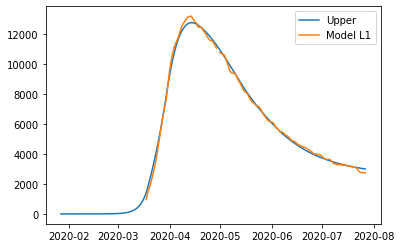

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.41367930427036115, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.3374571530703126, 'other': 0.4525798309715262, 'school': 0.2907528264683657, 'transport': 0.2851900464164156, 'work': 0.5544678167633469}
{'home': 1.0, 'leisure': 0.36169378151571474, 'other': 0.49009105314764967, 'school': 0.35027471494307094, 'transport': 0.3134239185372425, 'work': 0.6902279145012387}
{'home': 1.0, 'leisure': 0.3814421454341905, 'other': 0.5206557526985651, 'school': 0.39877403147801593, 'transport': 0.3364292958208793, 'work': 0.80084725339878}
{'home': 1.0, 'leisure': 0.39311163320419895, 'other': 0.538716711524106, 'school': 0.4274327185213926, 'transport': 0.35002338239757375, 'work': 0.8662132263836909}
{'home': 1.0, 'leisure': 0.39939520354189584, 'other': 0.5484418431993974, 'sc

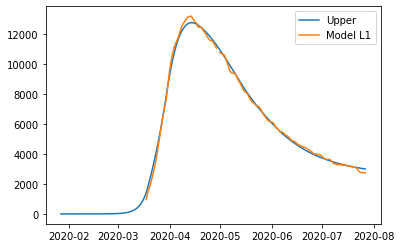

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679394533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710338106416, 'other': 0.4525799295558871, 'school': 0.29075269399760767, 'transport': 0.2851900254547599, 'work': 0.5544677179606314}
{'home': 1.0, 'leisure': 0.3616937306073362, 'other': 0.49009115975649553, 'school': 0.3502745764927012, 'transport': 0.31342389701003776, 'work': 0.6902278114260882}
{'home': 1.0, 'leisure': 0.38144209353244674, 'other': 0.5206558658458802, 'school': 0.39877388815537, 'transport': 0.3364292738328567, 'work': 0.8008471468423863}
{'home': 1.0, 'leisure': 0.3931115807154666, 'other': 0.5387168285350621, 'school': 0.42743257231967435, 'transport': 0.3500233601372498, 'work': 0.8662131177701989}
{'home': 1.0, 'leisure': 0.39939515073709264, 'other': 0.5484419622907754, 'sch

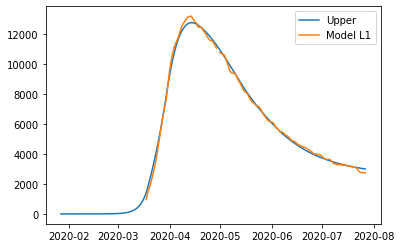

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679394533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710383139854, 'other': 0.45257993025287346, 'school': 0.29075269510356805, 'transport': 0.285190025979366, 'work': 0.554467720483154}
{'home': 1.0, 'leisure': 0.3616937314919216, 'other': 0.4900911611255758, 'school': 0.3502745786651235, 'transport': 0.31342389804051407, 'work': 0.6902278163810432}
{'home': 1.0, 'leisure': 0.38144209477086627, 'other': 0.5206558677625925, 'school': 0.3987738911967612, 'transport': 0.3364292752755236, 'work': 0.8008471537793234}
{'home': 1.0, 'leisure': 0.39311158216296993, 'other': 0.5387168307753751, 'school': 0.4274325758745471, 'transport': 0.35002336182348376, 'work': 0.866213125878307}
{'home': 1.0, 'leisure': 0.3993951522971796, 'other': 0.548441964705335, 'schoo

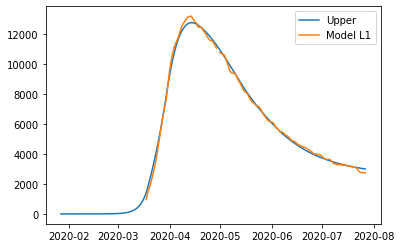

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312322825079814, 'other': 0.4136793972960867, 'school': 0.22902630172037225, 'transport': 0.25591045703267884, 'work': 0.4136794828853429}
{'home': 1.0, 'leisure': 0.3374571051663183, 'other': 0.4525799323189399, 'school': 0.2907526983819507, 'transport': 0.28519002753444844, 'work': 0.5544677279606314}
{'home': 1.0, 'leisure': 0.36169373239259034, 'other': 0.4900911625195483, 'school': 0.3502745808770443, 'transport': 0.31342389908972634, 'work': 0.6902278214260882}
{'home': 1.0, 'leisure': 0.3814420953177009, 'other': 0.520655868608933, 'school': 0.3987738925397131, 'transport': 0.33642927591254534, 'work': 0.8008471568423864}
{'home': 1.0, 'leisure': 0.39311158250072076, 'other': 0.5387168312981149, 'school': 0.42743257670401746, 'transport': 0.3500233622169384, 'work': 0.866213127770199}
{'home': 1.0, 'leisure': 0.3993951525223468, 'other': 0.5484419650538281, 'schoo

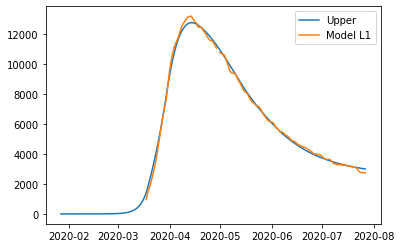

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679404533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710338106416, 'other': 0.45257993955588716, 'school': 0.29075269399760767, 'transport': 0.2851900254547599, 'work': 0.5544677179606314}
{'home': 1.0, 'leisure': 0.3616937306073362, 'other': 0.4900911697564956, 'school': 0.3502745764927012, 'transport': 0.31342389701003776, 'work': 0.6902278114260882}
{'home': 1.0, 'leisure': 0.38144209353244674, 'other': 0.5206558758458801, 'school': 0.39877388815537, 'transport': 0.3364292738328567, 'work': 0.8008471468423863}
{'home': 1.0, 'leisure': 0.3931115807154666, 'other': 0.538716838535062, 'school': 0.42743257231967435, 'transport': 0.3500233601372498, 'work': 0.8662131177701989}
{'home': 1.0, 'leisure': 0.39939515073709264, 'other': 0.5484419722907753, 'scho

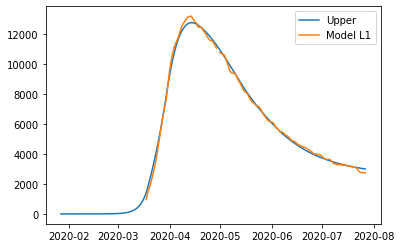

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.41367941565327815, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570929140668, 'other': 0.4525799524290877, 'school': 0.2907526660927571, 'transport': 0.28519002103920504, 'work': 0.5544676971479243}
{'home': 1.0, 'leisure': 0.3616937198835301, 'other': 0.49009118432004695, 'school': 0.3502745473282506, 'transport': 0.3134238924753505, 'work': 0.6902277897133964}
{'home': 1.0, 'leisure': 0.3814420825993891, 'other': 0.5206558917867544, 'school': 0.3987738579645787, 'transport': 0.3364292692010986, 'work': 0.8008471243963737}
{'home': 1.0, 'leisure': 0.39311156965876026, 'other': 0.5387168552898088, 'school': 0.4274325415224089, 'transport': 0.35002335544813157, 'work': 0.8662130948908602}
{'home': 1.0, 'leisure': 0.39939513961380635, 'other': 0.5484419894837612, 's

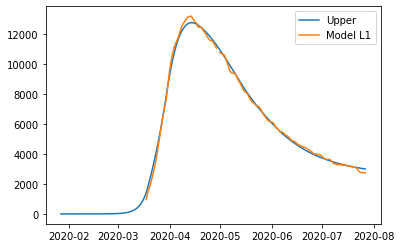

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.41367941565327815, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570933644012, 'other': 0.452579953126074, 'school': 0.29075266719871756, 'transport': 0.28519002156381124, 'work': 0.554467699670447}
{'home': 1.0, 'leisure': 0.3616937207681155, 'other': 0.4900911856891272, 'school': 0.3502745495006728, 'transport': 0.3134238935058268, 'work': 0.6902277946683514}
{'home': 1.0, 'leisure': 0.38144208383780864, 'other': 0.5206558937034668, 'school': 0.39877386100596973, 'transport': 0.3364292706437655, 'work': 0.8008471313333105}
{'home': 1.0, 'leisure': 0.3931115711062637, 'other': 0.538716857530122, 'school': 0.4274325450772816, 'transport': 0.3500233571343656, 'work': 0.8662131029989684}
{'home': 1.0, 'leisure': 0.3993951411738933, 'other': 0.548441991898321, 'school

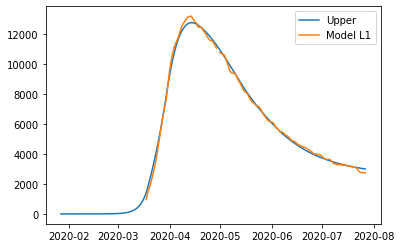

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228148791368, 'other': 0.4136794184163311, 'school': 0.22902627512177354, 'transport': 0.25591045274066876, 'work': 0.4136794630059534}
{'home': 1.0, 'leisure': 0.33745709469932095, 'other': 0.45257995519214067, 'school': 0.29075267047710013, 'transport': 0.28519002311889363, 'work': 0.5544677071479244}
{'home': 1.0, 'leisure': 0.3616937216687843, 'other': 0.49009118708309984, 'school': 0.35027455171259364, 'transport': 0.31342389455503905, 'work': 0.6902277997133964}
{'home': 1.0, 'leisure': 0.3814420843846432, 'other': 0.5206558945498073, 'school': 0.3987738623489217, 'transport': 0.3364292712807872, 'work': 0.8008471343963737}
{'home': 1.0, 'leisure': 0.39311157144401443, 'other': 0.5387168580528617, 'school': 0.42743254590675184, 'transport': 0.3500233575278202, 'work': 0.8662131048908601}
{'home': 1.0, 'leisure': 0.3993951413990605, 'other': 0.5484419922468141, 

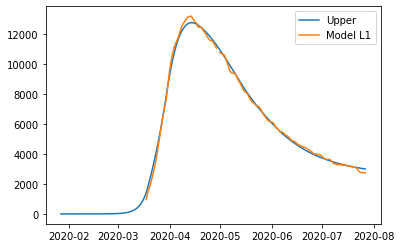

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.4136794256532782, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570929140668, 'other': 0.4525799624290877, 'school': 0.2907526660927571, 'transport': 0.28519002103920504, 'work': 0.5544676971479243}
{'home': 1.0, 'leisure': 0.3616937198835301, 'other': 0.4900911943200469, 'school': 0.3502745473282506, 'transport': 0.3134238924753505, 'work': 0.6902277897133964}
{'home': 1.0, 'leisure': 0.3814420825993891, 'other': 0.5206559017867545, 'school': 0.3987738579645787, 'transport': 0.3364292692010986, 'work': 0.8008471243963737}
{'home': 1.0, 'leisure': 0.39311156965876026, 'other': 0.5387168652898089, 'school': 0.4274325415224089, 'transport': 0.35002335544813157, 'work': 0.8662130948908602}
{'home': 1.0, 'leisure': 0.39939513961380635, 'other': 0.5484419994837613, 'sch

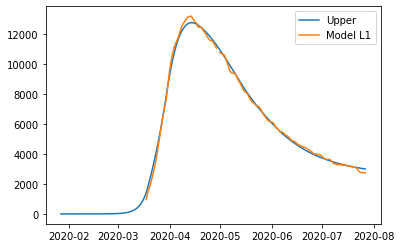

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228130434187, 'other': 0.41367942575776256, 'school': 0.22902627060584407, 'transport': 0.2559104506397471, 'work': 0.41367945290760766}
{'home': 1.0, 'leisure': 0.3374570928622853, 'other': 0.4525799625422442, 'school': 0.2907526659547085, 'transport': 0.2851900210173608, 'work': 0.5544676970449615}
{'home': 1.0, 'leisure': 0.36169371983047816, 'other': 0.4900911944415658, 'school': 0.3502745471839706, 'transport': 0.31342389245291685, 'work': 0.6902277896059812}
{'home': 1.0, 'leisure': 0.381442082545302, 'other': 0.520655901915087, 'school': 0.39877385781522123, 'transport': 0.3364292691781848, 'work': 0.8008471242853306}
{'home': 1.0, 'leisure': 0.39311156960406146, 'other': 0.5387168654221678, 'school': 0.42743254137005116, 'transport': 0.350023355424934, 'work': 0.8662130947776734}
{'home': 1.0, 'leisure': 0.39939513955877814, 'other': 0.5484419996182882, 'scho

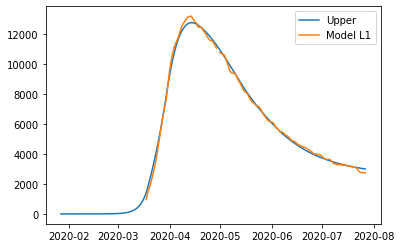

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228052880514, 'other': 0.4136794318150541, 'school': 0.2290262503834709, 'transport': 0.25591044737661917, 'work': 0.4136794377937123}
{'home': 1.0, 'leisure': 0.33745708490444026, 'other': 0.4525799699322728, 'school': 0.2907526447392186, 'transport': 0.2851900176603043, 'work': 0.5544676812214837}
{'home': 1.0, 'leisure': 0.3616937116773866, 'other': 0.4900912031167336, 'school': 0.35027452501083245, 'transport': 0.3134238890052864, 'work': 0.6902277730982633}
{'home': 1.0, 'leisure': 0.3814420742331207, 'other': 0.5206559116374054, 'school': 0.3987738348617771, 'transport': 0.3364292656567533, 'work': 0.8008471072200838}
{'home': 1.0, 'leisure': 0.3931115611978727, 'other': 0.538716875763257, 'school': 0.4274325179555171, 'transport': 0.35002335185989286, 'work': 0.8662130773829777}
{'home': 1.0, 'leisure': 0.3993951311019699, 'other': 0.5484420102925617, 'school'

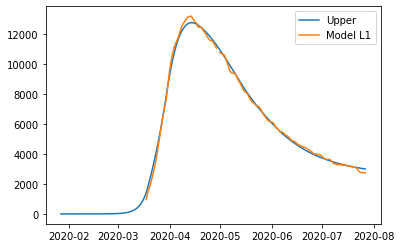

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228052880514, 'other': 0.4136794318150541, 'school': 0.2290262503834709, 'transport': 0.25591044737661917, 'work': 0.4136794377937123}
{'home': 1.0, 'leisure': 0.33745708535477464, 'other': 0.45257997062925914, 'school': 0.290752645845179, 'transport': 0.28519001818491047, 'work': 0.5544676837440063}
{'home': 1.0, 'leisure': 0.361693712561972, 'other': 0.490091204485814, 'school': 0.3502745271832547, 'transport': 0.31342389003576276, 'work': 0.6902277780532183}
{'home': 1.0, 'leisure': 0.3814420754715403, 'other': 0.5206559135541179, 'school': 0.3987738379031682, 'transport': 0.33642926709942017, 'work': 0.8008471141570208}
{'home': 1.0, 'leisure': 0.39311156264537606, 'other': 0.5387168780035703, 'school': 0.4274325215103898, 'transport': 0.3500233535461268, 'work': 0.8662130854910858}
{'home': 1.0, 'leisure': 0.39939513266205684, 'other': 0.5484420127071215, 'schoo

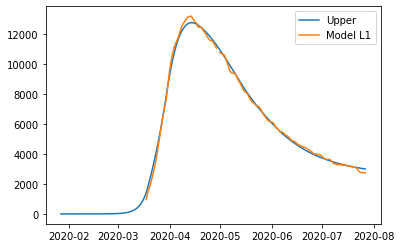

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228070733055, 'other': 0.41367943457810713, 'school': 0.22902625476781385, 'transport': 0.25591044945630775, 'work': 0.4136794477937123}
{'home': 1.0, 'leisure': 0.3374570866896944, 'other': 0.4525799726953258, 'school': 0.2907526491235616, 'transport': 0.2851900197399929, 'work': 0.5544676912214838}
{'home': 1.0, 'leisure': 0.3616937134626408, 'other': 0.49009120587978666, 'school': 0.35027452939517545, 'transport': 0.313423891084975, 'work': 0.6902277830982634}
{'home': 1.0, 'leisure': 0.3814420760183749, 'other': 0.5206559144004584, 'school': 0.3987738392461201, 'transport': 0.3364292677364419, 'work': 0.8008471172200838}
{'home': 1.0, 'leisure': 0.3931115629831269, 'other': 0.53871687852631, 'school': 0.42743252233986007, 'transport': 0.3500233539395814, 'work': 0.8662130873829776}
{'home': 1.0, 'leisure': 0.39939513288722406, 'other': 0.5484420130556147, 'school

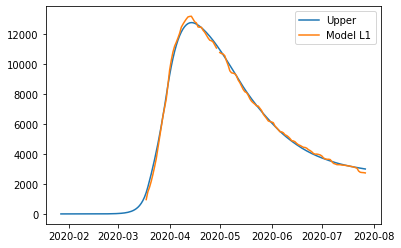

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.41369957279186087, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883100182, 'other': 0.4526133588757284, 'school': 0.29077591238612244, 'transport': 0.2852019630029301, 'work': 0.5545230266393593}
{'home': 1.0, 'leisure': 0.36171378572639257, 'other': 0.490137366885172, 'school': 0.3503118535919108, 'transport': 0.3134425238990953, 'work': 0.690313131761765}
{'home': 1.0, 'leisure': 0.38146893402048876, 'other': 0.5207124845224965, 'school': 0.398822620500331, 'transport': 0.33645335129597076, 'work': 0.8009569211207624}
{'home': 1.0, 'leisure': 0.39314243073972743, 'other': 0.5387795994900064, 'school': 0.4274880736734884, 'transport': 0.3500506583941244, 'work': 0.8663373421056245}
{'home': 1.0, 'leisure': 0.39942815974239443, 'other': 0.5485080460109732, 'school'

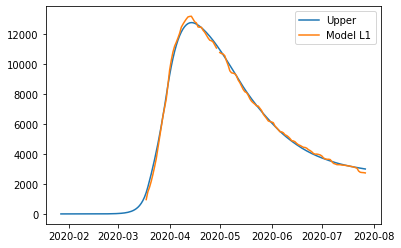

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.41369957279186087, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883145220957, 'other': 0.452613359572798, 'school': 0.2907759134920996, 'transport': 0.28520196352754457, 'work': 0.5545230291618818}
{'home': 1.0, 'leisure': 0.36171378661108633, 'other': 0.4901373682544159, 'school': 0.3503118557643659, 'transport': 0.313442524929588, 'work': 0.69031313671672}
{'home': 1.0, 'leisure': 0.38146893525906, 'other': 0.5207124864394379, 'school': 0.3988226235417682, 'transport': 0.3364533527386605, 'work': 0.8009569280576994}
{'home': 1.0, 'leisure': 0.39314243218740813, 'other': 0.5387796017305873, 'school': 0.4274880772284149, 'transport': 0.3500506600803851, 'work': 0.8663373502137326}
{'home': 1.0, 'leisure': 0.39942816130267245, 'other': 0.5485080484258216, 'school': 

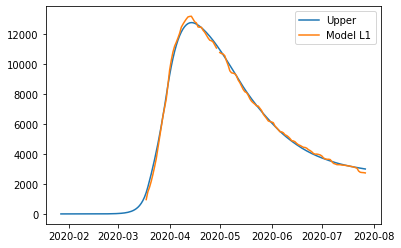

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325916776625, 'other': 0.413699575555244, 'school': 0.22903494070526978, 'transport': 0.2559154574866285, 'work': 0.4137036683642717}
{'home': 1.0, 'leisure': 0.3374688327872929, 'other': 0.4526133616391115, 'school': 0.29077591677053183, 'transport': 0.28520196508265167, 'work': 0.5545230366393592}
{'home': 1.0, 'leisure': 0.36171378751186545, 'other': 0.49013736964855514, 'school': 0.3503118579763202, 'transport': 0.31344252597881694, 'work': 0.6903131417617651}
{'home': 1.0, 'leisure': 0.38146893580596164, 'other': 0.5207124872858796, 'school': 0.39882262488474046, 'transport': 0.3364533533756924, 'work': 0.8009569311207625}
{'home': 1.0, 'leisure': 0.3931424325252003, 'other': 0.5387796022533895, 'school': 0.42748807805789785, 'transport': 0.350050660473846, 'work': 0.8663373521056246}
{'home': 1.0, 'leisure': 0.39942816152786725, 'other': 0.5485080487743563, 'sch

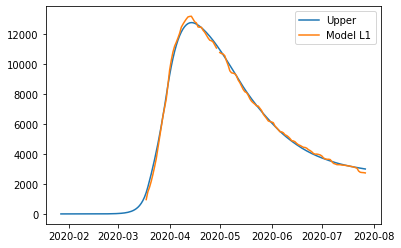

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.4136995827918609, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883100182, 'other': 0.4526133688757284, 'school': 0.29077591238612244, 'transport': 0.2852019630029301, 'work': 0.5545230266393593}
{'home': 1.0, 'leisure': 0.36171378572639257, 'other': 0.490137376885172, 'school': 0.3503118535919108, 'transport': 0.3134425238990953, 'work': 0.690313131761765}
{'home': 1.0, 'leisure': 0.38146893402048876, 'other': 0.5207124945224965, 'school': 0.398822620500331, 'transport': 0.33645335129597076, 'work': 0.8009569211207624}
{'home': 1.0, 'leisure': 0.39314243073972743, 'other': 0.5387796094900064, 'school': 0.4274880736734884, 'transport': 0.3500506583941244, 'work': 0.8663373421056245}
{'home': 1.0, 'leisure': 0.39942815974239443, 'other': 0.5485080560109733, 'school':

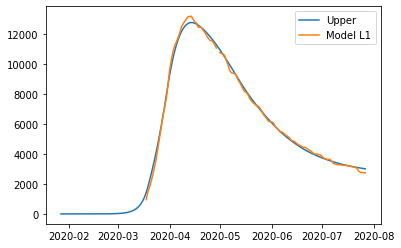

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

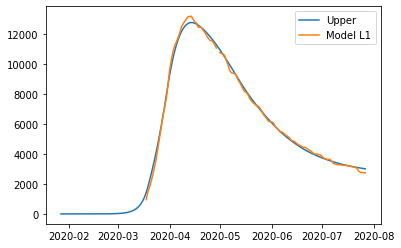

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

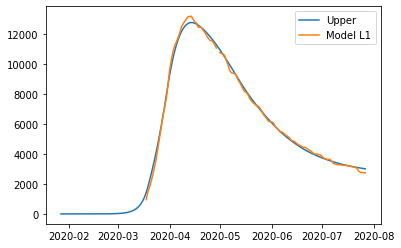

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

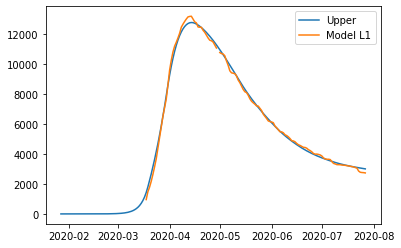

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

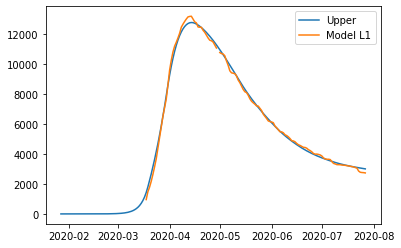

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

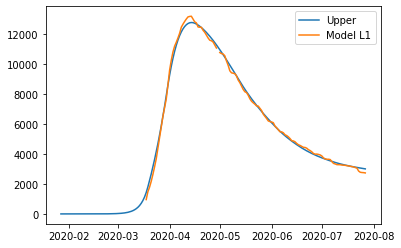

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

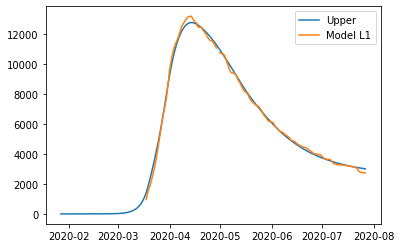

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

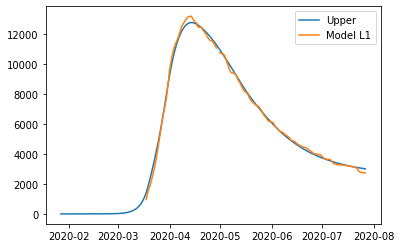

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

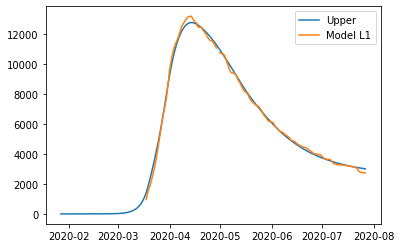

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

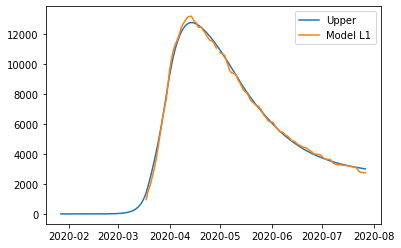

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

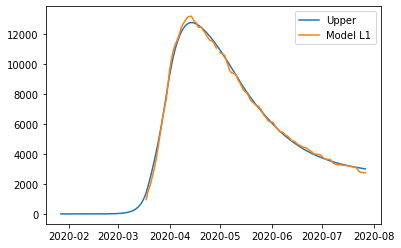

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

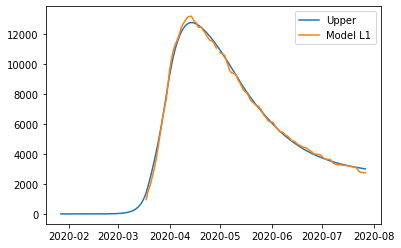

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

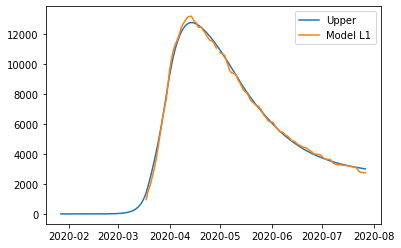

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

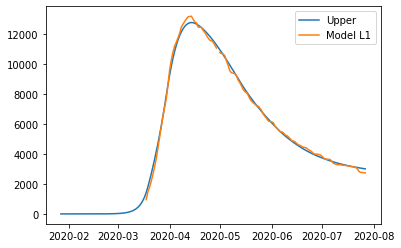

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

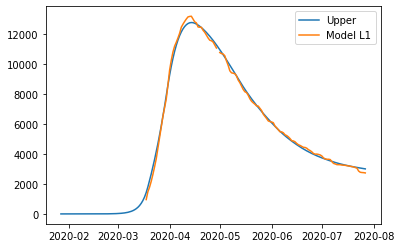

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

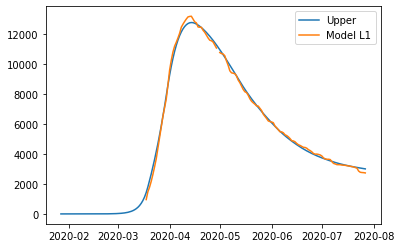

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

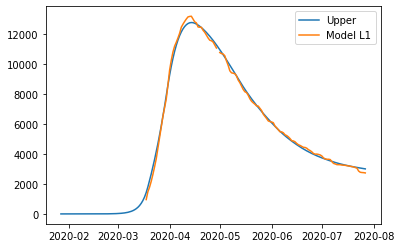

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250793084804, 'other': 0.41380658887566235, 'school': 0.2290469424978564, 'transport': 0.25593216168623856, 'work': 0.41380708164674884}
{'home': 1.0, 'leisure': 0.3375139549759271, 'other': 0.45279318437081684, 'school': 0.2908638947452249, 'transport': 0.28525535157335474, 'work': 0.5547927181833296}
{'home': 1.0, 'leisure': 0.361803227940965, 'other': 0.49038740145543014, 'school': 0.3504730986980445, 'transport': 0.3135312846787882, 'work': 0.6907431534150326}
{'home': 1.0, 'leisure': 0.38159448739395874, 'other': 0.5210197264873373, 'school': 0.3990435611781197, 'transport': 0.33657093387580805, 'work': 0.8015175821223459}
{'home': 1.0, 'leisure': 0.3932893225252733, 'other': 0.5391206458243734, 'school': 0.4277442890072551, 'transport': 0.35018527203768346, 'work': 0.8669751990857585}
{'home': 1.0, 'leisure': 0.399586541442135, 'other': 0.5488672946981619, 'sch

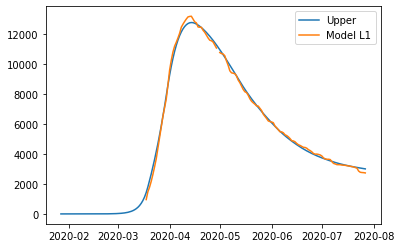

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250757059716, 'other': 0.41380658880893595, 'school': 0.22904693577476853, 'transport': 0.2559321596106699, 'work': 0.4138070767527574}
{'home': 1.0, 'leisure': 0.33751395145025587, 'other': 0.4527931848632401, 'school': 0.29086388782822487, 'transport': 0.2852553495079737, 'work': 0.5547927137382248}
{'home': 1.0, 'leisure': 0.3618032244893871, 'other': 0.49038740248703344, 'school': 0.35047309159405776, 'transport': 0.313531282623231, 'work': 0.6907431494027827}
{'home': 1.0, 'leisure': 0.3815944840027533, 'other': 0.5210197279582724, 'school': 0.39904355392177343, 'transport': 0.33657093182825537, 'work': 0.8015175784627928}
{'home': 1.0, 'leisure': 0.3932893191697424, 'other': 0.5391206475549137, 'school': 0.42774428166087813, 'transport': 0.35018526999486077, 'work': 0.866975195634617}
{'home': 1.0, 'leisure': 0.39958653810581346, 'other': 0.5488672965684898, 's

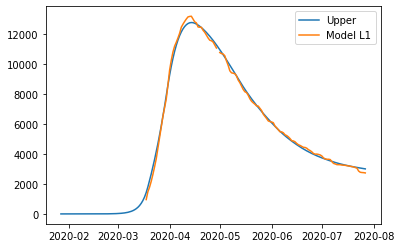

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325072844343, 'other': 0.41380658875593224, 'school': 0.22904693043432914, 'transport': 0.25593215796195595, 'work': 0.41380707286524837}
{'home': 1.0, 'leisure': 0.3375139486496627, 'other': 0.45279318525439316, 'school': 0.29086388233375265, 'transport': 0.2852553478673523, 'work': 0.5547927102072859}
{'home': 1.0, 'leisure': 0.3618032217476495, 'other': 0.49038740330648056, 'school': 0.35047308595105386, 'transport': 0.31353128099041305, 'work': 0.6907431462156792}
{'home': 1.0, 'leisure': 0.3815944813089721, 'other': 0.5210197291266999, 'school': 0.3990435481577438, 'transport': 0.33657093020179585, 'work': 0.8015175755558517}
{'home': 1.0, 'leisure': 0.3932893165042991, 'other': 0.5391206489295568, 'school': 0.4277442758253332, 'transport': 0.3501852683721584, 'work': 0.8669751928932261}
{'home': 1.0, 'leisure': 0.399586535455629, 'other': 0.548867298054172, 'sch

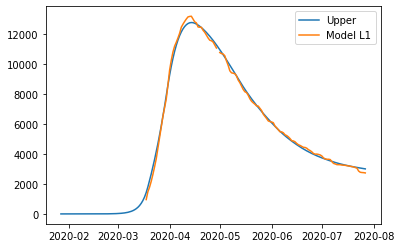

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232506999869103, 'other': 0.4138065887032244, 'school': 0.22904692512370547, 'transport': 0.2559321563224468, 'work': 0.4138070689994433}
{'home': 1.0, 'leisure': 0.3375139458647053, 'other': 0.45279318564336246, 'school': 0.2908638768699561, 'transport': 0.28525534623589044, 'work': 0.5547927066960602}
{'home': 1.0, 'leisure': 0.36180321902121915, 'other': 0.4903874041213526, 'school': 0.3504730803395549, 'transport': 0.3135312793667111, 'work': 0.6907431430463693}
{'home': 1.0, 'leisure': 0.3815944786302304, 'other': 0.5210197302886039, 'school': 0.3990435424258946, 'transport': 0.3365709285844168, 'work': 0.8015175726651397}
{'home': 1.0, 'leisure': 0.393289313853737, 'other': 0.5391206502965251, 'school': 0.4277442700223681, 'transport': 0.3501852667585156, 'work': 0.8669751901671403}
{'home': 1.0, 'leisure': 0.3995865328202406, 'other': 0.5488672995315597, 'school

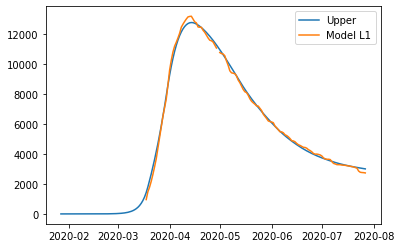

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232506748655425, 'other': 0.41380659020016786, 'school': 0.22904692187536874, 'transport': 0.2559321536160766, 'work': 0.41380706572482495}
{'home': 1.0, 'leisure': 0.3375139434960529, 'other': 0.4527931881909472, 'school': 0.29086387351850246, 'transport': 0.28525534348060616, 'work': 0.5547927043019384}
{'home': 1.0, 'leisure': 0.36180321679092653, 'other': 0.4903874076820558, 'school': 0.350473076888667, 'transport': 0.31353127656425966, 'work': 0.6907431415012977}
{'home': 1.0, 'leisure': 0.3815944765126754, 'other': 0.521019734674811, 'school': 0.3990435388939864, 'transport': 0.3365709257435329, 'work': 0.8015175718118869}
{'home': 1.0, 'leisure': 0.3932893118027998, 'other': 0.53912065517053, 'school': 0.4277442664425842, 'transport': 0.35018526389492166, 'work': 0.8669751897226895}
{'home': 1.0, 'leisure': 0.3995865308051745, 'other': 0.5488673046682249, 'schoo

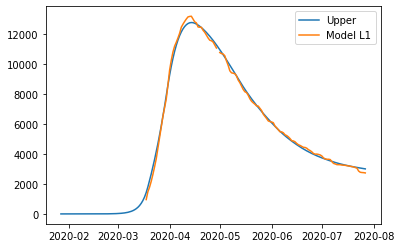

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250650014234, 'other': 0.41380659168101896, 'school': 0.2290469186619521, 'transport': 0.2559321509388002, 'work': 0.4138070624854092}
{'home': 1.0, 'leisure': 0.3375139411528638, 'other': 0.45279319071114504, 'school': 0.2908638702030773, 'transport': 0.2852553407549415, 'work': 0.5547927019335537}
{'home': 1.0, 'leisure': 0.3618032145846099, 'other': 0.4903874112044809, 'school': 0.3504730734748766, 'transport': 0.313531273791935, 'work': 0.6907431399728359}
{'home': 1.0, 'leisure': 0.3815944744178845, 'other': 0.5210197390138657, 'school': 0.3990435354000465, 'transport': 0.3365709229331889, 'work': 0.8015175709678066}
{'home': 1.0, 'leisure': 0.3932893097739104, 'other': 0.5391206599921385, 'school': 0.4277442629012832, 'transport': 0.3501852610621117, 'work': 0.8669751892830165}
{'home': 1.0, 'leisure': 0.39958652881177054, 'other': 0.54886730974967, 'school': 0

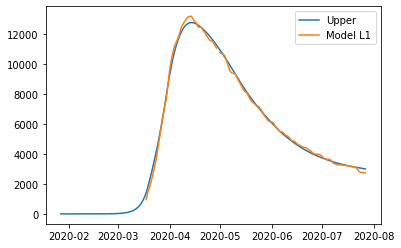

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

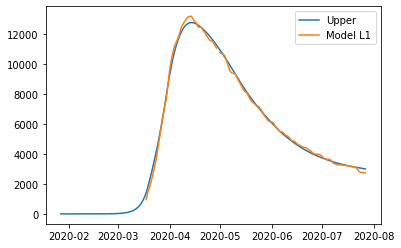

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

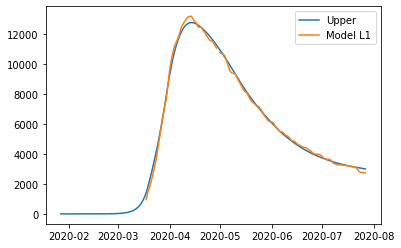

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

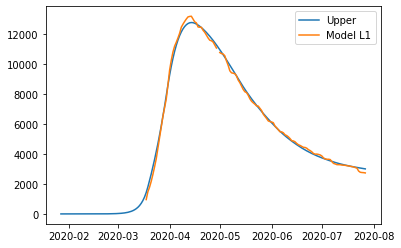

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

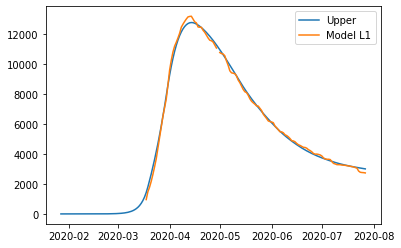

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

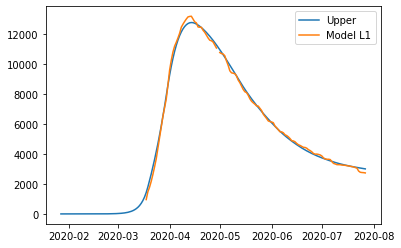

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

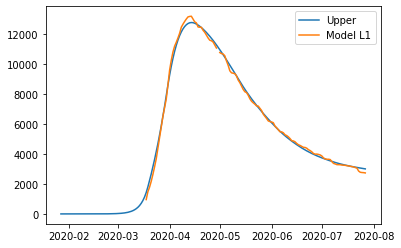

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

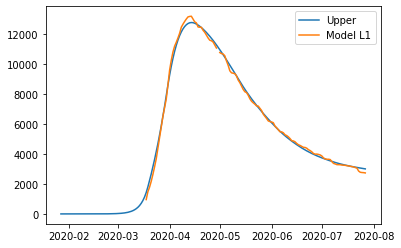

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

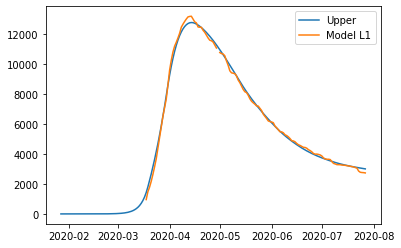

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

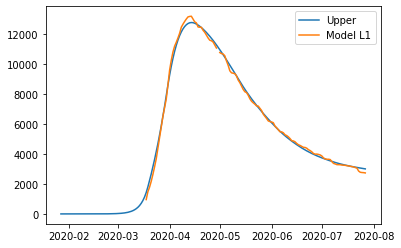

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123248569100167, 'other': 0.41380671567934313, 'school': 0.22904664958791873, 'transport': 0.255931926758208, 'work': 0.41380679123427255}
{'home': 1.0, 'leisure': 0.33751374494689557, 'other': 0.4527934017387757, 'school': 0.2908635925873891, 'transport': 0.2852551125225713, 'work': 0.554792503617845}
{'home': 1.0, 'leisure': 0.3618030298396002, 'other': 0.49038770615322846, 'school': 0.3504727876225926, 'transport': 0.313531041652493, 'work': 0.6907430119877185}
{'home': 1.0, 'leisure': 0.3815942990114336, 'other': 0.5210201023427826, 'school': 0.3990432428364622, 'transport': 0.33657068761020703, 'work': 0.8015175002890969}
{'home': 1.0, 'leisure': 0.3932891398856988, 'other': 0.5391210637275191, 'school': 0.4277439663719305, 'transport': 0.35018502385794714, 'work': 0.866975152467184}
{'home': 1.0, 'leisure': 0.3995863618949186, 'other': 0.5488677352423773, 'school'

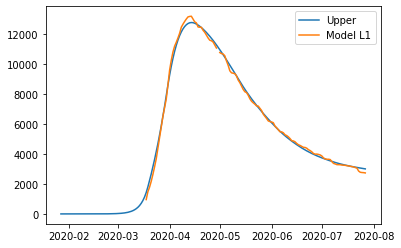

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485650282693, 'other': 0.41380671592198076, 'school': 0.22904664906139927, 'transport': 0.2559319263195352, 'work': 0.4138067907034928}
{'home': 1.0, 'leisure': 0.337513744562963, 'other': 0.4527934021517109, 'school': 0.2908635920441554, 'transport': 0.28525511207597, 'work': 0.5547925032297841}
{'home': 1.0, 'leisure': 0.3618030294780943, 'other': 0.49038770673037924, 'school': 0.35047278706324164, 'transport': 0.31353104119824643, 'work': 0.6907430117372793}
{'home': 1.0, 'leisure': 0.3815942986682012, 'other': 0.5210201030537386, 'school': 0.39904324226397864, 'transport': 0.33657068714973093, 'work': 0.8015175001507939}
{'home': 1.0, 'leisure': 0.3932891395532644, 'other': 0.5391210645175419, 'school': 0.42774396579168683, 'transport': 0.35018502339379, 'work': 0.8669751523951434}
{'home': 1.0, 'leisure': 0.3995863615682984, 'other': 0.5488677360749744, 'school

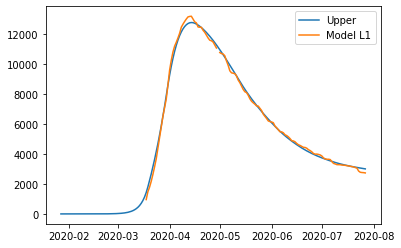

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485592550496, 'other': 0.41380671626599724, 'school': 0.22904664831488938, 'transport': 0.25593192569757606, 'work': 0.4138067899509426}
{'home': 1.0, 'leisure': 0.33751374401861567, 'other': 0.4527934027371787, 'school': 0.2908635912739478, 'transport': 0.2852551114427697, 'work': 0.5547925026795836}
{'home': 1.0, 'leisure': 0.36180302896554384, 'other': 0.4903877075486751, 'school': 0.3504727862701827, 'transport': 0.31353104055420655, 'work': 0.6907430113822017}
{'home': 1.0, 'leisure': 0.3815942981815593, 'other': 0.5210201040617463, 'school': 0.3990432414522999, 'transport': 0.3365706864968587, 'work': 0.8015174999547052}
{'home': 1.0, 'leisure': 0.39328913908193214, 'other': 0.5391210656376519, 'school': 0.42774396496900563, 'transport': 0.3501850227356986, 'work': 0.8669751522930029}
{'home': 1.0, 'leisure': 0.39958636110520984, 'other': 0.5488677372554472, '

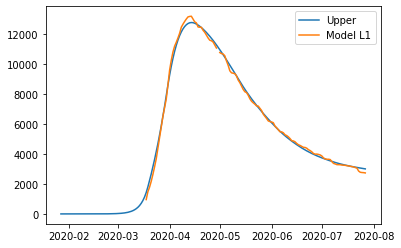

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123248553154192, 'other': 0.41380671662953716, 'school': 0.22904664752601395, 'transport': 0.25593192504031986, 'work': 0.4138067891556841}
{'home': 1.0, 'leisure': 0.3375137434433758, 'other': 0.4527934033558727, 'school': 0.2908635904600297, 'transport': 0.2852551107736344, 'work': 0.5547925020981583}
{'home': 1.0, 'leisure': 0.3618030284239054, 'other': 0.4903877084134105, 'school': 0.3504727854321163, 'transport': 0.3135310398736163, 'work': 0.6907430110069728}
{'home': 1.0, 'leisure': 0.38159429766729985, 'other': 0.5210201051269598, 'school': 0.3990432405945573, 'transport': 0.33657068580693494, 'work': 0.8015174997474883}
{'home': 1.0, 'leisure': 0.3932891385838511, 'other': 0.5391210668213298, 'school': 0.427743964099636, 'transport': 0.35018502204025953, 'work': 0.8669751521850655}
{'home': 1.0, 'leisure': 0.3995863606158403, 'other': 0.5488677385029137, 'schoo

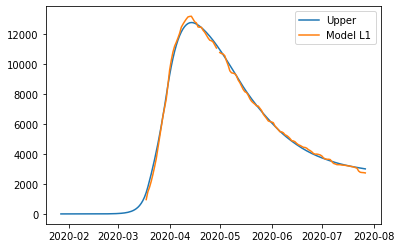

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

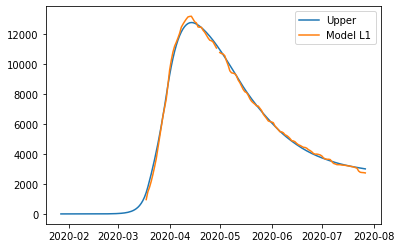

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

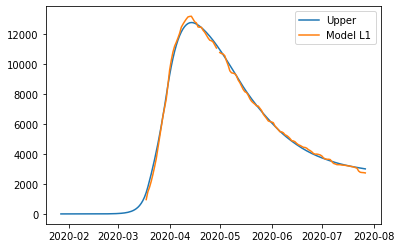

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

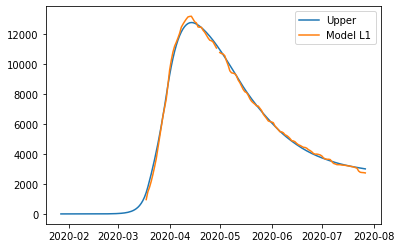

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312324819113193, 'other': 0.41380673801705214, 'school': 0.2290466007057587, 'transport': 0.2559318861993485, 'work': 0.41380674195658546}
{'home': 1.0, 'leisure': 0.3375137092977548, 'other': 0.452793439803006, 'school': 0.2908635421195545, 'transport': 0.28525507124303723, 'work': 0.5547924675128315}
{'home': 1.0, 'leisure': 0.36180299626143947, 'other': 0.49038775938231877, 'school': 0.3504727356257148, 'transport': 0.3135309996780229, 'work': 0.690742988584926}
{'home': 1.0, 'leisure': 0.3815942671207381, 'other': 0.5210201679284254, 'school': 0.3990431895936972, 'transport': 0.33657064506949264, 'work': 0.8015174872362623}
{'home': 1.0, 'leisure': 0.39328910899214176, 'other': 0.5391211366147611, 'school': 0.4277439123929596, 'transport': 0.3501849809826339, 'work': 0.8669751455302337}
{'home': 1.0, 'leisure': 0.3995863315382822, 'other': 0.5488678120612496, 'school

In [25]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution

bounds = Bounds(lb,ub)

result = minimize(error, v0, bounds = bounds)

In [25]:
best_v = [5.08875347e+01, 2.36561708e-01, 1.31254708e+00, 1.47852085e+00,
 5.00000000e-01, 1.01443896e+01, 5.58907697e-01, 4.13806742e-01,
 1.78662699e-01, 2.38392990e-01, 2.76529426e-01, 2.99376997e-01,
 2.07986907e-01, 1.69865502e-01, 4.38462413e-01, 4.76078982e-02]

In [26]:
v = best_v

days_ahead = v[0]
alpha_mixing = v[1]
beta_mixing = v[2]
gamma_mixing_before = v[3]
gamma_mixing_after = v[3]*(1-v[4])
gamma_change = v[5] + v[0]

upper_bound_home = 1.0
upper_bound_leisure = 1.0
upper_bound_other = 1.0
upper_bound_school = 1.0
upper_bound_work = 1.0
upper_bound_transport = 1.0

work_alpha = v[6]
work_beta = v[7]

leisure_alpha = v[8]
leisure_beta = v[9]

other_alpha = v[10]
other_beta = v[11]

transport_alpha = v[12]
transport_beta = v[13]

school_alpha = v[14]
school_beta = v[15]


# Number of days
days_before_date_1 = int(days_ahead)
days_between_dates_1_2 = (date_2-date_1).days
days_between_dates_2_3 = (date_3-date_2).days
days_between_dates_3_4 = (date_4-date_3).days
days_between_dates_4_5 = (date_5-date_4).days
days_between_dates_5_6 = (date_6-date_5).days
days_between_dates_6_7 = (date_7-date_6).days

days_after_date_7 = (final_date-date_7).days
total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_between_dates_5_6+ days_between_dates_6_7 + days_after_date_7
days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7


# Construct initialization
initialization = copy.deepcopy(original_initialization)
for i,group in enumerate(age_groups):
    if group == "age_group_40_49":
        initialization[group]["I"] = initialization[group]["I"] + 1
        initialization[group]["S"] = initialization[group]["S"] - 1
    initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


# Alphas
a_before_date_1 = {
    'home':upper_bound_home,
    'leisure':upper_bound_leisure,
    'other':upper_bound_other,
    'school':upper_bound_school,
    'transport':upper_bound_transport,
    'work':upper_bound_work
}

work_between_date_1_2 = work_alpha/days_denom*0 +work_beta
a_between_date_1_2 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_1_2*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_1_2*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_1_2*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_1_2*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_1_2*upper_bound_work
}

violation = (
    max(-(1-leisure_alpha)*work_between_date_1_2*upper_bound_work + leisure_beta,0)+
    max(-(1-other_alpha)*work_between_date_1_2*upper_bound_work + other_beta,0)+
    max(-(1-school_alpha)*work_between_date_1_2*upper_bound_work + school_beta,0)+
    max(-(1-transport_alpha)*work_between_date_1_2*upper_bound_work + transport_beta,0)+
    max(work_alpha+work_beta-1,0)
)

work_between_date_2_3 = work_alpha/days_denom*(days_between_dates_1_2) +work_beta
a_between_date_2_3 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_2_3*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_2_3*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_2_3*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_2_3*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_2_3*upper_bound_work
}

work_between_date_3_4 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3) +work_beta
a_between_date_3_4 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_3_4*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_3_4*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_3_4*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_3_4*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_3_4*upper_bound_work
}

work_between_date_4_5 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4) +work_beta
a_between_date_4_5 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_4_5*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_4_5*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_4_5*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_4_5*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_4_5*upper_bound_work
}

work_between_date_5_6 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5) +work_beta
a_between_date_5_6 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_5_6*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_5_6*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_5_6*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_5_6*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_5_6*upper_bound_work
}

work_between_date_6_7 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6) +work_beta
a_between_date_6_7 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_6_7*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_6_7*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_6_7*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_6_7*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_6_7*upper_bound_work
}

work_after_date_7 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7) +work_beta
a_after_date_7 = {
    'home':upper_bound_home,
    'leisure':(work_after_date_7*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_after_date_7*other_alpha + other_beta)*upper_bound_other,
    'school':(work_after_date_7*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_after_date_7*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_after_date_7*upper_bound_work
}

# Determine mixing method
mixing_method_before = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
}

# Determine mixing method
mixing_method_after = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
}
#dynModel.mixing_method = mixing_method_after




# Calculate alphas
alphas_vec = []
for t in range(days_before_date_1):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_before_date_1
    alphas_vec.append(alphas)
for t in range(days_between_dates_1_2):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_1_2
    alphas_vec.append(alphas)
for t in range(days_between_dates_2_3):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_2_3
    alphas_vec.append(alphas)
for t in range(days_between_dates_3_4):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_3_4
    alphas_vec.append(alphas)
for t in range(days_between_dates_4_5):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_4_5
    alphas_vec.append(alphas)
for t in range(days_between_dates_5_6):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_5_6
    alphas_vec.append(alphas)
for t in range(days_between_dates_6_7):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_6_7
    alphas_vec.append(alphas)
for t in range(days_after_date_7):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_after_date_7
    alphas_vec.append(alphas)

mixing_vec = []
for t in range(int(gamma_change)):
    mixing_vec.append(mixing_method_before)
for t in range(int(gamma_change),total_days):
    mixing_vec.append(mixing_method_after)




# Calculate tests
tests = np.zeros(len(age_groups))


# Run model
model_data_beds = {ag:[] for ag in age_groups+["total"]}
model_data_icus = {ag:[] for ag in age_groups+["total"]}
model_data_deaths = {ag:[] for ag in age_groups+["total"]}

state = state_to_matrix(initialization)
t_beds = 0
t_icus = 0
t_deaths = 0
for i,ag in enumerate(age_groups):
    state_H = state[i,cont.index("H")]
    state_ICU = state[i,cont.index("ICU")]
    state_D = state[i,cont.index("D")]
    model_data_beds[ag].append(state_H)
    model_data_icus[ag].append(state_ICU)
    model_data_deaths[ag].append(state_D)
    t_beds+= state_H
    t_icus+= state_ICU
    t_deaths+= state_D
model_data_beds["total"].append(t_beds)
model_data_icus["total"].append(t_icus)
model_data_deaths["total"].append(t_deaths)

recalc_days = [0,
             days_before_date_1,
             days_before_date_1+days_between_dates_1_2,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7,
            int(gamma_change)
            ]

dynModel.beta = np.zeros((len(age_groups),len(dynModel.groups[age_groups[0]].parameters["beta"])))
for i in range(len(age_groups)):
    for j in range(len(dynModel.groups[age_groups[0]].parameters["beta"])):
        if j < int(gamma_change):
            dynModel.beta[i,j] = original_beta * gamma_mixing_before
        else:
            dynModel.beta[i,j] = original_beta * gamma_mixing_after

for t in range(total_days):
    if t in recalc_days:
        update_contacts = True
    else:
        update_contacts = False

    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), t, update_contacts=update_contacts)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    print(t_beds)
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)


initial_date = date_1-timedelta(days=days_before_date_1)

# Calculate the days of the model
days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

# Indices where to put the real data
indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

# Real data
real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

for k,ind in enumerate(indices):
    for ag in age_groups+["total"]:
        real_data_beds[ag][ind] = beds_real[ag][k]
        real_data_icus[ag][ind] = icus_real[ag][k]
        real_data_deaths[ag][ind] = deaths_real[ag][k]


error_beds = 0
error_icus = 0
error_deaths = 0
for ag in age_groups:
    error_beds += np.nanmean(np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))
    error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
    error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
error_beds_total = np.nanmean(np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))
error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
error_beds_above = np.nanmean([max(d,0) for d in diff])
error_beds_below = -np.nanmean([min(d,0) for d in diff])

cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



#     error = error_beds_total
#     error = mult_icus*error_icus_total
#     error = mult_deaths*error_deaths_total
upper_model_data = model_data_beds["total"]
upper_days_model = days_model
upper_real_data = real_data_beds["total"]
error = error_beds+5*error_beds_total + violation*1000000






0.0033064996693500004
0.005534162394714904
0.009344824167996493
0.015365951685431534
0.023701690034282123
0.034388256420948386
0.04755011870564915
0.06346430873553231
0.08259688661871106
0.10563482257993798
0.13352367338404406
0.16751703076756727
0.20924236110408362
0.2607878287890121
0.32481540731037833
0.4047068259511043
0.5047506331074373
0.6303809206653452
0.788481146138386
0.9877701578421905
1.2392921716936
1.5570383234767387
1.958734856257403
2.466842416571077
3.109822854211608
3.9237450187947127
4.954320169259012
6.2594818316890795
7.912655610385931
10.006903286659037
12.66017468582842
16.021962971761862
20.281737655669783
25.679628967486803
32.51996269562131
41.18840283685006
52.17365870123696
66.09496370124663
83.73684739847548
106.09311555372261
134.42244282789642
170.3185901909166
215.79900730419138
273.41649383022786
346.39969640588083
438.8295277303986
555.8601144934983
703.9945867218113
891.4278352118381
1128.4701183070392
1428.0667770919217
1806.4297632545158
2226.047764

In [27]:
print("Before 03-17")
print(a_before_date_1)
print(date_1)
print(a_between_date_1_2)
print(date_2)
print(a_between_date_2_3)
print(date_3)
print(a_between_date_3_4)
print(date_4)
print(a_between_date_4_5)
print(date_5)
print(a_between_date_5_6)
print(date_6)
print(a_between_date_6_7)
print(date_7)
print(a_after_date_7)

Before 03-17
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
2020-03-17 00:00:00
{'home': 1.0, 'leisure': 0.3123248193901167, 'other': 0.41380673784019006, 'school': 0.22904660081298844, 'transport': 0.255931886364327, 'work': 0.413806742}
2020-04-14 00:00:00
{'home': 1.0, 'leisure': 0.337513709605081, 'other': 0.45279343955077545, 'school': 0.29086354215699745, 'transport': 0.28525507131505357, 'work': 0.5547924673693694}
2020-05-11 00:00:00
{'home': 1.0, 'leisure': 0.36180299659808224, 'other': 0.4903877590574113, 'school': 0.3504727355958633, 'transport': 0.313530999660397, 'work': 0.6907429882612612}
2020-06-02 00:00:00
{'home': 1.0, 'leisure': 0.38159426748126846, 'other': 0.5210201675442998, 'school': 0.3990431895090132, 'transport': 0.33657064497882505, 'work': 0.8015174867657657}
2020-06-15 00:00:00
{'home': 1.0, 'leisure': 0.3932891093667876, 'other': 0.539121136195643, 'school': 0.42774391227587455, 'transport': 0.3501849808488052, 'w

In [28]:
with open("../initialization/initialization.yaml") as file:
    initialization = yaml.load(file, Loader=yaml.FullLoader)
with open("../parameters/Ile-de-France.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)


In [29]:
# Modify parameters
universe_params['mixing'] = {
    "name":"mult",
    "param_alpha":float(alpha_mixing),
    "param_beta":float(beta_mixing),
    "param_gamma_before":float(gamma_mixing_before),
    "param_gamma_after":float(gamma_mixing_after),
}
universe_params['days_before_gamma'] = float(gamma_change)
universe_params['upper_bounds'] = {
    "transport":float(upper_bound_transport),
    "leisure":float(upper_bound_leisure),
    "other":float(upper_bound_other),
    "school":float(upper_bound_school),
    "home":float(upper_bound_home),
    "work":float(upper_bound_work)
}



In [30]:
# Modify beta
for ag in universe_params['seir-groups']:
    universe_params['seir-groups'][ag]['parameters']['beta'] = [(original_beta*gamma_mixing_before if t<int(gamma_change) else original_beta*gamma_mixing_after) for t in range(t_days_beta)]


In [31]:
with open('../parameters/fitted.yaml', 'w') as file:
    yaml.dump(universe_params, file)
    

In [32]:
# Add economic value parameters
contrib = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="contributions_normal", index_col = 0)
gains = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="activity_levels_as_%_of_full", index_col = 0)

empl_params = {}
empl_params["v"] = {}
for age_group in age_groups:
    empl_params["v"][age_group] = {}
    for activity in econ_activities:
        empl_params["v"][age_group][activity] = float(contrib[age_group][activity])/365.0


In [33]:
# Calculate l-april and l-may
l_april = a_between_date_1_2
l_may = {}
for a in a_between_date_1_2.keys():
    l_may[a] = a_between_date_1_2[a]/3.0 + a_between_date_3_4[a]*2.0/3.0

In [34]:
l_april

{'home': 1.0,
 'leisure': 0.3123248193901167,
 'other': 0.41380673784019006,
 'school': 0.22904660081298844,
 'transport': 0.255931886364327,
 'work': 0.413806742}

In [35]:
l_may

{'home': 1.0,
 'leisure': 0.34531027086209376,
 'other': 0.4648607519850042,
 'school': 0.309997357334905,
 'transport': 0.29433129522837365,
 'work': 0.5984309061741742}

In [36]:
from gurobipy import *

eq_activities = ['leisure','other','school','transport']
upper_bounds = {
    "transport":upper_bound_transport,
    "leisure":upper_bound_leisure,
    "other":upper_bound_other,
    "school":upper_bound_school,
    "home":upper_bound_home,
    "work":upper_bound_work,
}
m = Model()
nu = m.addVar(vtype=GRB.CONTINUOUS, name="nu", lb = 0)
gamma = m.addVar(vtype=GRB.CONTINUOUS, name="gamma", lb = 0)
epsilonp_1 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonp_1", lb = 0)
epsilonn_1 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonn_1", lb = 0)
epsilonp_2 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonp_2", lb = 0)
epsilonn_2 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonn_2", lb = 0)

m.addConstr(nu*upper_bound_work+gamma==1)
m.addConstr(
        nu*l_april["work"]  + gamma == 0.5851+epsilonp_1-epsilonn_1
)

m.setObjective(epsilonp_1+epsilonn_1+epsilonp_2+epsilonn_2)
m.update()
m.optimize()

empl_params['nu'] = 0.95*float(nu.x)
empl_params['gamma'] = float(gamma.x)
empl_params['eta'] = 0.05*float(nu.x)

print("nu",empl_params['nu'])
print("eta",empl_params['eta'])
print("gamma",empl_params['gamma'])

Using license file /Users/sergioacamelogomez/gurobi.lic
Academic license - for non-commercial use only
Gurobi Optimizer version 9.0.2 build v9.0.2rc0 (mac64)
Optimize a model with 2 rows, 6 columns and 6 nonzeros
Model fingerprint: 0x265d82bb
Coefficient statistics:
  Matrix range     [4e-01, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+00]
Presolve removed 1 rows and 3 columns
Presolve time: 0.00s
Presolved: 1 rows, 3 columns, 3 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00
nu 0.6723977026702685
eta 0.0353893527721194
gamma 0.29221294455761204


In [37]:
empl_params

{'v': {'age_group_0_9': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0},
  'age_group_10_19': {'transport': 0.42995936063784673,
   'leisure': 0.7068903576182438,
   'other': 4.574913439411911},
  'age_group_20_29': {'transport': 2.421870523023006,
   'leisure': 3.981764503475539,
   'other': 25.769523863503046},
  'age_group_30_39': {'transport': 5.3207402525299345,
   'leisure': 8.74775693759741,
   'other': 56.61448108213707},
  'age_group_40_49': {'transport': 6.5473065780407085,
   'leisure': 10.764338009809762,
   'other': 69.6655628368981},
  'age_group_50_59': {'transport': 6.717886370840974,
   'leisure': 11.04478593529775,
   'other': 71.48058969296267},
  'age_group_60_69': {'transport': 2.606993951947998,
   'leisure': 4.286123424007397,
   'other': 27.739299941136395},
  'age_group_70_79': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0},
  'age_group_80_plus': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}},
 'nu': 0.6723977026702685,
 'gamma': 0.29221294455761204,
 'e

In [38]:
# Calculate the schooling parameter
r = 0.03
schooling_param = {}
for age_group in age_groups:
    if age_group == "age_group_0_9":
        schooling_param[age_group] = (1+r)**(-15)*sum([empl_params["v"]["age_group_20_29"][act] for act in econ_activities])/upper_bound_school
    elif age_group == "age_group_10_19":
        schooling_param[age_group] = 0.907*(1+r)**(-5)*sum([empl_params["v"]["age_group_20_29"][act] for act in econ_activities])/upper_bound_school
    else:
        schooling_param[age_group] = 0

In [39]:
# Calculate the cost of death
econ_cost_death = {}
age_groups_n = [0,10,20,30,40,50,60,70,80]
for i,age_group in enumerate(age_groups):
    s = 0
    for tao in range(age_groups_n[i]+5,70):
        ag = "age_group_%d_%d"%(int(tao/10)*10,int(tao/10)*10+9)
        s+=(1+r)**(-(tao-age_groups_n[i]))*sum([empl_params["v"][ag][act] for act in econ_activities])*365
    econ_cost_death[age_group] = float(s)

In [40]:
econ_params = {
    "employment_params":empl_params,
    "schooling_params":schooling_param,
    "econ_cost_death":econ_cost_death,
    "upper_bounds":upper_bounds,
}
with open('../parameters/econ.yaml', 'w') as file:
    yaml.dump(econ_params, file)

In [41]:
print(econ_params)

{'employment_params': {'v': {'age_group_0_9': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}, 'age_group_10_19': {'transport': 0.42995936063784673, 'leisure': 0.7068903576182438, 'other': 4.574913439411911}, 'age_group_20_29': {'transport': 2.421870523023006, 'leisure': 3.981764503475539, 'other': 25.769523863503046}, 'age_group_30_39': {'transport': 5.3207402525299345, 'leisure': 8.74775693759741, 'other': 56.61448108213707}, 'age_group_40_49': {'transport': 6.5473065780407085, 'leisure': 10.764338009809762, 'other': 69.6655628368981}, 'age_group_50_59': {'transport': 6.717886370840974, 'leisure': 11.04478593529775, 'other': 71.48058969296267}, 'age_group_60_69': {'transport': 2.606993951947998, 'leisure': 4.286123424007397, 'other': 27.739299941136395}, 'age_group_70_79': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}, 'age_group_80_plus': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}}, 'nu': 0.6723977026702685, 'gamma': 0.29221294455761204, 'eta': 0.0353893527721194}, 'school

In [42]:
# Initialization
# Construct initialization
initialization = copy.deepcopy(original_initialization)
for i,group in enumerate(age_groups):
    if group == "age_group_40_49":
        initialization[group]["I"] = initialization[group]["I"] + 1
        initialization[group]["S"] = initialization[group]["S"] - 1
    initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]

# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(10):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/10days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)
    

In [43]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(20):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/20days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [44]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(30):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)

with open('../initialization/30days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [45]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(40):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)

with open('../initialization/40days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [46]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(50):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/50days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [47]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(60):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/60days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [48]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(70):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/70days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [49]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(80):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/80days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [50]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(90):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/90days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [51]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(100):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/100days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [52]:
alpha_groups = [a_before_date_1,a_between_date_1_2, a_between_date_2_3,a_between_date_3_4,a_between_date_4_5,
               a_between_date_5_6,a_between_date_6_7,a_after_date_7]

for d in alpha_groups:
    for act in d:
        if act not in ["date"]:
            d[act] = float(d[act])


In [53]:
# Construct alphas
from copy import deepcopy
alphas = []

c = 0
# Alphas
for i in range(days_before_date_1):
    a_before_date_1.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_before_date_1))
    c+=1
for i in range(days_between_dates_1_2):
    a_between_date_1_2.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_1_2))
    c+=1
for i in range(days_between_dates_2_3):
    a_between_date_2_3.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_2_3))
    c+=1
for i in range(days_between_dates_3_4):
    a_between_date_3_4.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_3_4))
    c+=1
for i in range(days_between_dates_4_5):
    a_between_date_4_5.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_4_5))
    c+=1
for i in range(days_between_dates_5_6):
    a_between_date_5_6.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_5_6))
    c+=1
for i in range(days_between_dates_6_7):
    a_between_date_6_7.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_6_7))
    c+=1
for i in range(days_after_date_7):
    a_after_date_7.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_after_date_7))
    c+=1

with open('../policies/fitted.yaml', 'w') as file:
    yaml.dump(alphas, file)

In [54]:
low_bounds = {
    "transport":0,
    "leisure":0,
    "other":0,
    "school":0,
    "home":0,
    "work":0,
}

In [55]:
with open('../lower_bounds/fitted.yaml', 'w') as file:
    yaml.dump(low_bounds, file)